In [12]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, ConfusionMatrixDisplay, roc_auc_score, RocCurveDisplay
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt

In [3]:
def col_val_to_int(col_val, true_val):
    if col_val in true_val:
        return 1
    else:
        return 0

def crash_day_to_int(day):
    if day == 'Monday':
        return 1
    elif day == 'Tuesday':
        return 2
    elif day == 'Wednesday':
        return 3
    elif day == 'Thursday':
        return 4
    elif day == 'Friday':
        return 5
    elif day == 'Saturday':
        return 6
    elif day == 'Sunday':
        return 7
    else:
        return -1
    
def crash_month_to_int(month):
    if month == 'January':
        return 1
    elif month == 'February':
        return 2
    elif month == 'March':
        return 3
    elif month == 'April':
        return 4
    elif month == 'May':
        return 5
    elif month == 'June':
        return 6
    elif month == 'July':
        return 7
    elif month == 'August':
        return 8
    elif month == 'September':
        return 9
    elif month == 'October':
        return 10
    elif month == 'November':
        return 11
    elif month == 'December':
        return 12
    else:
        return -1
    
def two_digit_to_int(two_digit):
    if two_digit == 'Unknown':
        return 0
    else:
        return int(two_digit[0 : 2])

In [14]:
columns = [
    'AmbulanceR',
    'BikeAge',
    'BikeDir',
    'BikeInjury',
    'BikePos',
    'BikeRace',
    'BikeSex',
    'CrashDay',
    'CrashHour',
    'CrashLoc',
    'CrashMonth',
    'DrvrVehTyp',
    'LightCond',
    'Locality',
    'NumLanes',
    'RdCharacte',
    'RdClass',
    'RdConditio',
    'RdConfig',
    'RdFeature',
    'RdSurface',
    'Region',
    'SpeedLimit',
    'TraffCntrl',
    'Weather'
    ]
true_val = [
    ['AmbulanceR', ['No']],
    ['BikeDir', ['With Traffic']],
    ['BikePos', ['Travel Lane']],
    ['BikeRace', ['White']],
    ['BikeSex', ['Male']],
    ['CrashLoc', ['Non-Intersection']],
    ['CrashLoc', ['Intersection']],
    ['DrvrVehTyp', ['Passenger Car']],
    ['LightCond', ['Daylight']],
    ['Locality', ['Urban (>70% Developed)']],
    ['RdCharacte', ['Straight - Level']],
    ['RdClass', ['Local Street']],
    ['RdConditio', ['Dry']],
    ['RdConfig', ['Two-Way, Not Divided']],
    ['RdFeature', ['No Special Feature']],
    ['RdSurface', ['Smooth Asphalt']],
    ['Region', ['Piedmont']],
    ['TraffCntrl', ['No Control Present']],
    ['Weather', ['Clear']]
    ]

In [15]:
data = pd.read_csv('../data/NCDOT_BikePedCrash.csv')
data = data[columns]
data = data[data.BikeInjury != 'Unknown Injury']

In [16]:
for pair in true_val:
    data[pair[0] + '_' + pair[1][0]] = data[pair[0]].apply(col_val_to_int, true_val=pair[1])
data = data.drop(columns=list(set([pair[0] for pair in true_val])))
data['BikeAge'] = data['BikeAge'].apply(two_digit_to_int)
data['CrashDay'] = data['CrashDay'].apply(crash_day_to_int)
data['CrashMonth'] = data['CrashMonth'].apply(crash_month_to_int)
data['NumLanes'] = data['NumLanes'].apply(two_digit_to_int)
data['SpeedLimit'] = data['SpeedLimit'].apply(two_digit_to_int)

In [7]:
kfold = StratifiedKFold(n_splits=5,
                           shuffle=True,
                           random_state=21)

In [ ]:
X = data.drop(columns=['AmbulanceR_No', 'BikeInjury'])
y = data['AmbulanceR_No']

log_reg = LogisticRegression(max_iter=10000)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

for threshold in range(50, 70):
    log_reg.fit(X_train, y_train)
    y_prob = log_reg.predict_proba(X_test)
    y_pred = 1 * (y_prob[:, 1] >= threshold / 100)

    print(threshold)
    print('Accuracy = ' + str(accuracy_score(y_test, y_pred)))
    print('Classification Report:')
    print(classification_report(y_test, y_pred))
    print('Confusion Matrix:')
    ConfusionMatrixDisplay.from_predictions(y_test, y_pred)
    plt.show()

In [9]:
class LogisticRegressionThreshold(LogisticRegression):
    def __init__(self, threshold=0.5, penalty='l2', dual=False, tol=1e-4, C=1.0, fit_intercept=True, intercept_scaling=1, class_weight=None, random_state=None, solver='lbfgs', max_iter=100, multi_class='auto', verbose=0, warm_start=False, n_jobs=None, l1_ratio=None):
        super().__init__(penalty=penalty, dual=dual, tol=tol, C=C, fit_intercept=fit_intercept, intercept_scaling=intercept_scaling, class_weight=class_weight, random_state=random_state, solver=solver, max_iter=max_iter, multi_class=multi_class, verbose=verbose, warm_start=warm_start, n_jobs=n_jobs, l1_ratio=l1_ratio)
        self.threshold = threshold

    def predict(self, X):
        y_prob = self.predict_proba(X)
        return (y_prob[:, 1] >= self.threshold).astype(int)

    def predict_proba(self, X):
        return super().predict_proba(X)

In [10]:
class_weights = list(range(40, 91))
class_weights = [{0: weight, 1: 100 - weight} for weight in class_weights]

In [ ]:
X = data.drop(columns=['AmbulanceR_No', 'BikeInjury'])
y = data['AmbulanceR_No']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

for weights in class_weights:
    log_reg = LogisticRegression(max_iter=10000, class_weight=weights)
    log_reg.fit(X_train, y_train)
    y_prob = log_reg.predict_proba(X_test)
    y_pred = 1 * (y_prob[:, 1] >= 0.5)

    print(weights)
    print('Accuracy = ' + str(accuracy_score(y_test, y_pred)))
    print('Classification Report:')
    print(classification_report(y_test, y_pred))
    print('Confusion Matrix:')
    ConfusionMatrixDisplay.from_predictions(y_test, y_pred)
    plt.show()

{0: 40, 1: 60} 30
Accuracy = 0.4002744739249771
ROC AUC = 0.580538624475857
Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.17      0.27      1485
           1       0.34      0.90      0.49       701

    accuracy                           0.40      2186
   macro avg       0.55      0.53      0.38      2186
weighted avg       0.63      0.40      0.34      2186

Confusion Matrix:


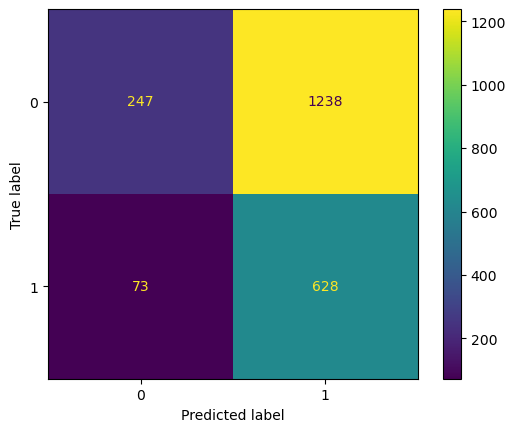

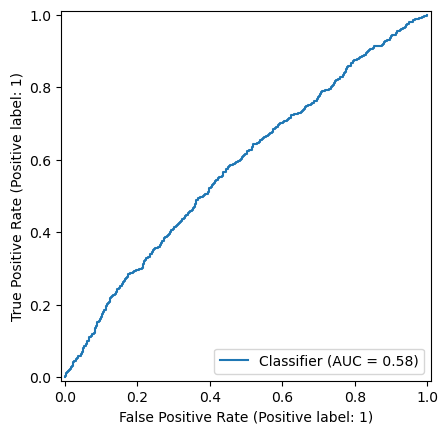

{0: 40, 1: 60} 31
Accuracy = 0.4185727355901189
ROC AUC = 0.580538624475857
Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.21      0.32      1485
           1       0.34      0.87      0.49       701

    accuracy                           0.42      2186
   macro avg       0.56      0.54      0.41      2186
weighted avg       0.63      0.42      0.38      2186

Confusion Matrix:


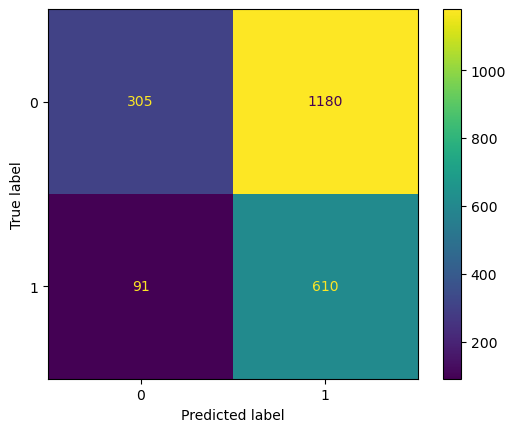

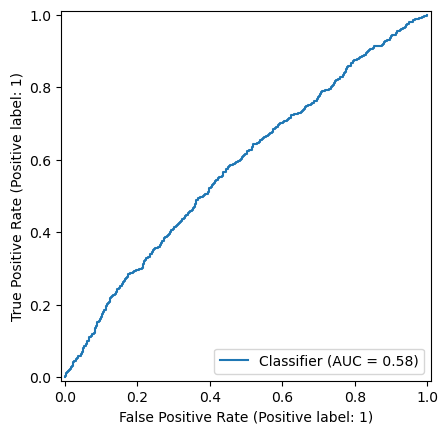

{0: 40, 1: 60} 32
Accuracy = 0.4281793229643184
ROC AUC = 0.580538624475857
Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.24      0.36      1485
           1       0.34      0.83      0.48       701

    accuracy                           0.43      2186
   macro avg       0.54      0.53      0.42      2186
weighted avg       0.62      0.43      0.40      2186

Confusion Matrix:


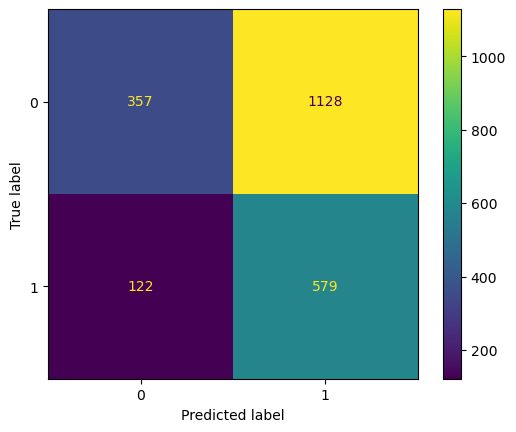

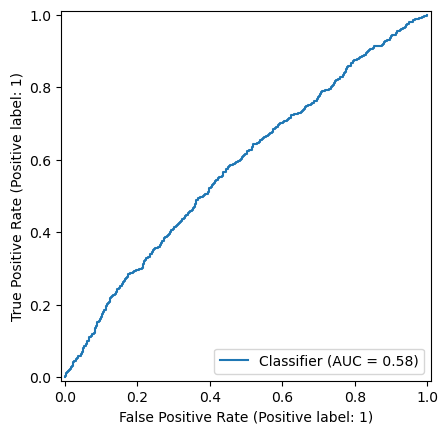

{0: 40, 1: 60} 33
Accuracy = 0.4432753888380604
ROC AUC = 0.580538624475857
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.28      0.40      1485
           1       0.34      0.79      0.48       701

    accuracy                           0.44      2186
   macro avg       0.54      0.54      0.44      2186
weighted avg       0.61      0.44      0.43      2186

Confusion Matrix:


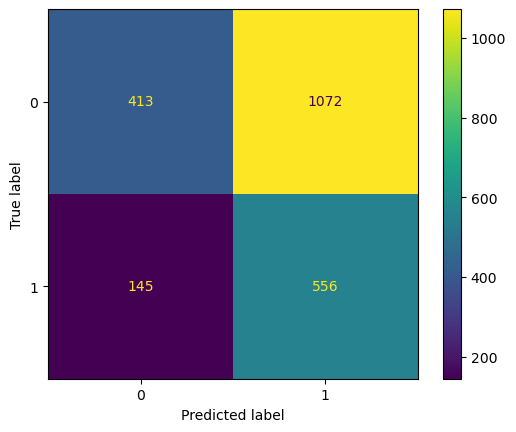

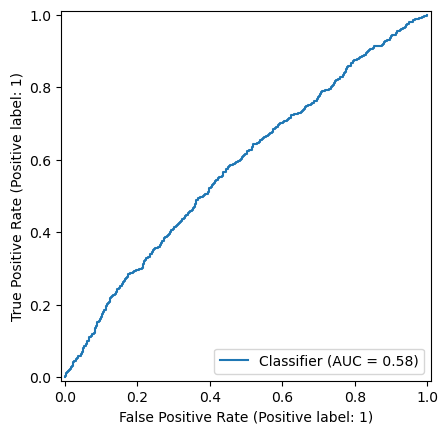

{0: 40, 1: 60} 34
Accuracy = 0.4533394327538884
ROC AUC = 0.580538624475857
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.31      0.43      1485
           1       0.34      0.76      0.47       701

    accuracy                           0.45      2186
   macro avg       0.54      0.53      0.45      2186
weighted avg       0.61      0.45      0.45      2186

Confusion Matrix:


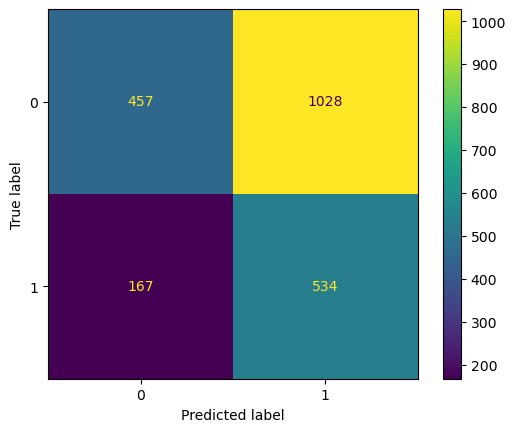

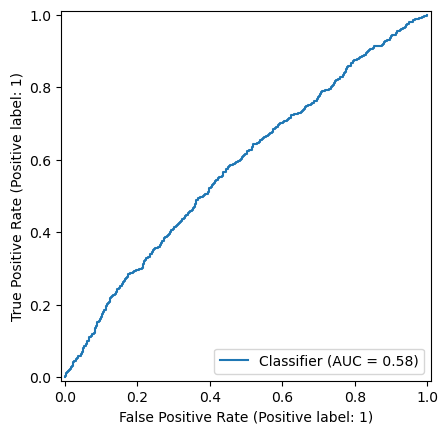

{0: 40, 1: 60} 35
Accuracy = 0.4725526075022873
ROC AUC = 0.580538624475857
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.35      0.48      1485
           1       0.35      0.73      0.47       701

    accuracy                           0.47      2186
   macro avg       0.54      0.54      0.47      2186
weighted avg       0.61      0.47      0.47      2186

Confusion Matrix:


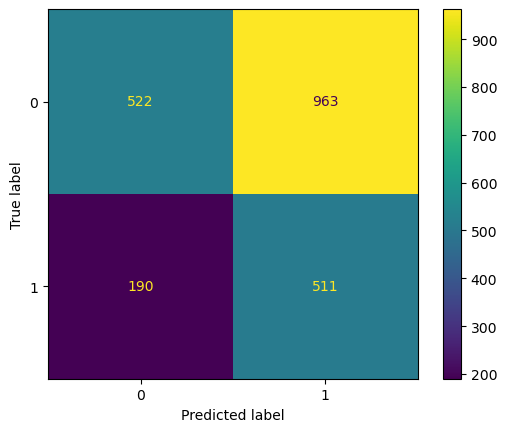

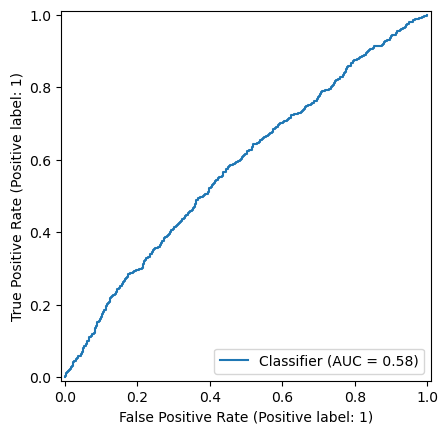

{0: 40, 1: 60} 36
Accuracy = 0.49359560841720035
ROC AUC = 0.580538624475857
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.39      0.51      1485
           1       0.35      0.71      0.47       701

    accuracy                           0.49      2186
   macro avg       0.55      0.55      0.49      2186
weighted avg       0.62      0.49      0.50      2186

Confusion Matrix:


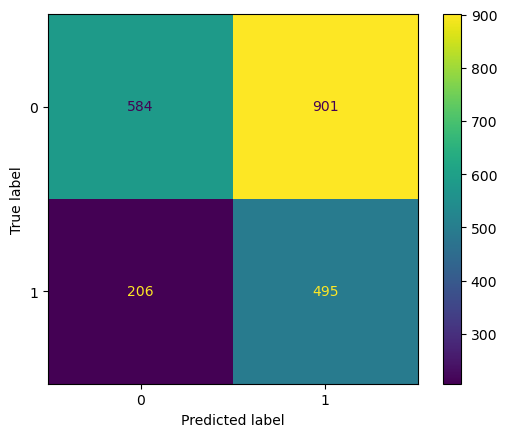

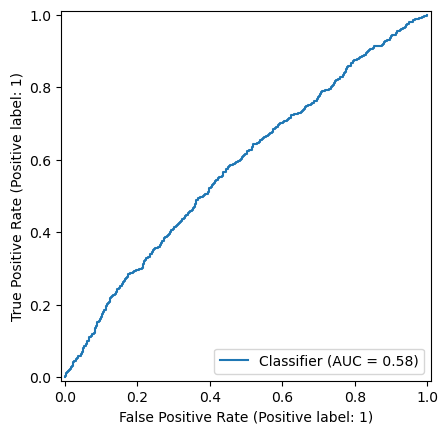

{0: 40, 1: 60} 37
Accuracy = 0.5114364135407137
ROC AUC = 0.580538624475857
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.44      0.55      1485
           1       0.36      0.67      0.47       701

    accuracy                           0.51      2186
   macro avg       0.55      0.55      0.51      2186
weighted avg       0.62      0.51      0.52      2186

Confusion Matrix:


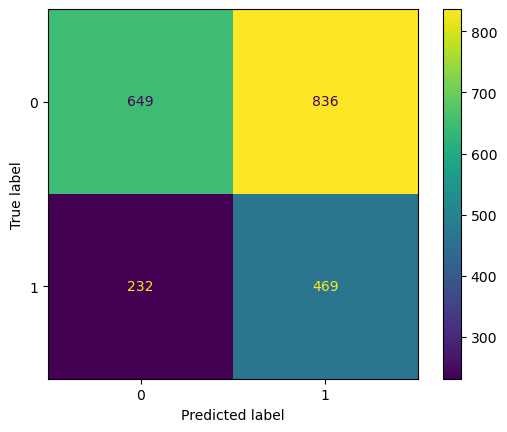

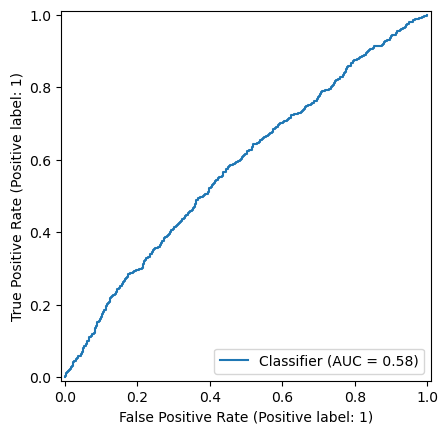

{0: 40, 1: 60} 38
Accuracy = 0.5320219579139982
ROC AUC = 0.580538624475857
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.48      0.58      1485
           1       0.37      0.63      0.46       701

    accuracy                           0.53      2186
   macro avg       0.55      0.56      0.52      2186
weighted avg       0.62      0.53      0.55      2186

Confusion Matrix:


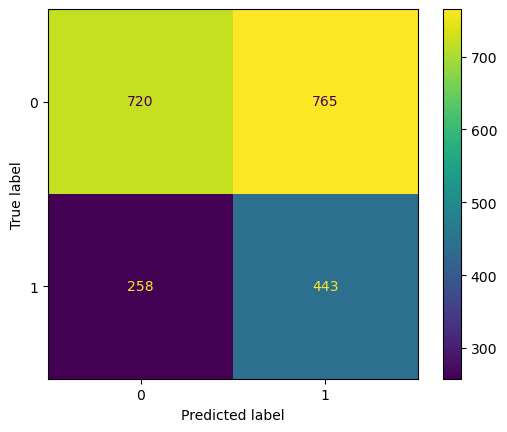

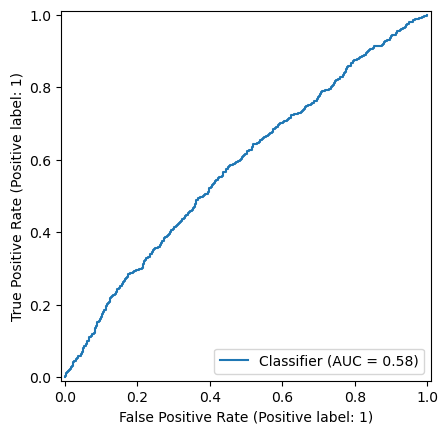

{0: 40, 1: 60} 39
Accuracy = 0.546203110704483
ROC AUC = 0.580538624475857
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.52      0.61      1485
           1       0.37      0.60      0.46       701

    accuracy                           0.55      2186
   macro avg       0.55      0.56      0.53      2186
weighted avg       0.62      0.55      0.56      2186

Confusion Matrix:


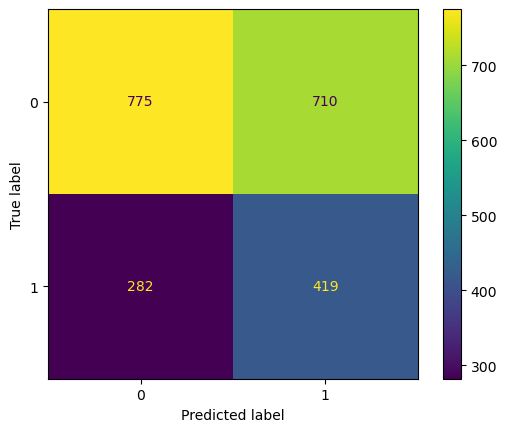

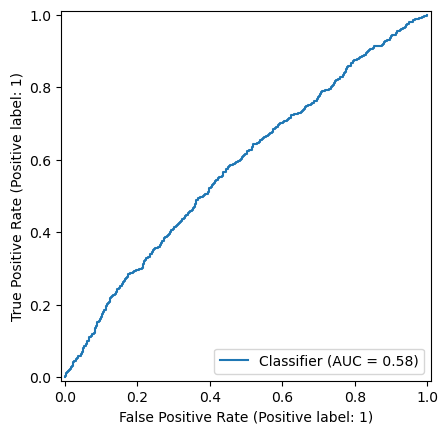

{0: 40, 1: 60} 40
Accuracy = 0.5663311985361391
ROC AUC = 0.580538624475857
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.57      0.64      1485
           1       0.38      0.55      0.45       701

    accuracy                           0.57      2186
   macro avg       0.56      0.56      0.55      2186
weighted avg       0.62      0.57      0.58      2186

Confusion Matrix:


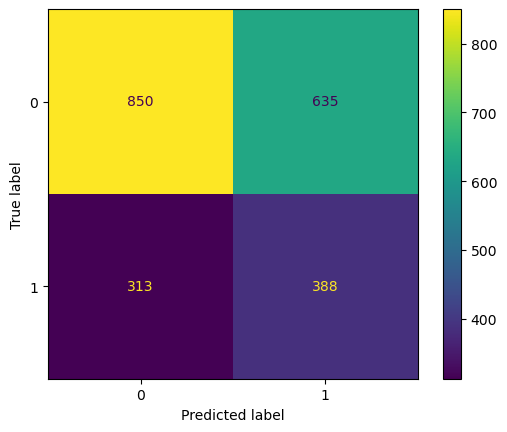

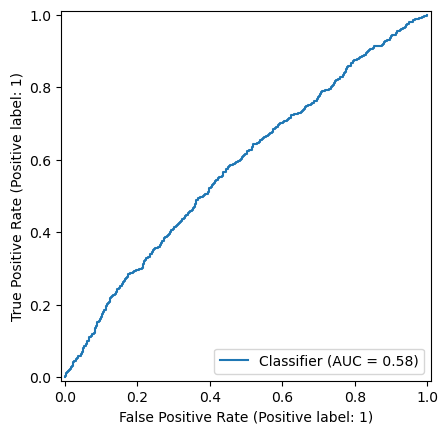

{0: 40, 1: 60} 41
Accuracy = 0.5759377859103385
ROC AUC = 0.580538624475857
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.61      0.66      1485
           1       0.38      0.50      0.43       701

    accuracy                           0.58      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.61      0.58      0.59      2186

Confusion Matrix:


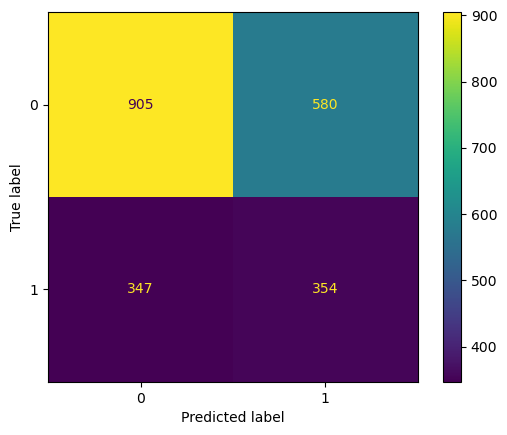

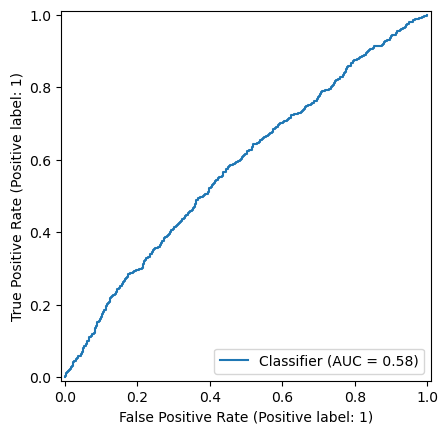

{0: 40, 1: 60} 42
Accuracy = 0.5892040256175664
ROC AUC = 0.580538624475857
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.65      0.68      1485
           1       0.38      0.46      0.42       701

    accuracy                           0.59      2186
   macro avg       0.55      0.55      0.55      2186
weighted avg       0.61      0.59      0.60      2186

Confusion Matrix:


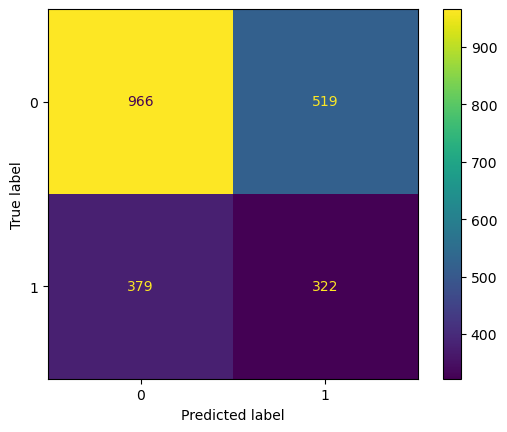

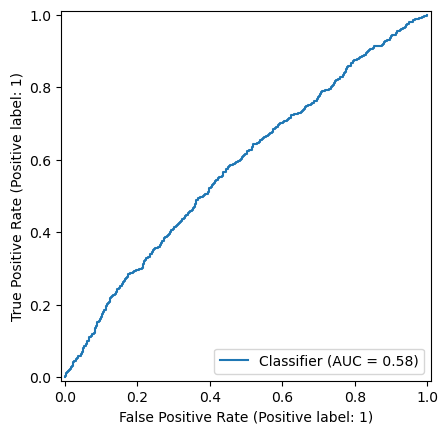

{0: 40, 1: 60} 43
Accuracy = 0.6038426349496798
ROC AUC = 0.580538624475857
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.69      0.70      1485
           1       0.39      0.42      0.40       701

    accuracy                           0.60      2186
   macro avg       0.55      0.55      0.55      2186
weighted avg       0.61      0.60      0.61      2186

Confusion Matrix:


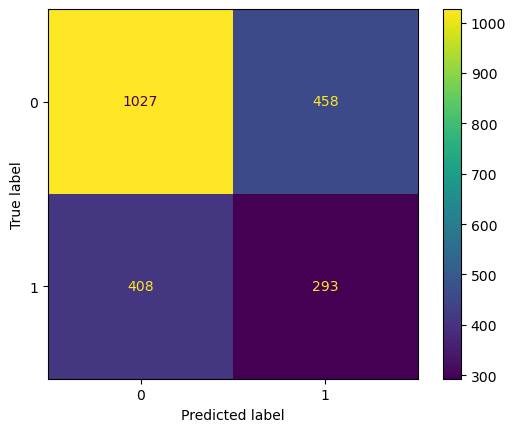

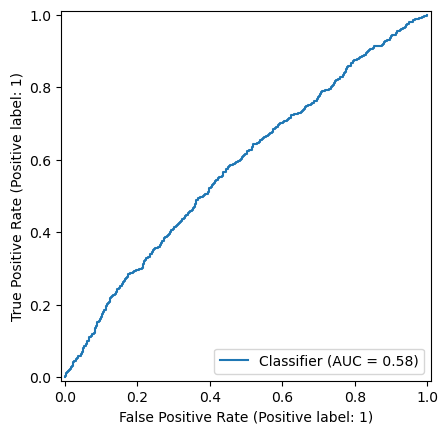

{0: 40, 1: 60} 44
Accuracy = 0.6148215919487648
ROC AUC = 0.580538624475857
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.72      0.72      1485
           1       0.40      0.39      0.39       701

    accuracy                           0.61      2186
   macro avg       0.56      0.55      0.55      2186
weighted avg       0.61      0.61      0.61      2186

Confusion Matrix:


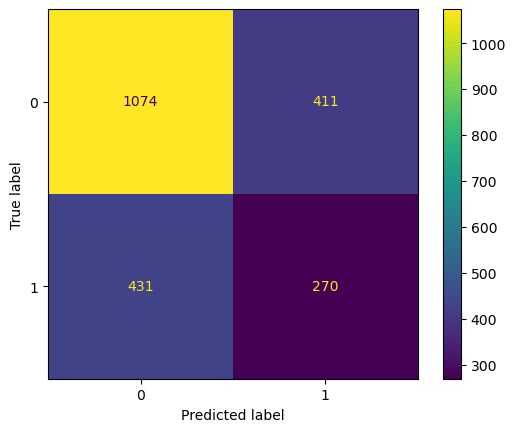

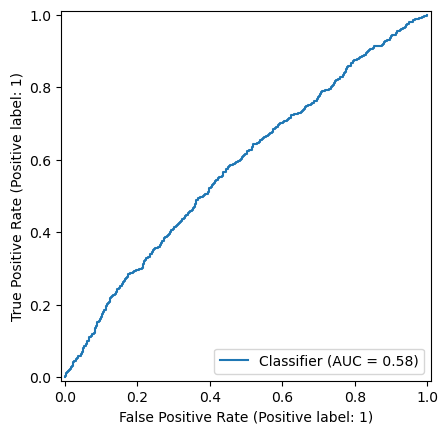

{0: 40, 1: 60} 45
Accuracy = 0.6262580054894785
ROC AUC = 0.580538624475857
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.76      0.73      1485
           1       0.40      0.35      0.37       701

    accuracy                           0.63      2186
   macro avg       0.56      0.55      0.55      2186
weighted avg       0.61      0.63      0.62      2186

Confusion Matrix:


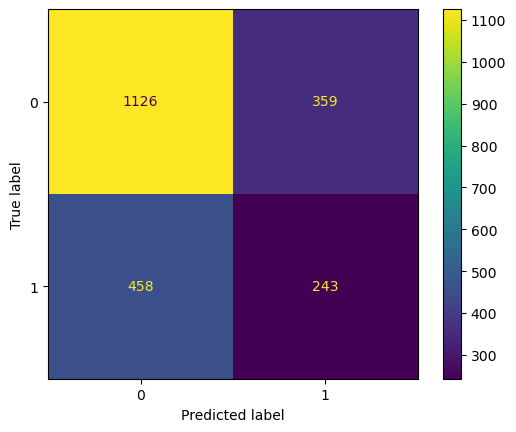

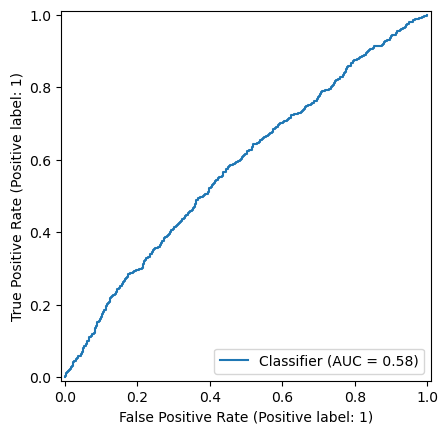

{0: 40, 1: 60} 46
Accuracy = 0.6303751143641354
ROC AUC = 0.580538624475857
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.78      0.74      1485
           1       0.40      0.30      0.35       701

    accuracy                           0.63      2186
   macro avg       0.55      0.54      0.54      2186
weighted avg       0.61      0.63      0.62      2186

Confusion Matrix:


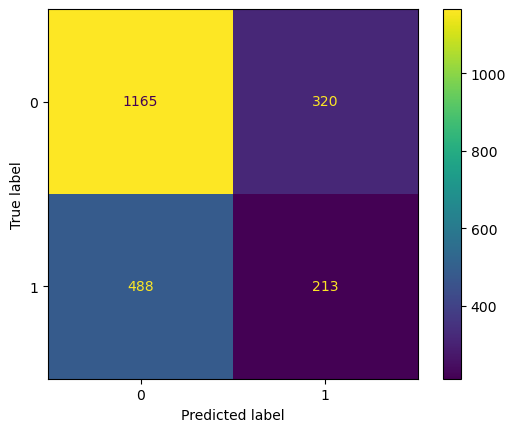

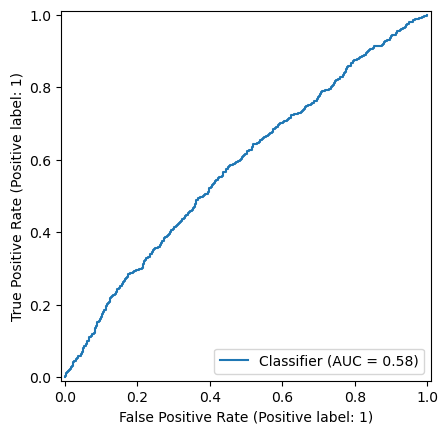

{0: 40, 1: 60} 47
Accuracy = 0.6491308325709058
ROC AUC = 0.580538624475857
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.82      0.76      1485
           1       0.43      0.29      0.34       701

    accuracy                           0.65      2186
   macro avg       0.57      0.55      0.55      2186
weighted avg       0.62      0.65      0.63      2186

Confusion Matrix:


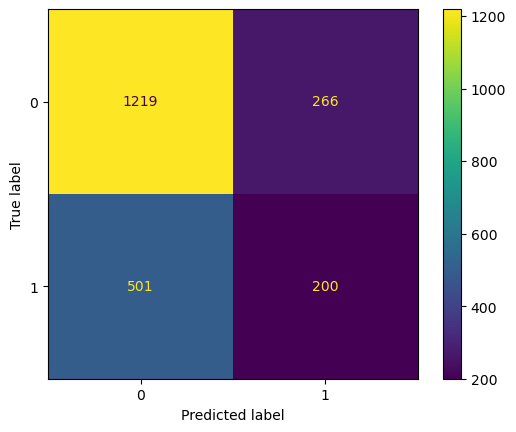

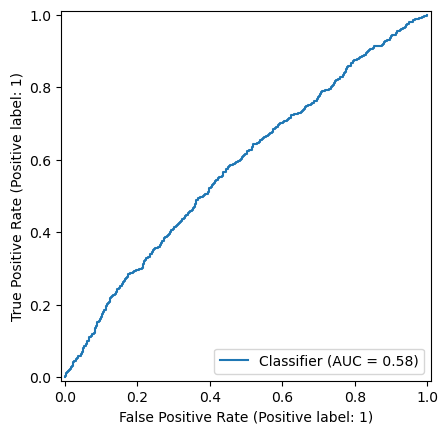

{0: 40, 1: 60} 48
Accuracy = 0.6546203110704483
ROC AUC = 0.580538624475857
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.84      0.77      1485
           1       0.43      0.25      0.32       701

    accuracy                           0.65      2186
   macro avg       0.57      0.55      0.54      2186
weighted avg       0.62      0.65      0.62      2186

Confusion Matrix:


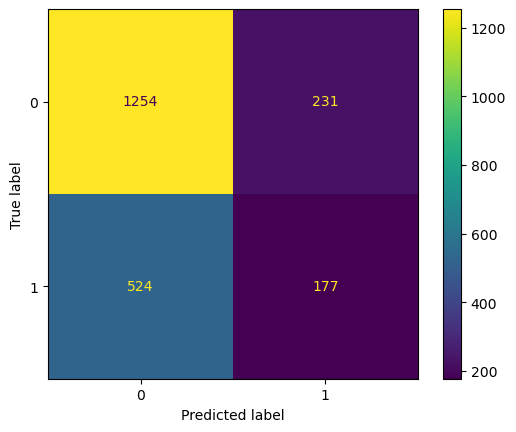

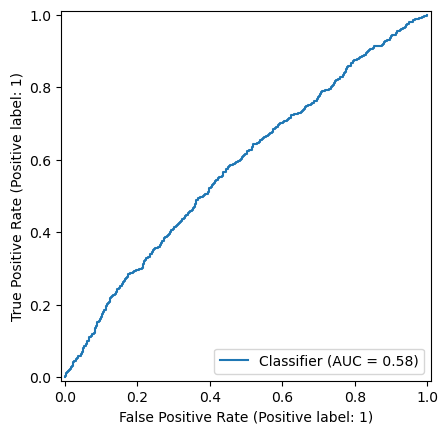

{0: 40, 1: 60} 49
Accuracy = 0.6619396157365051
ROC AUC = 0.580538624475857
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.87      0.78      1485
           1       0.45      0.23      0.30       701

    accuracy                           0.66      2186
   macro avg       0.58      0.55      0.54      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


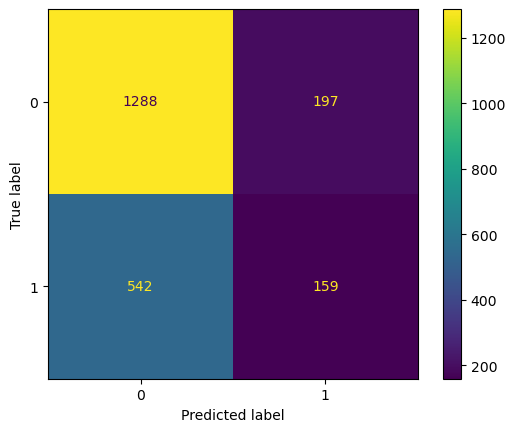

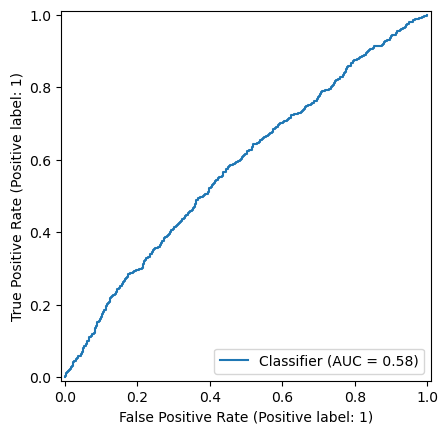

{0: 41, 1: 59} 30
Accuracy = 0.41674290942360476
ROC AUC = 0.5805021205877127
Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.20      0.32      1485
           1       0.34      0.87      0.49       701

    accuracy                           0.42      2186
   macro avg       0.55      0.54      0.40      2186
weighted avg       0.63      0.42      0.37      2186

Confusion Matrix:


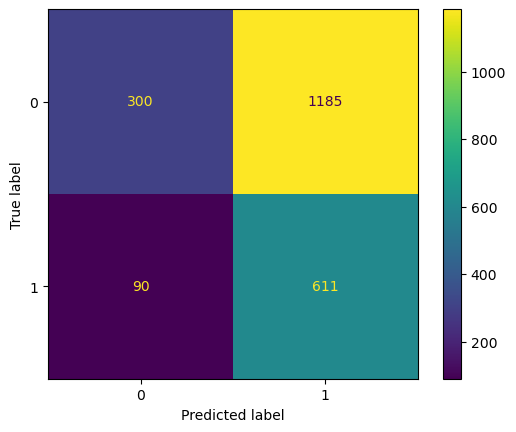

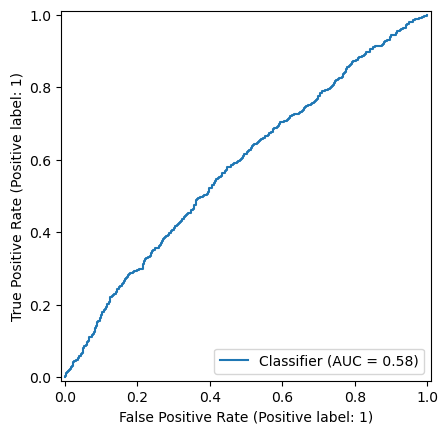

{0: 41, 1: 59} 31
Accuracy = 0.4254345837145471
ROC AUC = 0.5805021205877127
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.24      0.36      1485
           1       0.34      0.83      0.48       701

    accuracy                           0.43      2186
   macro avg       0.54      0.53      0.42      2186
weighted avg       0.61      0.43      0.40      2186

Confusion Matrix:


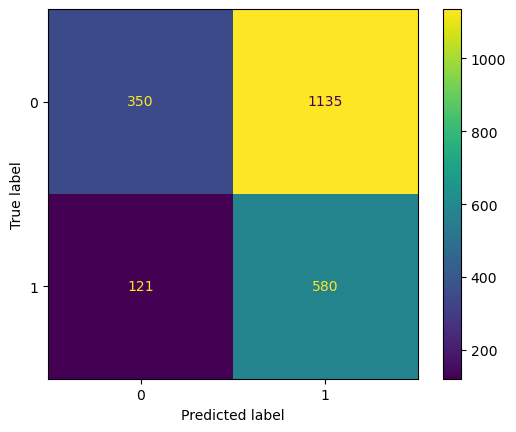

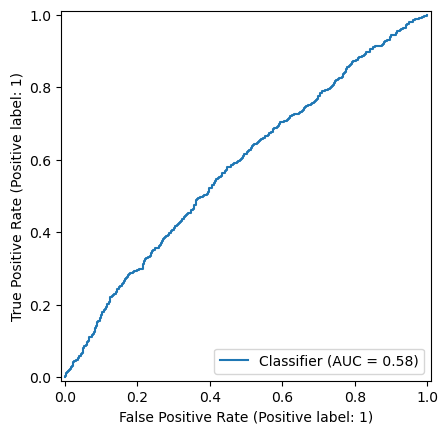

{0: 41, 1: 59} 32
Accuracy = 0.44053064958828914
ROC AUC = 0.5805021205877127
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.27      0.40      1485
           1       0.34      0.79      0.48       701

    accuracy                           0.44      2186
   macro avg       0.54      0.53      0.44      2186
weighted avg       0.61      0.44      0.42      2186

Confusion Matrix:


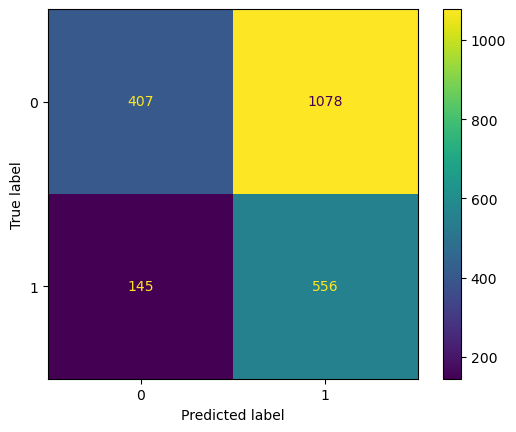

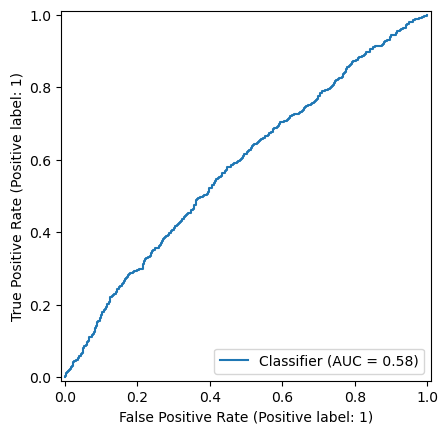

{0: 41, 1: 59} 33
Accuracy = 0.4537968892955169
ROC AUC = 0.5805021205877127
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.31      0.43      1485
           1       0.34      0.77      0.47       701

    accuracy                           0.45      2186
   macro avg       0.54      0.54      0.45      2186
weighted avg       0.61      0.45      0.45      2186

Confusion Matrix:


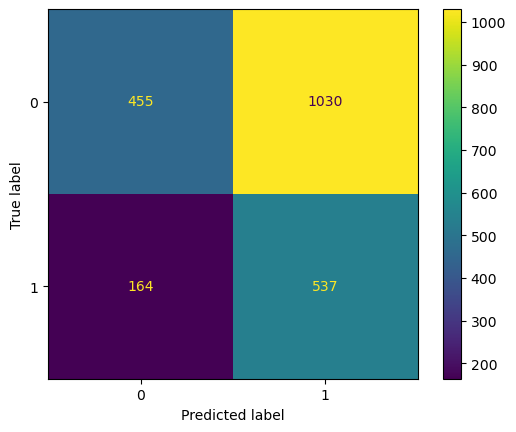

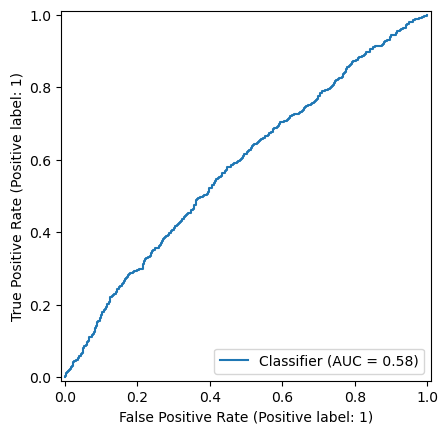

{0: 41, 1: 59} 34
Accuracy = 0.4716376944190302
ROC AUC = 0.5805021205877127
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.35      0.47      1485
           1       0.35      0.73      0.47       701

    accuracy                           0.47      2186
   macro avg       0.54      0.54      0.47      2186
weighted avg       0.61      0.47      0.47      2186

Confusion Matrix:


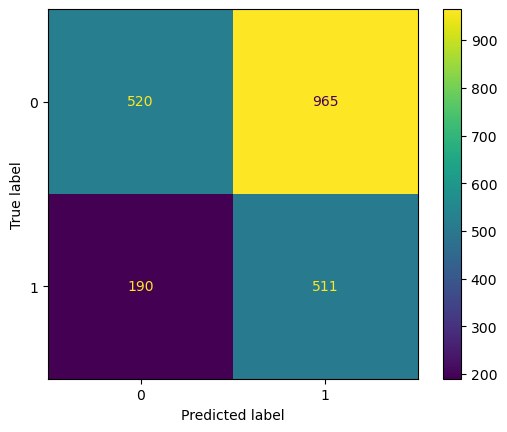

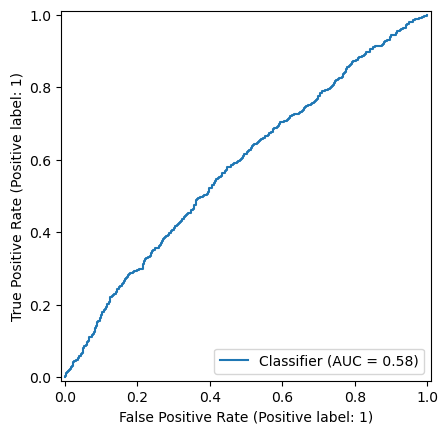

{0: 41, 1: 59} 35
Accuracy = 0.4922232387923147
ROC AUC = 0.5805021205877127
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.39      0.51      1485
           1       0.35      0.71      0.47       701

    accuracy                           0.49      2186
   macro avg       0.55      0.55      0.49      2186
weighted avg       0.61      0.49      0.50      2186

Confusion Matrix:


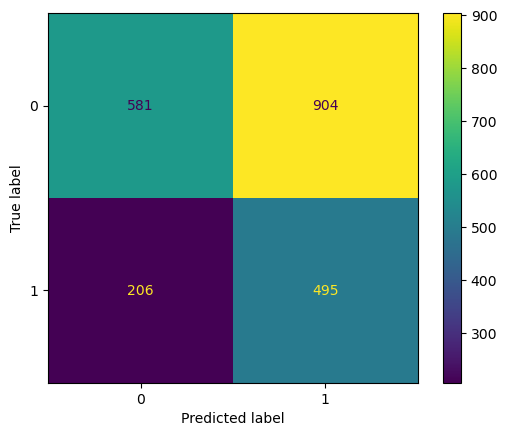

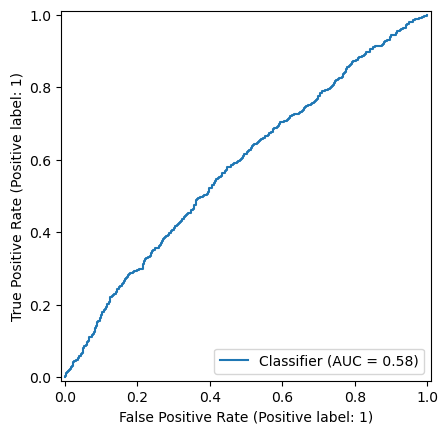

{0: 41, 1: 59} 36
Accuracy = 0.5118938700823422
ROC AUC = 0.5805021205877127
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.44      0.55      1485
           1       0.36      0.67      0.47       701

    accuracy                           0.51      2186
   macro avg       0.55      0.55      0.51      2186
weighted avg       0.62      0.51      0.52      2186

Confusion Matrix:


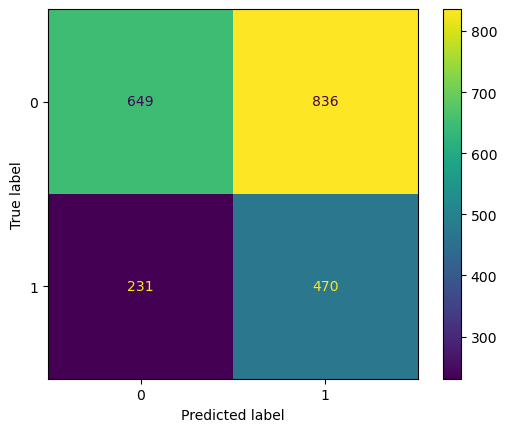

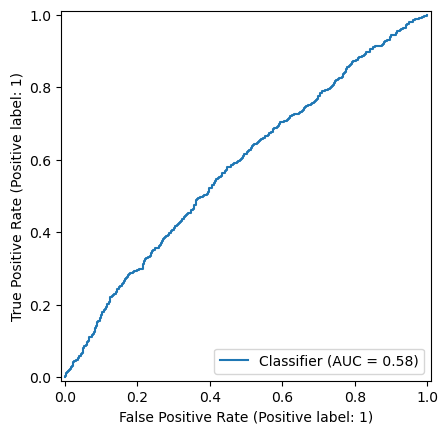

{0: 41, 1: 59} 37
Accuracy = 0.5329368709972553
ROC AUC = 0.5805021205877127
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.48      0.59      1485
           1       0.37      0.63      0.47       701

    accuracy                           0.53      2186
   macro avg       0.55      0.56      0.53      2186
weighted avg       0.62      0.53      0.55      2186

Confusion Matrix:


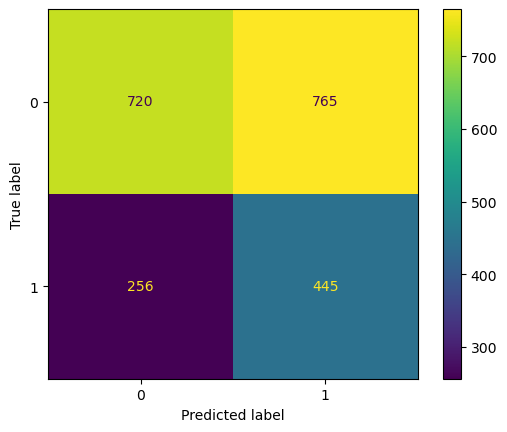

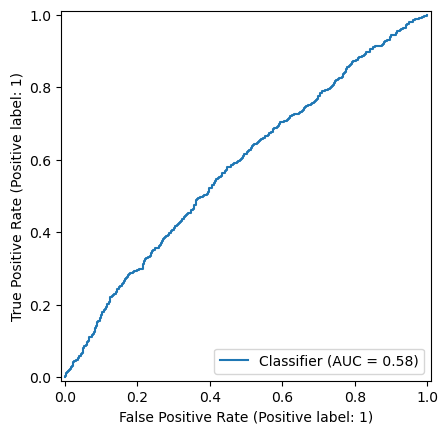

{0: 41, 1: 59} 38
Accuracy = 0.5457456541628545
ROC AUC = 0.5805021205877127
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.52      0.61      1485
           1       0.37      0.60      0.46       701

    accuracy                           0.55      2186
   macro avg       0.55      0.56      0.53      2186
weighted avg       0.62      0.55      0.56      2186

Confusion Matrix:


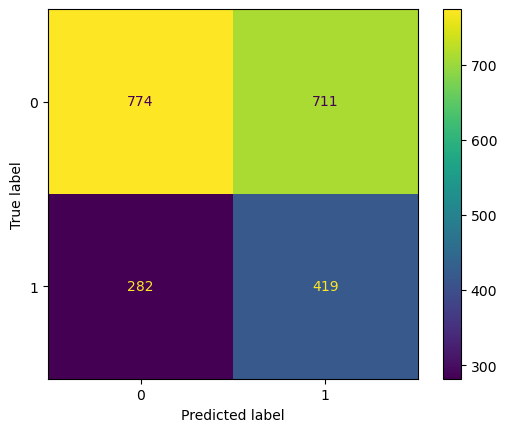

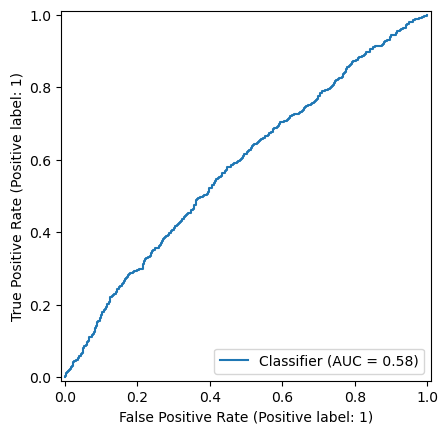

{0: 41, 1: 59} 39
Accuracy = 0.5663311985361391
ROC AUC = 0.5805021205877127
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.57      0.64      1485
           1       0.38      0.55      0.45       701

    accuracy                           0.57      2186
   macro avg       0.56      0.56      0.55      2186
weighted avg       0.62      0.57      0.58      2186

Confusion Matrix:


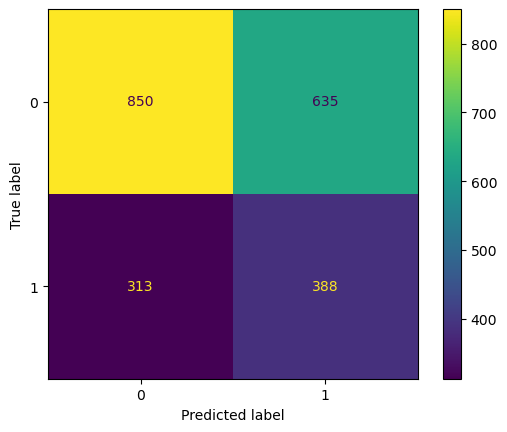

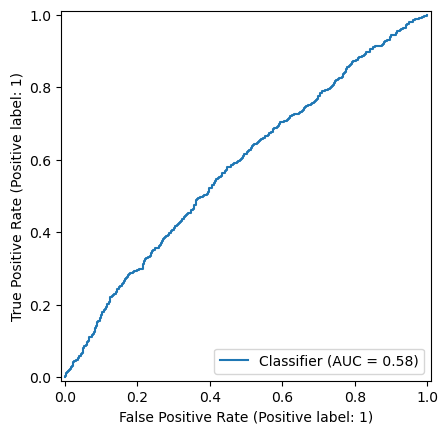

{0: 41, 1: 59} 40
Accuracy = 0.5759377859103385
ROC AUC = 0.5805021205877127
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.61      0.66      1485
           1       0.38      0.50      0.43       701

    accuracy                           0.58      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.61      0.58      0.59      2186

Confusion Matrix:


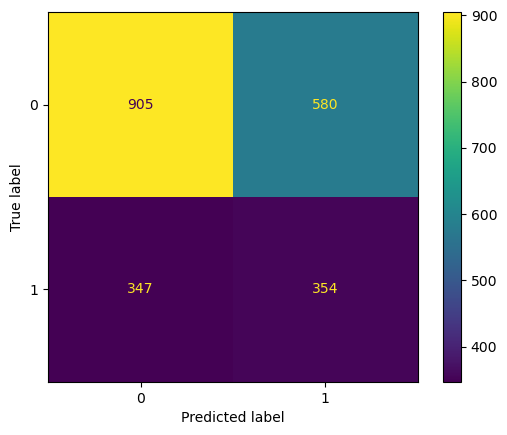

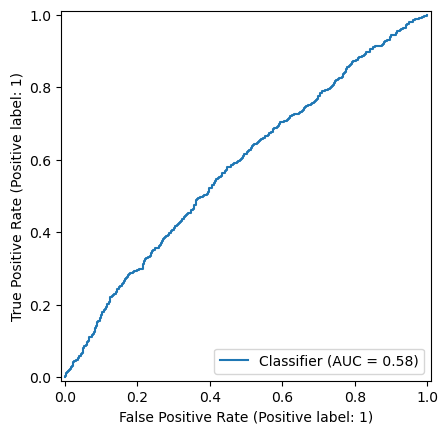

{0: 41, 1: 59} 41
Accuracy = 0.590576395242452
ROC AUC = 0.5805021205877127
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.65      0.68      1485
           1       0.38      0.46      0.42       701

    accuracy                           0.59      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.61      0.59      0.60      2186

Confusion Matrix:


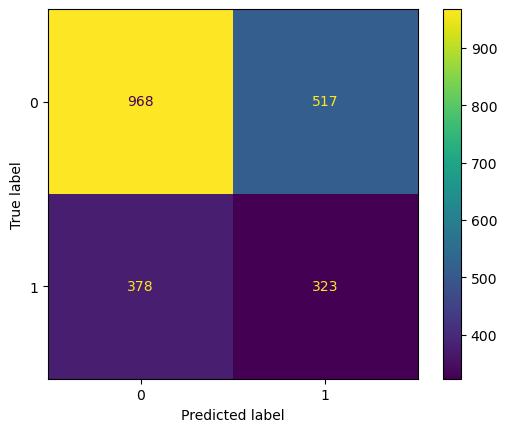

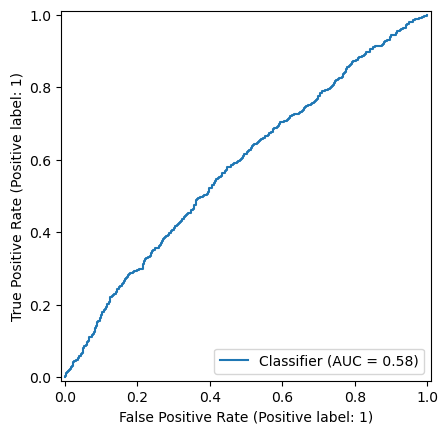

{0: 41, 1: 59} 42
Accuracy = 0.6043000914913084
ROC AUC = 0.5805021205877127
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.69      0.70      1485
           1       0.39      0.42      0.40       701

    accuracy                           0.60      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.61      0.60      0.61      2186

Confusion Matrix:


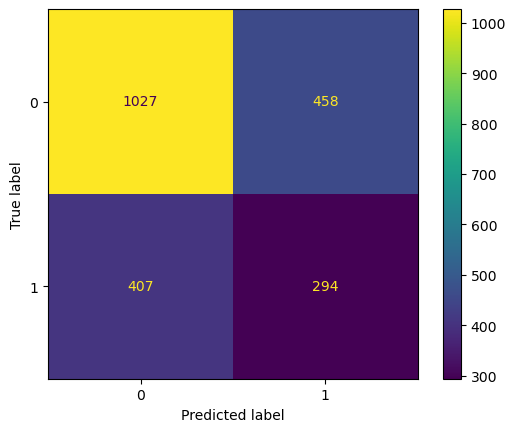

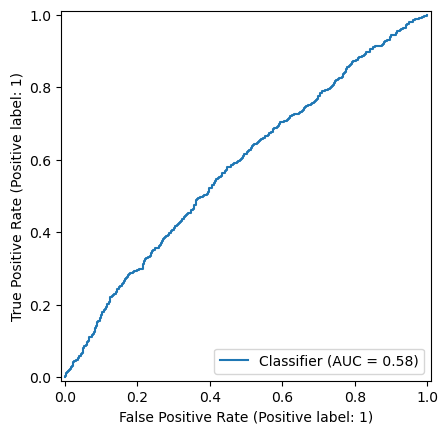

{0: 41, 1: 59} 43
Accuracy = 0.6148215919487648
ROC AUC = 0.5805021205877127
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.72      0.72      1485
           1       0.40      0.39      0.39       701

    accuracy                           0.61      2186
   macro avg       0.56      0.55      0.55      2186
weighted avg       0.61      0.61      0.61      2186

Confusion Matrix:


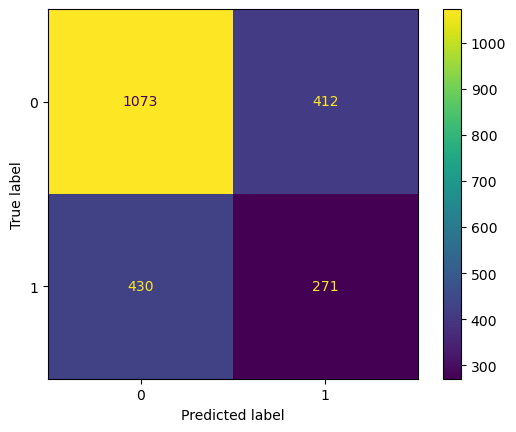

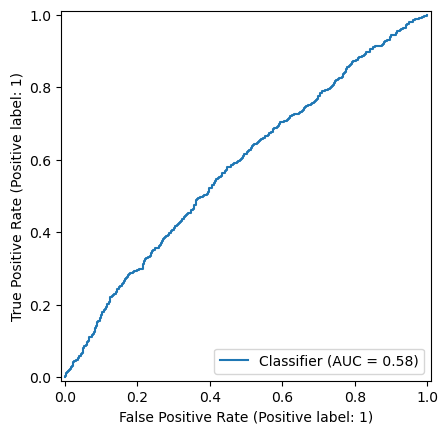

{0: 41, 1: 59} 44
Accuracy = 0.6276303751143641
ROC AUC = 0.5805021205877127
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.76      0.74      1485
           1       0.41      0.35      0.37       701

    accuracy                           0.63      2186
   macro avg       0.56      0.55      0.55      2186
weighted avg       0.61      0.63      0.62      2186

Confusion Matrix:


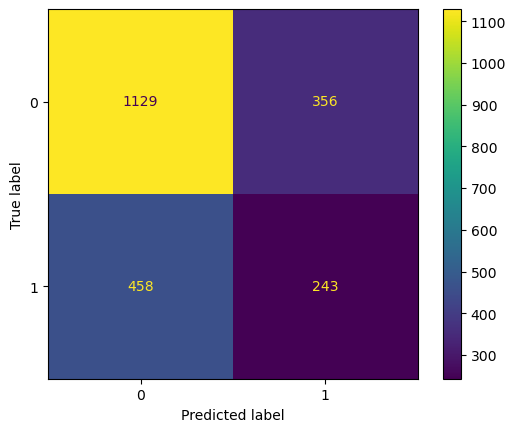

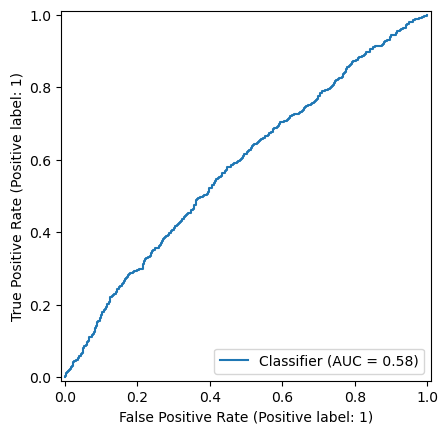

{0: 41, 1: 59} 45
Accuracy = 0.6303751143641354
ROC AUC = 0.5805021205877127
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.78      0.74      1485
           1       0.40      0.30      0.35       701

    accuracy                           0.63      2186
   macro avg       0.55      0.54      0.54      2186
weighted avg       0.61      0.63      0.62      2186

Confusion Matrix:


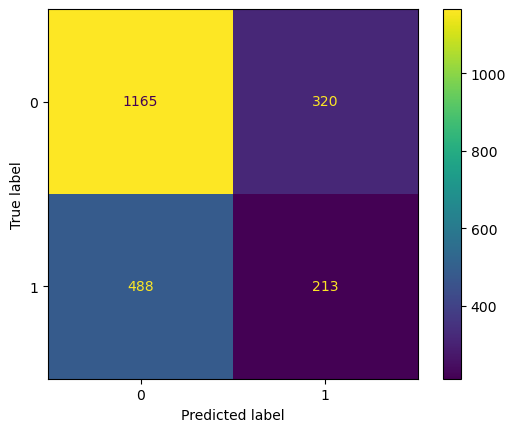

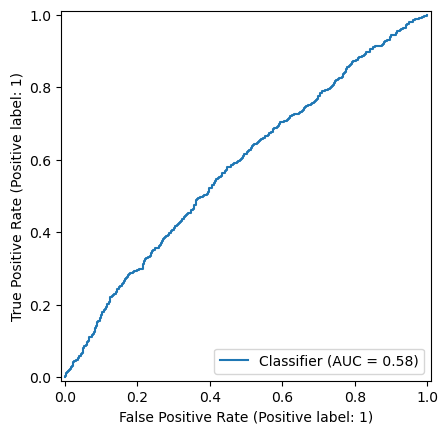

{0: 41, 1: 59} 46
Accuracy = 0.6486733760292772
ROC AUC = 0.5805021205877127
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.82      0.76      1485
           1       0.43      0.28      0.34       701

    accuracy                           0.65      2186
   macro avg       0.57      0.55      0.55      2186
weighted avg       0.62      0.65      0.63      2186

Confusion Matrix:


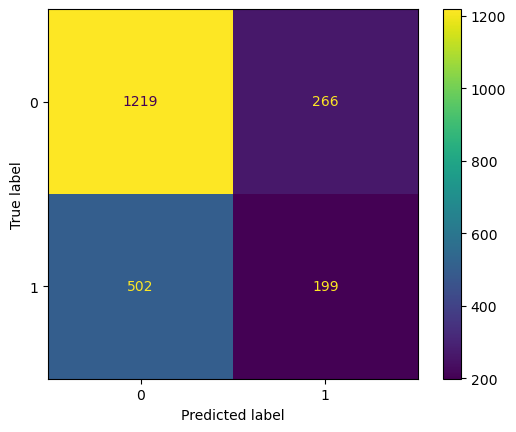

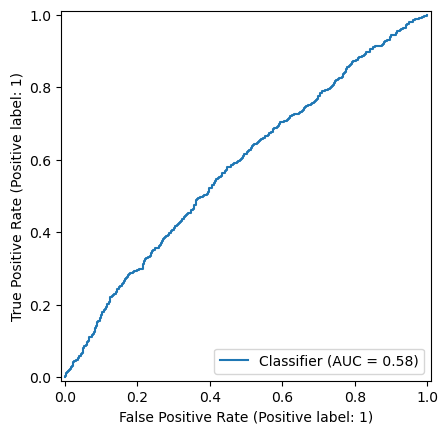

{0: 41, 1: 59} 47
Accuracy = 0.6550777676120768
ROC AUC = 0.5805021205877127
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.85      0.77      1485
           1       0.43      0.25      0.32       701

    accuracy                           0.66      2186
   macro avg       0.57      0.55      0.54      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


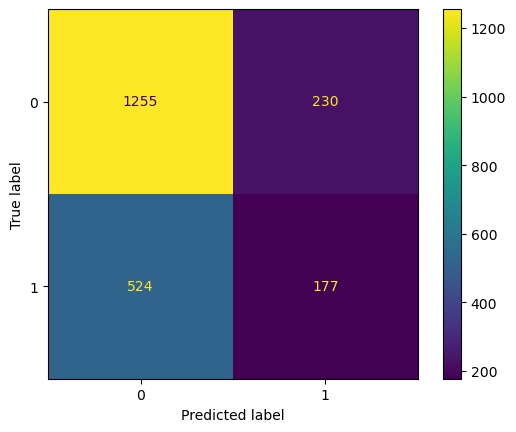

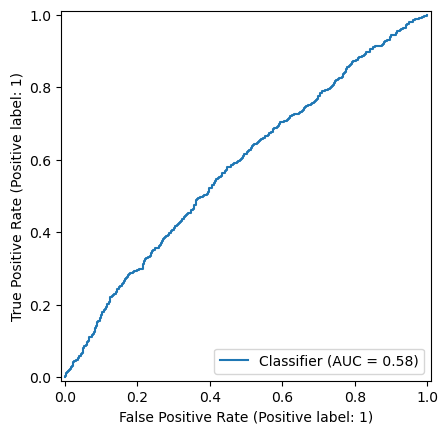

{0: 41, 1: 59} 48
Accuracy = 0.6614821591948765
ROC AUC = 0.5805021205877127
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.87      0.78      1485
           1       0.45      0.23      0.30       701

    accuracy                           0.66      2186
   macro avg       0.57      0.55      0.54      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


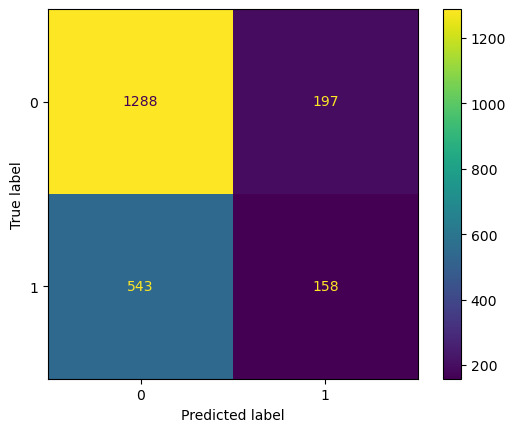

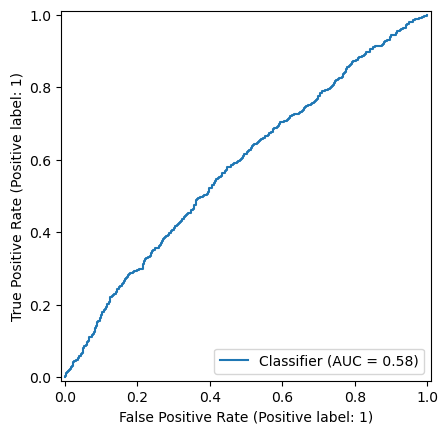

{0: 41, 1: 59} 49
Accuracy = 0.6637694419030192
ROC AUC = 0.5805021205877127
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.89      0.78      1485
           1       0.44      0.19      0.27       701

    accuracy                           0.66      2186
   macro avg       0.57      0.54      0.52      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


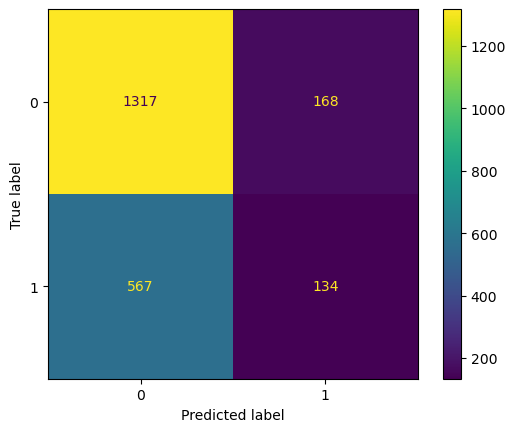

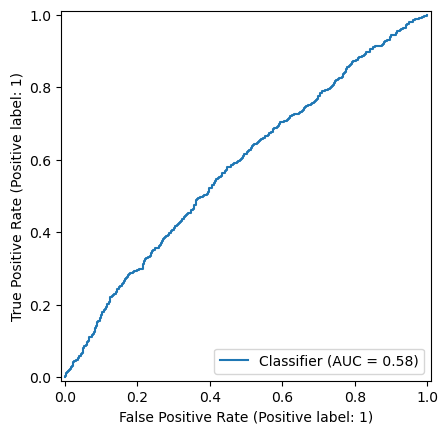

{0: 42, 1: 58} 30
Accuracy = 0.4254345837145471
ROC AUC = 0.5804050970955393
Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.23      0.35      1485
           1       0.34      0.84      0.48       701

    accuracy                           0.43      2186
   macro avg       0.55      0.53      0.42      2186
weighted avg       0.62      0.43      0.39      2186

Confusion Matrix:


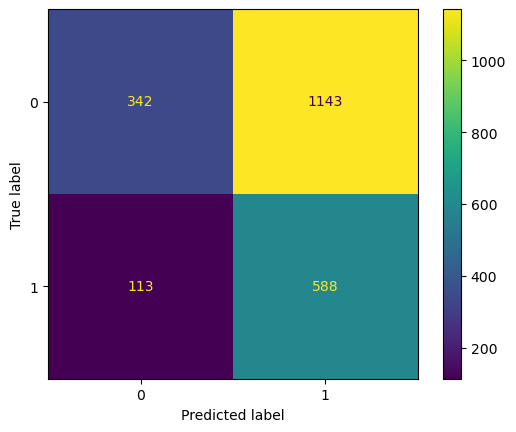

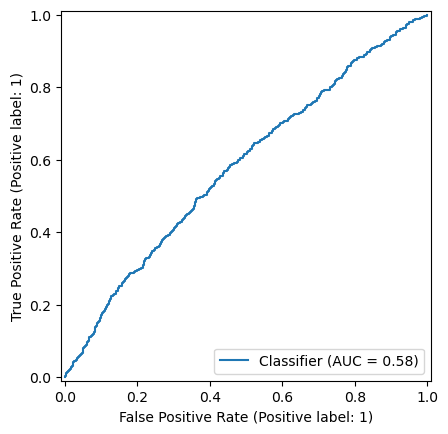

{0: 42, 1: 58} 31
Accuracy = 0.4377859103385178
ROC AUC = 0.5804050970955393
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.27      0.39      1485
           1       0.34      0.80      0.48       701

    accuracy                           0.44      2186
   macro avg       0.54      0.53      0.43      2186
weighted avg       0.61      0.44      0.42      2186

Confusion Matrix:


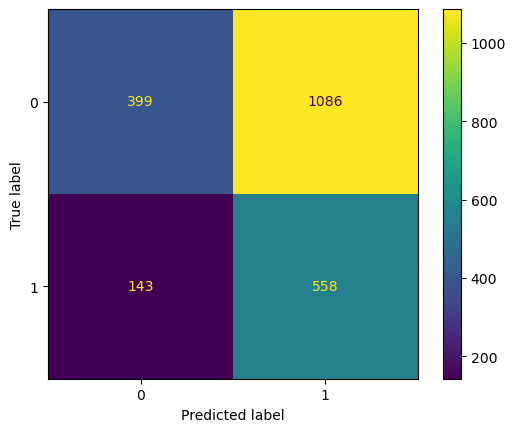

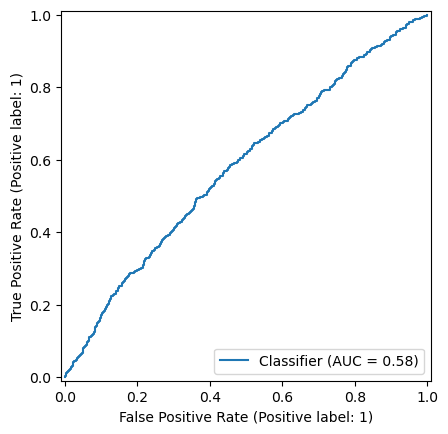

{0: 42, 1: 58} 32
Accuracy = 0.45196706312900276
ROC AUC = 0.5804050970955393
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.30      0.43      1485
           1       0.34      0.77      0.47       701

    accuracy                           0.45      2186
   macro avg       0.54      0.54      0.45      2186
weighted avg       0.61      0.45      0.44      2186

Confusion Matrix:


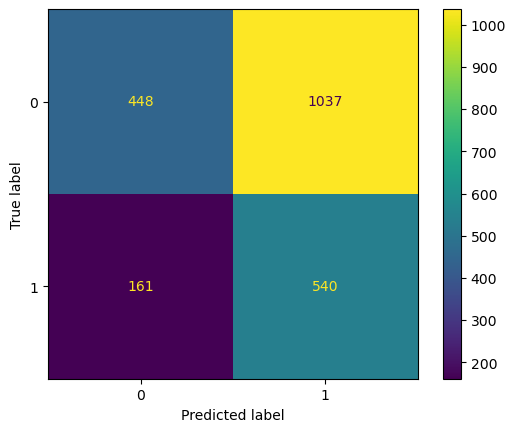

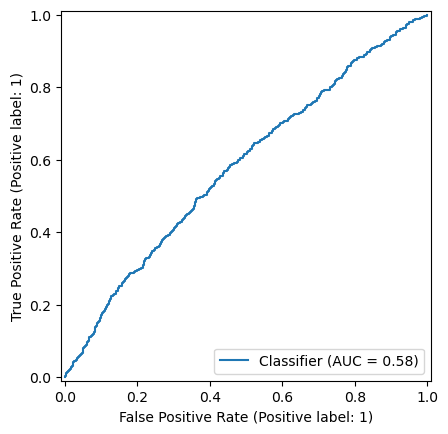

{0: 42, 1: 58} 33
Accuracy = 0.46889295516925894
ROC AUC = 0.5804050970955393
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.35      0.47      1485
           1       0.35      0.73      0.47       701

    accuracy                           0.47      2186
   macro avg       0.54      0.54      0.47      2186
weighted avg       0.61      0.47      0.47      2186

Confusion Matrix:


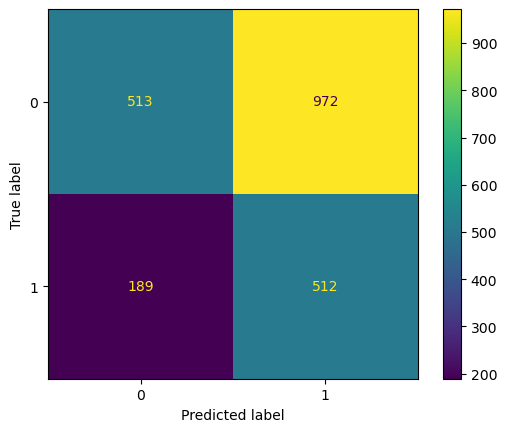

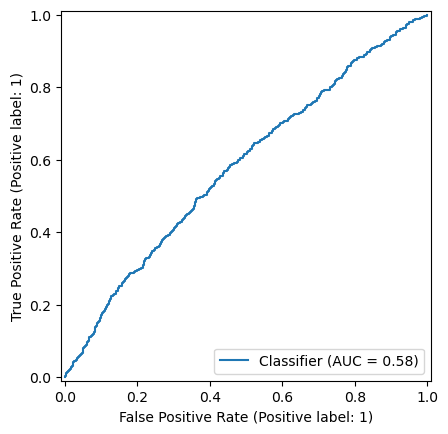

{0: 42, 1: 58} 34
Accuracy = 0.49039341262580055
ROC AUC = 0.5804050970955393
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.39      0.51      1485
           1       0.35      0.71      0.47       701

    accuracy                           0.49      2186
   macro avg       0.55      0.55      0.49      2186
weighted avg       0.61      0.49      0.50      2186

Confusion Matrix:


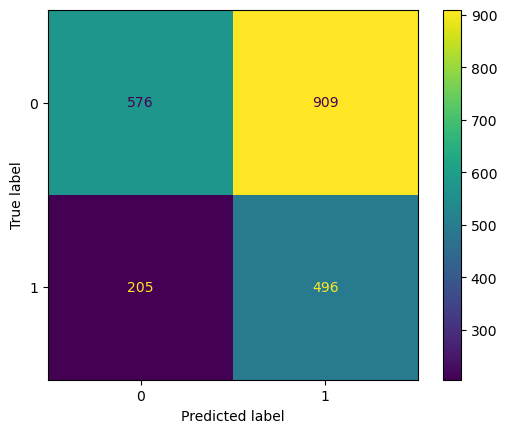

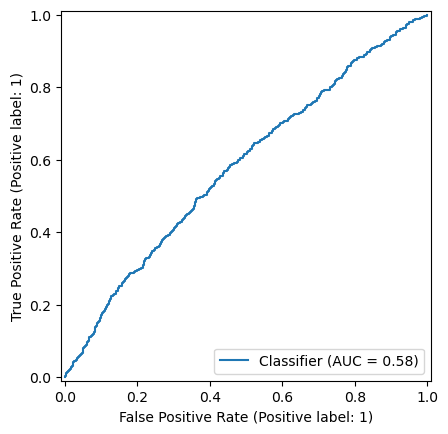

{0: 42, 1: 58} 35
Accuracy = 0.5123513266239708
ROC AUC = 0.5804050970955393
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.44      0.55      1485
           1       0.36      0.67      0.47       701

    accuracy                           0.51      2186
   macro avg       0.55      0.55      0.51      2186
weighted avg       0.62      0.51      0.52      2186

Confusion Matrix:


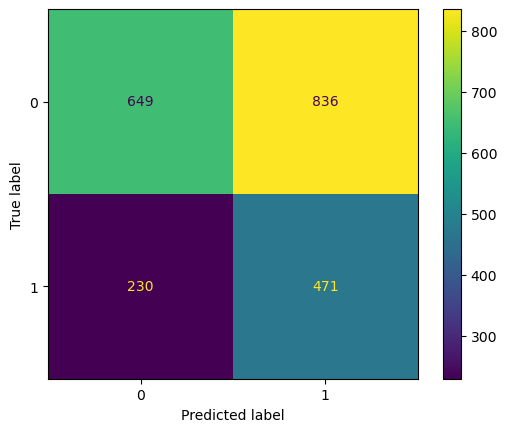

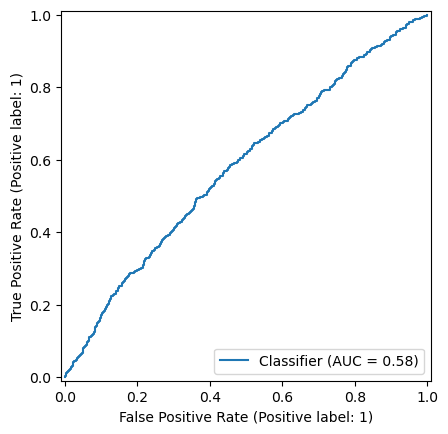

{0: 42, 1: 58} 36
Accuracy = 0.5324794144556267
ROC AUC = 0.5804050970955393
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.48      0.58      1485
           1       0.37      0.64      0.47       701

    accuracy                           0.53      2186
   macro avg       0.55      0.56      0.53      2186
weighted avg       0.62      0.53      0.55      2186

Confusion Matrix:


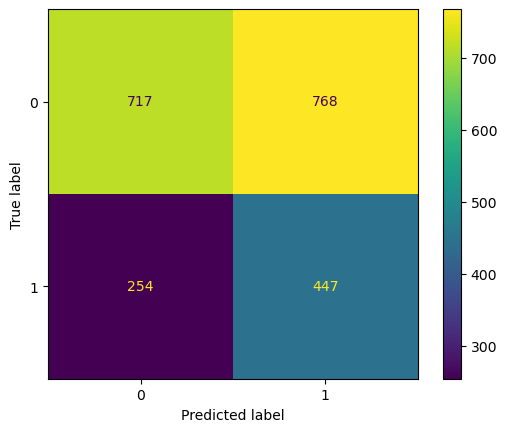

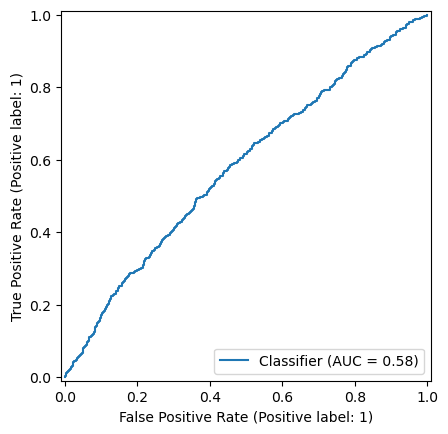

{0: 42, 1: 58} 37
Accuracy = 0.546203110704483
ROC AUC = 0.5804050970955393
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.52      0.61      1485
           1       0.37      0.60      0.46       701

    accuracy                           0.55      2186
   macro avg       0.55      0.56      0.53      2186
weighted avg       0.62      0.55      0.56      2186

Confusion Matrix:


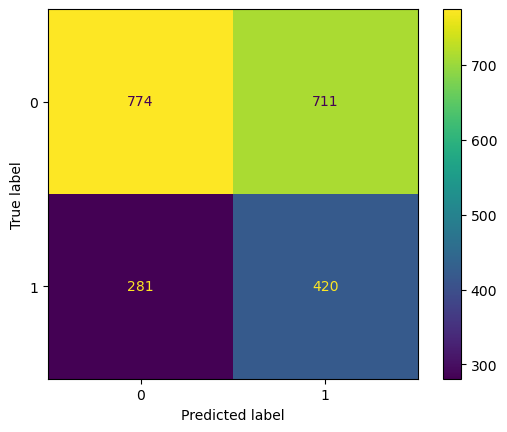

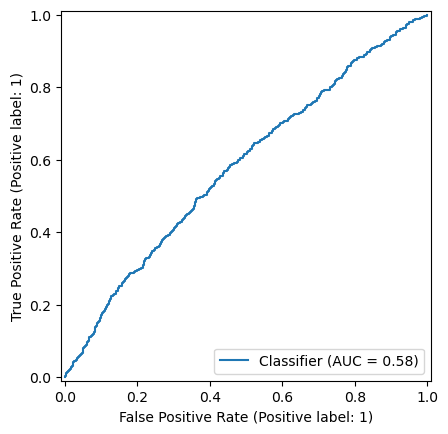

{0: 42, 1: 58} 38
Accuracy = 0.5649588289112535
ROC AUC = 0.5804050970955393
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.57      0.64      1485
           1       0.38      0.55      0.45       701

    accuracy                           0.56      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.62      0.56      0.58      2186

Confusion Matrix:


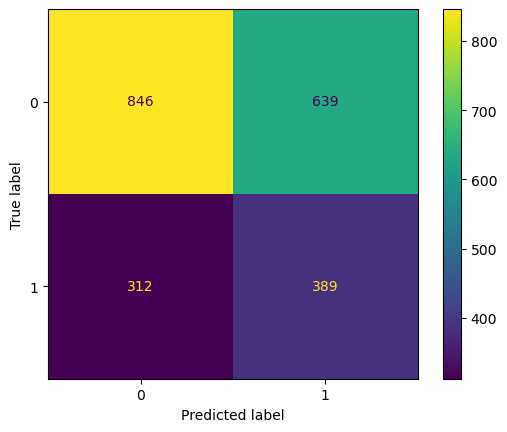

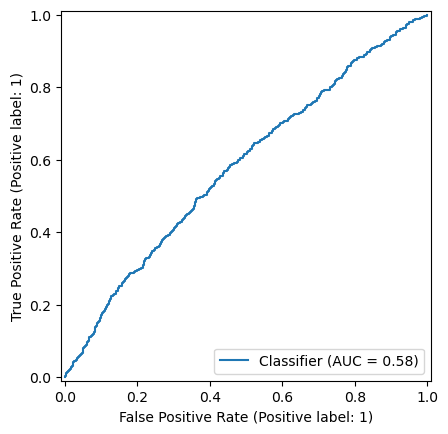

{0: 42, 1: 58} 39
Accuracy = 0.57548032936871
ROC AUC = 0.5804050970955393
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.61      0.66      1485
           1       0.38      0.51      0.43       701

    accuracy                           0.58      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.61      0.58      0.59      2186

Confusion Matrix:


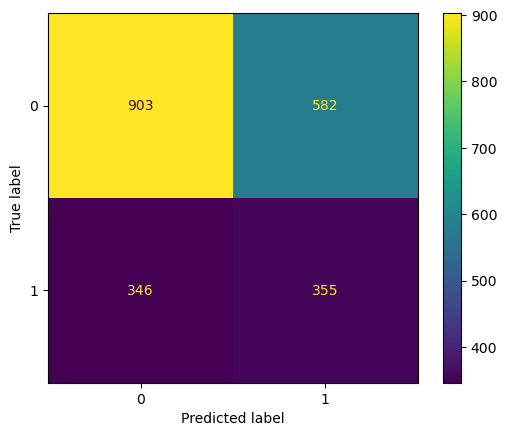

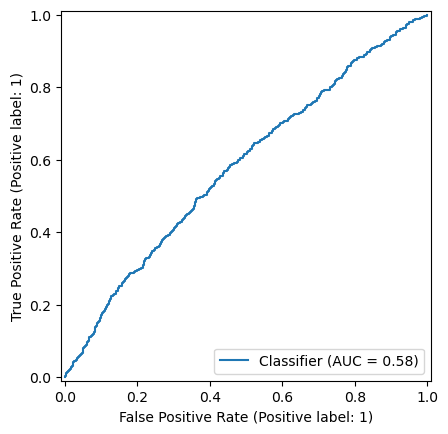

{0: 42, 1: 58} 40
Accuracy = 0.5896614821591949
ROC AUC = 0.5804050970955393
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.65      0.68      1485
           1       0.38      0.46      0.42       701

    accuracy                           0.59      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.61      0.59      0.60      2186

Confusion Matrix:


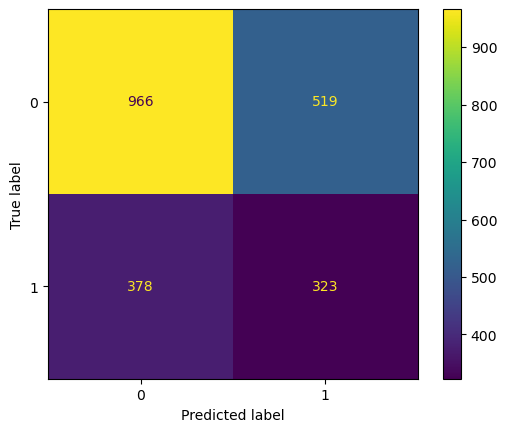

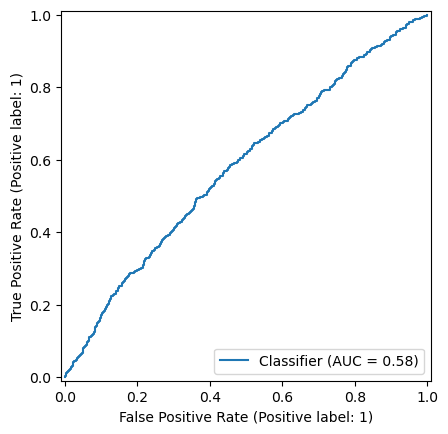

{0: 42, 1: 58} 41
Accuracy = 0.6043000914913084
ROC AUC = 0.5804050970955393
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.69      0.70      1485
           1       0.39      0.42      0.41       701

    accuracy                           0.60      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.61      0.60      0.61      2186

Confusion Matrix:


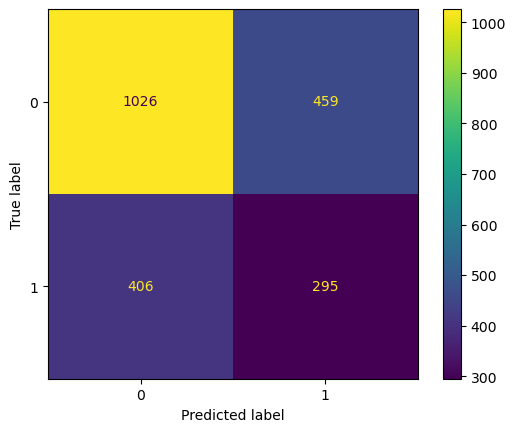

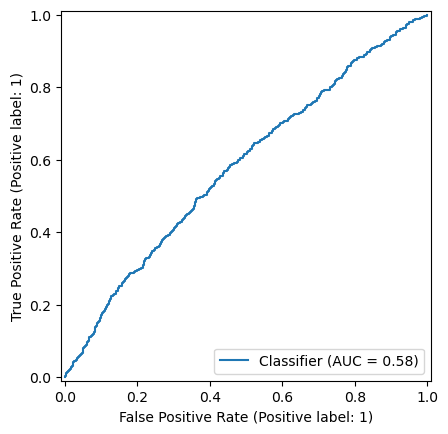

{0: 42, 1: 58} 42
Accuracy = 0.6157365050320219
ROC AUC = 0.5804050970955393
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.72      0.72      1485
           1       0.40      0.39      0.39       701

    accuracy                           0.62      2186
   macro avg       0.56      0.55      0.56      2186
weighted avg       0.61      0.62      0.61      2186

Confusion Matrix:


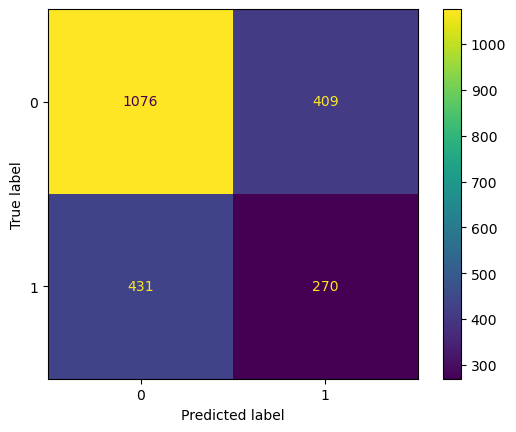

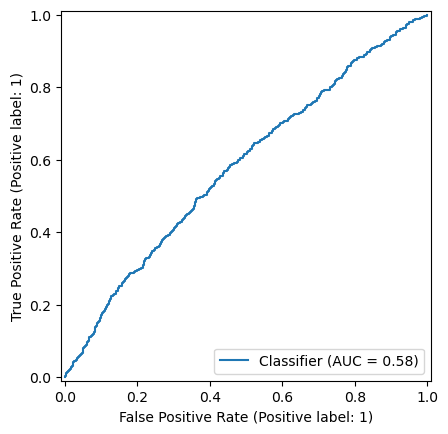

{0: 42, 1: 58} 43
Accuracy = 0.6280878316559927
ROC AUC = 0.5804050970955393
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.76      0.74      1485
           1       0.41      0.35      0.37       701

    accuracy                           0.63      2186
   macro avg       0.56      0.55      0.55      2186
weighted avg       0.61      0.63      0.62      2186

Confusion Matrix:


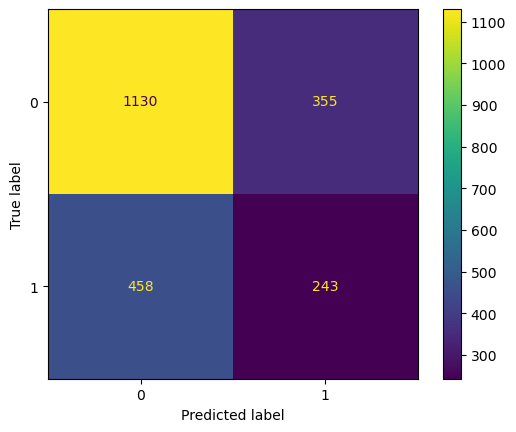

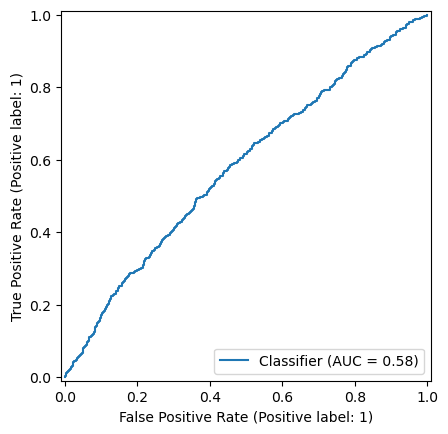

{0: 42, 1: 58} 44
Accuracy = 0.630832570905764
ROC AUC = 0.5804050970955393
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.78      0.74      1485
           1       0.40      0.31      0.35       701

    accuracy                           0.63      2186
   macro avg       0.55      0.54      0.54      2186
weighted avg       0.61      0.63      0.62      2186

Confusion Matrix:


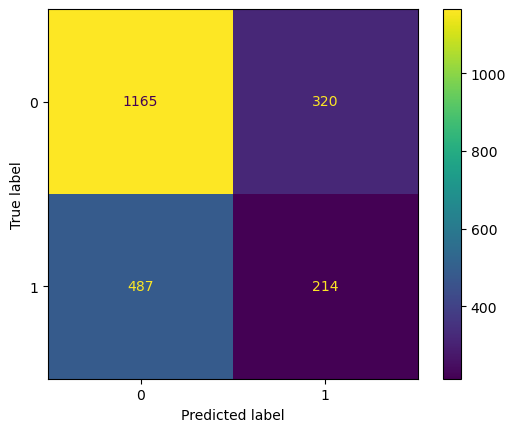

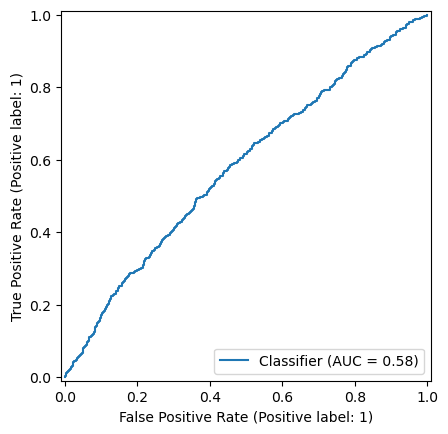

{0: 42, 1: 58} 45
Accuracy = 0.6505032021957914
ROC AUC = 0.5804050970955393
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.82      0.76      1485
           1       0.43      0.28      0.34       701

    accuracy                           0.65      2186
   macro avg       0.57      0.55      0.55      2186
weighted avg       0.62      0.65      0.63      2186

Confusion Matrix:


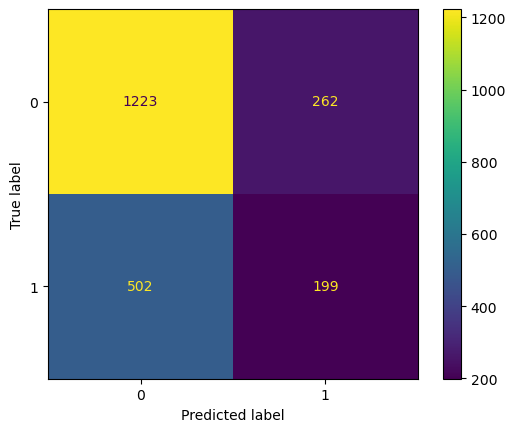

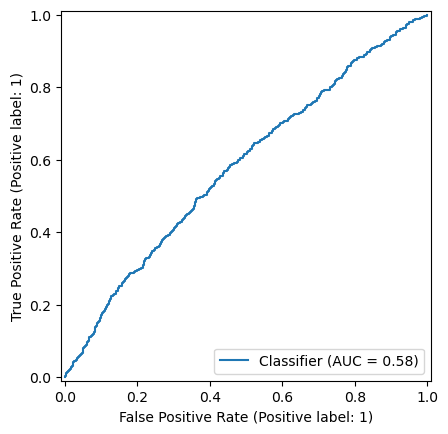

{0: 42, 1: 58} 46
Accuracy = 0.6559926806953339
ROC AUC = 0.5804050970955393
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.85      0.77      1485
           1       0.44      0.25      0.32       701

    accuracy                           0.66      2186
   macro avg       0.57      0.55      0.54      2186
weighted avg       0.62      0.66      0.63      2186

Confusion Matrix:


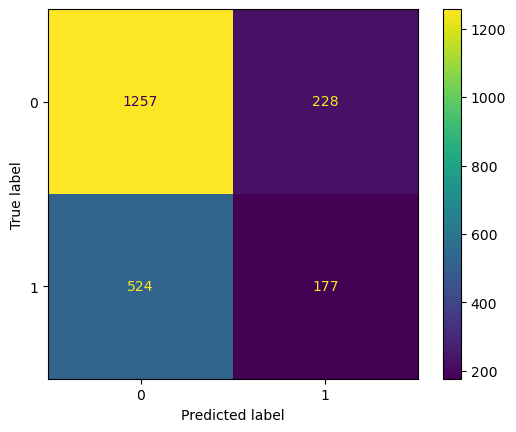

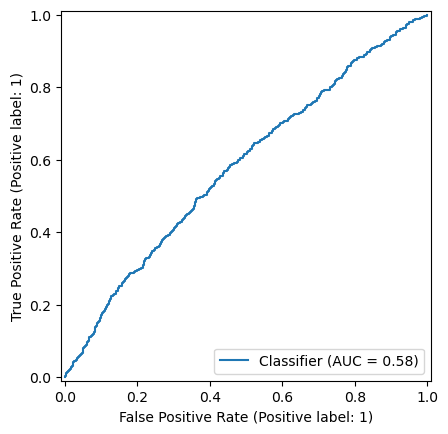

{0: 42, 1: 58} 47
Accuracy = 0.6619396157365051
ROC AUC = 0.5804050970955393
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.87      0.78      1485
           1       0.45      0.23      0.30       701

    accuracy                           0.66      2186
   macro avg       0.57      0.55      0.54      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


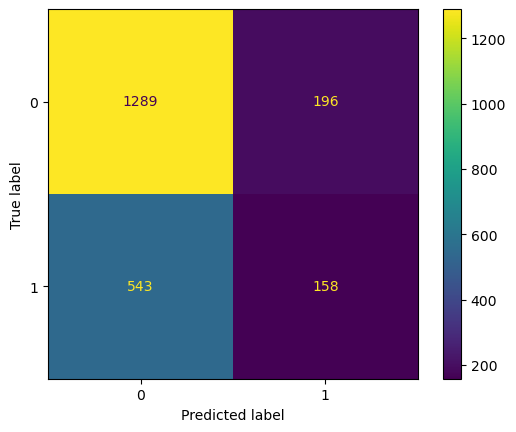

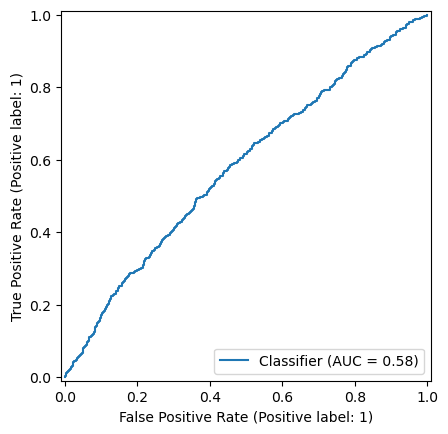

{0: 42, 1: 58} 48
Accuracy = 0.6628545288197621
ROC AUC = 0.5804050970955393
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.89      0.78      1485
           1       0.44      0.19      0.27       701

    accuracy                           0.66      2186
   macro avg       0.57      0.54      0.52      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


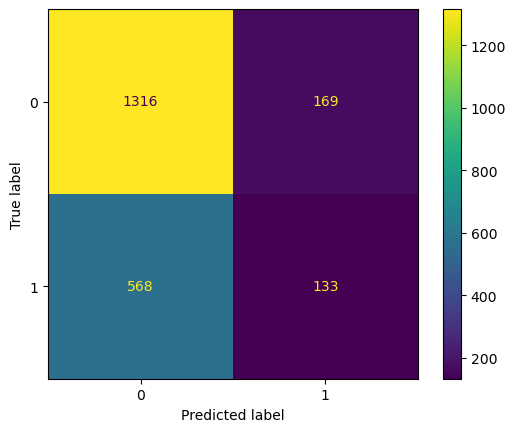

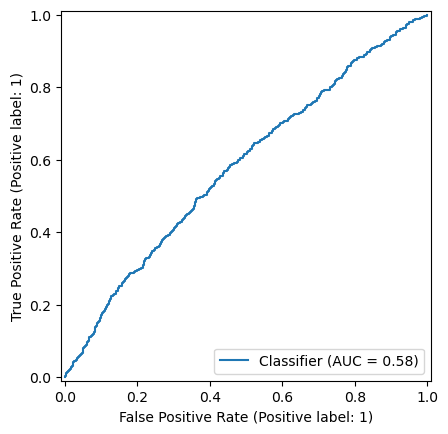

{0: 42, 1: 58} 49
Accuracy = 0.6646843549862763
ROC AUC = 0.5804050970955393
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.90      0.79      1485
           1       0.44      0.16      0.23       701

    accuracy                           0.66      2186
   macro avg       0.57      0.53      0.51      2186
weighted avg       0.61      0.66      0.61      2186

Confusion Matrix:


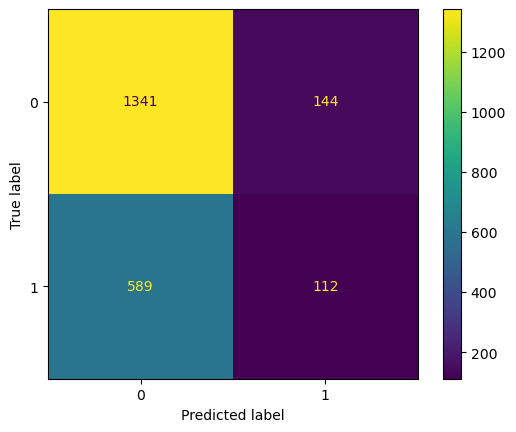

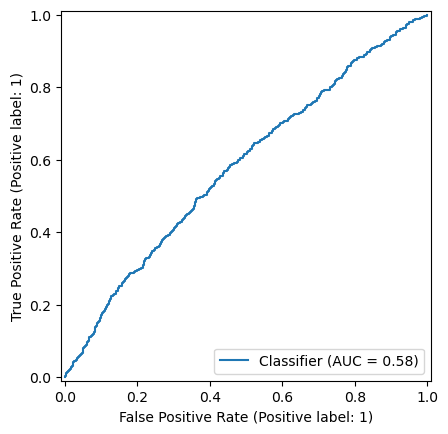

{0: 43, 1: 57} 30
Accuracy = 0.4364135407136322
ROC AUC = 0.5806260416816764
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.26      0.39      1485
           1       0.34      0.80      0.48       701

    accuracy                           0.44      2186
   macro avg       0.54      0.53      0.43      2186
weighted avg       0.61      0.44      0.42      2186

Confusion Matrix:


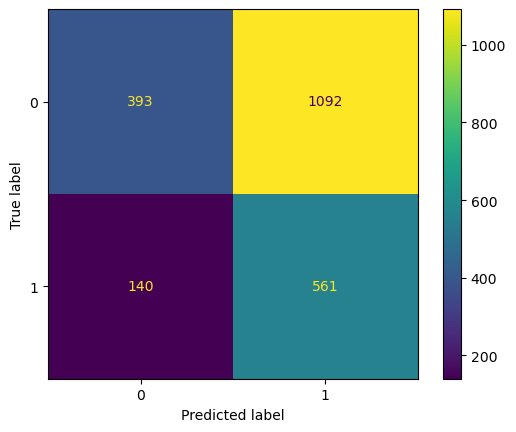

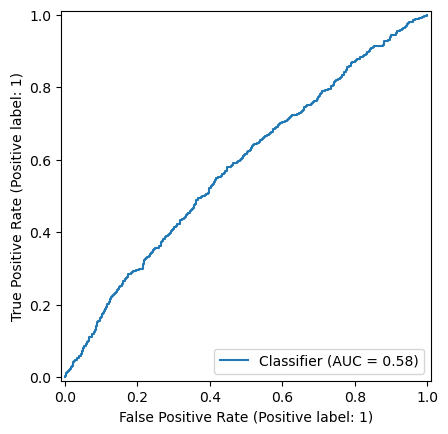

{0: 43, 1: 57} 31
Accuracy = 0.45196706312900276
ROC AUC = 0.5806260416816764
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.30      0.43      1485
           1       0.34      0.78      0.48       701

    accuracy                           0.45      2186
   macro avg       0.54      0.54      0.45      2186
weighted avg       0.61      0.45      0.44      2186

Confusion Matrix:


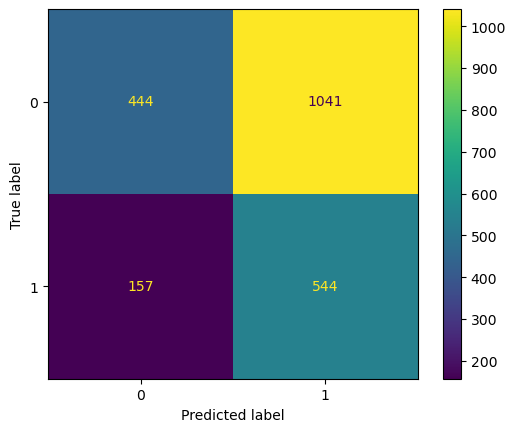

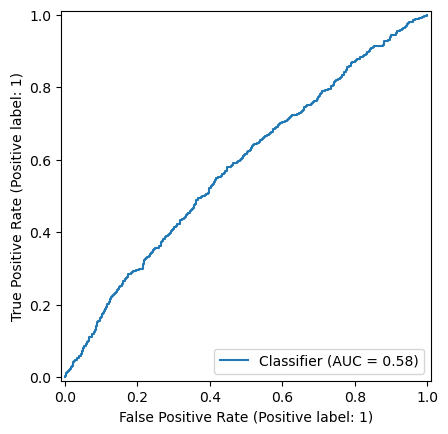

{0: 43, 1: 57} 32
Accuracy = 0.46797804208600186
ROC AUC = 0.5806260416816764
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.34      0.47      1485
           1       0.34      0.73      0.47       701

    accuracy                           0.47      2186
   macro avg       0.54      0.54      0.47      2186
weighted avg       0.61      0.47      0.47      2186

Confusion Matrix:


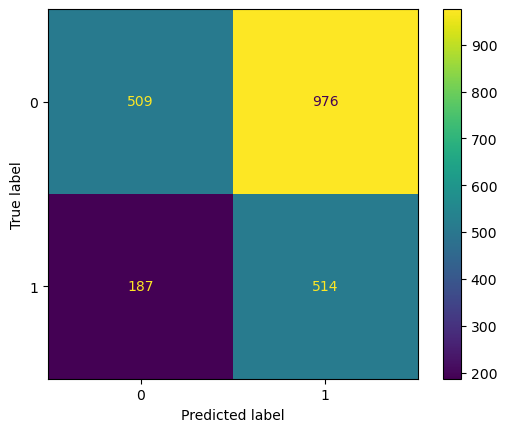

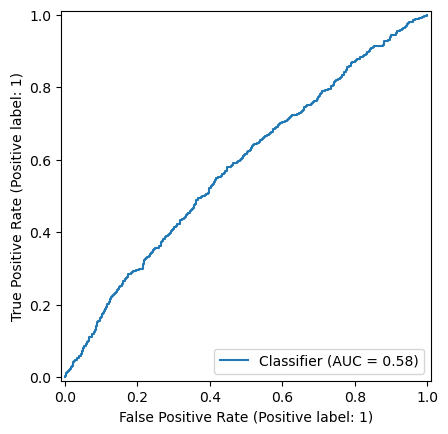

{0: 43, 1: 57} 33
Accuracy = 0.48947849954254347
ROC AUC = 0.5806260416816764
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.38      0.51      1485
           1       0.35      0.71      0.47       701

    accuracy                           0.49      2186
   macro avg       0.55      0.55      0.49      2186
weighted avg       0.62      0.49      0.49      2186

Confusion Matrix:


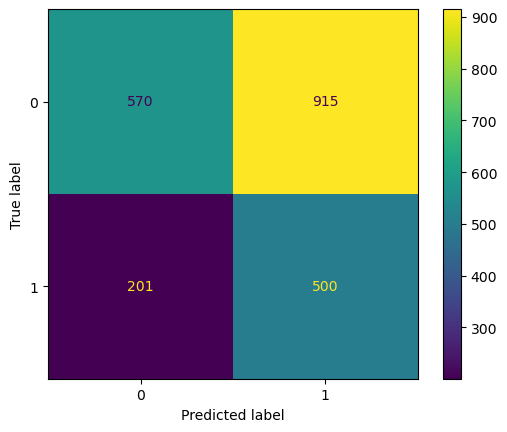

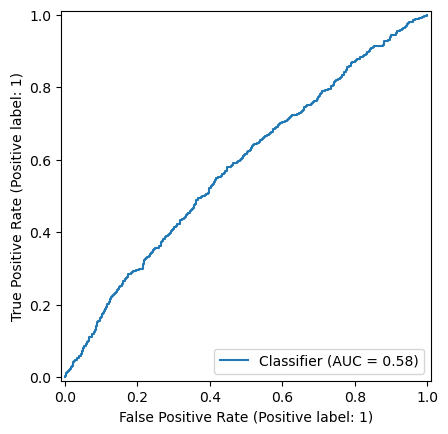

{0: 43, 1: 57} 34
Accuracy = 0.5105215004574566
ROC AUC = 0.5806260416816764
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.43      0.55      1485
           1       0.36      0.67      0.47       701

    accuracy                           0.51      2186
   macro avg       0.55      0.55      0.51      2186
weighted avg       0.62      0.51      0.52      2186

Confusion Matrix:


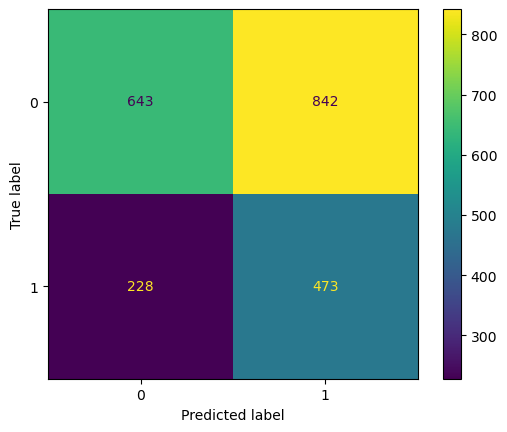

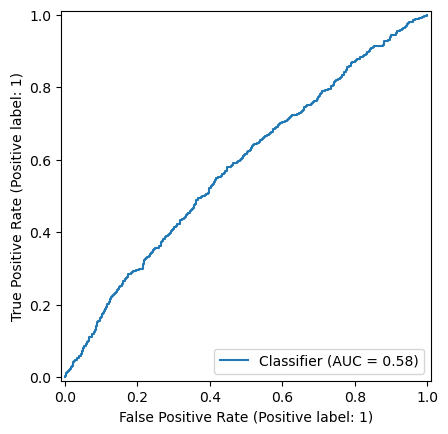

{0: 43, 1: 57} 35
Accuracy = 0.5320219579139982
ROC AUC = 0.5806260416816764
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.48      0.58      1485
           1       0.37      0.64      0.47       701

    accuracy                           0.53      2186
   macro avg       0.55      0.56      0.52      2186
weighted avg       0.62      0.53      0.55      2186

Confusion Matrix:


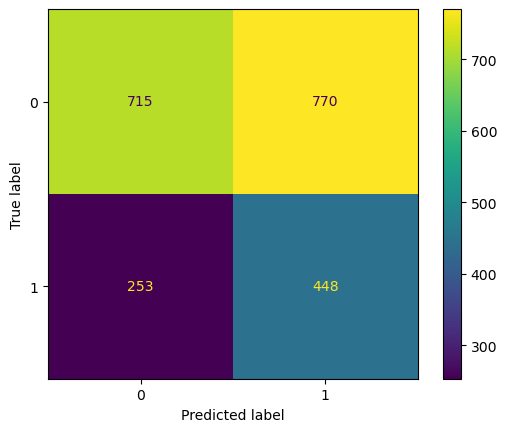

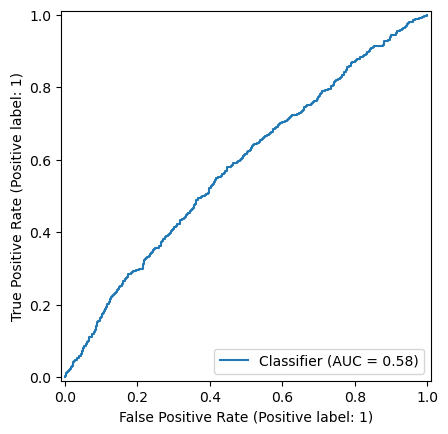

{0: 43, 1: 57} 36
Accuracy = 0.5420860018298261
ROC AUC = 0.5806260416816764
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.52      0.60      1485
           1       0.37      0.60      0.46       701

    accuracy                           0.54      2186
   macro avg       0.55      0.56      0.53      2186
weighted avg       0.61      0.54      0.56      2186

Confusion Matrix:


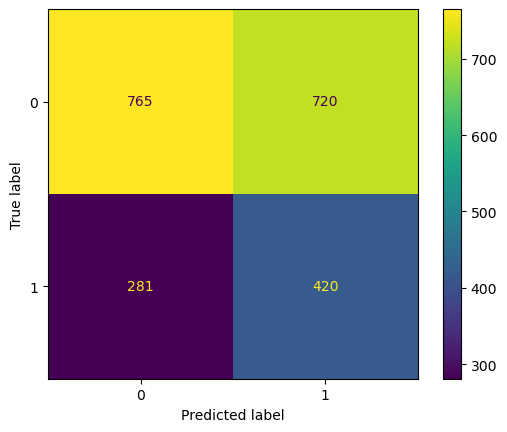

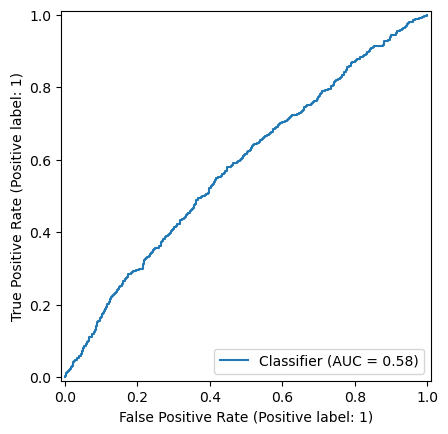

{0: 43, 1: 57} 37
Accuracy = 0.5649588289112535
ROC AUC = 0.5806260416816764
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.57      0.64      1485
           1       0.38      0.56      0.45       701

    accuracy                           0.56      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.62      0.56      0.58      2186

Confusion Matrix:


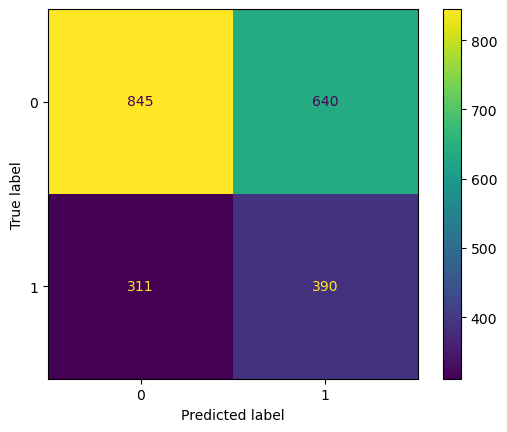

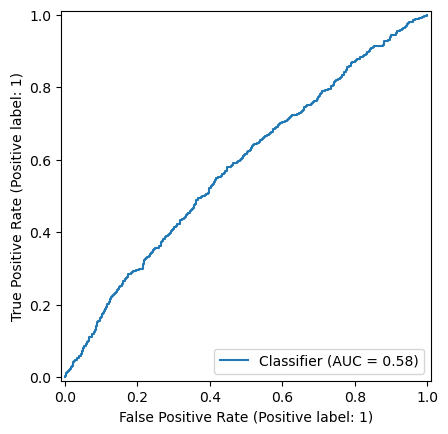

{0: 43, 1: 57} 38
Accuracy = 0.5736505032021958
ROC AUC = 0.5806260416816764
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.61      0.66      1485
           1       0.38      0.51      0.43       701

    accuracy                           0.57      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.61      0.57      0.59      2186

Confusion Matrix:


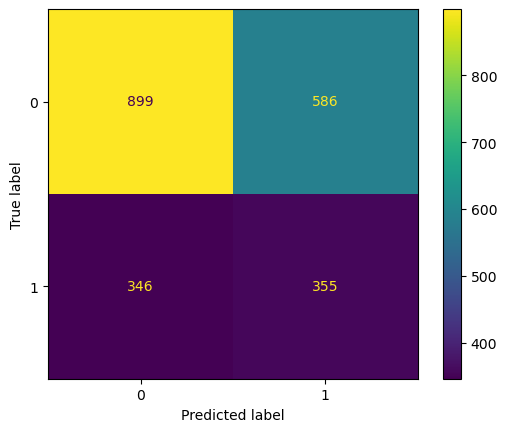

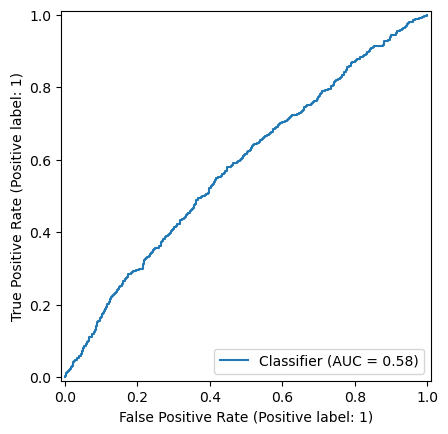

{0: 43, 1: 57} 39
Accuracy = 0.5901189387008234
ROC AUC = 0.5806260416816764
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.65      0.68      1485
           1       0.38      0.46      0.42       701

    accuracy                           0.59      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.61      0.59      0.60      2186

Confusion Matrix:


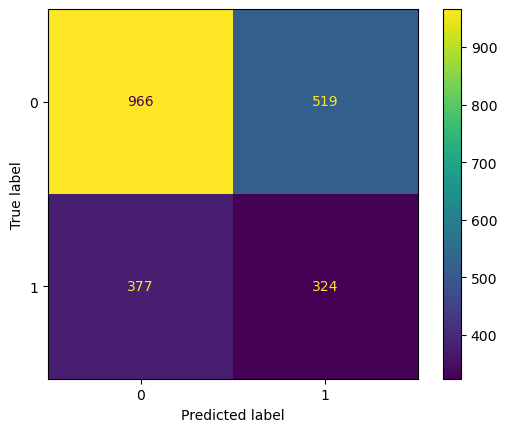

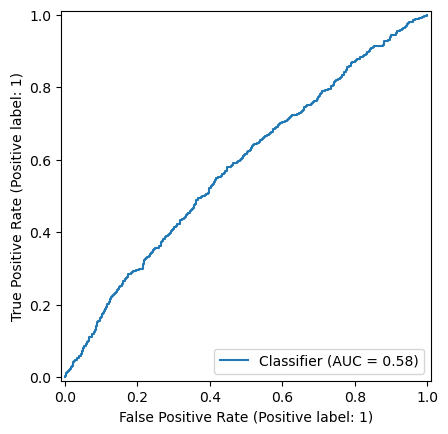

{0: 43, 1: 57} 40
Accuracy = 0.6038426349496798
ROC AUC = 0.5806260416816764
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.69      0.70      1485
           1       0.39      0.42      0.40       701

    accuracy                           0.60      2186
   macro avg       0.55      0.55      0.55      2186
weighted avg       0.61      0.60      0.61      2186

Confusion Matrix:


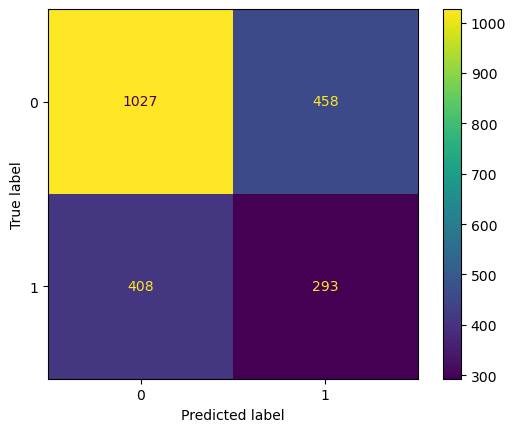

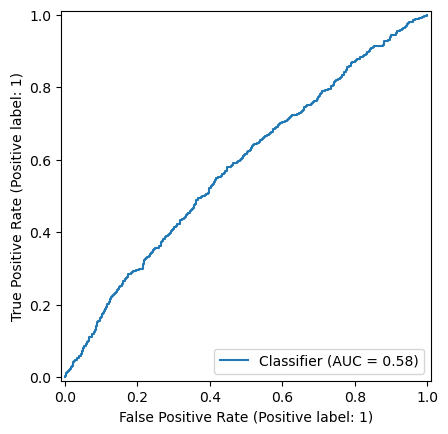

{0: 43, 1: 57} 41
Accuracy = 0.6152790484903934
ROC AUC = 0.5806260416816764
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.72      0.72      1485
           1       0.40      0.39      0.39       701

    accuracy                           0.62      2186
   macro avg       0.56      0.55      0.55      2186
weighted avg       0.61      0.62      0.61      2186

Confusion Matrix:


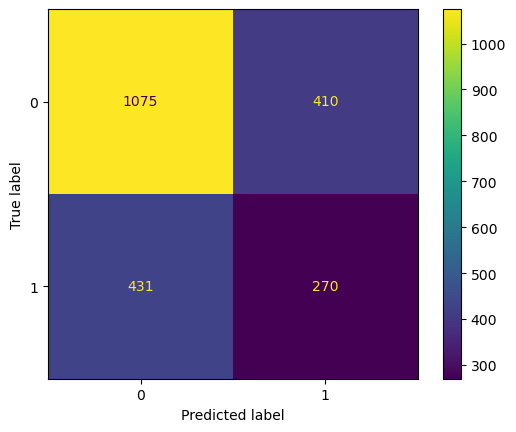

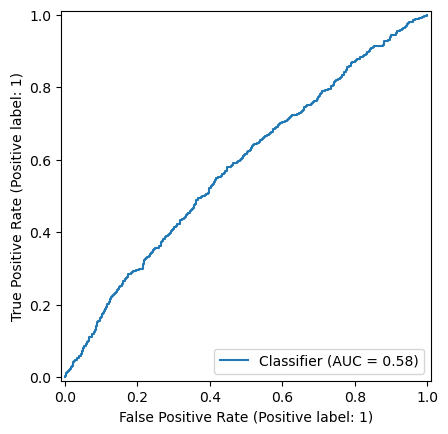

{0: 43, 1: 57} 42
Accuracy = 0.6267154620311071
ROC AUC = 0.5806260416816764
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.76      0.73      1485
           1       0.40      0.34      0.37       701

    accuracy                           0.63      2186
   macro avg       0.56      0.55      0.55      2186
weighted avg       0.61      0.63      0.62      2186

Confusion Matrix:


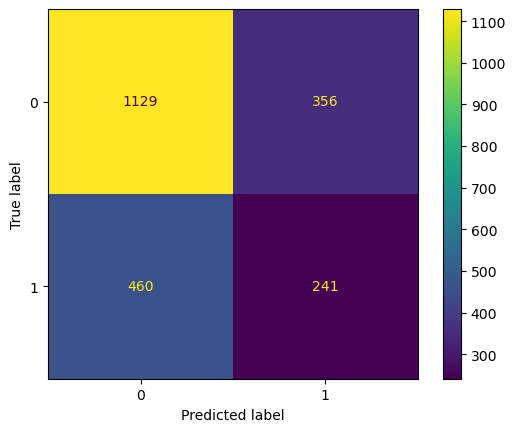

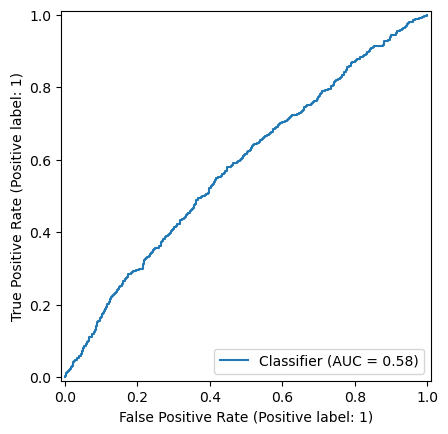

{0: 43, 1: 57} 43
Accuracy = 0.630832570905764
ROC AUC = 0.5806260416816764
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.78      0.74      1485
           1       0.40      0.31      0.35       701

    accuracy                           0.63      2186
   macro avg       0.55      0.54      0.54      2186
weighted avg       0.61      0.63      0.62      2186

Confusion Matrix:


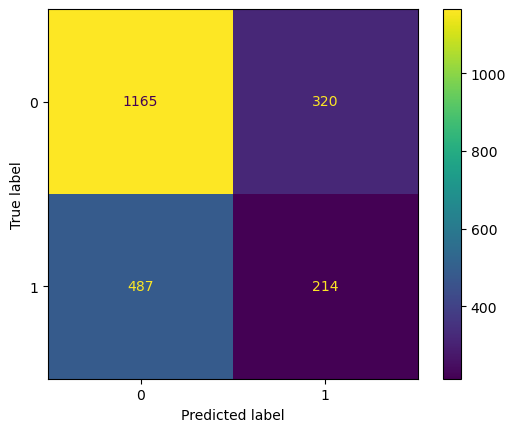

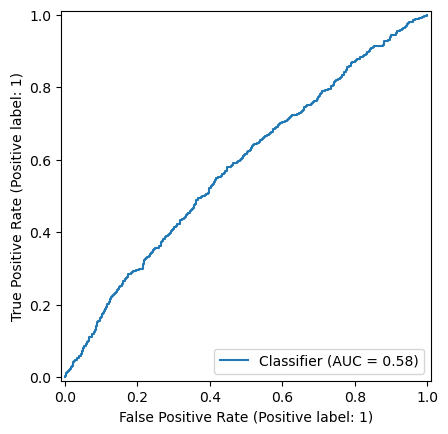

{0: 43, 1: 57} 44
Accuracy = 0.6505032021957914
ROC AUC = 0.5806260416816764
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.82      0.76      1485
           1       0.43      0.29      0.34       701

    accuracy                           0.65      2186
   macro avg       0.57      0.55      0.55      2186
weighted avg       0.62      0.65      0.63      2186

Confusion Matrix:


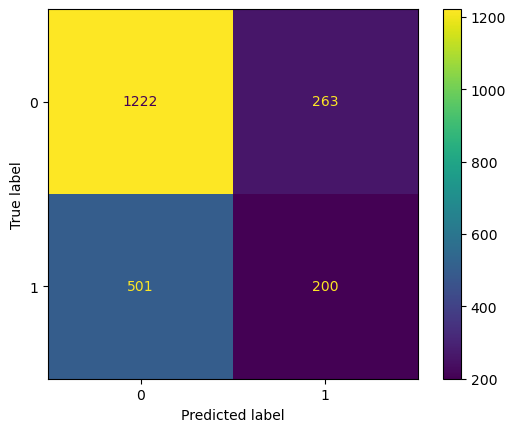

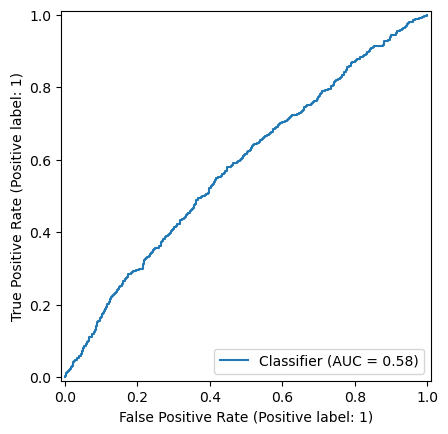

{0: 43, 1: 57} 45
Accuracy = 0.6555352241537054
ROC AUC = 0.5806260416816764
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.85      0.77      1485
           1       0.44      0.25      0.32       701

    accuracy                           0.66      2186
   macro avg       0.57      0.55      0.54      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


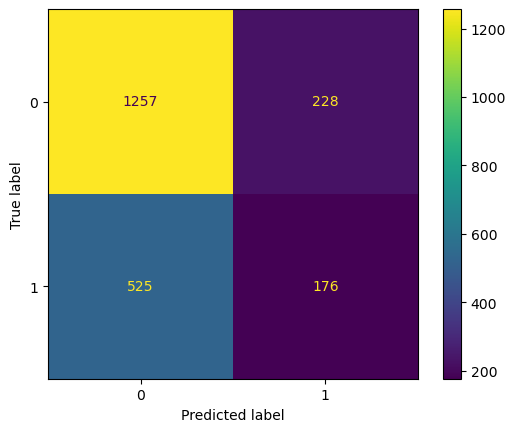

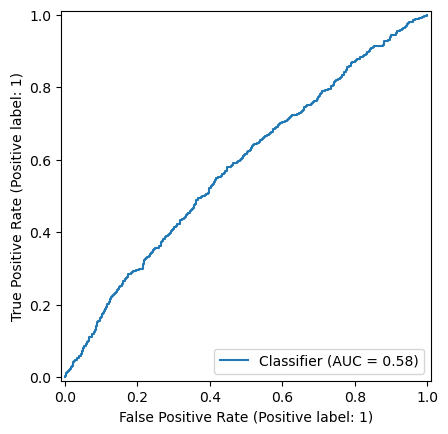

{0: 43, 1: 57} 46
Accuracy = 0.661024702653248
ROC AUC = 0.5806260416816764
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.87      0.78      1485
           1       0.44      0.22      0.30       701

    accuracy                           0.66      2186
   macro avg       0.57      0.55      0.54      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


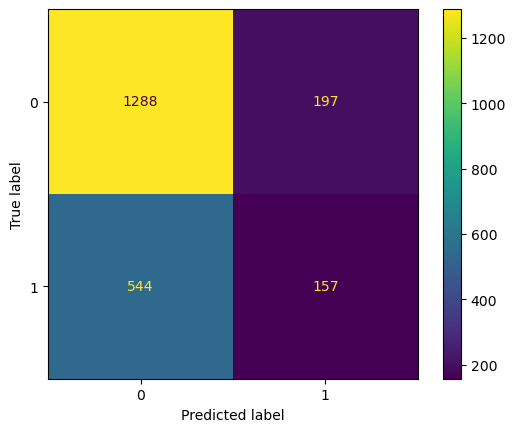

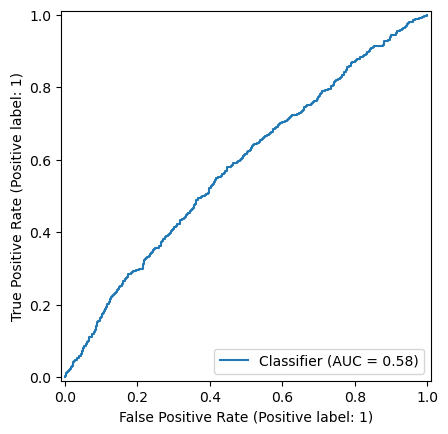

{0: 43, 1: 57} 47
Accuracy = 0.6637694419030192
ROC AUC = 0.5806260416816764
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.89      0.78      1485
           1       0.44      0.19      0.27       701

    accuracy                           0.66      2186
   macro avg       0.57      0.54      0.52      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


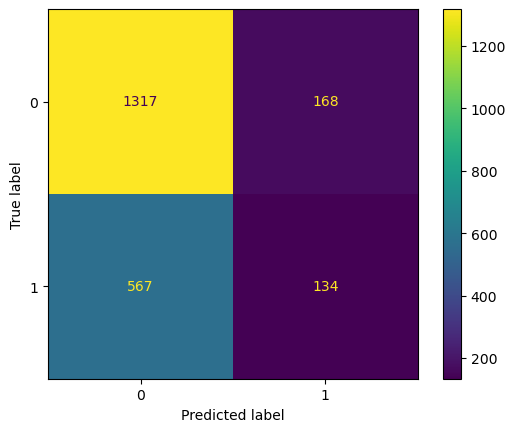

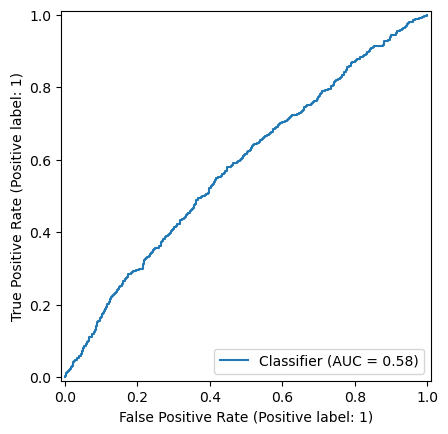

{0: 43, 1: 57} 48
Accuracy = 0.6646843549862763
ROC AUC = 0.5806260416816764
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.90      0.79      1485
           1       0.44      0.16      0.24       701

    accuracy                           0.66      2186
   macro avg       0.57      0.53      0.51      2186
weighted avg       0.61      0.66      0.61      2186

Confusion Matrix:


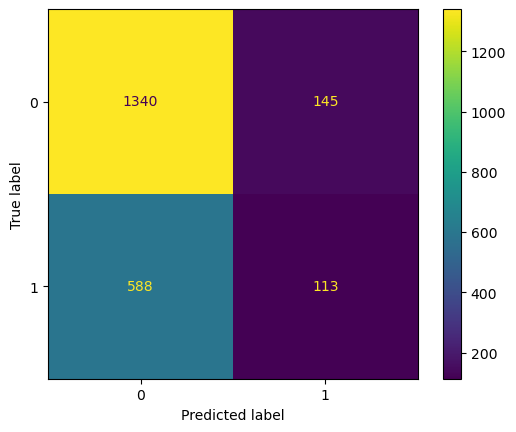

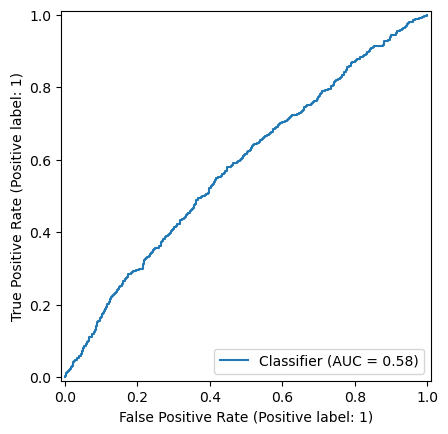

{0: 43, 1: 57} 49
Accuracy = 0.6655992680695334
ROC AUC = 0.5806260416816764
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.91      0.79      1485
           1       0.43      0.14      0.21       701

    accuracy                           0.67      2186
   macro avg       0.56      0.53      0.50      2186
weighted avg       0.61      0.67      0.60      2186

Confusion Matrix:


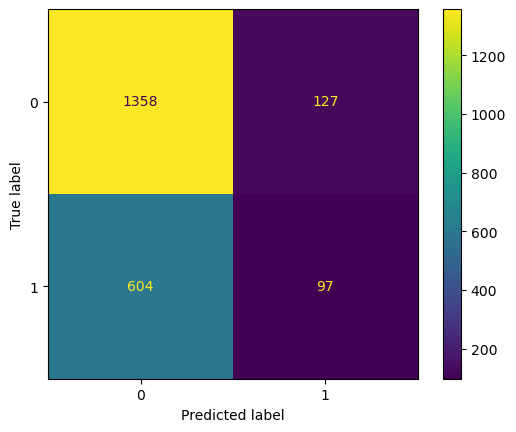

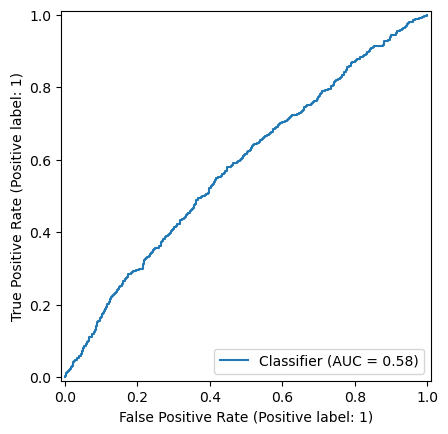

{0: 44, 1: 56} 30
Accuracy = 0.4505946935041171
ROC AUC = 0.5805578370485646
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.30      0.42      1485
           1       0.34      0.78      0.48       701

    accuracy                           0.45      2186
   macro avg       0.54      0.54      0.45      2186
weighted avg       0.61      0.45      0.44      2186

Confusion Matrix:


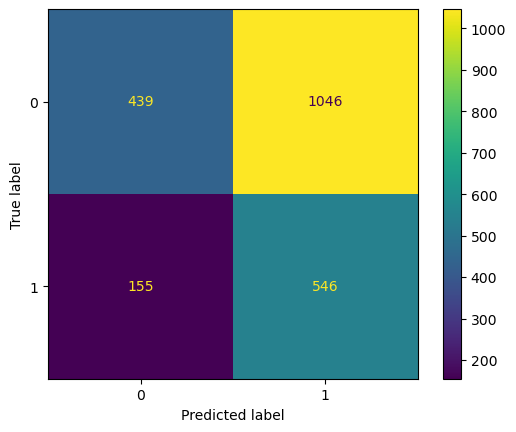

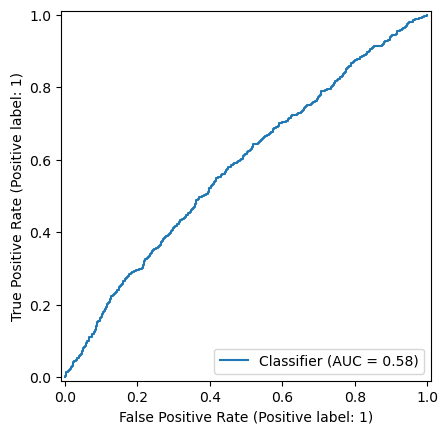

{0: 44, 1: 56} 31
Accuracy = 0.46752058554437326
ROC AUC = 0.5805578370485646
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.34      0.46      1485
           1       0.35      0.75      0.47       701

    accuracy                           0.47      2186
   macro avg       0.54      0.54      0.47      2186
weighted avg       0.61      0.47      0.47      2186

Confusion Matrix:


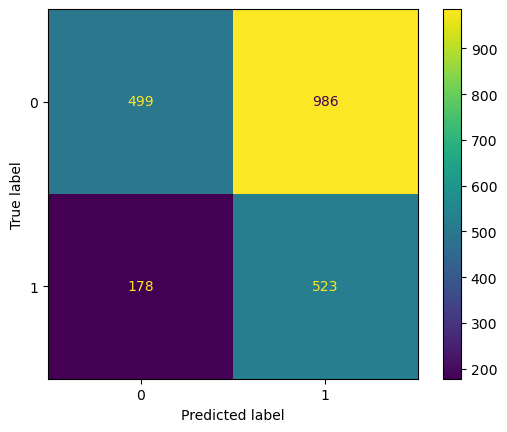

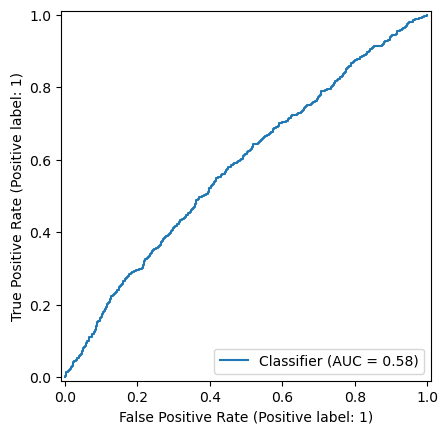

{0: 44, 1: 56} 32
Accuracy = 0.4867337602927722
ROC AUC = 0.5805578370485646
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.38      0.50      1485
           1       0.35      0.71      0.47       701

    accuracy                           0.49      2186
   macro avg       0.54      0.55      0.49      2186
weighted avg       0.61      0.49      0.49      2186

Confusion Matrix:


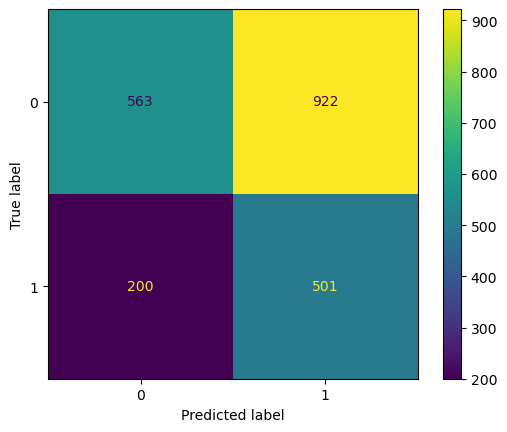

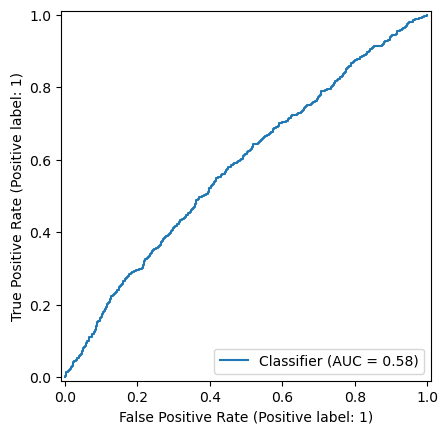

{0: 44, 1: 56} 33
Accuracy = 0.5077767612076852
ROC AUC = 0.5805578370485646
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.43      0.54      1485
           1       0.36      0.68      0.47       701

    accuracy                           0.51      2186
   macro avg       0.55      0.55      0.51      2186
weighted avg       0.62      0.51      0.52      2186

Confusion Matrix:


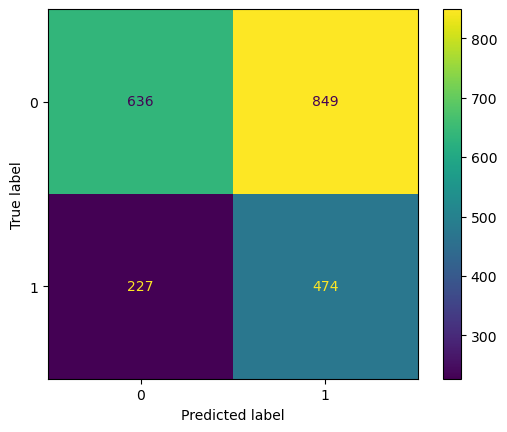

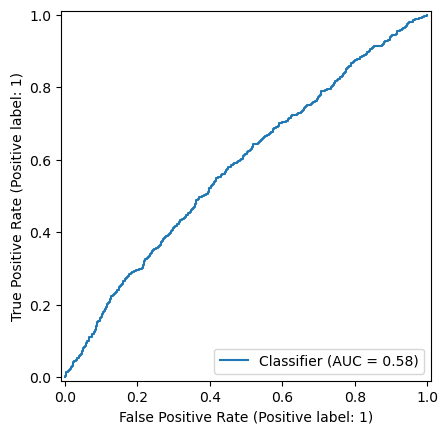

{0: 44, 1: 56} 34
Accuracy = 0.530192131747484
ROC AUC = 0.5805578370485646
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.48      0.58      1485
           1       0.37      0.64      0.47       701

    accuracy                           0.53      2186
   macro avg       0.55      0.56      0.52      2186
weighted avg       0.62      0.53      0.54      2186

Confusion Matrix:


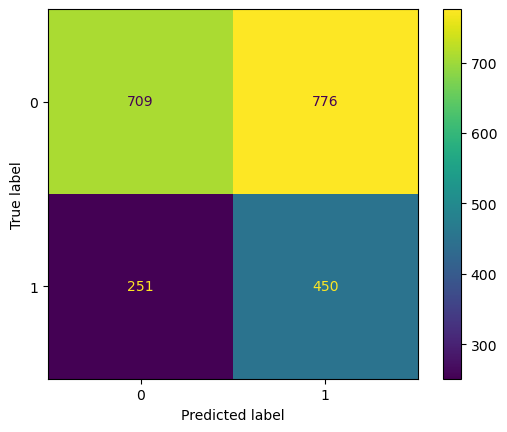

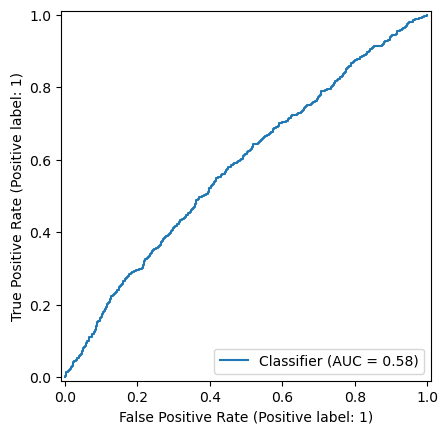

{0: 44, 1: 56} 35
Accuracy = 0.5393412625800549
ROC AUC = 0.5805578370485646
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.51      0.60      1485
           1       0.37      0.60      0.46       701

    accuracy                           0.54      2186
   macro avg       0.55      0.56      0.53      2186
weighted avg       0.61      0.54      0.55      2186

Confusion Matrix:


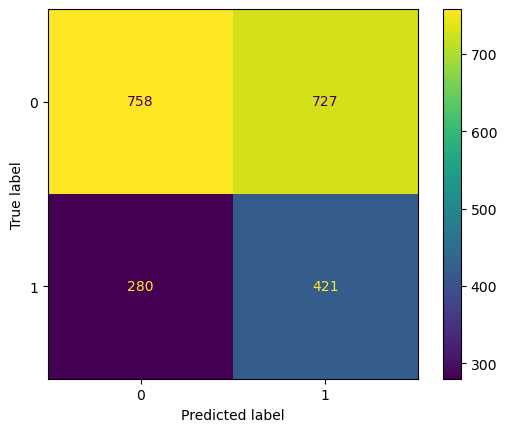

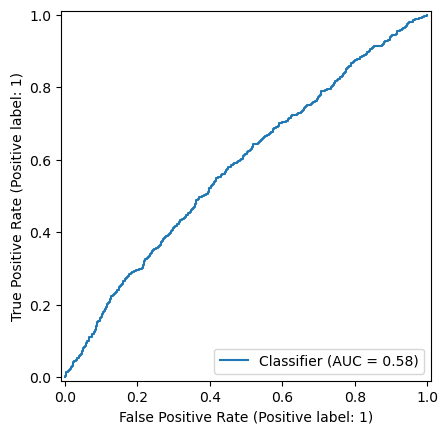

{0: 44, 1: 56} 36
Accuracy = 0.5631290027447392
ROC AUC = 0.5805578370485646
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.56      0.64      1485
           1       0.38      0.56      0.45       701

    accuracy                           0.56      2186
   macro avg       0.55      0.56      0.54      2186
weighted avg       0.62      0.56      0.58      2186

Confusion Matrix:


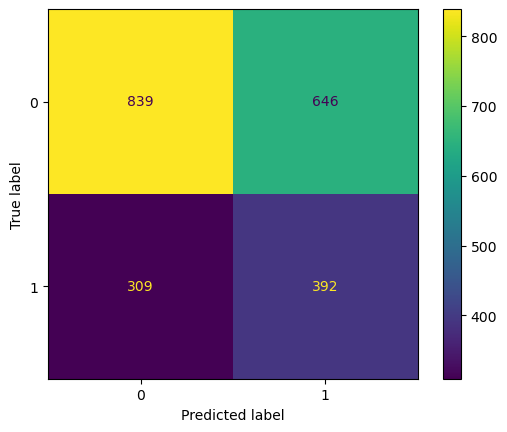

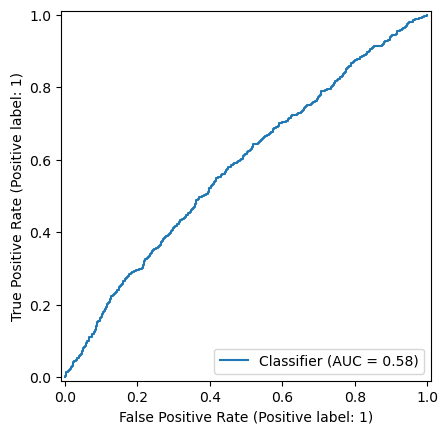

{0: 44, 1: 56} 37
Accuracy = 0.5745654162854529
ROC AUC = 0.5805578370485646
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.61      0.66      1485
           1       0.38      0.51      0.43       701

    accuracy                           0.57      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.61      0.57      0.59      2186

Confusion Matrix:


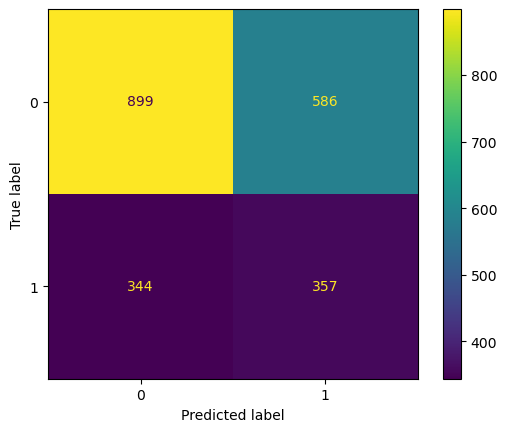

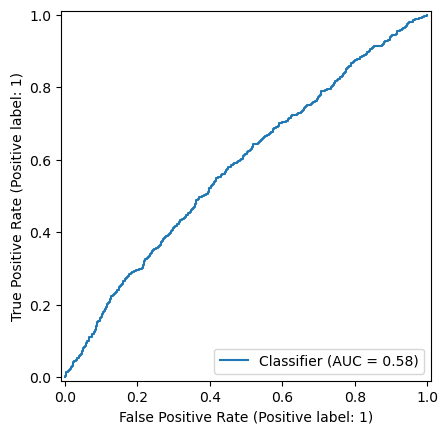

{0: 44, 1: 56} 38
Accuracy = 0.5896614821591949
ROC AUC = 0.5805578370485646
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.65      0.68      1485
           1       0.38      0.46      0.42       701

    accuracy                           0.59      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.61      0.59      0.60      2186

Confusion Matrix:


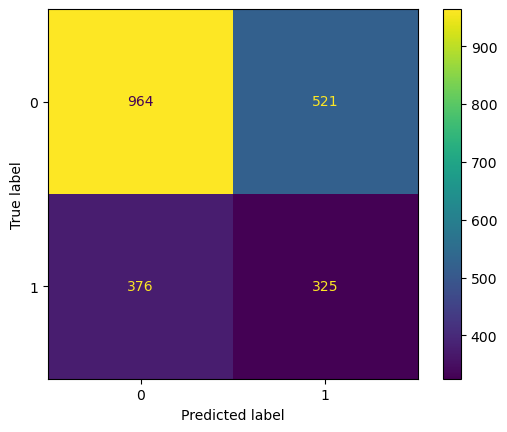

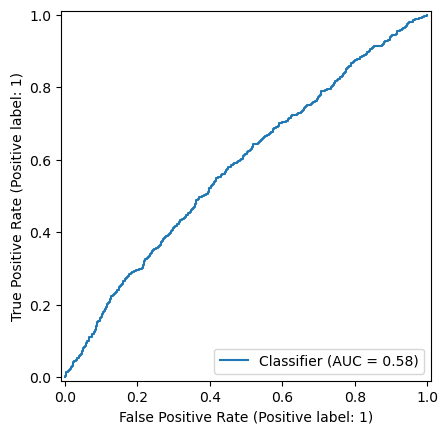

{0: 44, 1: 56} 39
Accuracy = 0.6047575480329369
ROC AUC = 0.5805578370485646
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.69      0.70      1485
           1       0.39      0.42      0.41       701

    accuracy                           0.60      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.61      0.60      0.61      2186

Confusion Matrix:


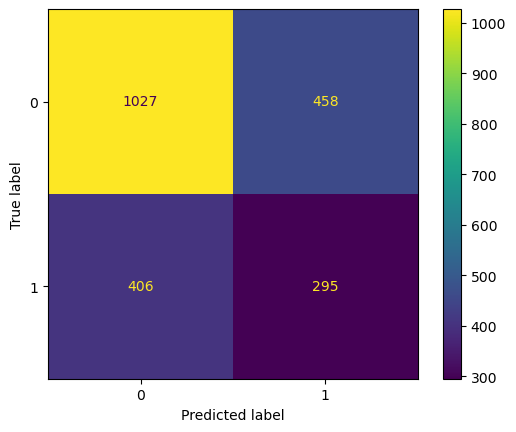

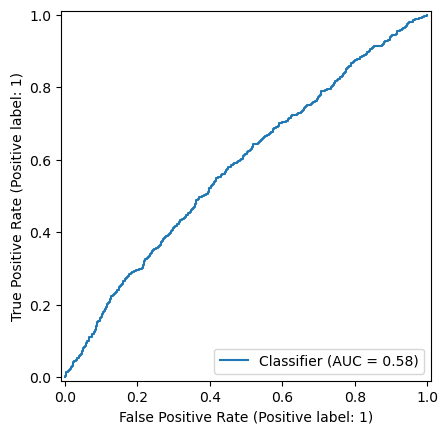

{0: 44, 1: 56} 40
Accuracy = 0.6152790484903934
ROC AUC = 0.5805578370485646
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.72      0.72      1485
           1       0.40      0.39      0.39       701

    accuracy                           0.62      2186
   macro avg       0.56      0.55      0.56      2186
weighted avg       0.61      0.62      0.61      2186

Confusion Matrix:


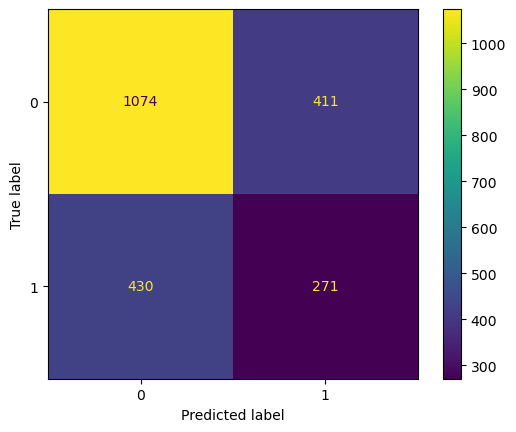

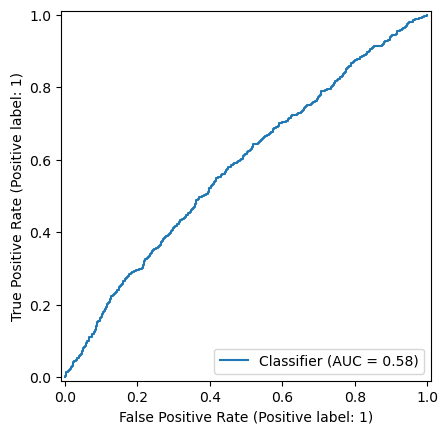

{0: 44, 1: 56} 41
Accuracy = 0.6267154620311071
ROC AUC = 0.5805578370485646
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.76      0.73      1485
           1       0.40      0.34      0.37       701

    accuracy                           0.63      2186
   macro avg       0.56      0.55      0.55      2186
weighted avg       0.61      0.63      0.62      2186

Confusion Matrix:


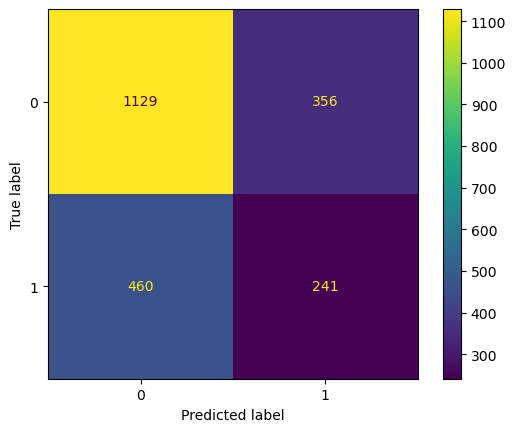

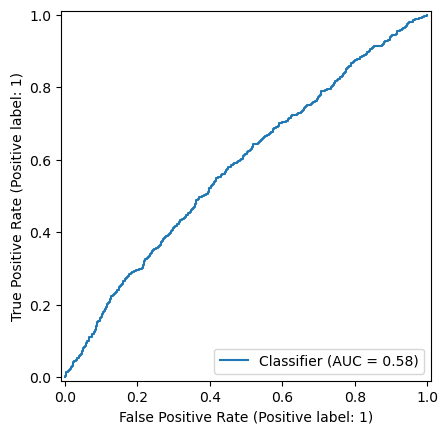

{0: 44, 1: 56} 42
Accuracy = 0.6303751143641354
ROC AUC = 0.5805578370485646
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.78      0.74      1485
           1       0.40      0.30      0.35       701

    accuracy                           0.63      2186
   macro avg       0.55      0.54      0.54      2186
weighted avg       0.61      0.63      0.62      2186

Confusion Matrix:


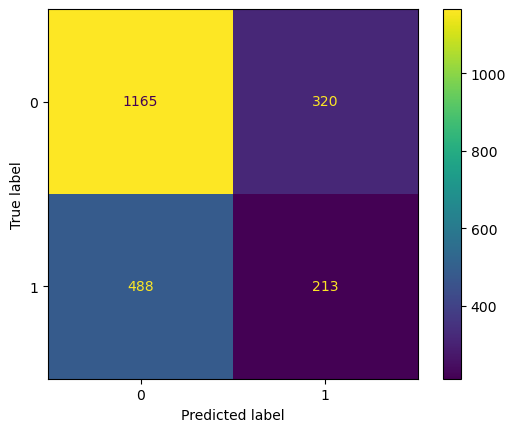

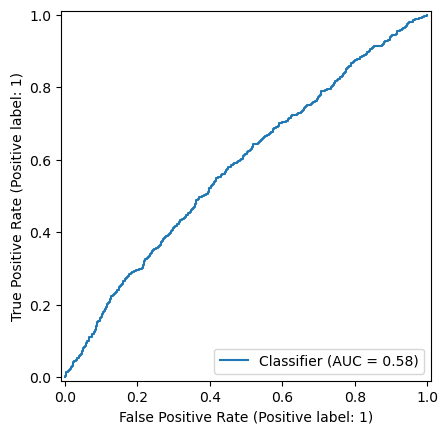

{0: 44, 1: 56} 43
Accuracy = 0.6505032021957914
ROC AUC = 0.5805578370485646
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.82      0.76      1485
           1       0.43      0.28      0.34       701

    accuracy                           0.65      2186
   macro avg       0.57      0.55      0.55      2186
weighted avg       0.62      0.65      0.63      2186

Confusion Matrix:


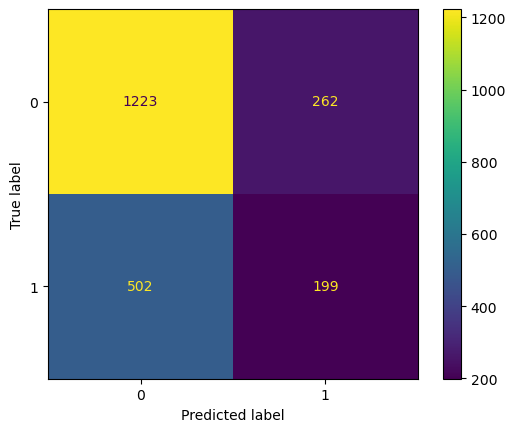

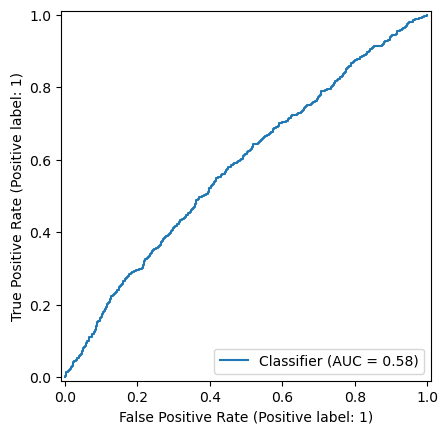

{0: 44, 1: 56} 44
Accuracy = 0.6559926806953339
ROC AUC = 0.5805578370485646
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.85      0.77      1485
           1       0.44      0.25      0.32       701

    accuracy                           0.66      2186
   macro avg       0.57      0.55      0.54      2186
weighted avg       0.62      0.66      0.63      2186

Confusion Matrix:


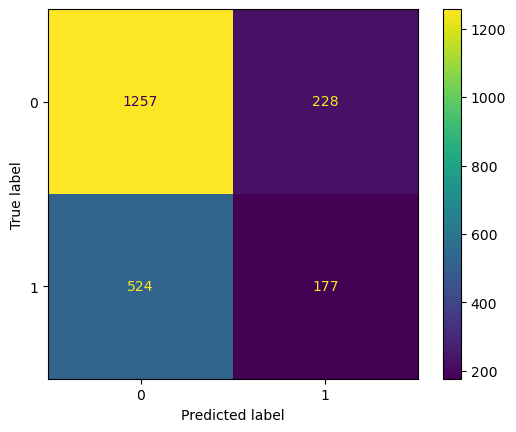

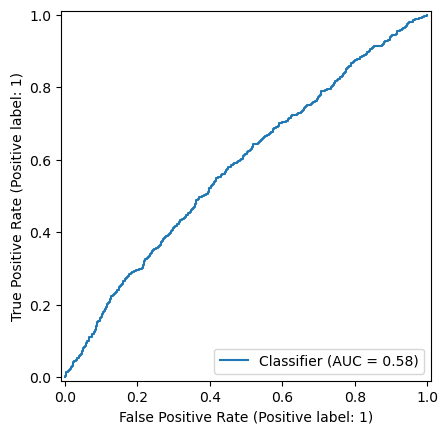

{0: 44, 1: 56} 45
Accuracy = 0.6619396157365051
ROC AUC = 0.5805578370485646
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.87      0.78      1485
           1       0.45      0.22      0.30       701

    accuracy                           0.66      2186
   macro avg       0.57      0.55      0.54      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


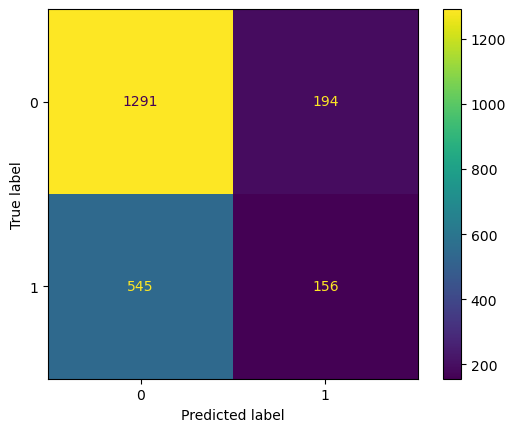

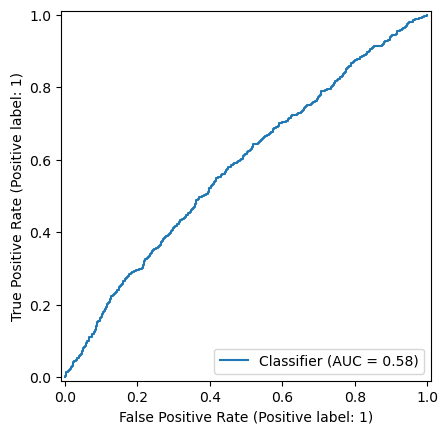

{0: 44, 1: 56} 46
Accuracy = 0.6633119853613907
ROC AUC = 0.5805578370485646
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.89      0.78      1485
           1       0.44      0.19      0.27       701

    accuracy                           0.66      2186
   macro avg       0.57      0.54      0.52      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


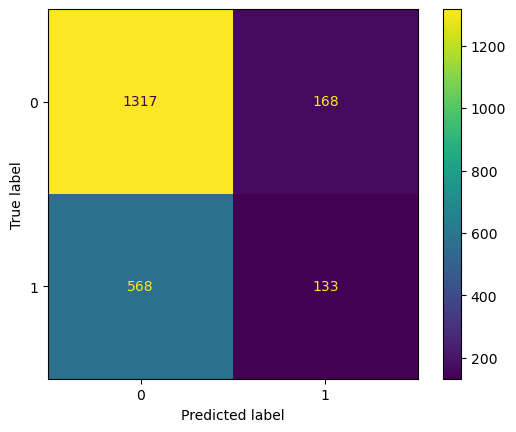

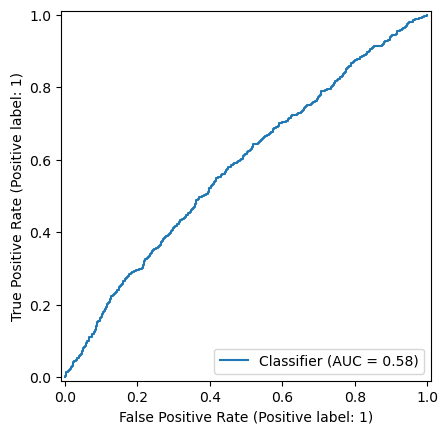

{0: 44, 1: 56} 47
Accuracy = 0.6646843549862763
ROC AUC = 0.5805578370485646
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.90      0.79      1485
           1       0.44      0.16      0.23       701

    accuracy                           0.66      2186
   macro avg       0.57      0.53      0.51      2186
weighted avg       0.61      0.66      0.61      2186

Confusion Matrix:


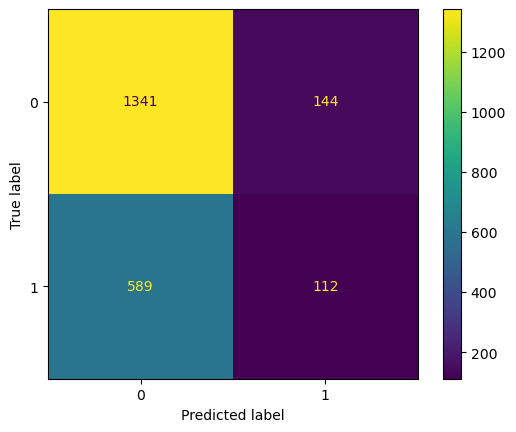

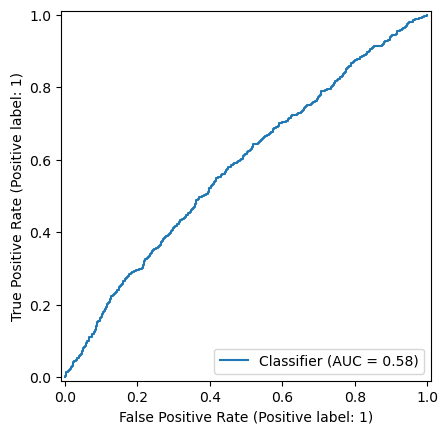

{0: 44, 1: 56} 48
Accuracy = 0.6651418115279049
ROC AUC = 0.5805578370485646
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.92      0.79      1485
           1       0.43      0.14      0.21       701

    accuracy                           0.67      2186
   macro avg       0.56      0.53      0.50      2186
weighted avg       0.61      0.67      0.60      2186

Confusion Matrix:


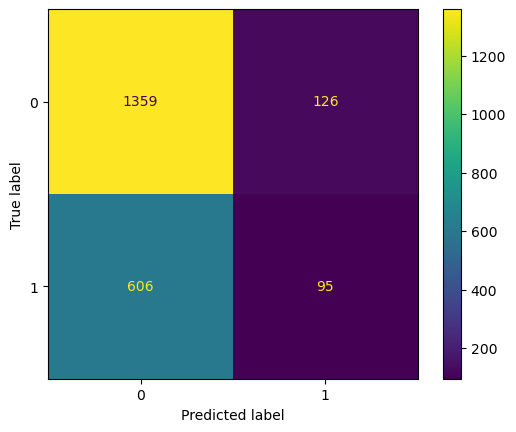

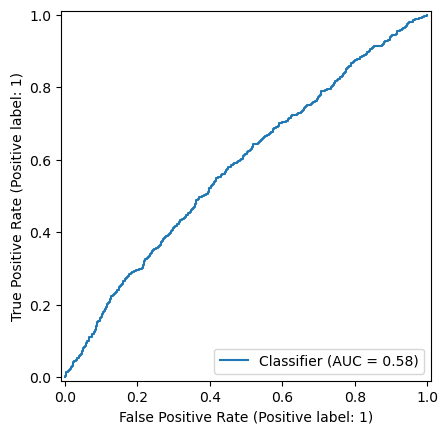

{0: 44, 1: 56} 49
Accuracy = 0.6688014638609332
ROC AUC = 0.5805578370485646
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.93      0.79      1485
           1       0.44      0.11      0.18       701

    accuracy                           0.67      2186
   macro avg       0.56      0.52      0.48      2186
weighted avg       0.61      0.67      0.59      2186

Confusion Matrix:


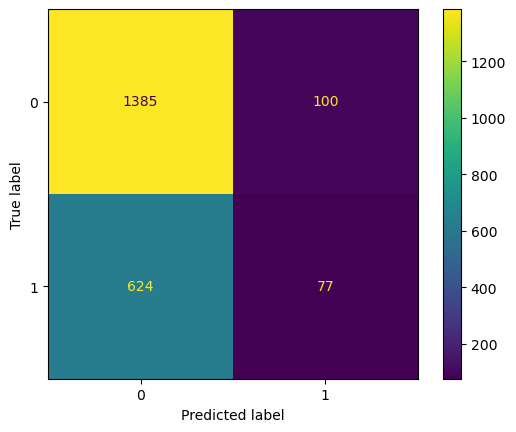

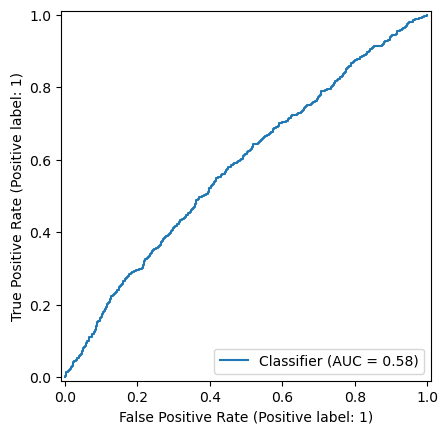

{0: 45, 1: 55} 30
Accuracy = 0.46431838975297346
ROC AUC = 0.580543427619034
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.33      0.46      1485
           1       0.35      0.75      0.47       701

    accuracy                           0.46      2186
   macro avg       0.54      0.54      0.46      2186
weighted avg       0.61      0.46      0.46      2186

Confusion Matrix:


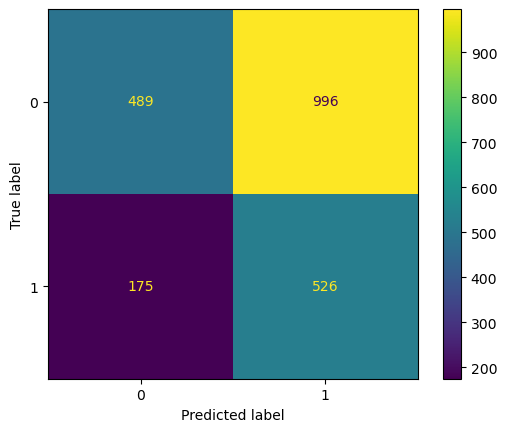

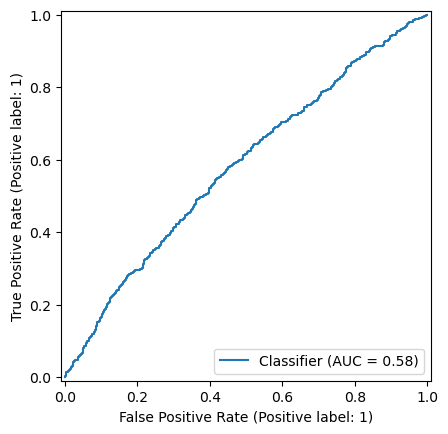

{0: 45, 1: 55} 31
Accuracy = 0.48581884720951507
ROC AUC = 0.580543427619034
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.38      0.50      1485
           1       0.35      0.72      0.47       701

    accuracy                           0.49      2186
   macro avg       0.55      0.55      0.49      2186
weighted avg       0.62      0.49      0.49      2186

Confusion Matrix:


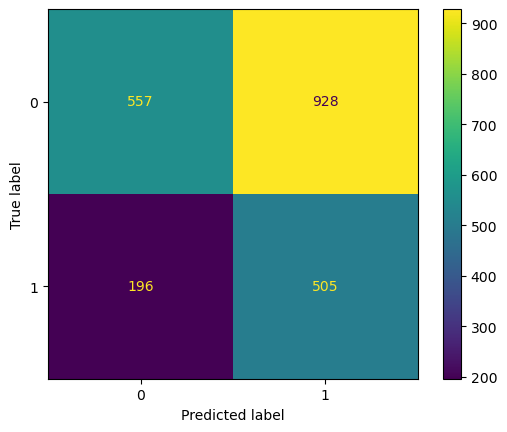

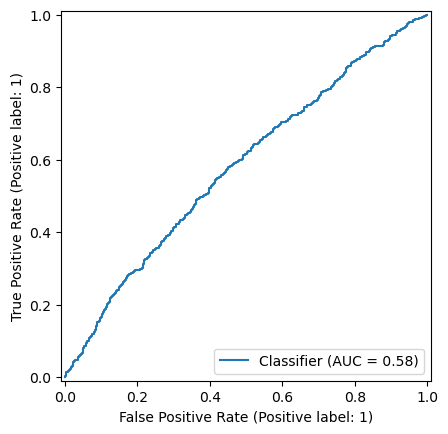

{0: 45, 1: 55} 32
Accuracy = 0.5077767612076852
ROC AUC = 0.580543427619034
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.43      0.54      1485
           1       0.36      0.68      0.47       701

    accuracy                           0.51      2186
   macro avg       0.55      0.55      0.51      2186
weighted avg       0.62      0.51      0.52      2186

Confusion Matrix:


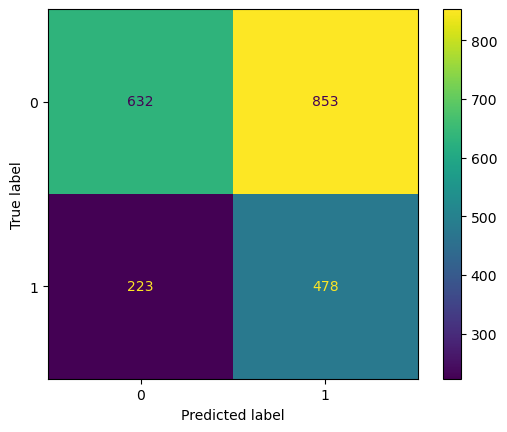

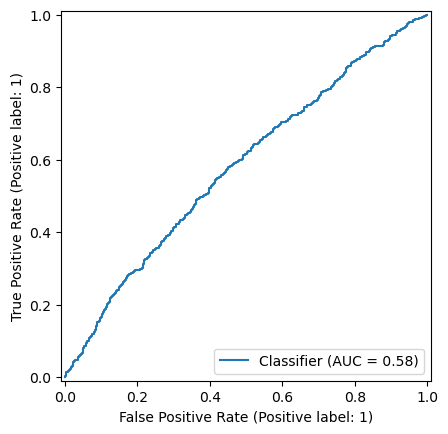

{0: 45, 1: 55} 33
Accuracy = 0.52516010978957
ROC AUC = 0.580543427619034
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.47      0.57      1485
           1       0.36      0.64      0.46       701

    accuracy                           0.53      2186
   macro avg       0.55      0.56      0.52      2186
weighted avg       0.62      0.53      0.54      2186

Confusion Matrix:


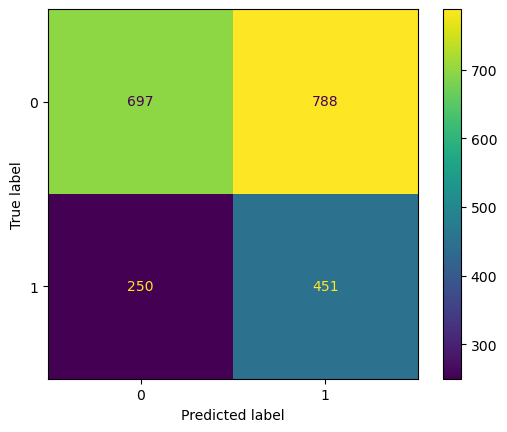

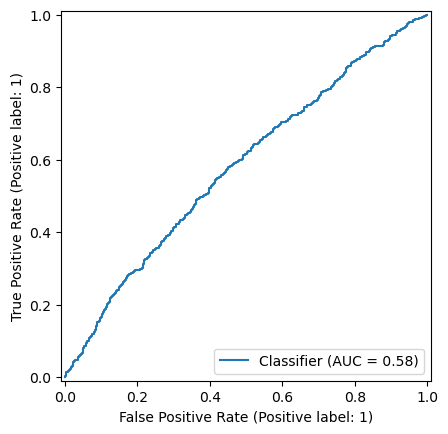

{0: 45, 1: 55} 34
Accuracy = 0.540256175663312
ROC AUC = 0.580543427619034
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.51      0.60      1485
           1       0.37      0.61      0.46       701

    accuracy                           0.54      2186
   macro avg       0.55      0.56      0.53      2186
weighted avg       0.62      0.54      0.55      2186

Confusion Matrix:


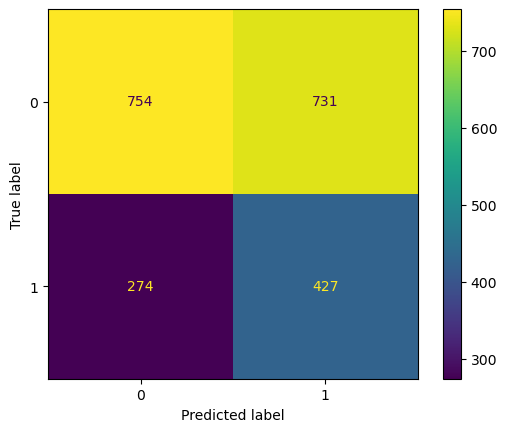

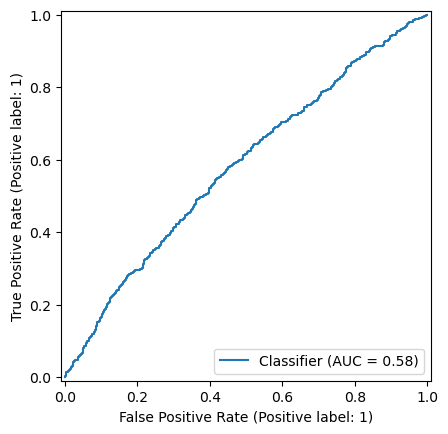

{0: 45, 1: 55} 35
Accuracy = 0.5608417200365965
ROC AUC = 0.580543427619034
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.56      0.63      1485
           1       0.38      0.56      0.45       701

    accuracy                           0.56      2186
   macro avg       0.55      0.56      0.54      2186
weighted avg       0.62      0.56      0.58      2186

Confusion Matrix:


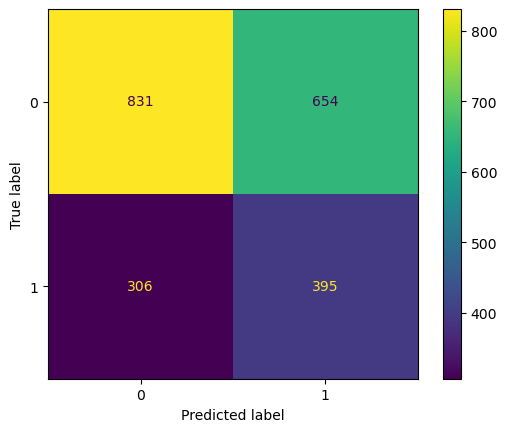

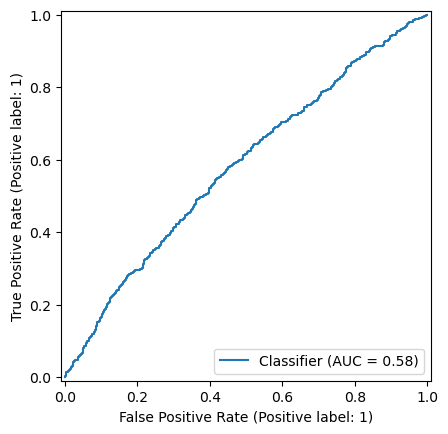

{0: 45, 1: 55} 36
Accuracy = 0.5741079597438243
ROC AUC = 0.580543427619034
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.60      0.66      1485
           1       0.38      0.51      0.44       701

    accuracy                           0.57      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.61      0.57      0.59      2186

Confusion Matrix:


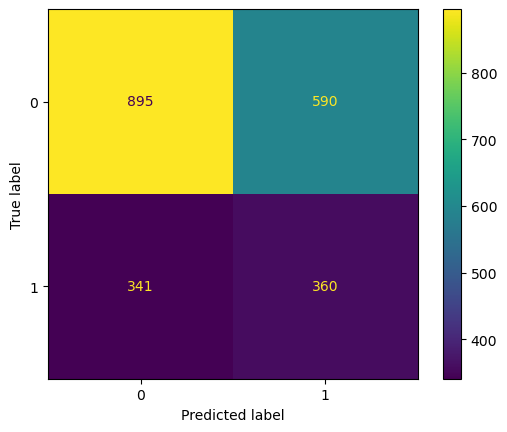

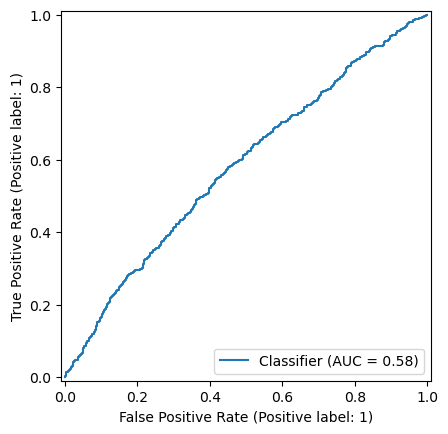

{0: 45, 1: 55} 37
Accuracy = 0.5887465690759378
ROC AUC = 0.580543427619034
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.65      0.68      1485
           1       0.38      0.47      0.42       701

    accuracy                           0.59      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.61      0.59      0.60      2186

Confusion Matrix:


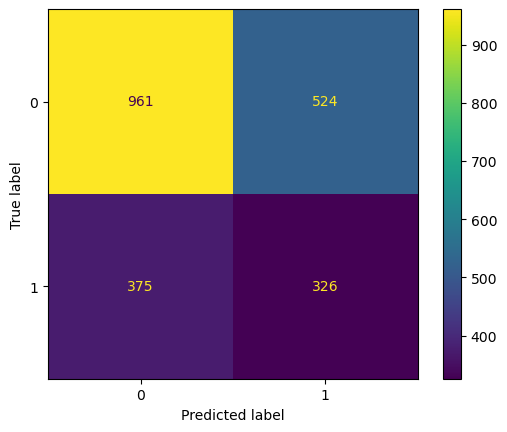

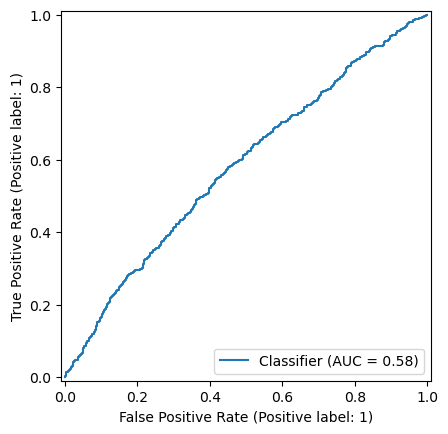

{0: 45, 1: 55} 38
Accuracy = 0.6043000914913084
ROC AUC = 0.580543427619034
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.69      0.70      1485
           1       0.39      0.42      0.41       701

    accuracy                           0.60      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.61      0.60      0.61      2186

Confusion Matrix:


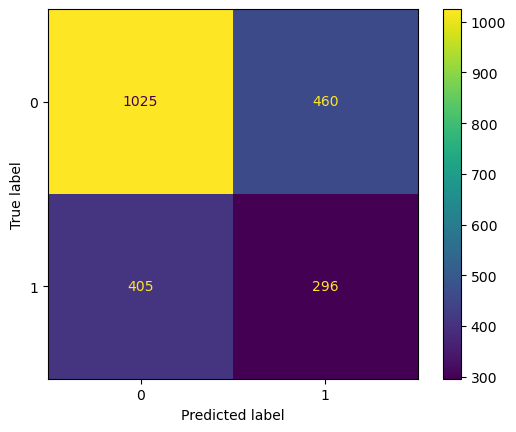

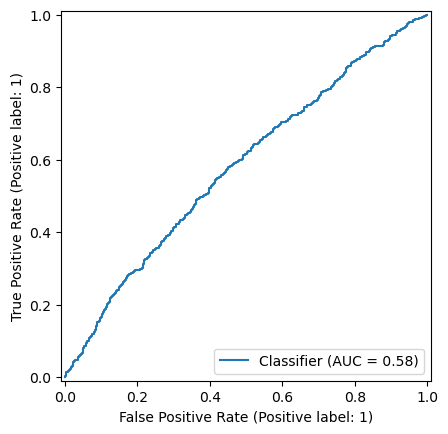

{0: 45, 1: 55} 39
Accuracy = 0.6134492223238792
ROC AUC = 0.580543427619034
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.72      0.72      1485
           1       0.39      0.39      0.39       701

    accuracy                           0.61      2186
   macro avg       0.55      0.55      0.55      2186
weighted avg       0.61      0.61      0.61      2186

Confusion Matrix:


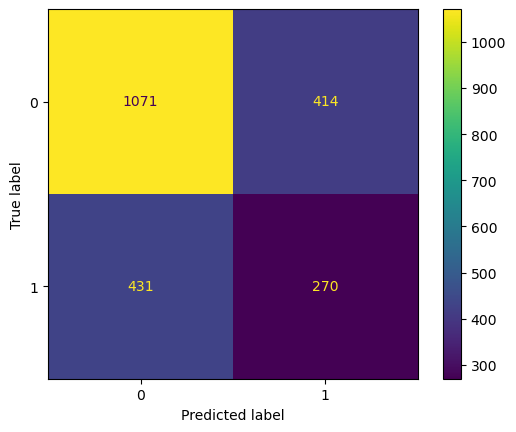

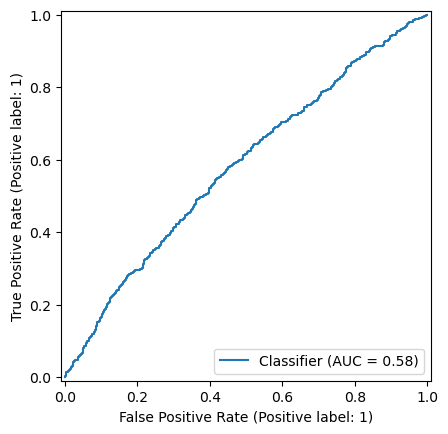

{0: 45, 1: 55} 40
Accuracy = 0.6267154620311071
ROC AUC = 0.580543427619034
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.76      0.73      1485
           1       0.40      0.34      0.37       701

    accuracy                           0.63      2186
   macro avg       0.56      0.55      0.55      2186
weighted avg       0.61      0.63      0.62      2186

Confusion Matrix:


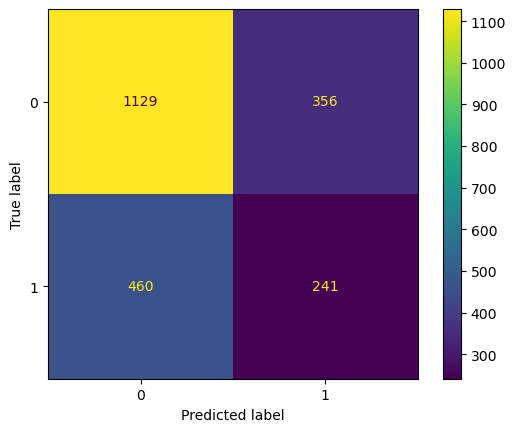

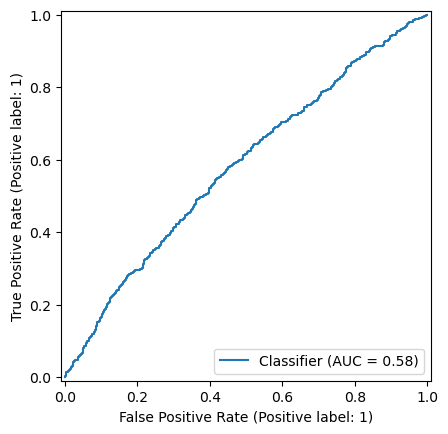

{0: 45, 1: 55} 41
Accuracy = 0.630832570905764
ROC AUC = 0.580543427619034
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.78      0.74      1485
           1       0.40      0.31      0.35       701

    accuracy                           0.63      2186
   macro avg       0.55      0.54      0.54      2186
weighted avg       0.61      0.63      0.62      2186

Confusion Matrix:


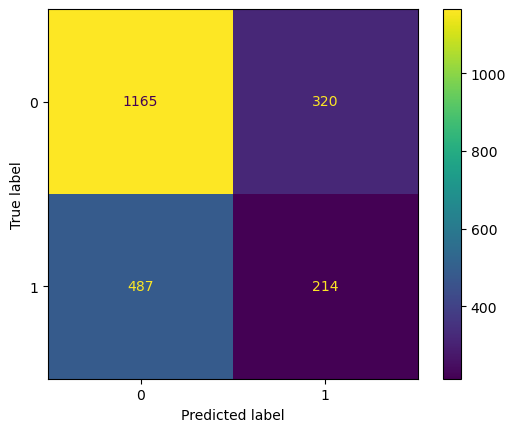

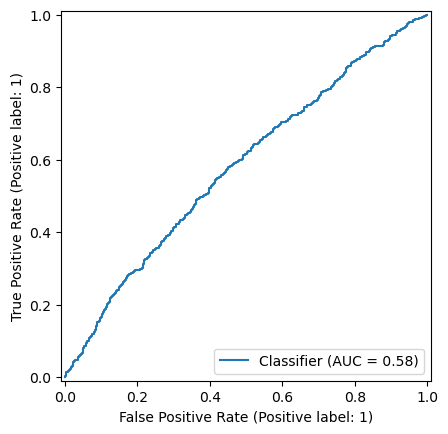

{0: 45, 1: 55} 42
Accuracy = 0.6495882891125343
ROC AUC = 0.580543427619034
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.82      0.76      1485
           1       0.43      0.28      0.34       701

    accuracy                           0.65      2186
   macro avg       0.57      0.55      0.55      2186
weighted avg       0.62      0.65      0.63      2186

Confusion Matrix:


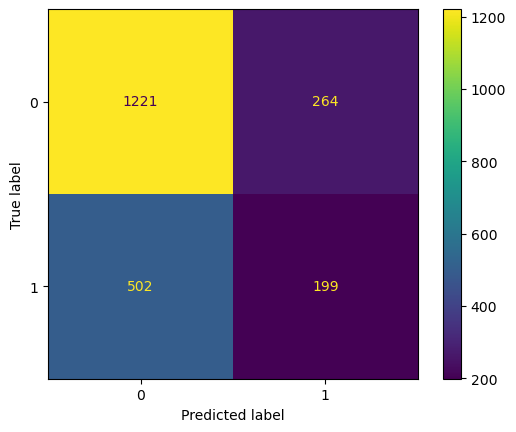

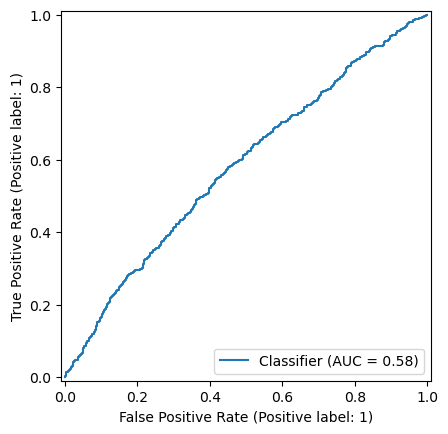

{0: 45, 1: 55} 43
Accuracy = 0.6559926806953339
ROC AUC = 0.580543427619034
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.85      0.77      1485
           1       0.44      0.25      0.32       701

    accuracy                           0.66      2186
   macro avg       0.57      0.55      0.54      2186
weighted avg       0.62      0.66      0.63      2186

Confusion Matrix:


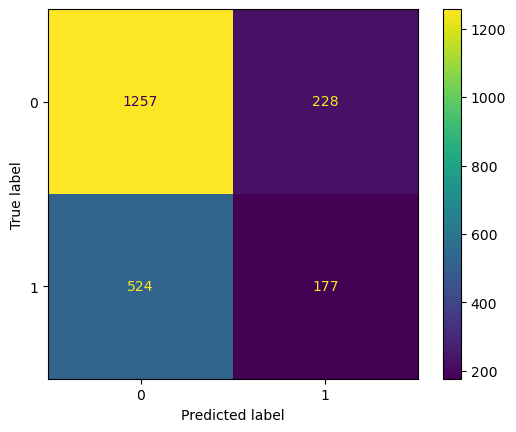

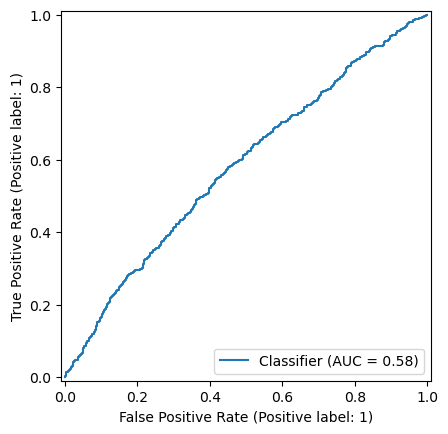

{0: 45, 1: 55} 44
Accuracy = 0.661024702653248
ROC AUC = 0.580543427619034
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.87      0.78      1485
           1       0.44      0.22      0.30       701

    accuracy                           0.66      2186
   macro avg       0.57      0.55      0.54      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


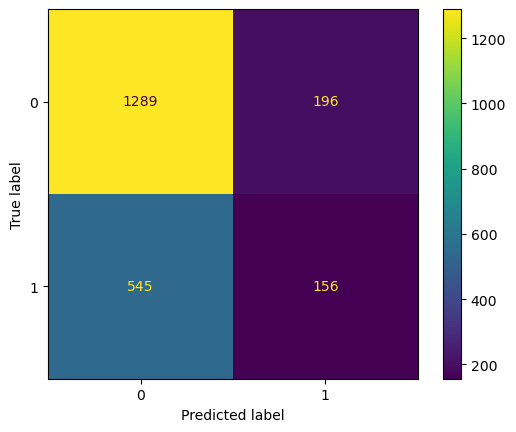

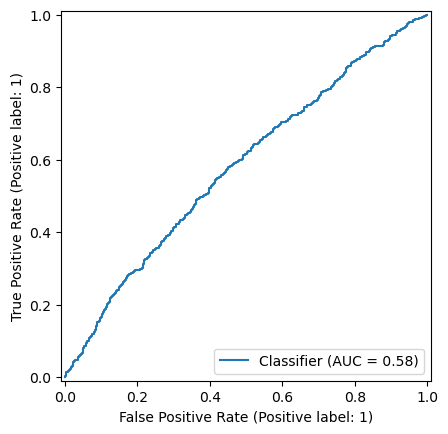

{0: 45, 1: 55} 45
Accuracy = 0.6633119853613907
ROC AUC = 0.580543427619034
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.89      0.78      1485
           1       0.44      0.19      0.27       701

    accuracy                           0.66      2186
   macro avg       0.57      0.54      0.52      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


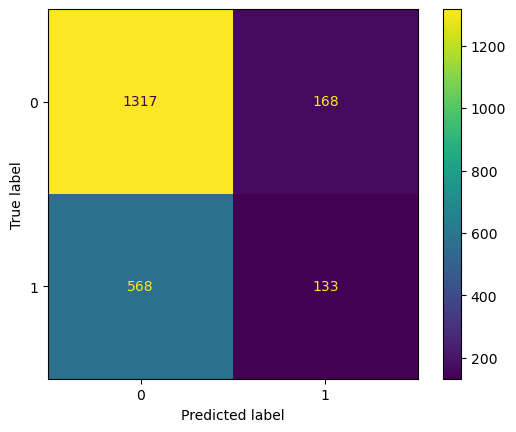

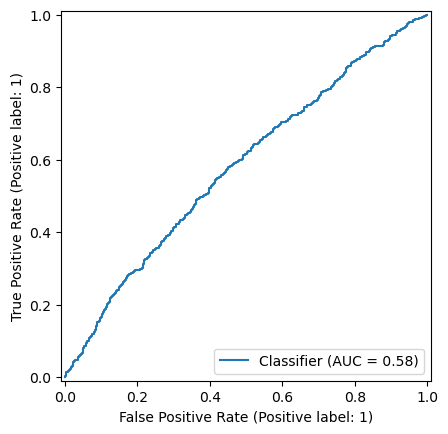

{0: 45, 1: 55} 46
Accuracy = 0.6651418115279049
ROC AUC = 0.580543427619034
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.90      0.79      1485
           1       0.44      0.16      0.24       701

    accuracy                           0.67      2186
   macro avg       0.57      0.53      0.51      2186
weighted avg       0.61      0.67      0.61      2186

Confusion Matrix:


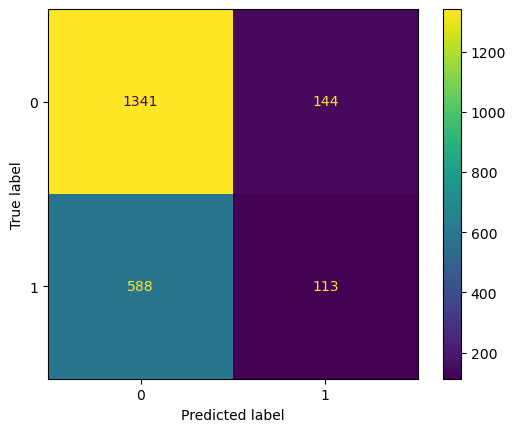

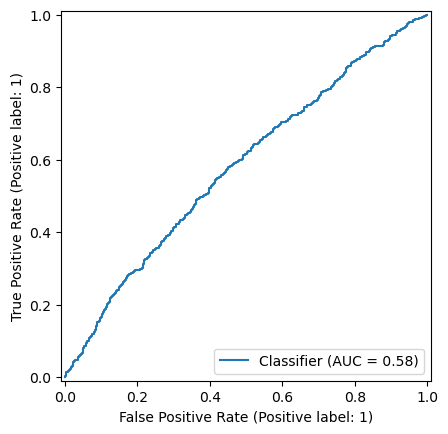

{0: 45, 1: 55} 47
Accuracy = 0.6642268984446478
ROC AUC = 0.580543427619034
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.91      0.79      1485
           1       0.43      0.13      0.20       701

    accuracy                           0.66      2186
   macro avg       0.56      0.52      0.50      2186
weighted avg       0.61      0.66      0.60      2186

Confusion Matrix:


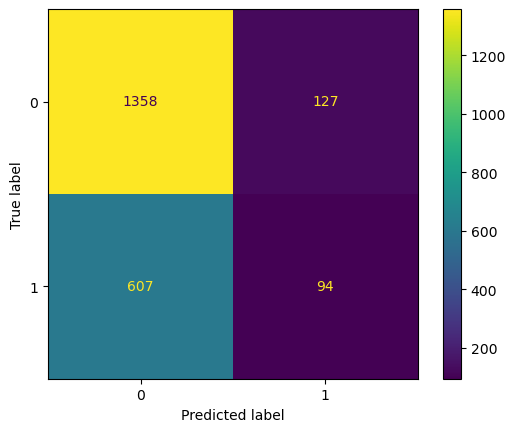

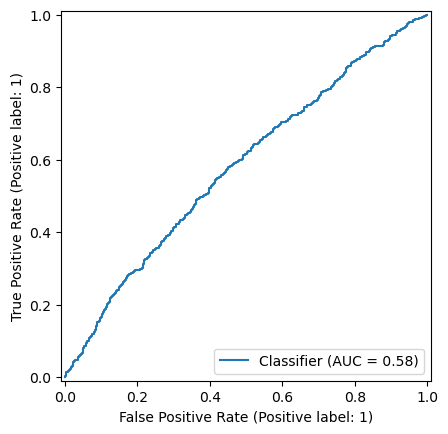

{0: 45, 1: 55} 48
Accuracy = 0.6683440073193047
ROC AUC = 0.580543427619034
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.93      0.79      1485
           1       0.43      0.11      0.17       701

    accuracy                           0.67      2186
   macro avg       0.56      0.52      0.48      2186
weighted avg       0.61      0.67      0.59      2186

Confusion Matrix:


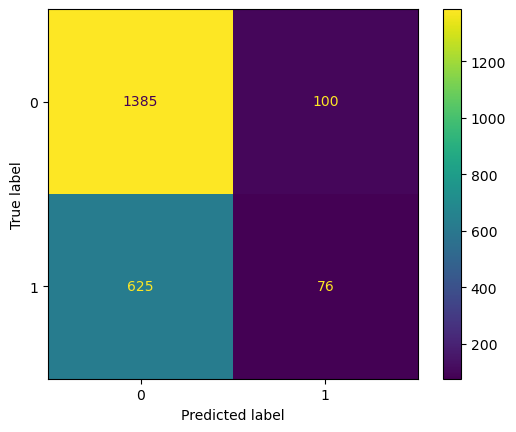

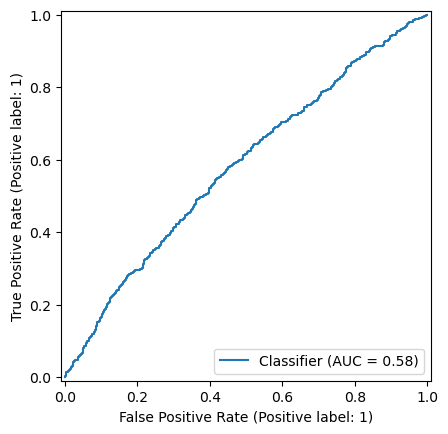

{0: 45, 1: 55} 49
Accuracy = 0.6683440073193047
ROC AUC = 0.580543427619034
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.94      0.79      1485
           1       0.42      0.09      0.15       701

    accuracy                           0.67      2186
   macro avg       0.55      0.52      0.47      2186
weighted avg       0.60      0.67      0.59      2186

Confusion Matrix:


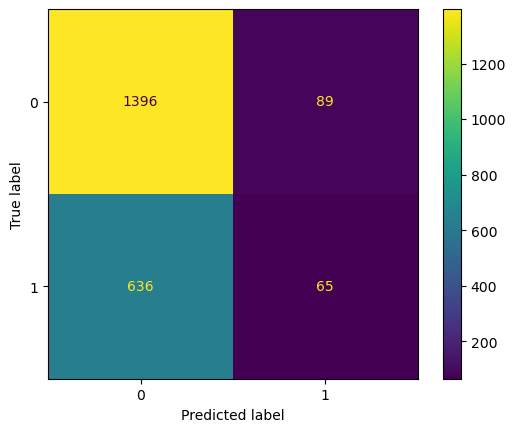

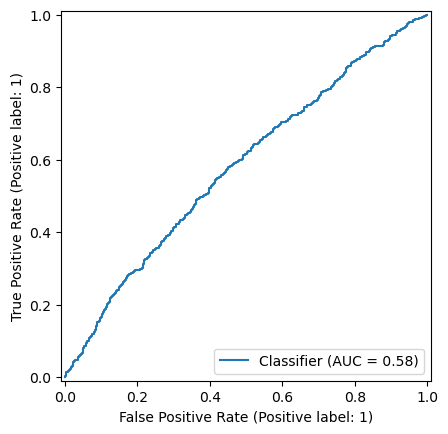

{0: 46, 1: 54} 30
Accuracy = 0.4853613906678865
ROC AUC = 0.5805837740217198
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.37      0.50      1485
           1       0.35      0.72      0.47       701

    accuracy                           0.49      2186
   macro avg       0.55      0.55      0.49      2186
weighted avg       0.62      0.49      0.49      2186

Confusion Matrix:


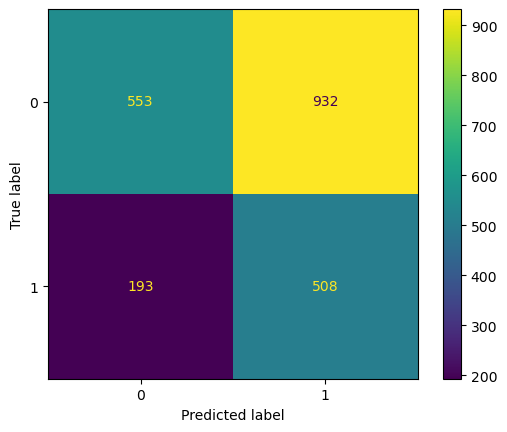

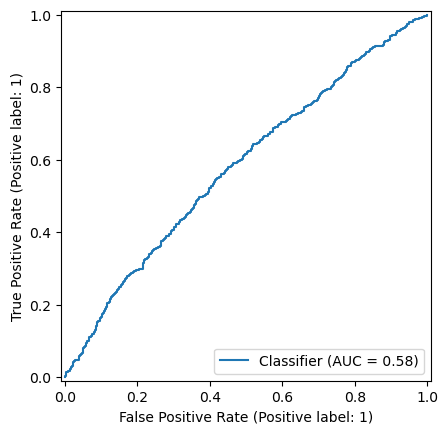

{0: 46, 1: 54} 31
Accuracy = 0.5054894784995425
ROC AUC = 0.5805837740217198
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.42      0.54      1485
           1       0.36      0.69      0.47       701

    accuracy                           0.51      2186
   macro avg       0.55      0.55      0.50      2186
weighted avg       0.62      0.51      0.51      2186

Confusion Matrix:


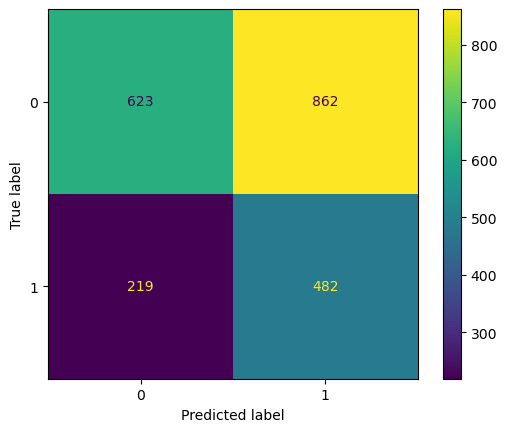

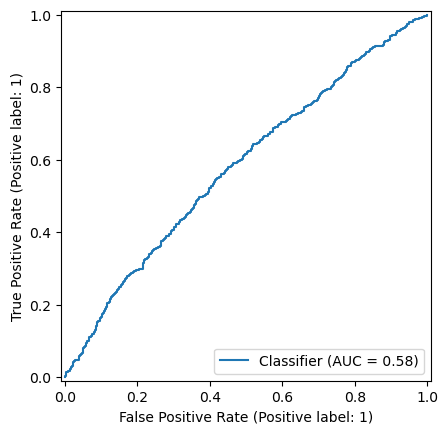

{0: 46, 1: 54} 32
Accuracy = 0.5233302836230558
ROC AUC = 0.5805837740217198
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.46      0.57      1485
           1       0.36      0.65      0.47       701

    accuracy                           0.52      2186
   macro avg       0.55      0.56      0.52      2186
weighted avg       0.62      0.52      0.54      2186

Confusion Matrix:


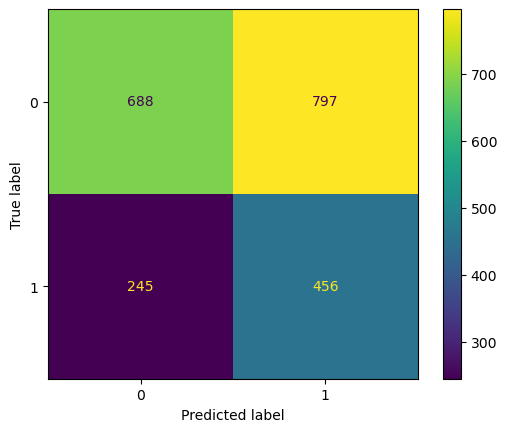

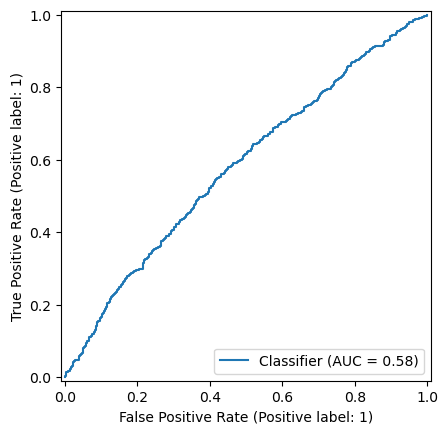

{0: 46, 1: 54} 33
Accuracy = 0.540256175663312
ROC AUC = 0.5805837740217198
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.51      0.60      1485
           1       0.37      0.61      0.46       701

    accuracy                           0.54      2186
   macro avg       0.55      0.56      0.53      2186
weighted avg       0.62      0.54      0.55      2186

Confusion Matrix:


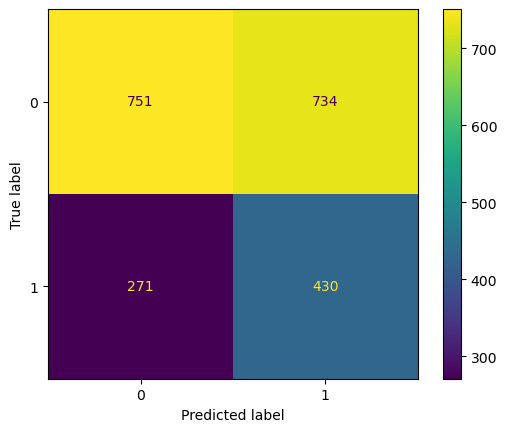

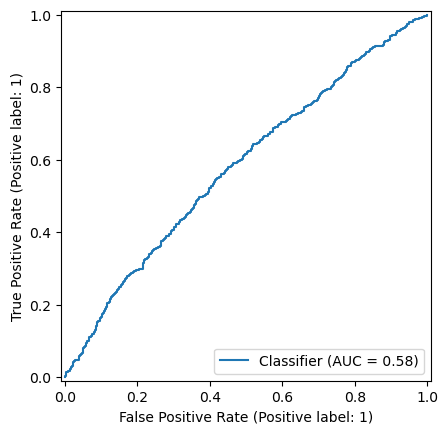

{0: 46, 1: 54} 34
Accuracy = 0.5594693504117109
ROC AUC = 0.5805837740217198
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.55      0.63      1485
           1       0.38      0.57      0.45       701

    accuracy                           0.56      2186
   macro avg       0.55      0.56      0.54      2186
weighted avg       0.62      0.56      0.57      2186

Confusion Matrix:


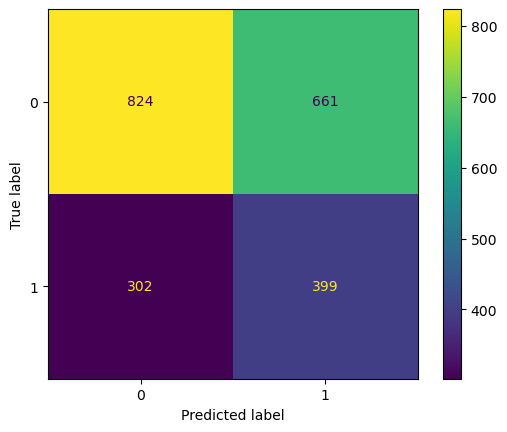

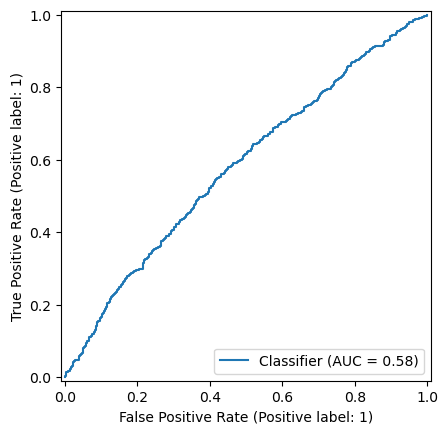

{0: 46, 1: 54} 35
Accuracy = 0.57548032936871
ROC AUC = 0.5805837740217198
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.60      0.66      1485
           1       0.38      0.52      0.44       701

    accuracy                           0.58      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.62      0.58      0.59      2186

Confusion Matrix:


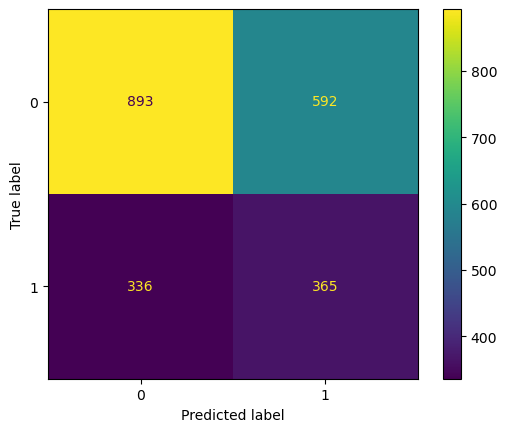

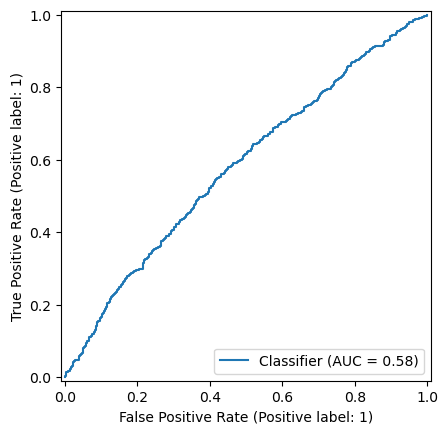

{0: 46, 1: 54} 36
Accuracy = 0.5882891125343093
ROC AUC = 0.5805837740217198
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.65      0.68      1485
           1       0.38      0.47      0.42       701

    accuracy                           0.59      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.61      0.59      0.60      2186

Confusion Matrix:


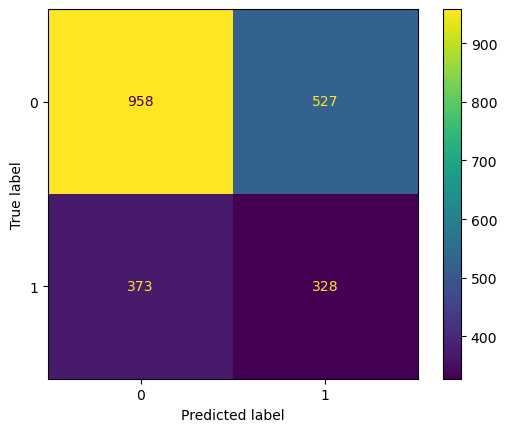

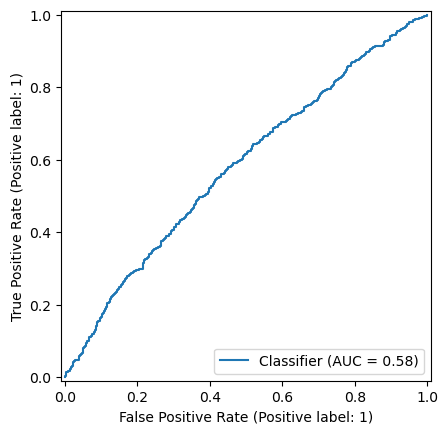

{0: 46, 1: 54} 37
Accuracy = 0.6024702653247942
ROC AUC = 0.5805837740217198
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.69      0.70      1485
           1       0.39      0.43      0.41       701

    accuracy                           0.60      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.61      0.60      0.61      2186

Confusion Matrix:


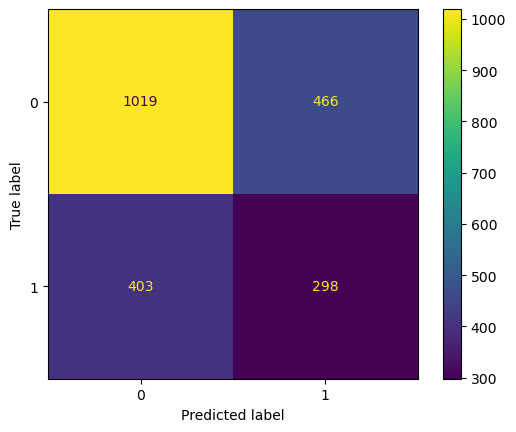

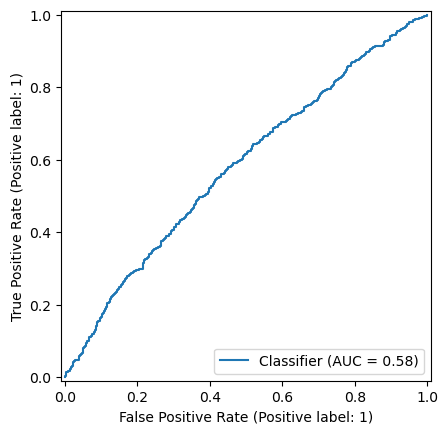

{0: 46, 1: 54} 38
Accuracy = 0.6134492223238792
ROC AUC = 0.5805837740217198
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.72      0.72      1485
           1       0.40      0.39      0.39       701

    accuracy                           0.61      2186
   macro avg       0.55      0.55      0.55      2186
weighted avg       0.61      0.61      0.61      2186

Confusion Matrix:


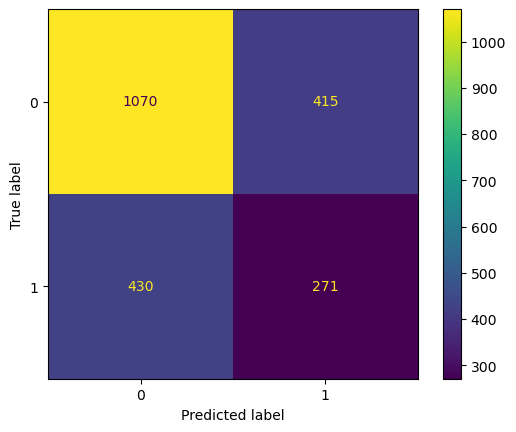

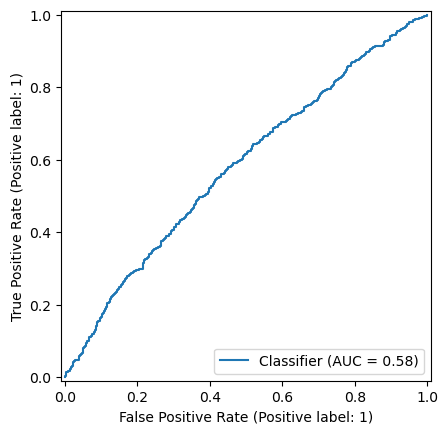

{0: 46, 1: 54} 39
Accuracy = 0.6262580054894785
ROC AUC = 0.5805837740217198
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.76      0.73      1485
           1       0.40      0.35      0.37       701

    accuracy                           0.63      2186
   macro avg       0.56      0.55      0.55      2186
weighted avg       0.61      0.63      0.62      2186

Confusion Matrix:


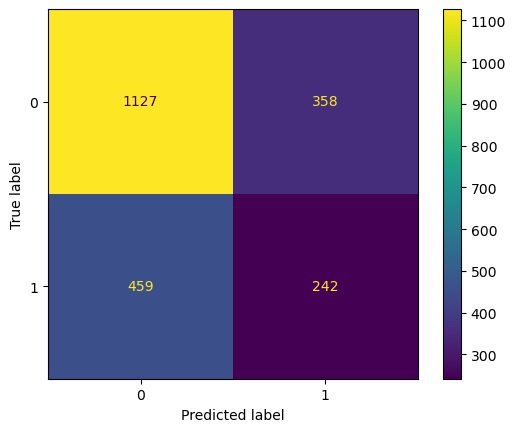

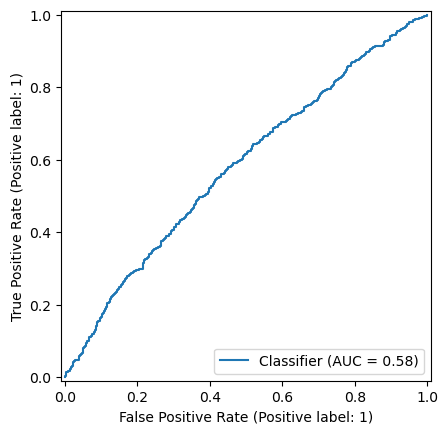

{0: 46, 1: 54} 40
Accuracy = 0.6303751143641354
ROC AUC = 0.5805837740217198
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.78      0.74      1485
           1       0.40      0.31      0.35       701

    accuracy                           0.63      2186
   macro avg       0.55      0.54      0.54      2186
weighted avg       0.61      0.63      0.62      2186

Confusion Matrix:


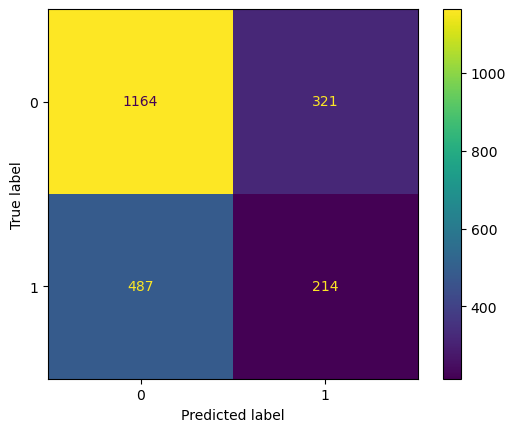

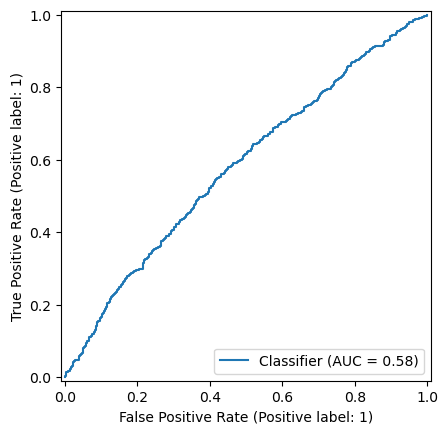

{0: 46, 1: 54} 41
Accuracy = 0.6486733760292772
ROC AUC = 0.5805837740217198
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.82      0.76      1485
           1       0.43      0.28      0.34       701

    accuracy                           0.65      2186
   macro avg       0.57      0.55      0.55      2186
weighted avg       0.62      0.65      0.63      2186

Confusion Matrix:


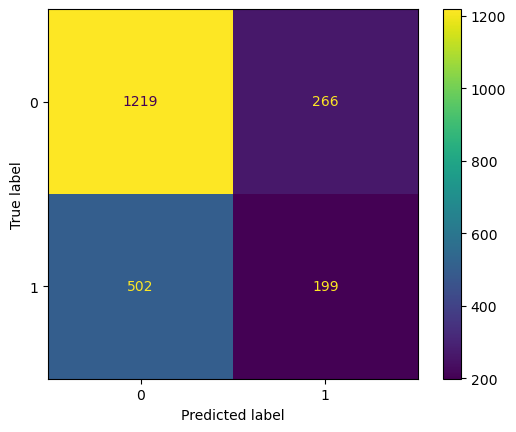

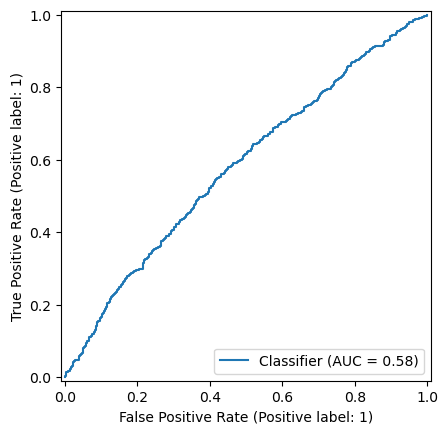

{0: 46, 1: 54} 42
Accuracy = 0.6559926806953339
ROC AUC = 0.5805837740217198
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.85      0.77      1485
           1       0.44      0.25      0.32       701

    accuracy                           0.66      2186
   macro avg       0.57      0.55      0.54      2186
weighted avg       0.62      0.66      0.63      2186

Confusion Matrix:


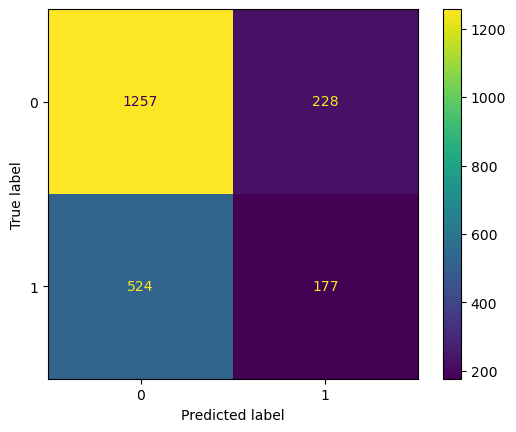

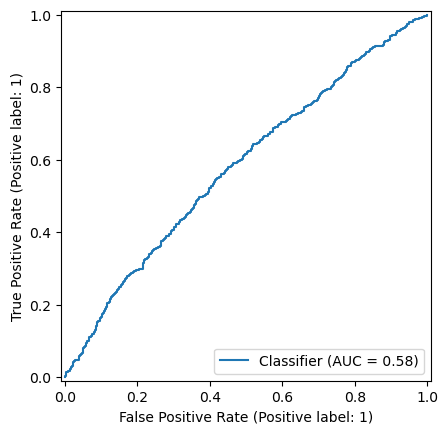

{0: 46, 1: 54} 43
Accuracy = 0.6619396157365051
ROC AUC = 0.5805837740217198
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.87      0.78      1485
           1       0.45      0.22      0.30       701

    accuracy                           0.66      2186
   macro avg       0.57      0.55      0.54      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


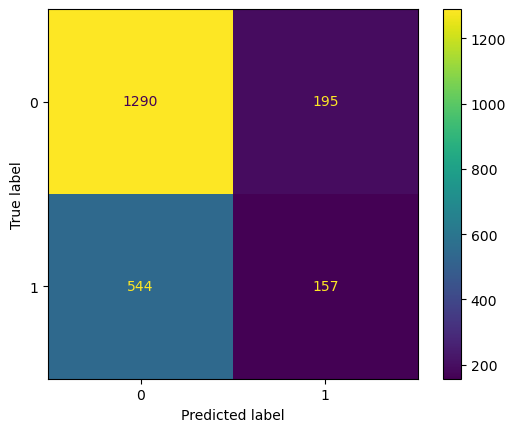

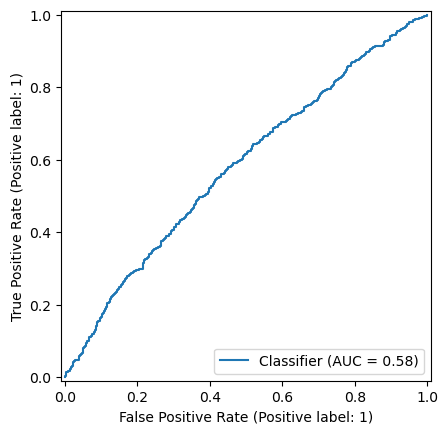

{0: 46, 1: 54} 44
Accuracy = 0.6633119853613907
ROC AUC = 0.5805837740217198
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.89      0.78      1485
           1       0.44      0.19      0.27       701

    accuracy                           0.66      2186
   macro avg       0.57      0.54      0.52      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


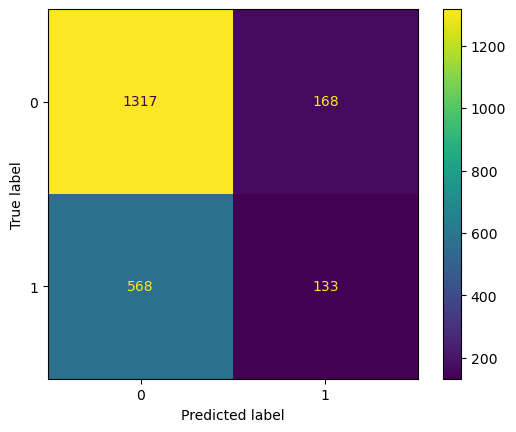

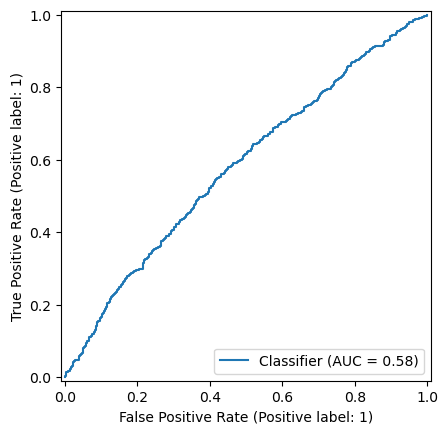

{0: 46, 1: 54} 45
Accuracy = 0.6651418115279049
ROC AUC = 0.5805837740217198
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.90      0.79      1485
           1       0.44      0.16      0.24       701

    accuracy                           0.67      2186
   macro avg       0.57      0.53      0.51      2186
weighted avg       0.61      0.67      0.61      2186

Confusion Matrix:


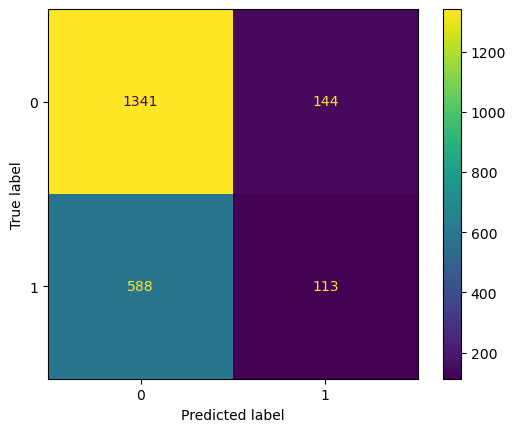

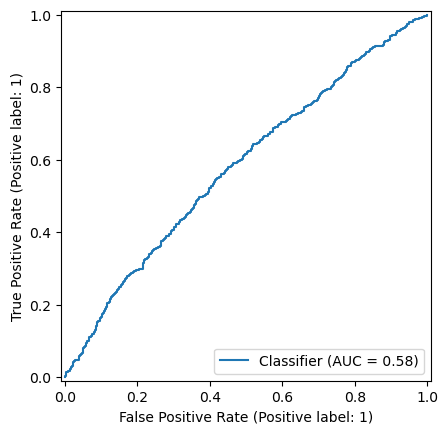

{0: 46, 1: 54} 46
Accuracy = 0.6637694419030192
ROC AUC = 0.5805837740217198
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.91      0.79      1485
           1       0.42      0.13      0.20       701

    accuracy                           0.66      2186
   macro avg       0.56      0.52      0.49      2186
weighted avg       0.60      0.66      0.60      2186

Confusion Matrix:


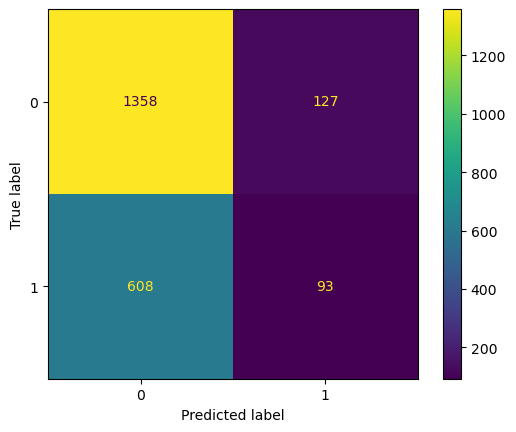

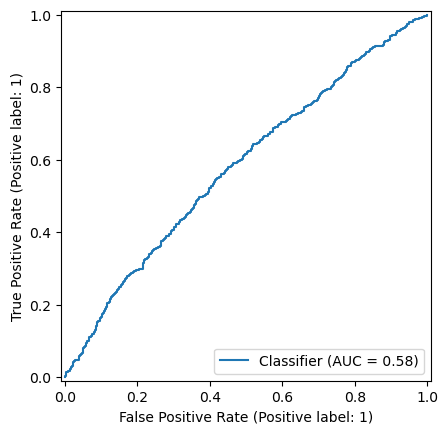

{0: 46, 1: 54} 47
Accuracy = 0.6688014638609332
ROC AUC = 0.5805837740217198
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.93      0.79      1485
           1       0.44      0.11      0.18       701

    accuracy                           0.67      2186
   macro avg       0.56      0.52      0.48      2186
weighted avg       0.61      0.67      0.59      2186

Confusion Matrix:


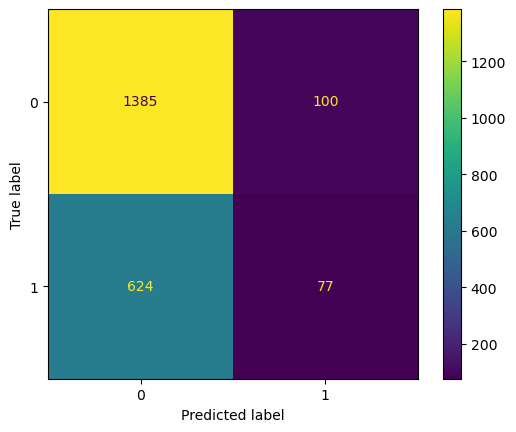

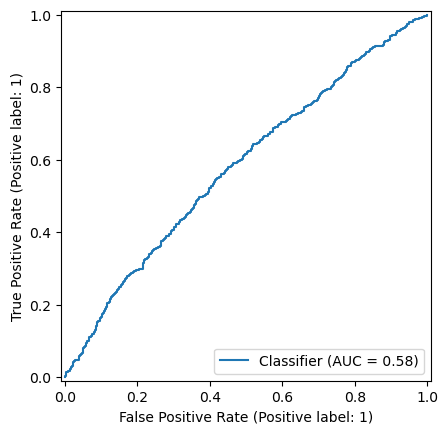

{0: 46, 1: 54} 48
Accuracy = 0.6688014638609332
ROC AUC = 0.5805837740217198
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.94      0.79      1485
           1       0.42      0.09      0.15       701

    accuracy                           0.67      2186
   macro avg       0.56      0.52      0.47      2186
weighted avg       0.60      0.67      0.59      2186

Confusion Matrix:


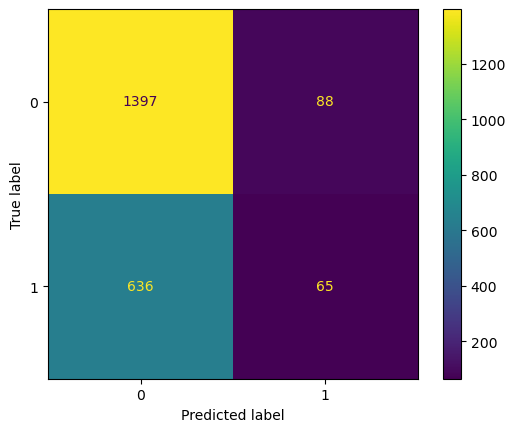

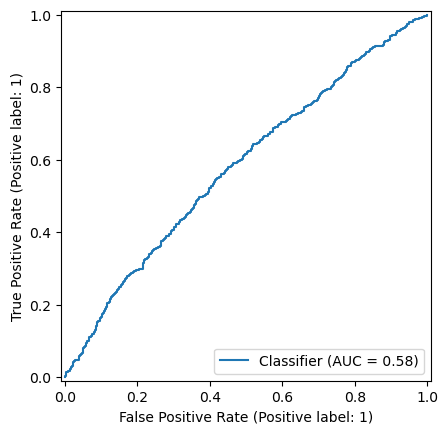

{0: 46, 1: 54} 49
Accuracy = 0.6706312900274474
ROC AUC = 0.5805837740217198
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.95      0.80      1485
           1       0.43      0.08      0.13       701

    accuracy                           0.67      2186
   macro avg       0.56      0.51      0.46      2186
weighted avg       0.60      0.67      0.58      2186

Confusion Matrix:


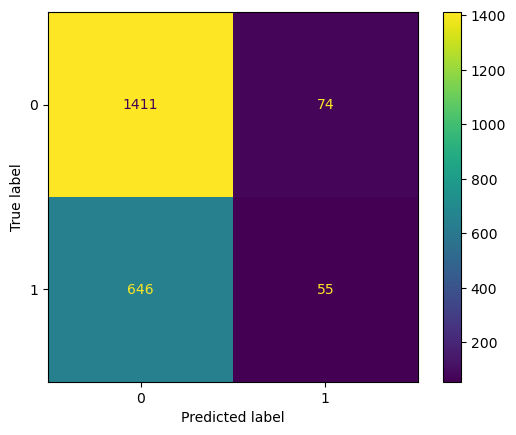

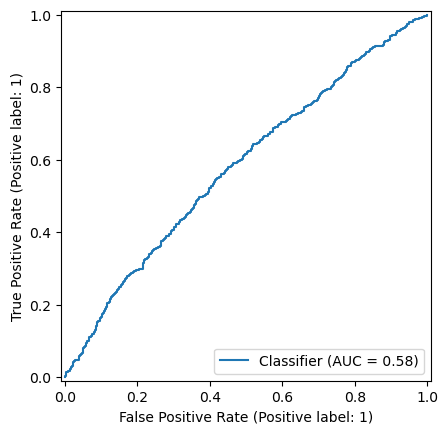

{0: 47, 1: 53} 30
Accuracy = 0.5027447392497713
ROC AUC = 0.5806750337420808
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.41      0.53      1485
           1       0.36      0.69      0.47       701

    accuracy                           0.50      2186
   macro avg       0.55      0.55      0.50      2186
weighted avg       0.62      0.50      0.51      2186

Confusion Matrix:


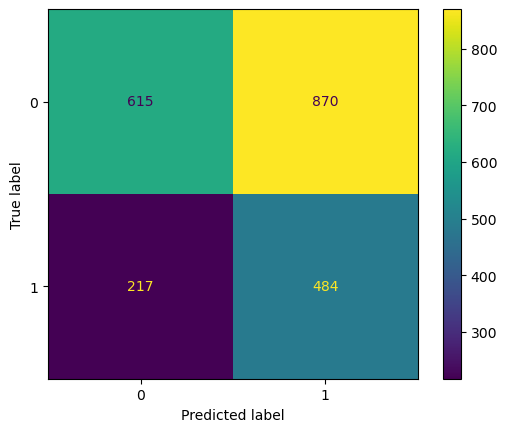

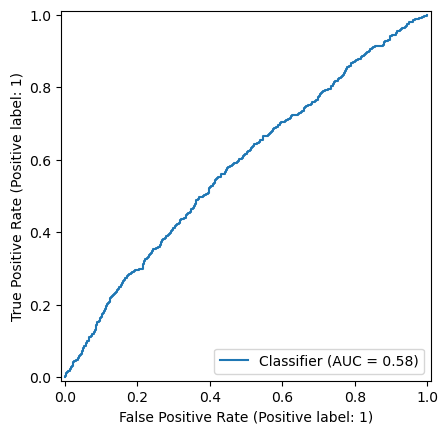

{0: 47, 1: 53} 31
Accuracy = 0.5205855443732845
ROC AUC = 0.5806750337420808
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.46      0.56      1485
           1       0.36      0.65      0.47       701

    accuracy                           0.52      2186
   macro avg       0.55      0.56      0.52      2186
weighted avg       0.62      0.52      0.53      2186

Confusion Matrix:


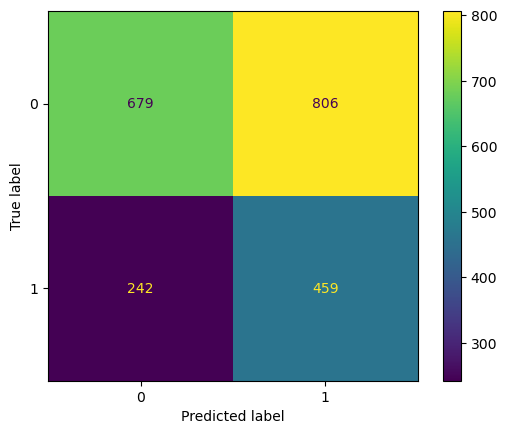

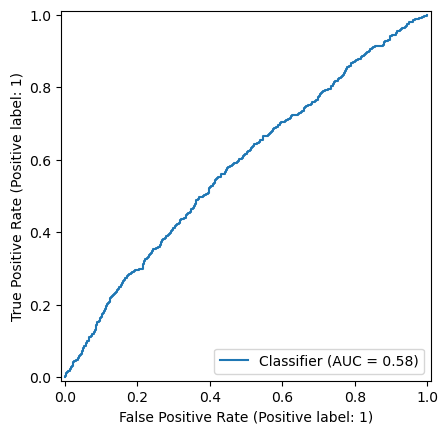

{0: 47, 1: 53} 32
Accuracy = 0.5379688929551693
ROC AUC = 0.5806750337420808
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.50      0.60      1485
           1       0.37      0.61      0.46       701

    accuracy                           0.54      2186
   macro avg       0.55      0.56      0.53      2186
weighted avg       0.62      0.54      0.55      2186

Confusion Matrix:


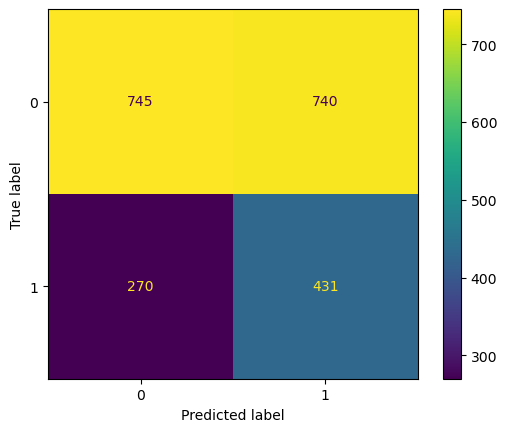

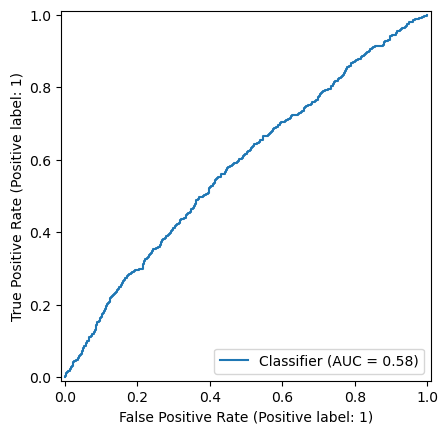

{0: 47, 1: 53} 33
Accuracy = 0.5599268069533394
ROC AUC = 0.5806750337420808
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.55      0.63      1485
           1       0.38      0.58      0.46       701

    accuracy                           0.56      2186
   macro avg       0.56      0.57      0.54      2186
weighted avg       0.62      0.56      0.57      2186

Confusion Matrix:


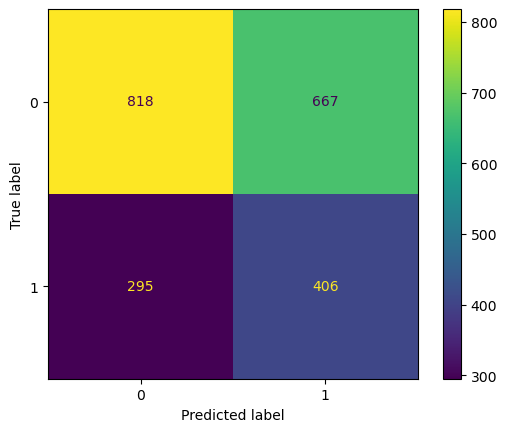

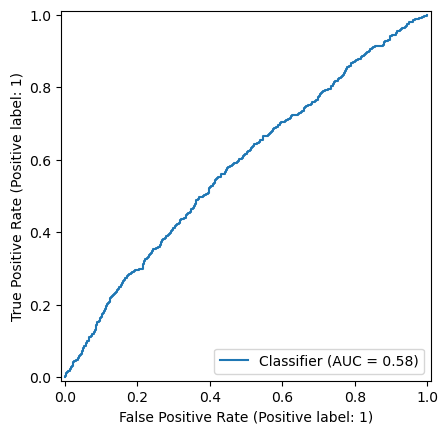

{0: 47, 1: 53} 34
Accuracy = 0.5741079597438243
ROC AUC = 0.5806750337420808
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.60      0.66      1485
           1       0.38      0.52      0.44       701

    accuracy                           0.57      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.62      0.57      0.59      2186

Confusion Matrix:


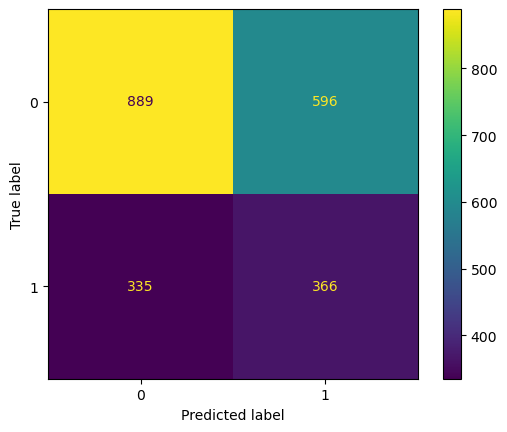

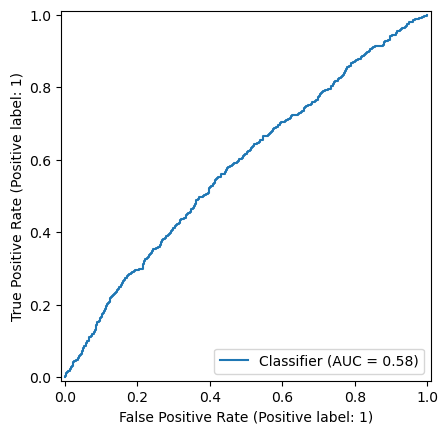

{0: 47, 1: 53} 35
Accuracy = 0.5878316559926807
ROC AUC = 0.5806750337420808
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.64      0.68      1485
           1       0.38      0.48      0.43       701

    accuracy                           0.59      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.61      0.59      0.60      2186

Confusion Matrix:


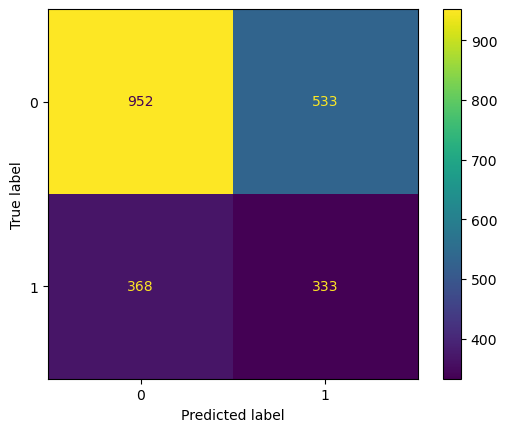

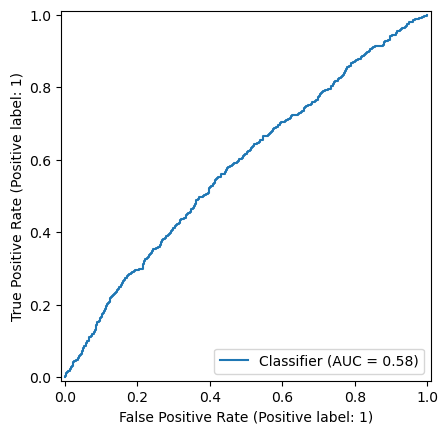

{0: 47, 1: 53} 36
Accuracy = 0.601555352241537
ROC AUC = 0.5806750337420808
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.68      0.70      1485
           1       0.39      0.43      0.41       701

    accuracy                           0.60      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.61      0.60      0.61      2186

Confusion Matrix:


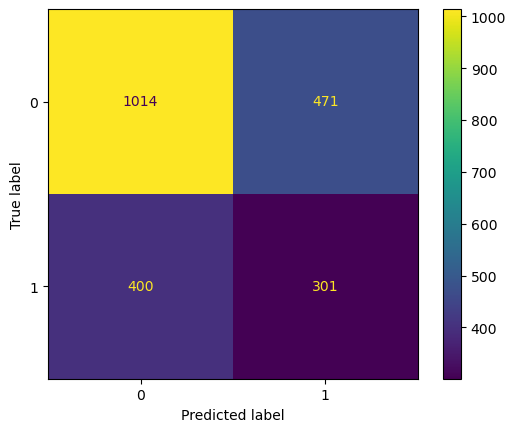

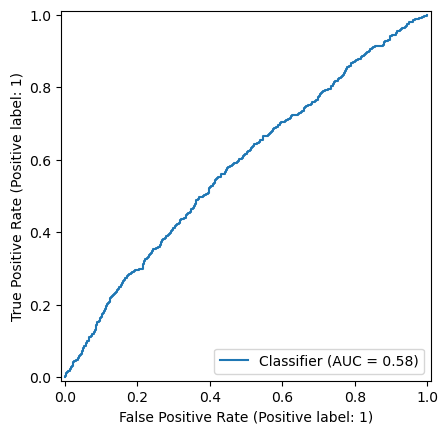

{0: 47, 1: 53} 37
Accuracy = 0.6139066788655078
ROC AUC = 0.5806750337420808
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.72      0.72      1485
           1       0.40      0.39      0.39       701

    accuracy                           0.61      2186
   macro avg       0.55      0.55      0.55      2186
weighted avg       0.61      0.61      0.61      2186

Confusion Matrix:


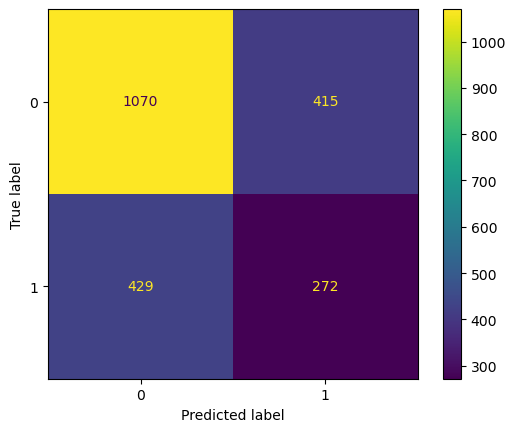

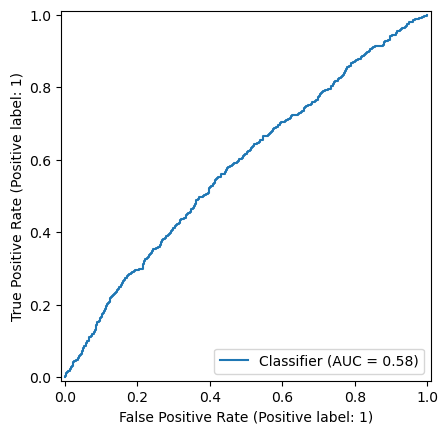

{0: 47, 1: 53} 38
Accuracy = 0.62580054894785
ROC AUC = 0.5806750337420808
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.76      0.73      1485
           1       0.40      0.35      0.37       701

    accuracy                           0.63      2186
   macro avg       0.56      0.55      0.55      2186
weighted avg       0.61      0.63      0.62      2186

Confusion Matrix:


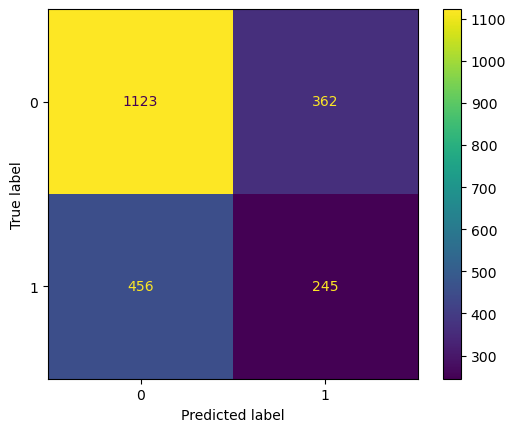

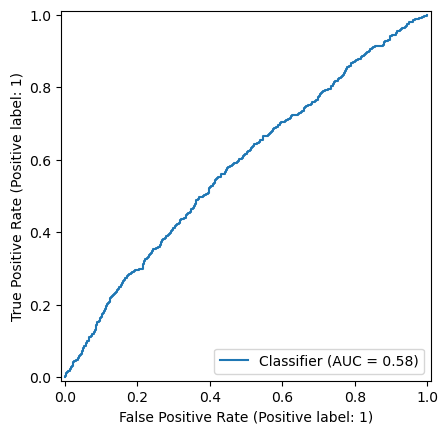

{0: 47, 1: 53} 39
Accuracy = 0.630832570905764
ROC AUC = 0.5806750337420808
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.78      0.74      1485
           1       0.40      0.31      0.35       701

    accuracy                           0.63      2186
   macro avg       0.55      0.55      0.55      2186
weighted avg       0.61      0.63      0.62      2186

Confusion Matrix:


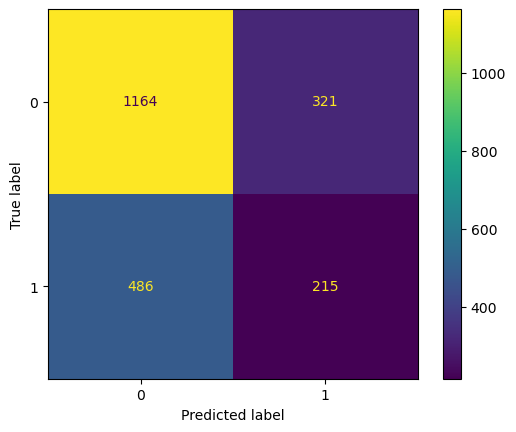

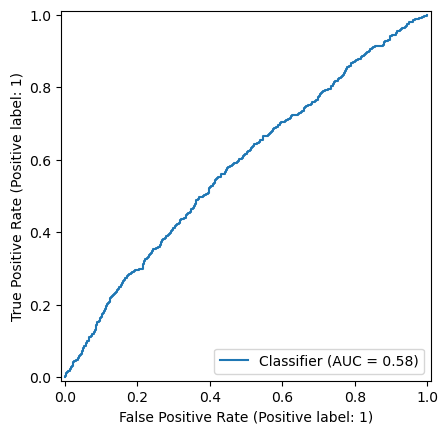

{0: 47, 1: 53} 40
Accuracy = 0.6491308325709058
ROC AUC = 0.5806750337420808
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.82      0.76      1485
           1       0.43      0.29      0.34       701

    accuracy                           0.65      2186
   macro avg       0.57      0.55      0.55      2186
weighted avg       0.62      0.65      0.63      2186

Confusion Matrix:


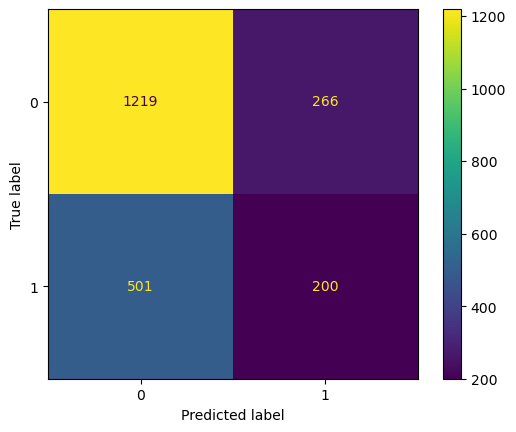

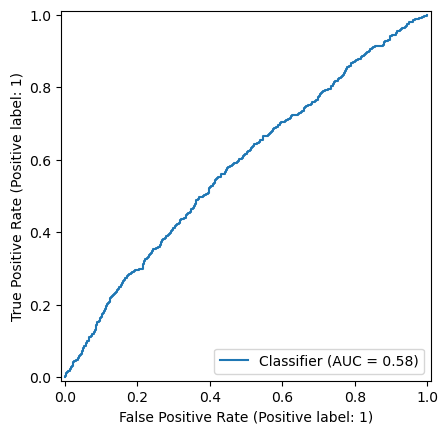

{0: 47, 1: 53} 41
Accuracy = 0.6555352241537054
ROC AUC = 0.5806750337420808
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.85      0.77      1485
           1       0.44      0.25      0.32       701

    accuracy                           0.66      2186
   macro avg       0.57      0.55      0.54      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


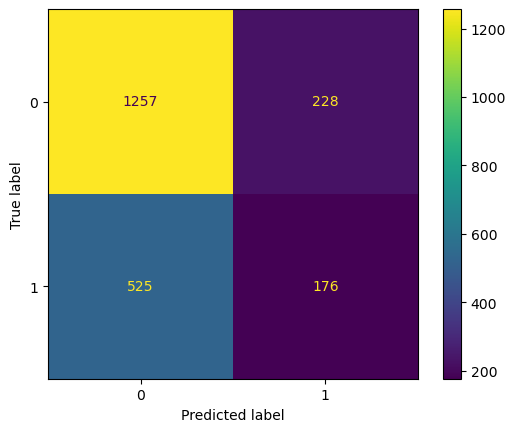

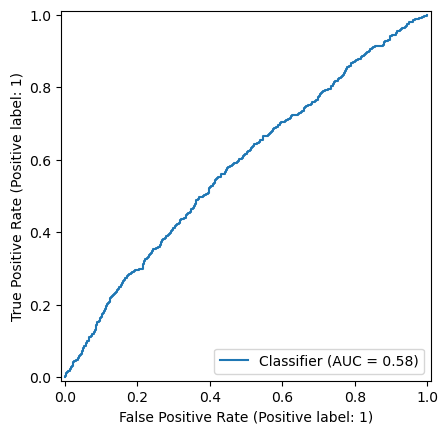

{0: 47, 1: 53} 42
Accuracy = 0.661024702653248
ROC AUC = 0.5806750337420808
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.87      0.78      1485
           1       0.44      0.22      0.30       701

    accuracy                           0.66      2186
   macro avg       0.57      0.55      0.54      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


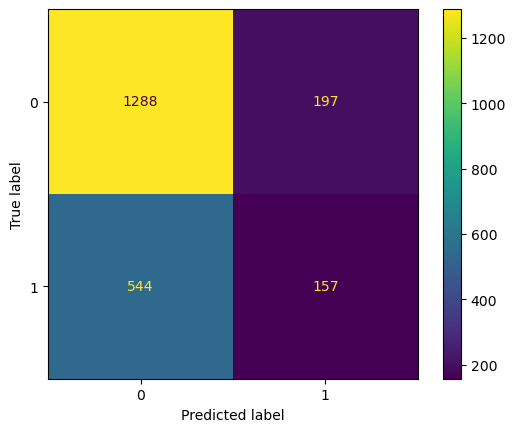

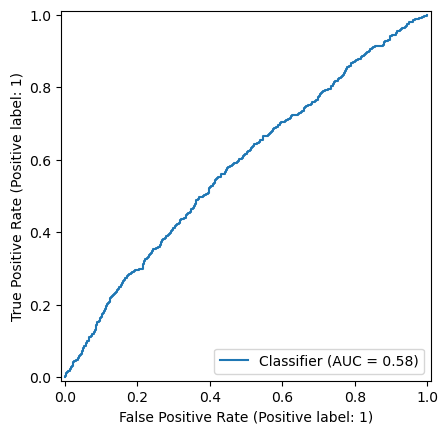

{0: 47, 1: 53} 43
Accuracy = 0.6633119853613907
ROC AUC = 0.5806750337420808
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.89      0.78      1485
           1       0.44      0.19      0.27       701

    accuracy                           0.66      2186
   macro avg       0.57      0.54      0.52      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


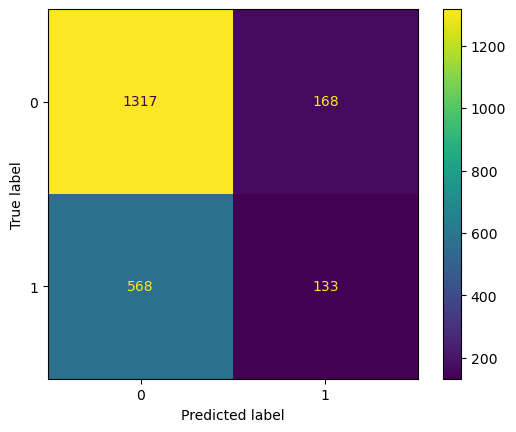

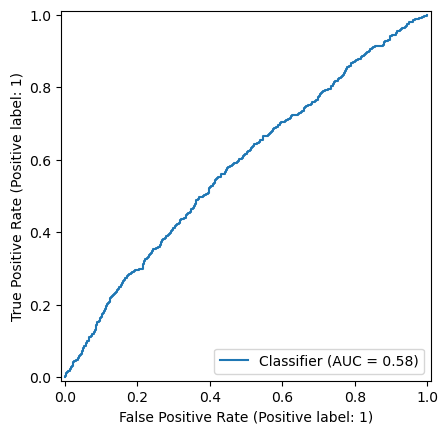

{0: 47, 1: 53} 44
Accuracy = 0.6646843549862763
ROC AUC = 0.5806750337420808
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.90      0.79      1485
           1       0.44      0.16      0.23       701

    accuracy                           0.66      2186
   macro avg       0.57      0.53      0.51      2186
weighted avg       0.61      0.66      0.61      2186

Confusion Matrix:


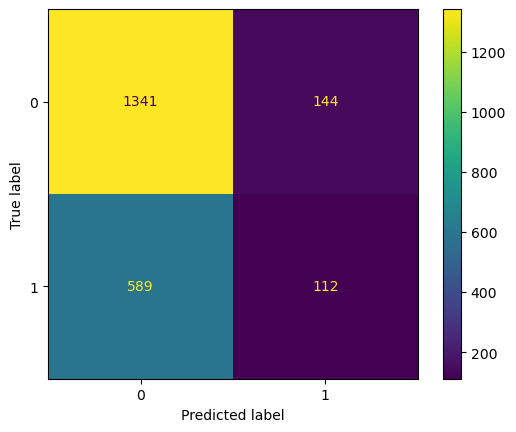

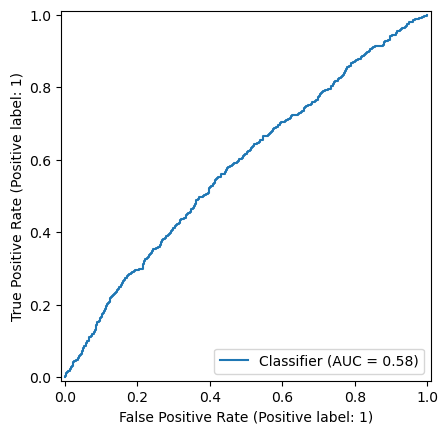

{0: 47, 1: 53} 45
Accuracy = 0.6642268984446478
ROC AUC = 0.5806750337420808
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.92      0.79      1485
           1       0.42      0.13      0.20       701

    accuracy                           0.66      2186
   macro avg       0.56      0.52      0.49      2186
weighted avg       0.61      0.66      0.60      2186

Confusion Matrix:


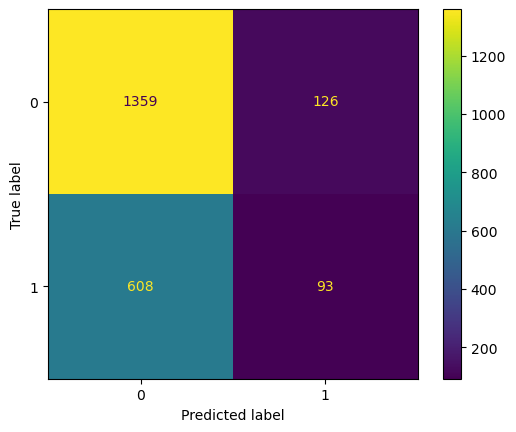

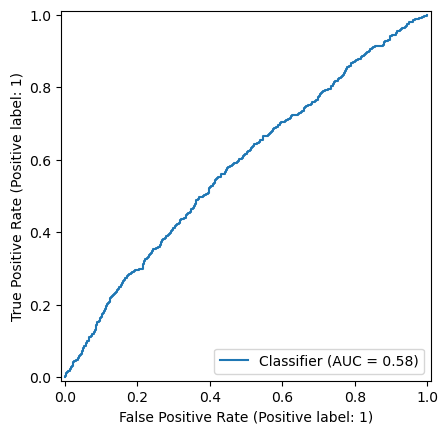

{0: 47, 1: 53} 46
Accuracy = 0.6688014638609332
ROC AUC = 0.5806750337420808
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.93      0.79      1485
           1       0.44      0.11      0.18       701

    accuracy                           0.67      2186
   macro avg       0.56      0.52      0.48      2186
weighted avg       0.61      0.67      0.59      2186

Confusion Matrix:


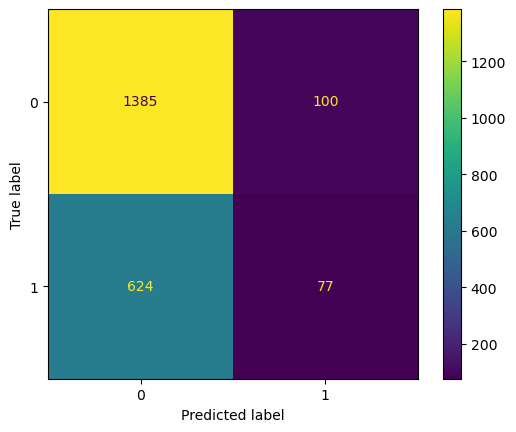

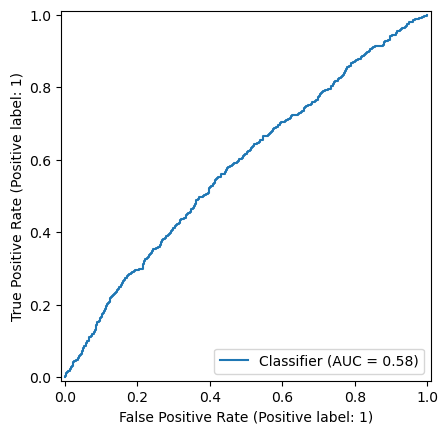

{0: 47, 1: 53} 47
Accuracy = 0.6688014638609332
ROC AUC = 0.5806750337420808
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.94      0.79      1485
           1       0.42      0.09      0.15       701

    accuracy                           0.67      2186
   macro avg       0.56      0.52      0.47      2186
weighted avg       0.60      0.67      0.59      2186

Confusion Matrix:


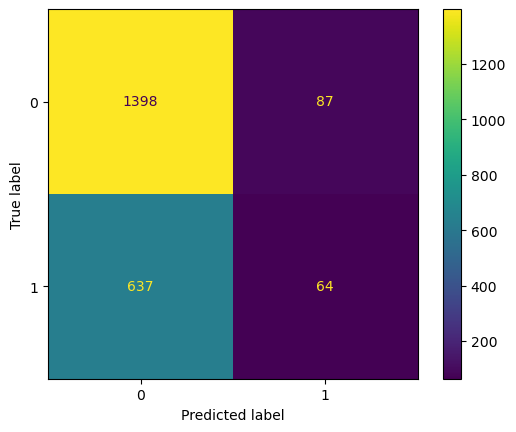

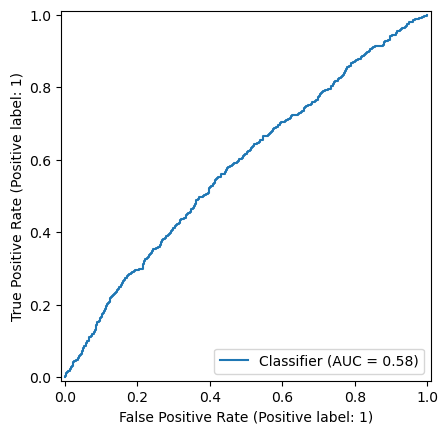

{0: 47, 1: 53} 48
Accuracy = 0.6706312900274474
ROC AUC = 0.5806750337420808
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.95      0.80      1485
           1       0.43      0.08      0.13       701

    accuracy                           0.67      2186
   macro avg       0.56      0.51      0.46      2186
weighted avg       0.60      0.67      0.58      2186

Confusion Matrix:


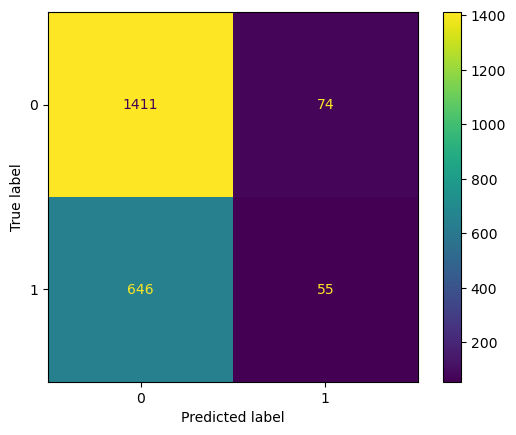

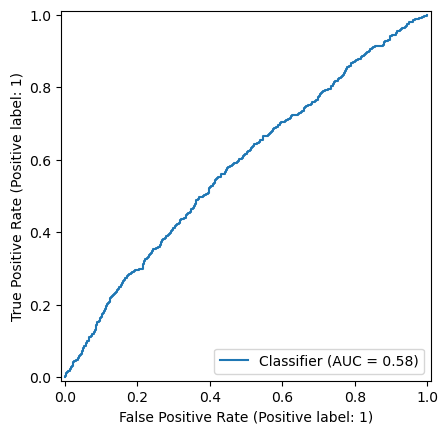

{0: 47, 1: 53} 49
Accuracy = 0.6710887465690759
ROC AUC = 0.5806750337420808
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.96      0.80      1485
           1       0.41      0.06      0.10       701

    accuracy                           0.67      2186
   macro avg       0.55      0.51      0.45      2186
weighted avg       0.60      0.67      0.58      2186

Confusion Matrix:


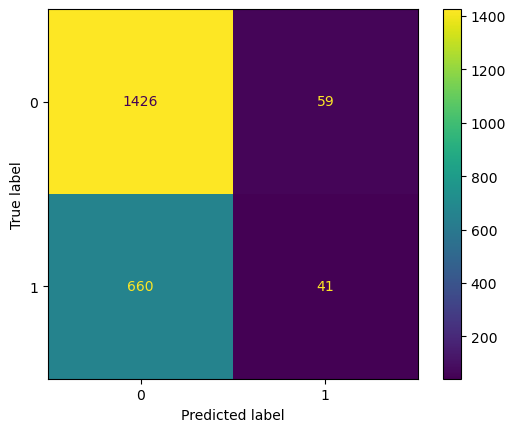

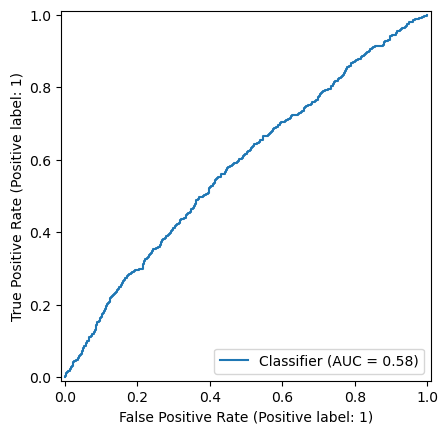

{0: 48, 1: 52} 30
Accuracy = 0.5178408051235133
ROC AUC = 0.5806721518561747
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.45      0.56      1485
           1       0.36      0.66      0.47       701

    accuracy                           0.52      2186
   macro avg       0.55      0.56      0.51      2186
weighted avg       0.62      0.52      0.53      2186

Confusion Matrix:


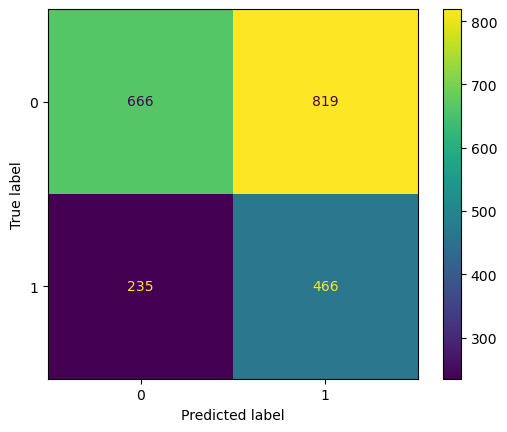

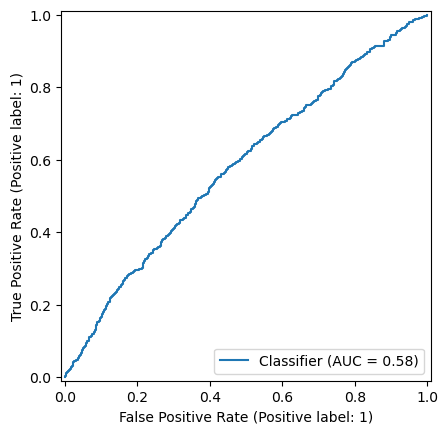

{0: 48, 1: 52} 31
Accuracy = 0.5370539798719122
ROC AUC = 0.5806721518561747
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.50      0.59      1485
           1       0.37      0.62      0.46       701

    accuracy                           0.54      2186
   macro avg       0.55      0.56      0.53      2186
weighted avg       0.62      0.54      0.55      2186

Confusion Matrix:


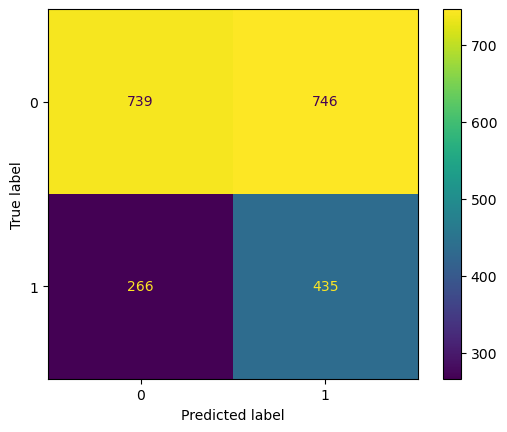

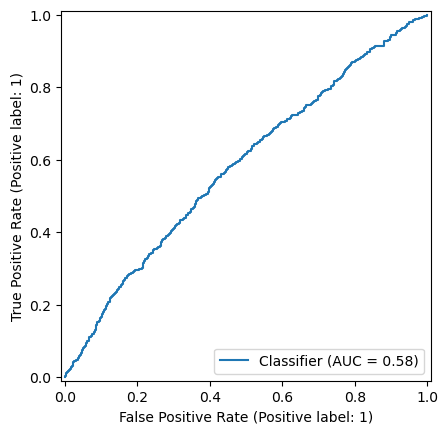

{0: 48, 1: 52} 32
Accuracy = 0.5530649588289113
ROC AUC = 0.5806721518561747
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.54      0.62      1485
           1       0.37      0.58      0.46       701

    accuracy                           0.55      2186
   macro avg       0.55      0.56      0.54      2186
weighted avg       0.62      0.55      0.57      2186

Confusion Matrix:


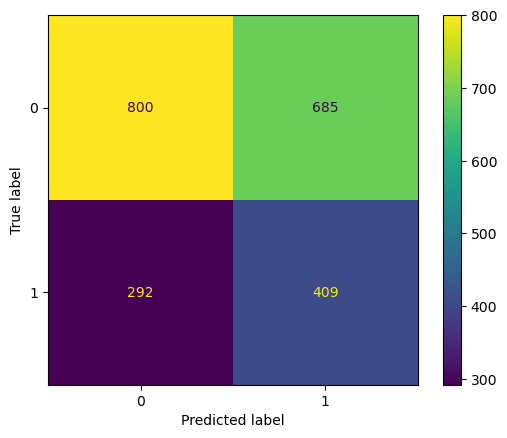

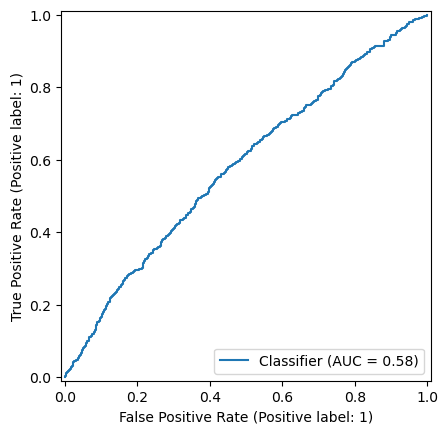

{0: 48, 1: 52} 33
Accuracy = 0.5736505032021958
ROC AUC = 0.5806721518561747
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.60      0.65      1485
           1       0.38      0.53      0.44       701

    accuracy                           0.57      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.62      0.57      0.59      2186

Confusion Matrix:


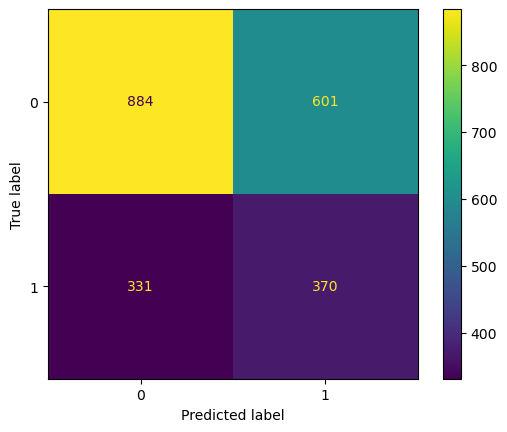

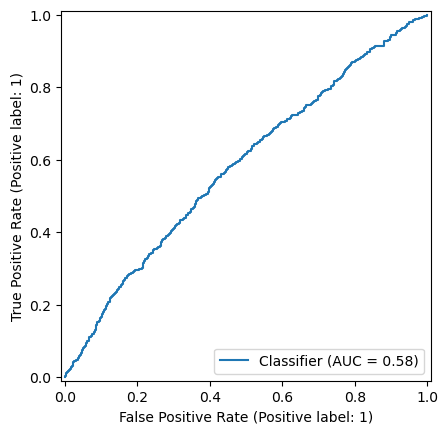

{0: 48, 1: 52} 34
Accuracy = 0.5882891125343093
ROC AUC = 0.5806721518561747
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.64      0.68      1485
           1       0.39      0.48      0.43       701

    accuracy                           0.59      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.62      0.59      0.60      2186

Confusion Matrix:


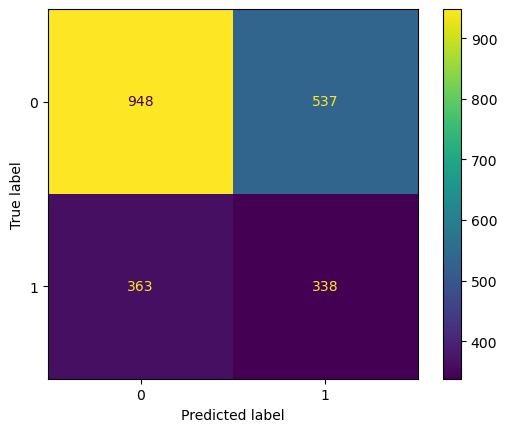

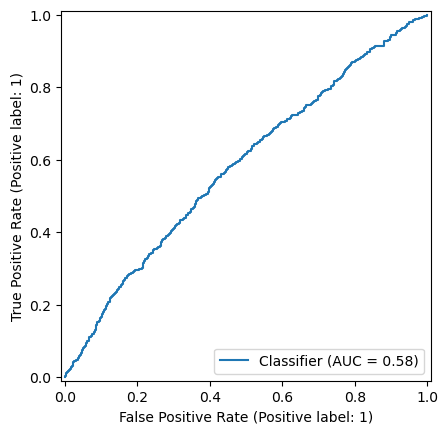

{0: 48, 1: 52} 35
Accuracy = 0.5997255260750228
ROC AUC = 0.5806721518561747
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.68      0.70      1485
           1       0.39      0.43      0.41       701

    accuracy                           0.60      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.61      0.60      0.61      2186

Confusion Matrix:


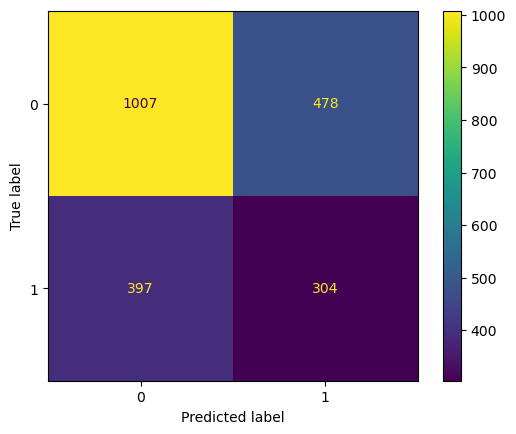

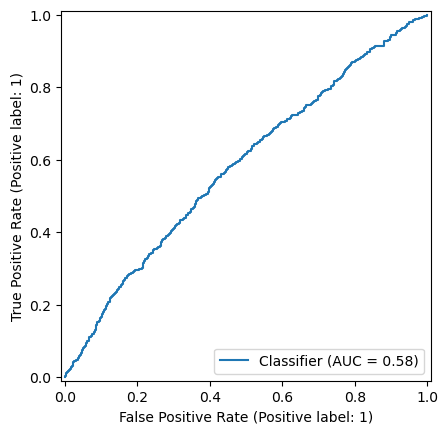

{0: 48, 1: 52} 36
Accuracy = 0.6125343092406221
ROC AUC = 0.5806721518561747
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.72      0.72      1485
           1       0.39      0.39      0.39       701

    accuracy                           0.61      2186
   macro avg       0.55      0.55      0.55      2186
weighted avg       0.61      0.61      0.61      2186

Confusion Matrix:


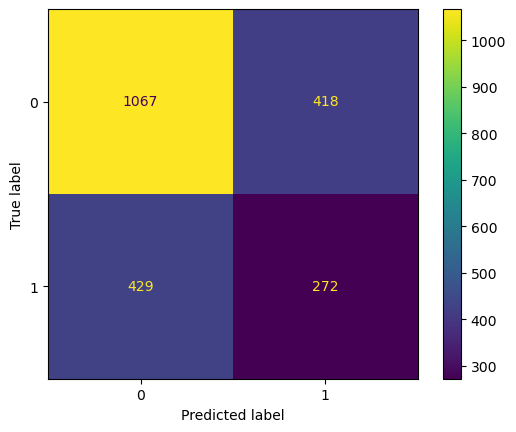

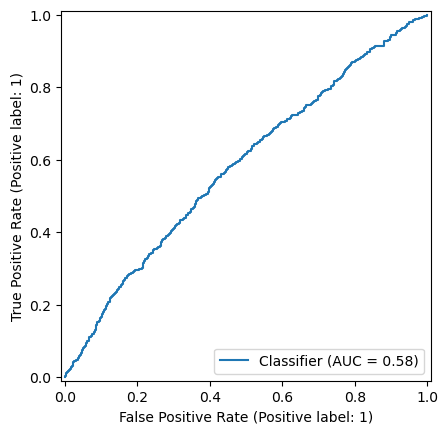

{0: 48, 1: 52} 37
Accuracy = 0.6253430924062214
ROC AUC = 0.5806721518561747
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.75      0.73      1485
           1       0.40      0.35      0.38       701

    accuracy                           0.63      2186
   macro avg       0.56      0.55      0.55      2186
weighted avg       0.61      0.63      0.62      2186

Confusion Matrix:


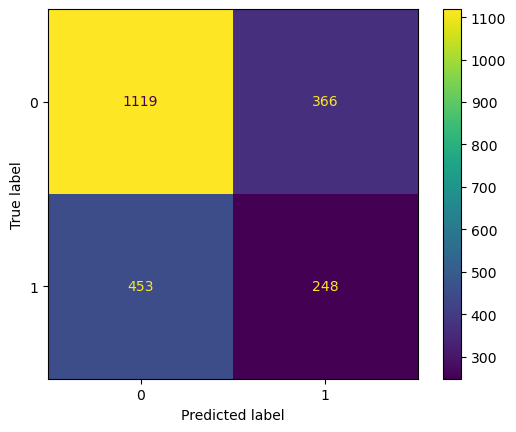

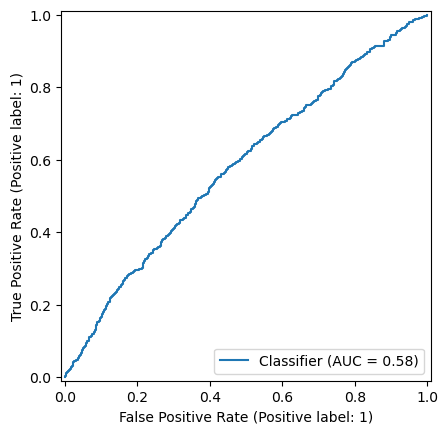

{0: 48, 1: 52} 38
Accuracy = 0.6312900274473925
ROC AUC = 0.5806721518561747
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.78      0.74      1485
           1       0.40      0.31      0.35       701

    accuracy                           0.63      2186
   macro avg       0.55      0.55      0.55      2186
weighted avg       0.61      0.63      0.62      2186

Confusion Matrix:


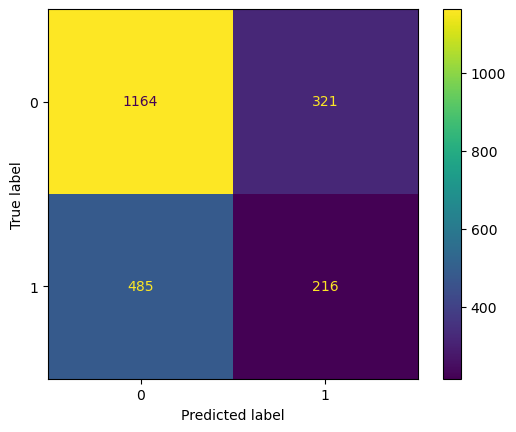

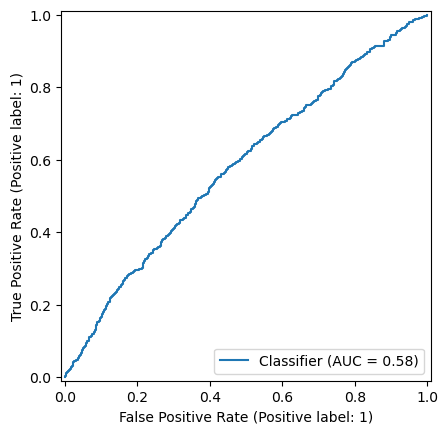

{0: 48, 1: 52} 39
Accuracy = 0.6482159194876487
ROC AUC = 0.5806721518561747
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.82      0.76      1485
           1       0.43      0.29      0.34       701

    accuracy                           0.65      2186
   macro avg       0.57      0.55      0.55      2186
weighted avg       0.62      0.65      0.63      2186

Confusion Matrix:


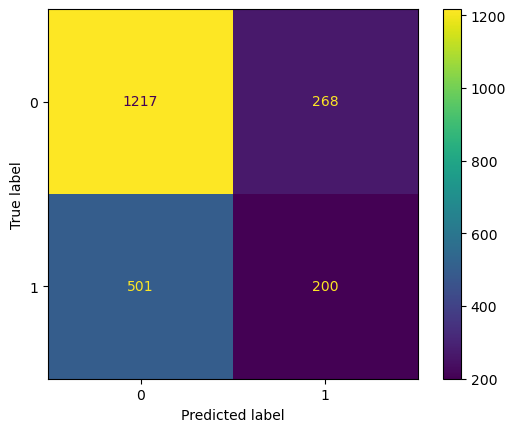

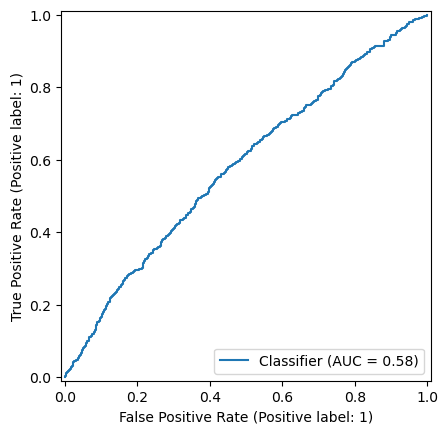

{0: 48, 1: 52} 40
Accuracy = 0.6559926806953339
ROC AUC = 0.5806721518561747
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.85      0.77      1485
           1       0.44      0.25      0.32       701

    accuracy                           0.66      2186
   macro avg       0.57      0.55      0.54      2186
weighted avg       0.62      0.66      0.63      2186

Confusion Matrix:


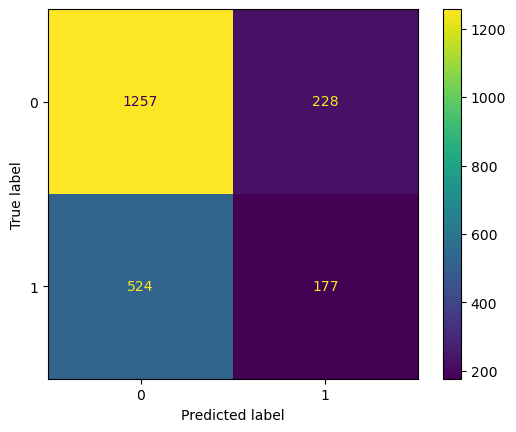

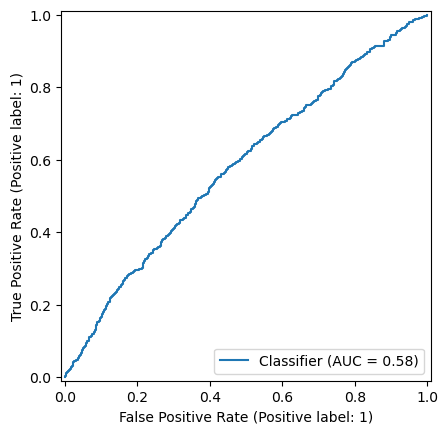

{0: 48, 1: 52} 41
Accuracy = 0.6614821591948765
ROC AUC = 0.5806721518561747
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.87      0.78      1485
           1       0.45      0.23      0.30       701

    accuracy                           0.66      2186
   macro avg       0.57      0.55      0.54      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


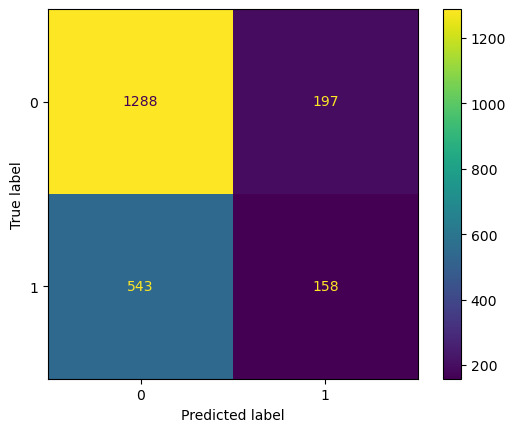

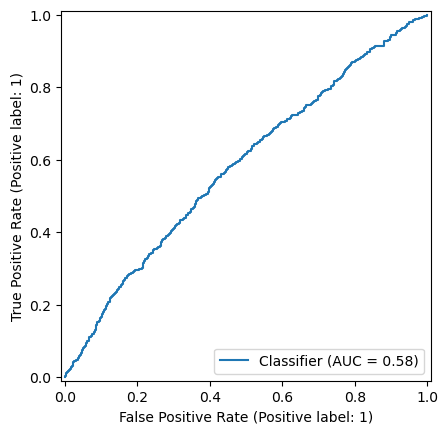

{0: 48, 1: 52} 42
Accuracy = 0.6633119853613907
ROC AUC = 0.5806721518561747
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.89      0.78      1485
           1       0.44      0.19      0.27       701

    accuracy                           0.66      2186
   macro avg       0.57      0.54      0.52      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


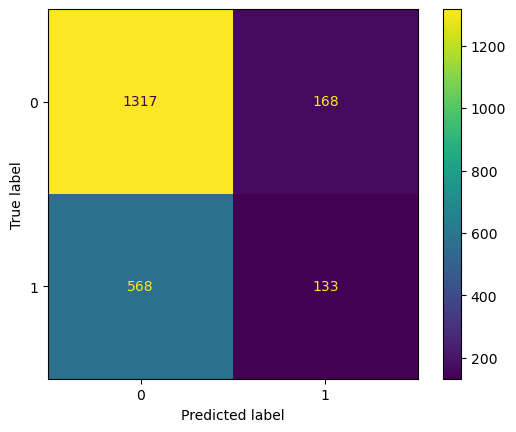

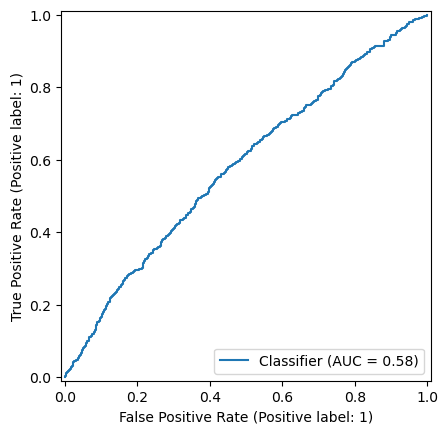

{0: 48, 1: 52} 43
Accuracy = 0.6646843549862763
ROC AUC = 0.5806721518561747
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.90      0.79      1485
           1       0.44      0.16      0.23       701

    accuracy                           0.66      2186
   macro avg       0.57      0.53      0.51      2186
weighted avg       0.61      0.66      0.61      2186

Confusion Matrix:


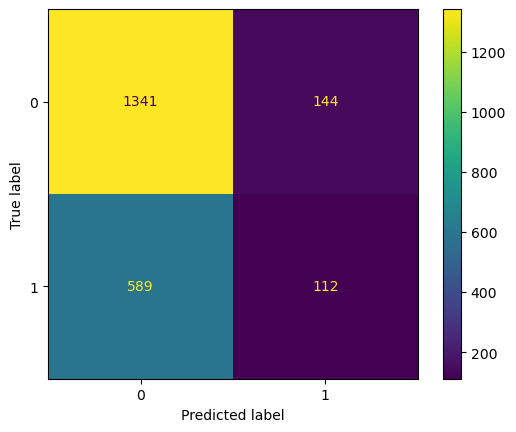

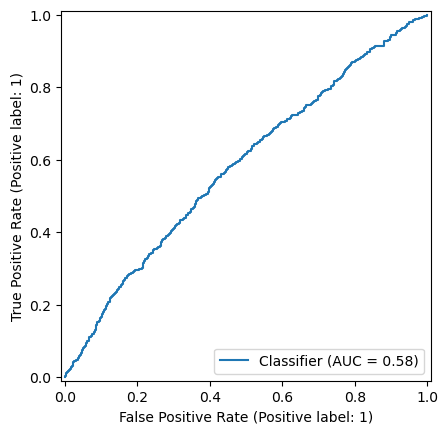

{0: 48, 1: 52} 44
Accuracy = 0.6637694419030192
ROC AUC = 0.5806721518561747
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.92      0.79      1485
           1       0.42      0.13      0.20       701

    accuracy                           0.66      2186
   macro avg       0.56      0.52      0.49      2186
weighted avg       0.60      0.66      0.60      2186

Confusion Matrix:


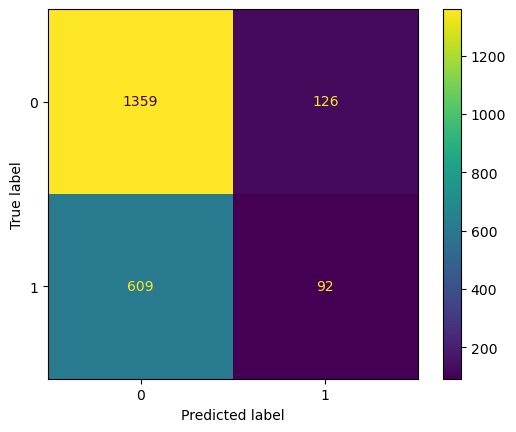

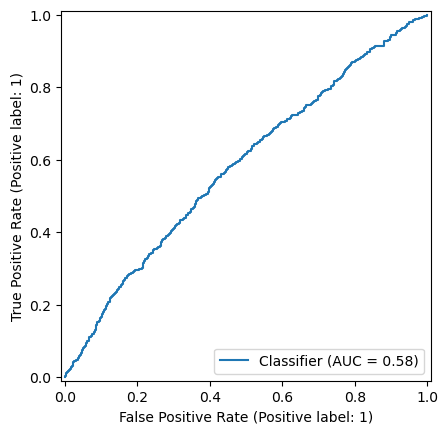

{0: 48, 1: 52} 45
Accuracy = 0.6688014638609332
ROC AUC = 0.5806721518561747
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.93      0.79      1485
           1       0.44      0.11      0.18       701

    accuracy                           0.67      2186
   macro avg       0.56      0.52      0.48      2186
weighted avg       0.61      0.67      0.59      2186

Confusion Matrix:


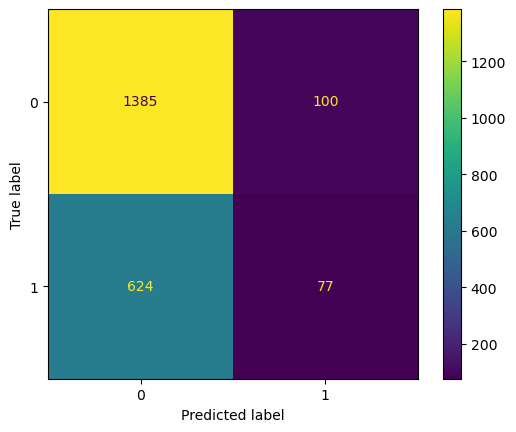

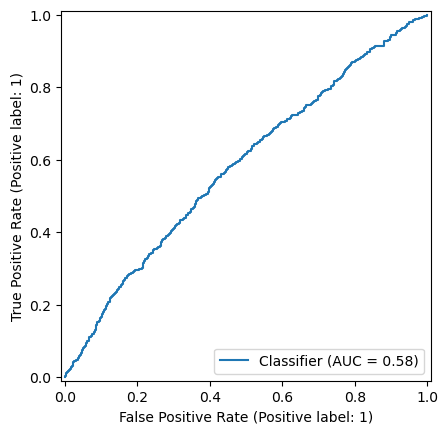

{0: 48, 1: 52} 46
Accuracy = 0.6688014638609332
ROC AUC = 0.5806721518561747
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.94      0.79      1485
           1       0.42      0.09      0.15       701

    accuracy                           0.67      2186
   macro avg       0.56      0.52      0.47      2186
weighted avg       0.60      0.67      0.59      2186

Confusion Matrix:


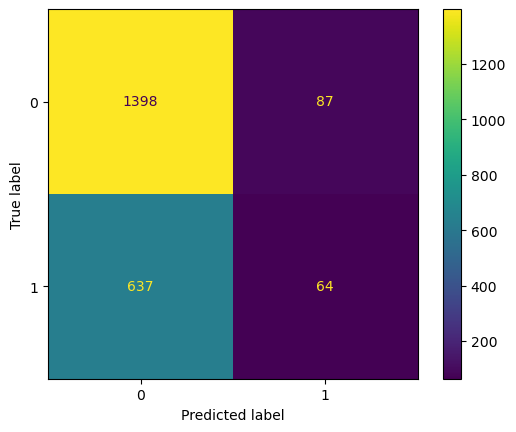

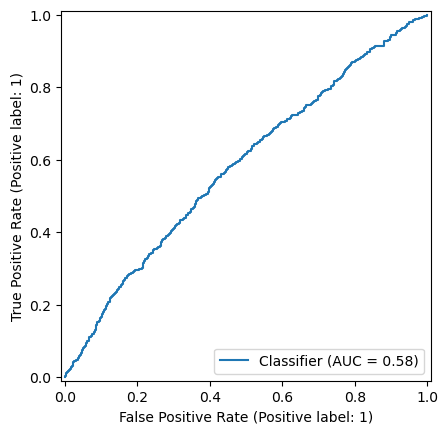

{0: 48, 1: 52} 47
Accuracy = 0.6706312900274474
ROC AUC = 0.5806721518561747
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.95      0.80      1485
           1       0.43      0.08      0.13       701

    accuracy                           0.67      2186
   macro avg       0.56      0.51      0.46      2186
weighted avg       0.60      0.67      0.58      2186

Confusion Matrix:


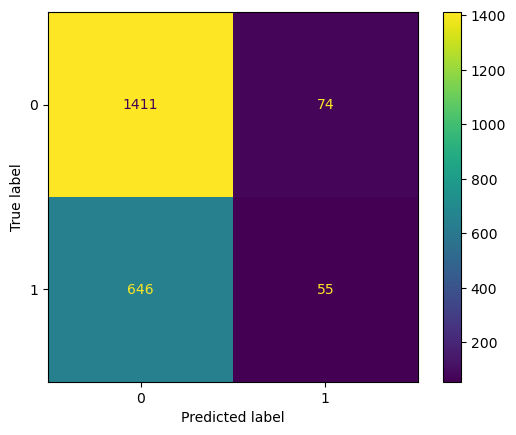

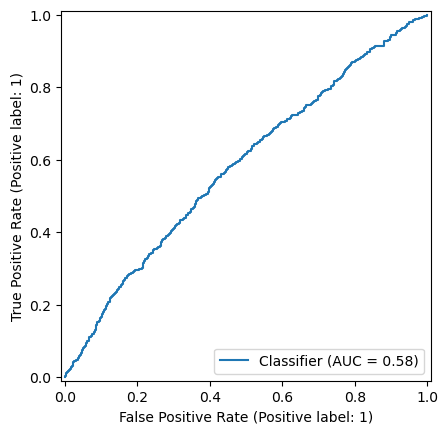

{0: 48, 1: 52} 48
Accuracy = 0.6710887465690759
ROC AUC = 0.5806721518561747
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.96      0.80      1485
           1       0.41      0.06      0.10       701

    accuracy                           0.67      2186
   macro avg       0.55      0.51      0.45      2186
weighted avg       0.60      0.67      0.58      2186

Confusion Matrix:


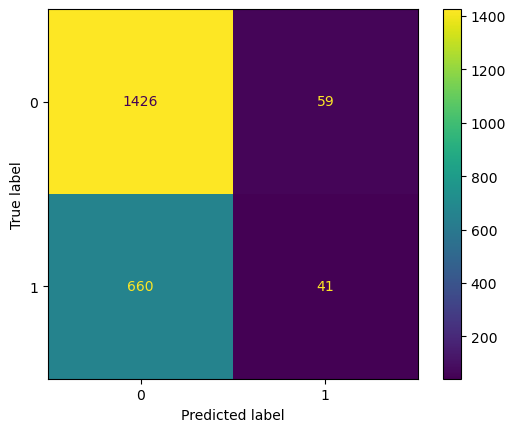

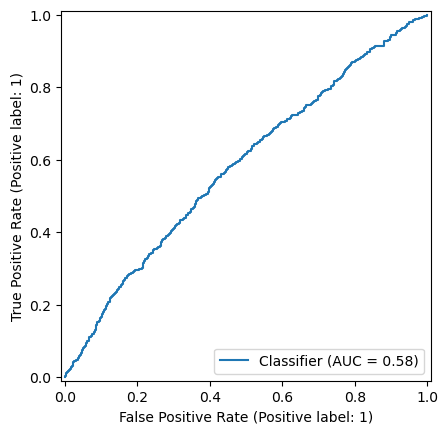

{0: 48, 1: 52} 49
Accuracy = 0.6756633119853613
ROC AUC = 0.5806721518561747
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.97      0.80      1485
           1       0.44      0.04      0.08       701

    accuracy                           0.68      2186
   macro avg       0.56      0.51      0.44      2186
weighted avg       0.61      0.68      0.57      2186

Confusion Matrix:


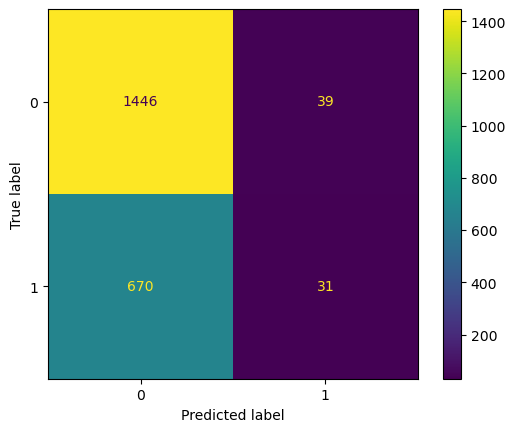

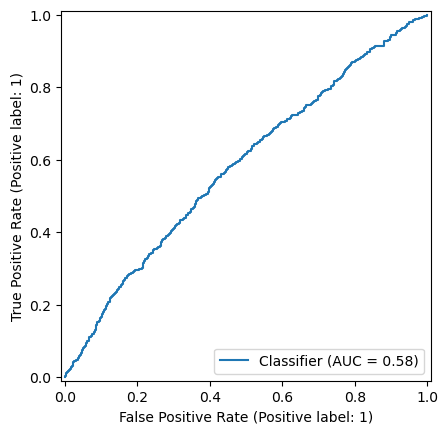

{0: 49, 1: 51} 30
Accuracy = 0.5329368709972553
ROC AUC = 0.5806836793997993
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.49      0.59      1485
           1       0.37      0.62      0.46       701

    accuracy                           0.53      2186
   macro avg       0.55      0.56      0.52      2186
weighted avg       0.62      0.53      0.55      2186

Confusion Matrix:


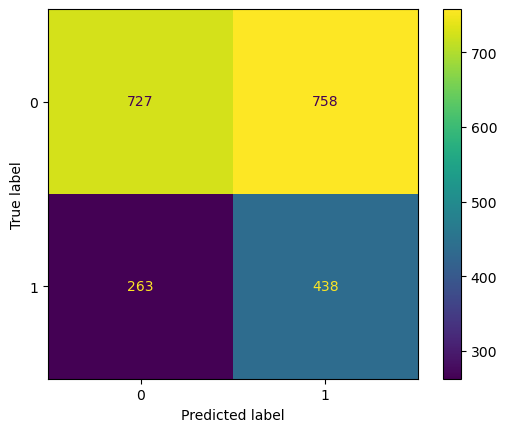

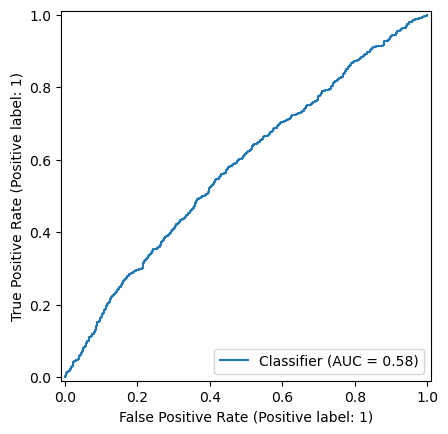

{0: 49, 1: 51} 31
Accuracy = 0.5526075022872827
ROC AUC = 0.5806836793997993
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.54      0.62      1485
           1       0.37      0.59      0.46       701

    accuracy                           0.55      2186
   macro avg       0.55      0.56      0.54      2186
weighted avg       0.62      0.55      0.57      2186

Confusion Matrix:


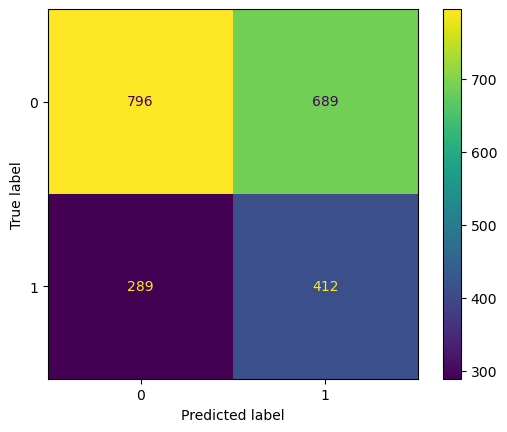

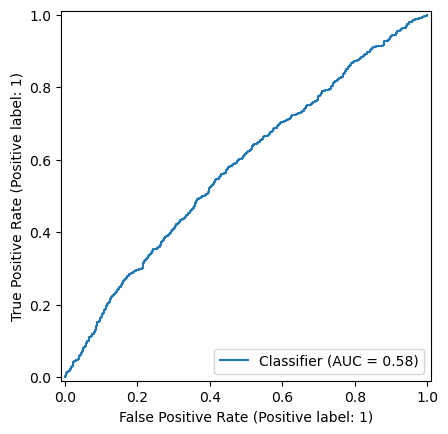

{0: 49, 1: 51} 32
Accuracy = 0.5713632204940531
ROC AUC = 0.5806836793997993
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.59      0.65      1485
           1       0.38      0.53      0.44       701

    accuracy                           0.57      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.62      0.57      0.58      2186

Confusion Matrix:


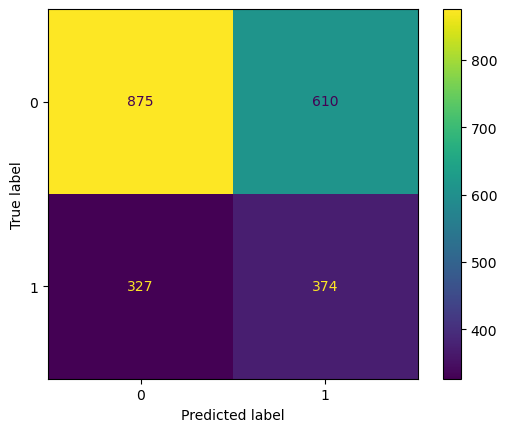

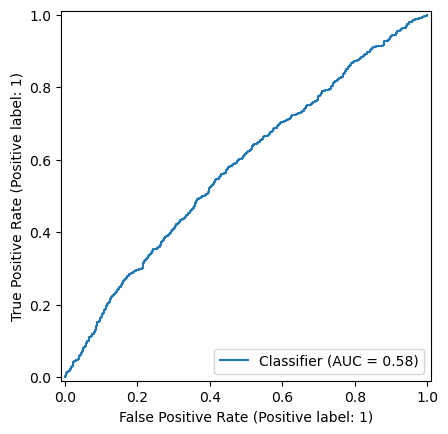

{0: 49, 1: 51} 33
Accuracy = 0.5878316559926807
ROC AUC = 0.5806836793997993
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.64      0.68      1485
           1       0.39      0.49      0.43       701

    accuracy                           0.59      2186
   macro avg       0.56      0.56      0.55      2186
weighted avg       0.62      0.59      0.60      2186

Confusion Matrix:


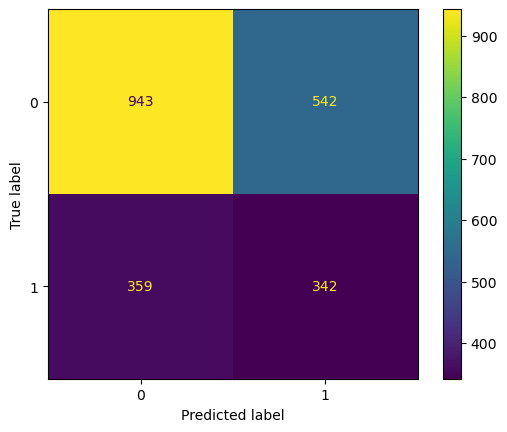

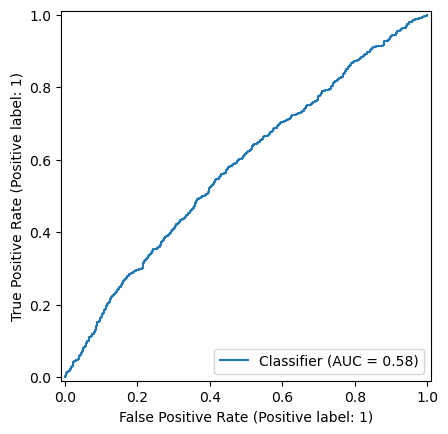

{0: 49, 1: 51} 34
Accuracy = 0.5969807868252516
ROC AUC = 0.5806836793997993
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.67      0.69      1485
           1       0.39      0.44      0.41       701

    accuracy                           0.60      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.61      0.60      0.60      2186

Confusion Matrix:


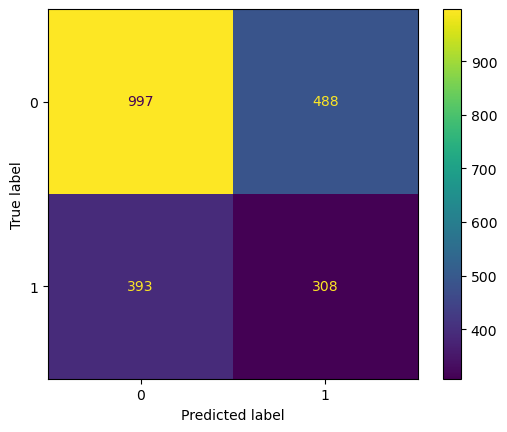

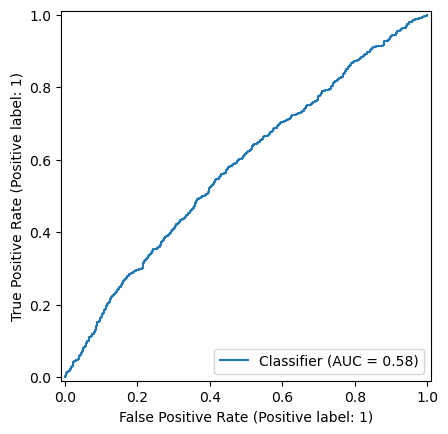

{0: 49, 1: 51} 35
Accuracy = 0.6111619396157365
ROC AUC = 0.5806836793997993
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.72      0.71      1485
           1       0.39      0.39      0.39       701

    accuracy                           0.61      2186
   macro avg       0.55      0.55      0.55      2186
weighted avg       0.61      0.61      0.61      2186

Confusion Matrix:


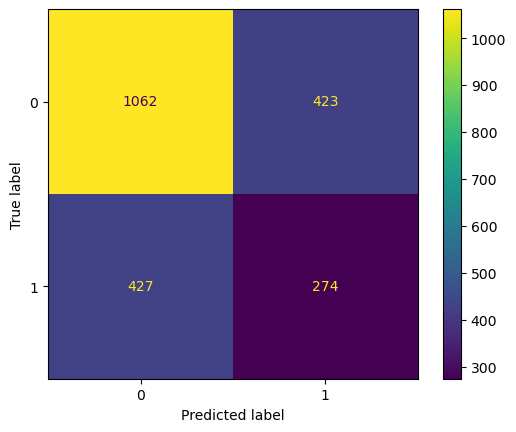

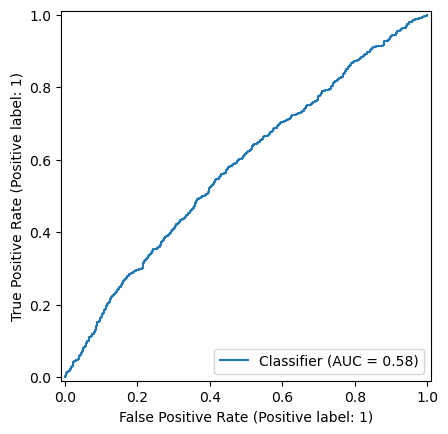

{0: 49, 1: 51} 36
Accuracy = 0.6221408966148216
ROC AUC = 0.5806836793997993
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.75      0.73      1485
           1       0.40      0.35      0.38       701

    accuracy                           0.62      2186
   macro avg       0.55      0.55      0.55      2186
weighted avg       0.61      0.62      0.62      2186

Confusion Matrix:


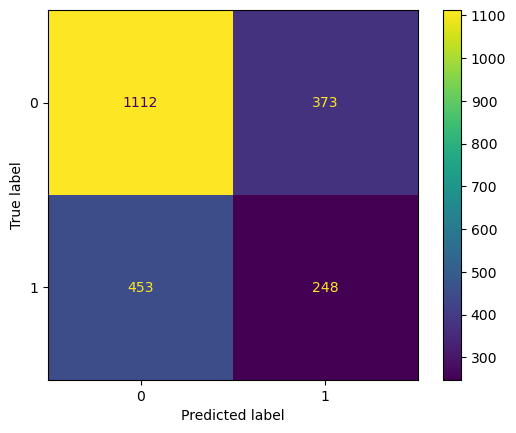

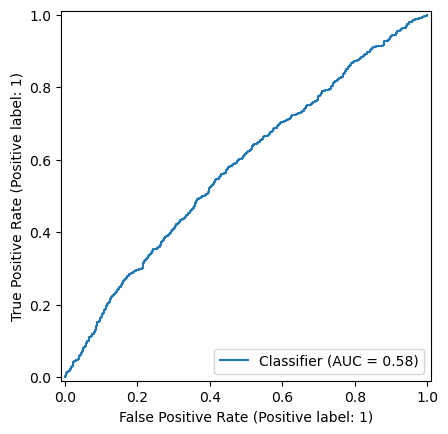

{0: 49, 1: 51} 37
Accuracy = 0.631747483989021
ROC AUC = 0.5806836793997993
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.78      0.74      1485
           1       0.40      0.31      0.35       701

    accuracy                           0.63      2186
   macro avg       0.55      0.55      0.55      2186
weighted avg       0.61      0.63      0.62      2186

Confusion Matrix:


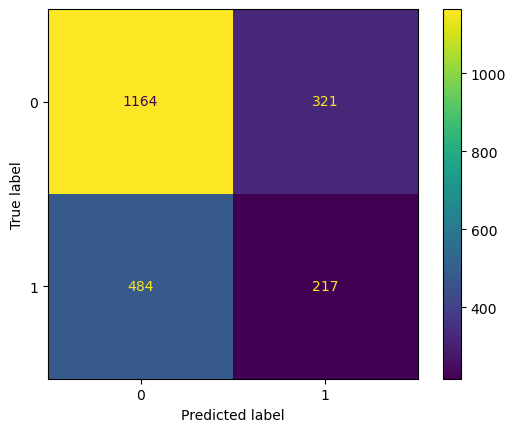

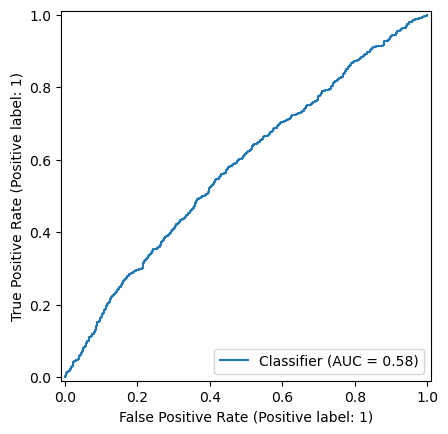

{0: 49, 1: 51} 38
Accuracy = 0.646843549862763
ROC AUC = 0.5806836793997993
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.82      0.76      1485
           1       0.42      0.29      0.34       701

    accuracy                           0.65      2186
   macro avg       0.57      0.55      0.55      2186
weighted avg       0.62      0.65      0.62      2186

Confusion Matrix:


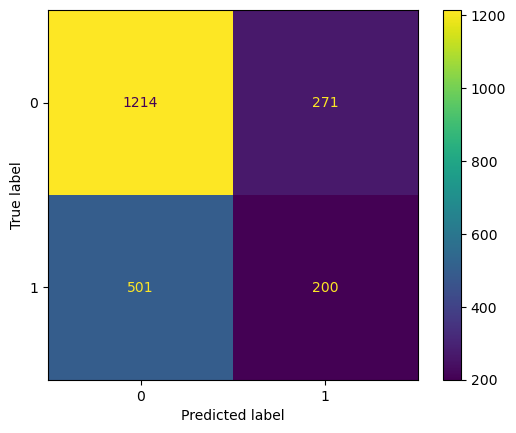

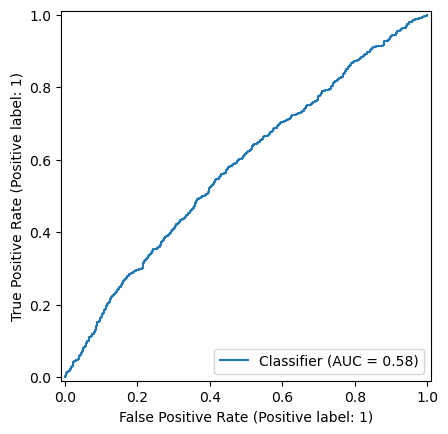

{0: 49, 1: 51} 39
Accuracy = 0.6564501372369624
ROC AUC = 0.5806836793997993
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.85      0.77      1485
           1       0.44      0.25      0.32       701

    accuracy                           0.66      2186
   macro avg       0.57      0.55      0.55      2186
weighted avg       0.62      0.66      0.63      2186

Confusion Matrix:


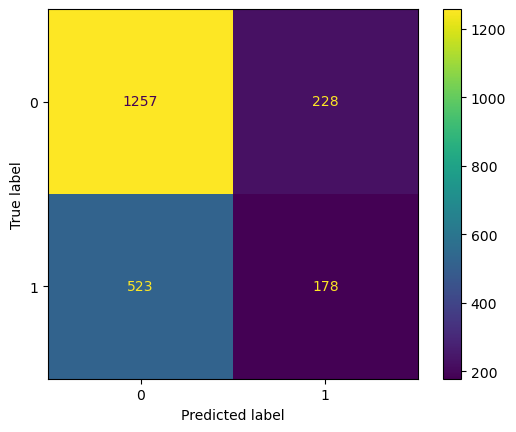

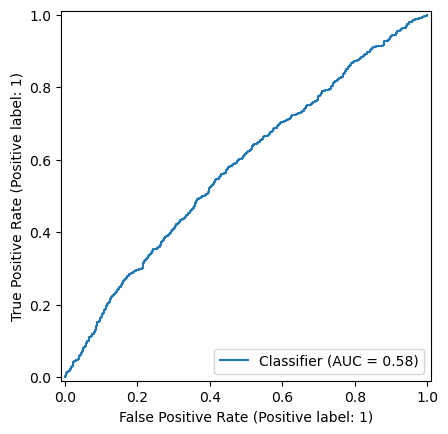

{0: 49, 1: 51} 40
Accuracy = 0.6619396157365051
ROC AUC = 0.5806836793997993
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.87      0.78      1485
           1       0.45      0.23      0.30       701

    accuracy                           0.66      2186
   macro avg       0.58      0.55      0.54      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


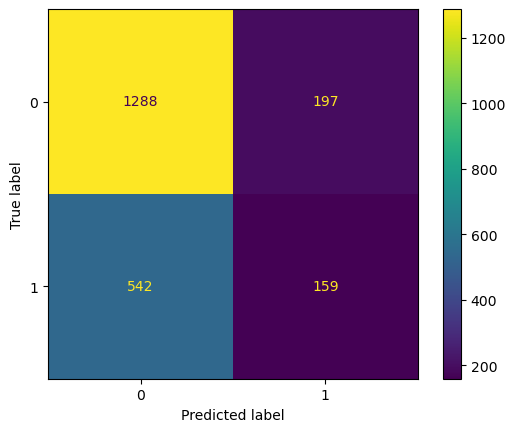

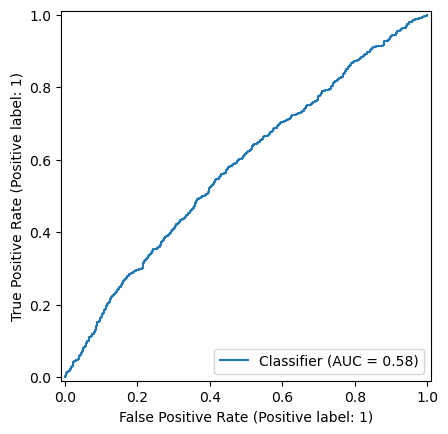

{0: 49, 1: 51} 41
Accuracy = 0.6633119853613907
ROC AUC = 0.5806836793997993
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.89      0.78      1485
           1       0.44      0.19      0.27       701

    accuracy                           0.66      2186
   macro avg       0.57      0.54      0.52      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


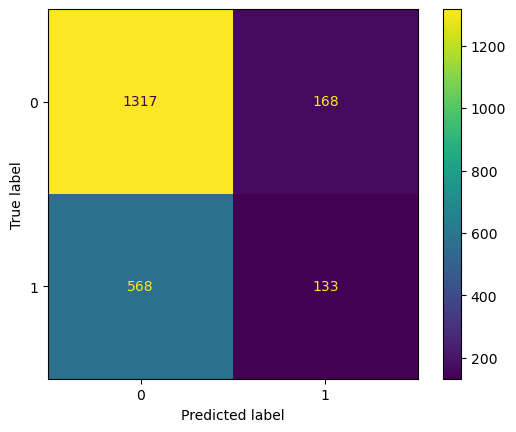

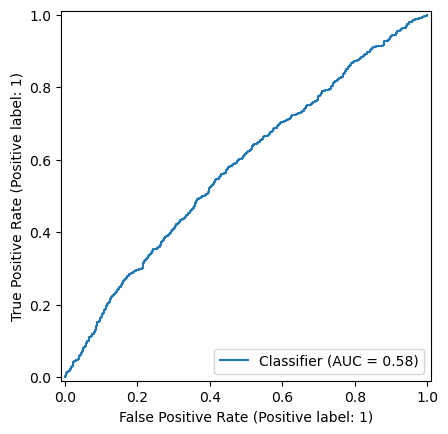

{0: 49, 1: 51} 42
Accuracy = 0.6646843549862763
ROC AUC = 0.5806836793997993
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.90      0.79      1485
           1       0.44      0.16      0.23       701

    accuracy                           0.66      2186
   macro avg       0.57      0.53      0.51      2186
weighted avg       0.61      0.66      0.61      2186

Confusion Matrix:


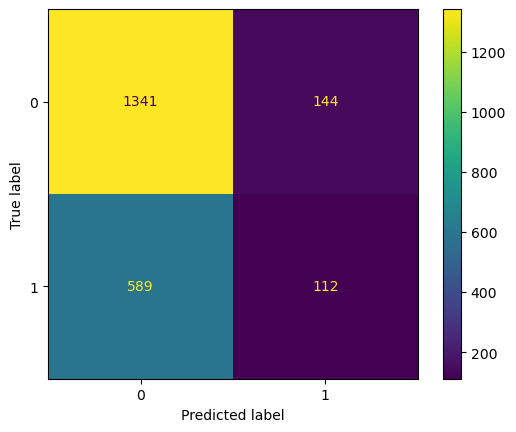

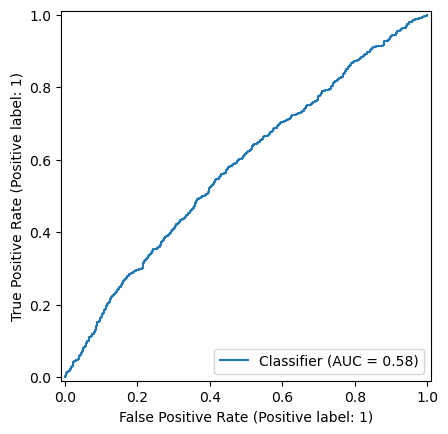

{0: 49, 1: 51} 43
Accuracy = 0.6651418115279049
ROC AUC = 0.5806836793997993
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.92      0.79      1485
           1       0.43      0.14      0.21       701

    accuracy                           0.67      2186
   macro avg       0.56      0.53      0.50      2186
weighted avg       0.61      0.67      0.60      2186

Confusion Matrix:


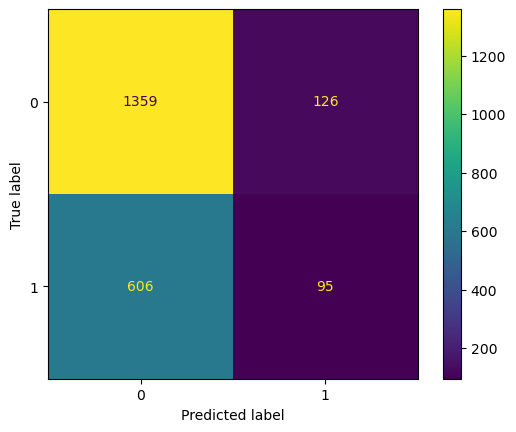

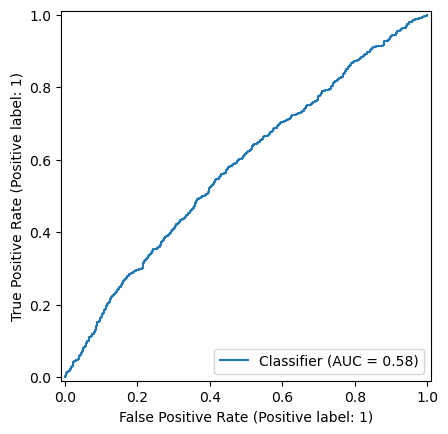

{0: 49, 1: 51} 44
Accuracy = 0.6688014638609332
ROC AUC = 0.5806836793997993
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.93      0.79      1485
           1       0.44      0.11      0.18       701

    accuracy                           0.67      2186
   macro avg       0.56      0.52      0.48      2186
weighted avg       0.61      0.67      0.59      2186

Confusion Matrix:


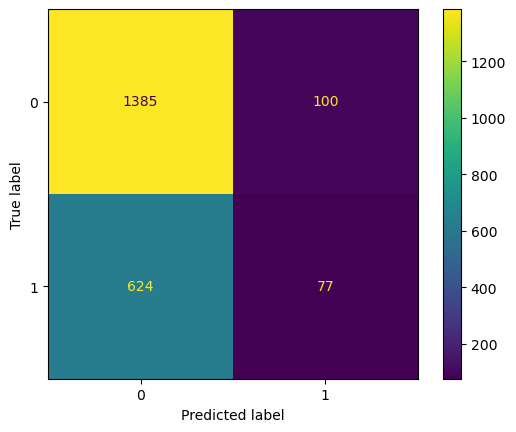

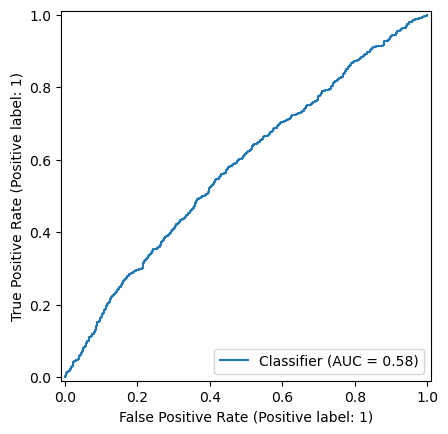

{0: 49, 1: 51} 45
Accuracy = 0.6692589204025617
ROC AUC = 0.5806836793997993
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.94      0.79      1485
           1       0.43      0.09      0.15       701

    accuracy                           0.67      2186
   macro avg       0.56      0.52      0.47      2186
weighted avg       0.60      0.67      0.59      2186

Confusion Matrix:


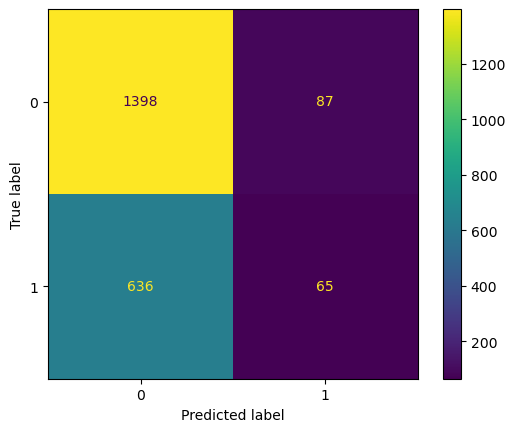

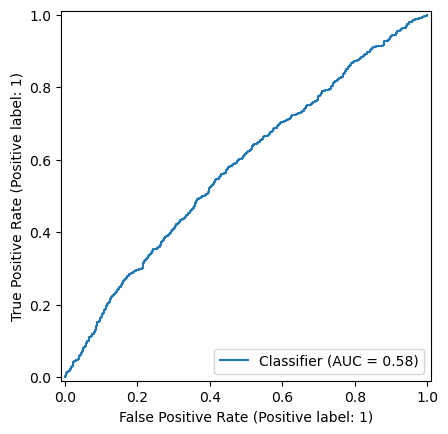

{0: 49, 1: 51} 46
Accuracy = 0.6706312900274474
ROC AUC = 0.5806836793997993
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.95      0.80      1485
           1       0.43      0.08      0.13       701

    accuracy                           0.67      2186
   macro avg       0.56      0.51      0.46      2186
weighted avg       0.60      0.67      0.58      2186

Confusion Matrix:


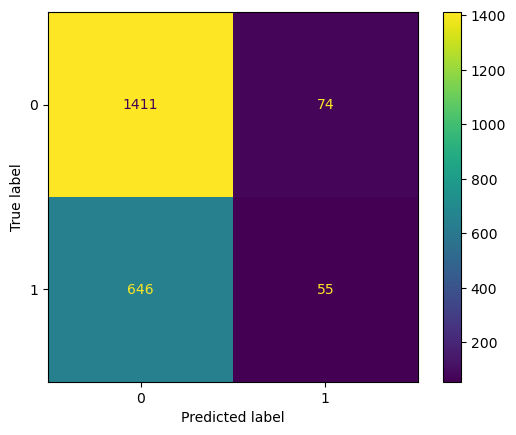

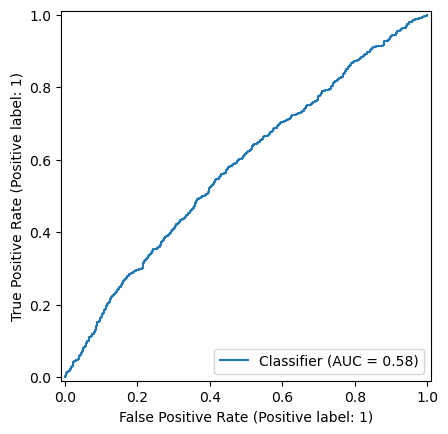

{0: 49, 1: 51} 47
Accuracy = 0.6701738334858188
ROC AUC = 0.5806836793997993
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.96      0.80      1485
           1       0.40      0.06      0.10       701

    accuracy                           0.67      2186
   macro avg       0.54      0.51      0.45      2186
weighted avg       0.59      0.67      0.57      2186

Confusion Matrix:


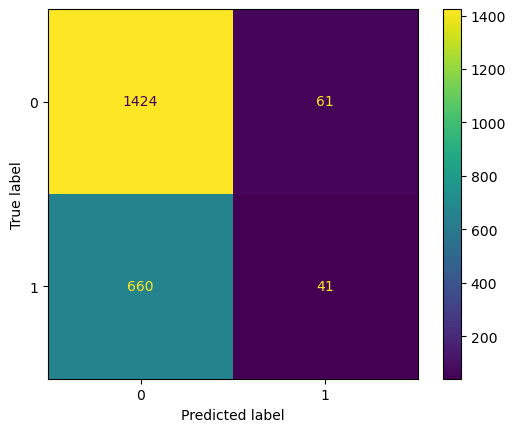

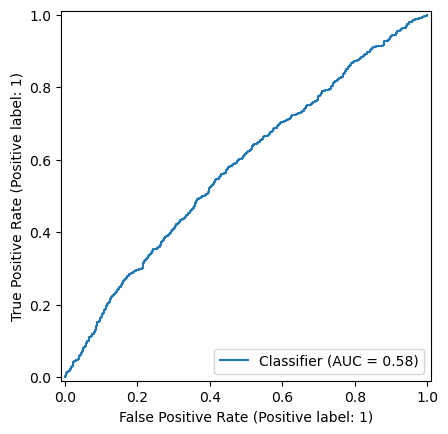

{0: 49, 1: 51} 48
Accuracy = 0.67612076852699
ROC AUC = 0.5806836793997993
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.97      0.80      1485
           1       0.45      0.05      0.08       701

    accuracy                           0.68      2186
   macro avg       0.57      0.51      0.44      2186
weighted avg       0.61      0.68      0.57      2186

Confusion Matrix:


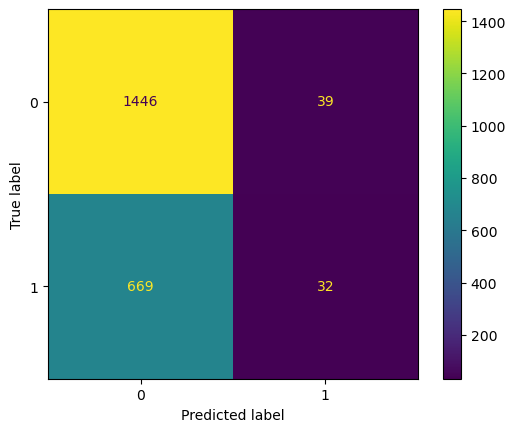

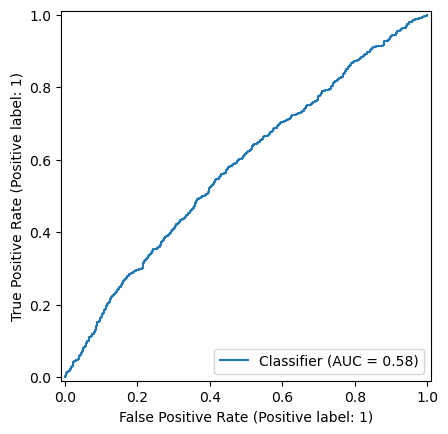

{0: 49, 1: 51} 49
Accuracy = 0.6747483989021043
ROC AUC = 0.5806836793997993
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.98      0.80      1485
           1       0.41      0.03      0.06       701

    accuracy                           0.67      2186
   macro avg       0.55      0.51      0.43      2186
weighted avg       0.60      0.67      0.57      2186

Confusion Matrix:


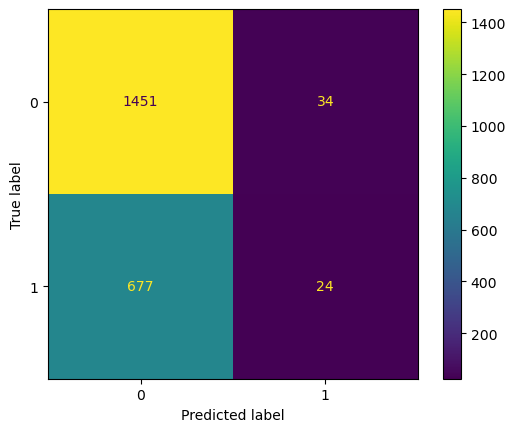

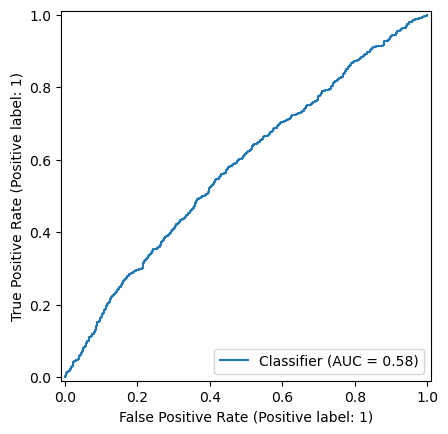

{0: 50, 1: 50} 30
Accuracy = 0.5489478499542544
ROC AUC = 0.5806058684803335
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.53      0.61      1485
           1       0.37      0.59      0.46       701

    accuracy                           0.55      2186
   macro avg       0.55      0.56      0.54      2186
weighted avg       0.62      0.55      0.56      2186

Confusion Matrix:


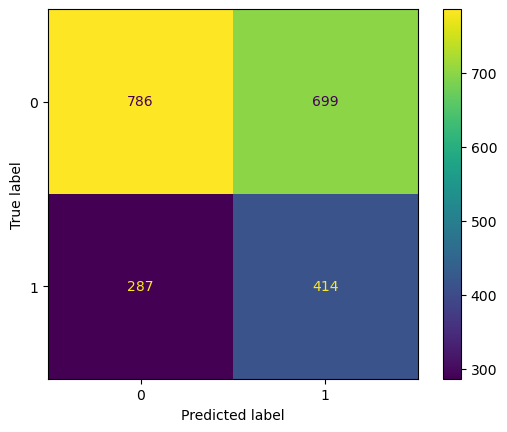

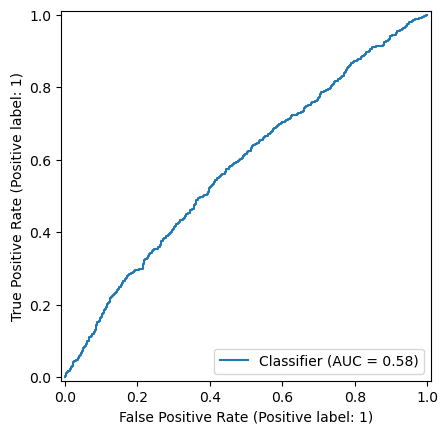

{0: 50, 1: 50} 31
Accuracy = 0.5722781335773102
ROC AUC = 0.5806058684803335
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.59      0.65      1485
           1       0.38      0.54      0.45       701

    accuracy                           0.57      2186
   macro avg       0.56      0.57      0.55      2186
weighted avg       0.62      0.57      0.59      2186

Confusion Matrix:


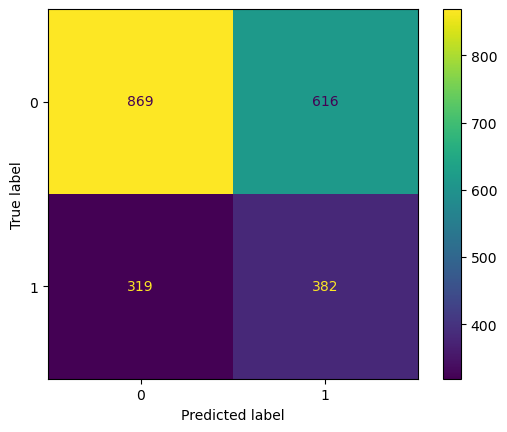

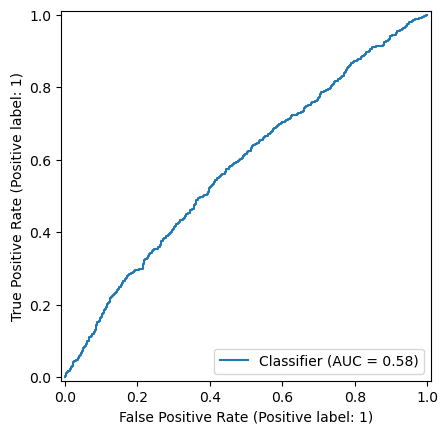

{0: 50, 1: 50} 32
Accuracy = 0.5869167429094236
ROC AUC = 0.5806058684803335
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.63      0.68      1485
           1       0.39      0.49      0.43       701

    accuracy                           0.59      2186
   macro avg       0.56      0.56      0.55      2186
weighted avg       0.62      0.59      0.60      2186

Confusion Matrix:


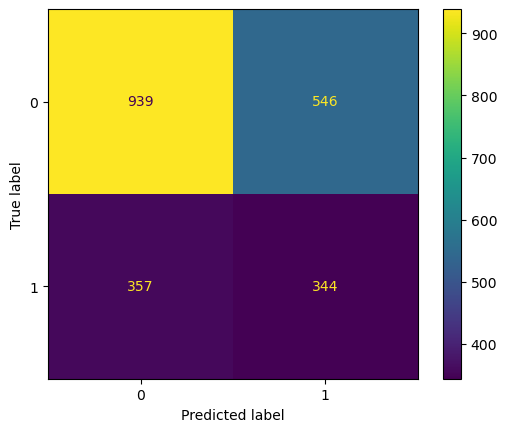

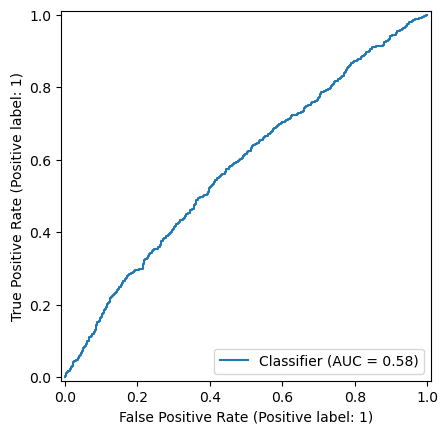

{0: 50, 1: 50} 33
Accuracy = 0.596523330283623
ROC AUC = 0.5806058684803335
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.67      0.69      1485
           1       0.39      0.45      0.42       701

    accuracy                           0.60      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.61      0.60      0.60      2186

Confusion Matrix:


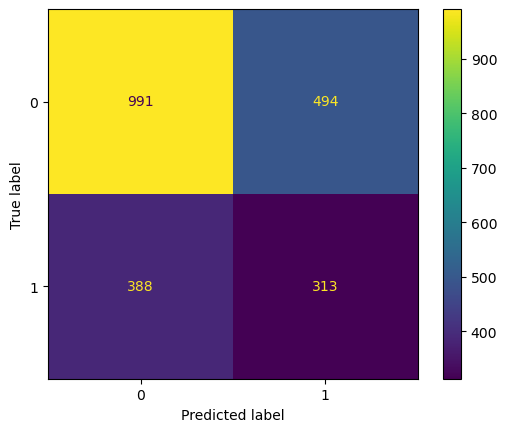

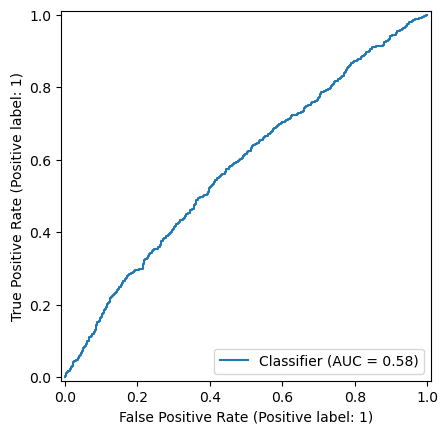

{0: 50, 1: 50} 34
Accuracy = 0.6084172003659652
ROC AUC = 0.5806058684803335
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.71      0.71      1485
           1       0.39      0.40      0.39       701

    accuracy                           0.61      2186
   macro avg       0.55      0.55      0.55      2186
weighted avg       0.61      0.61      0.61      2186

Confusion Matrix:


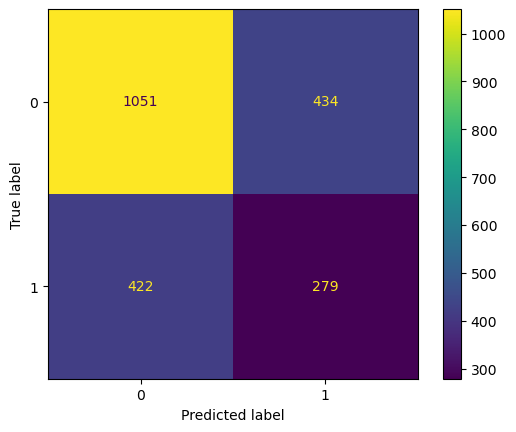

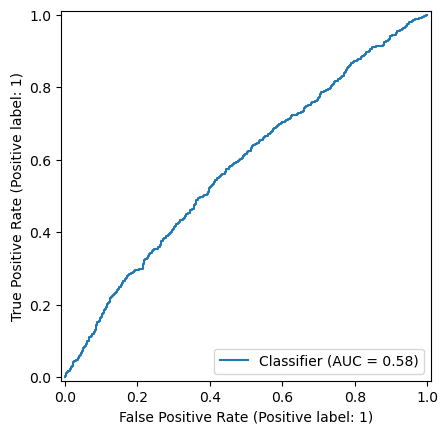

{0: 50, 1: 50} 35
Accuracy = 0.6212259835315646
ROC AUC = 0.5806058684803335
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.75      0.73      1485
           1       0.40      0.35      0.37       701

    accuracy                           0.62      2186
   macro avg       0.55      0.55      0.55      2186
weighted avg       0.61      0.62      0.61      2186

Confusion Matrix:


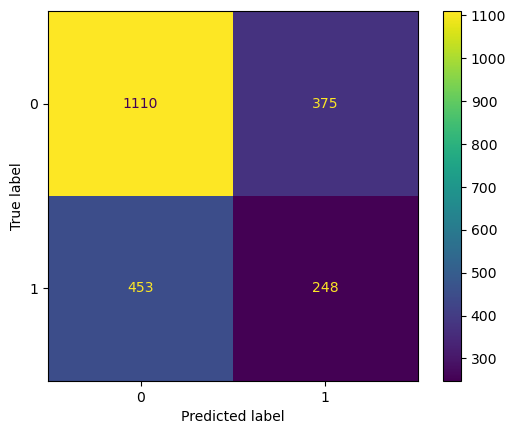

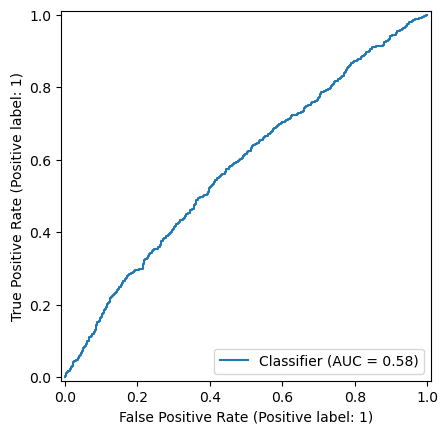

{0: 50, 1: 50} 36
Accuracy = 0.6322049405306496
ROC AUC = 0.5806058684803335
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.78      0.74      1485
           1       0.41      0.31      0.35       701

    accuracy                           0.63      2186
   macro avg       0.56      0.55      0.55      2186
weighted avg       0.61      0.63      0.62      2186

Confusion Matrix:


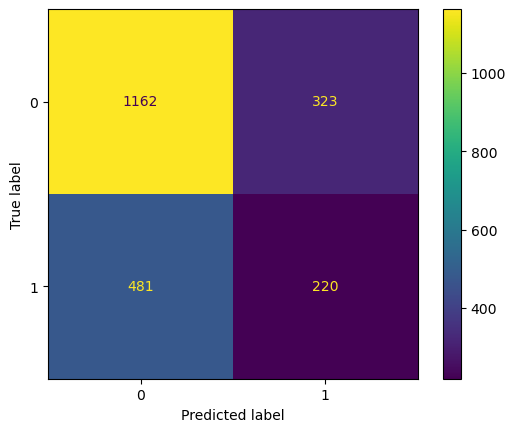

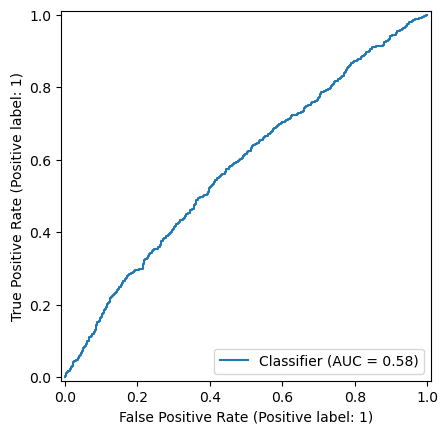

{0: 50, 1: 50} 37
Accuracy = 0.6463860933211345
ROC AUC = 0.5806058684803335
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.82      0.76      1485
           1       0.42      0.29      0.34       701

    accuracy                           0.65      2186
   macro avg       0.57      0.55      0.55      2186
weighted avg       0.62      0.65      0.62      2186

Confusion Matrix:


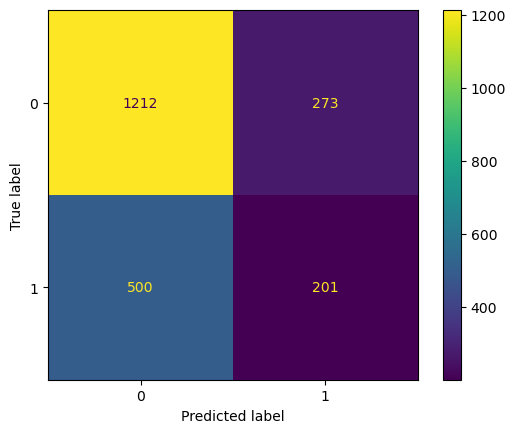

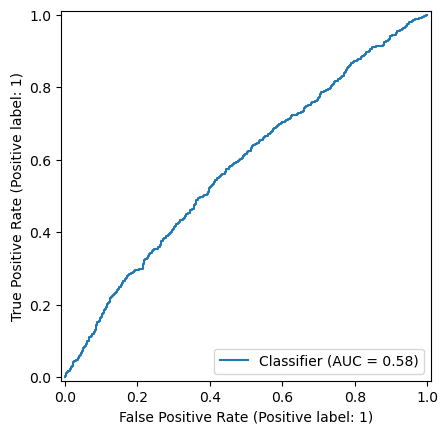

{0: 50, 1: 50} 38
Accuracy = 0.6550777676120768
ROC AUC = 0.5806058684803335
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.84      0.77      1485
           1       0.44      0.26      0.32       701

    accuracy                           0.66      2186
   macro avg       0.57      0.55      0.55      2186
weighted avg       0.62      0.66      0.63      2186

Confusion Matrix:


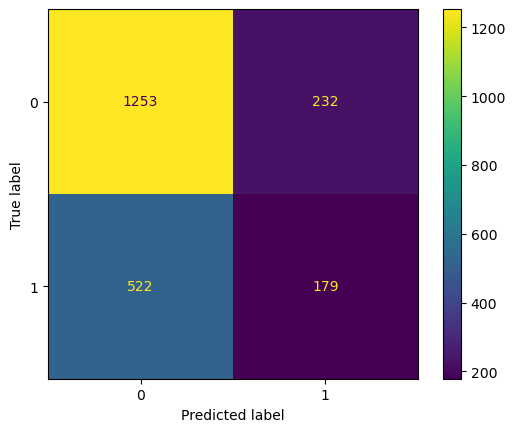

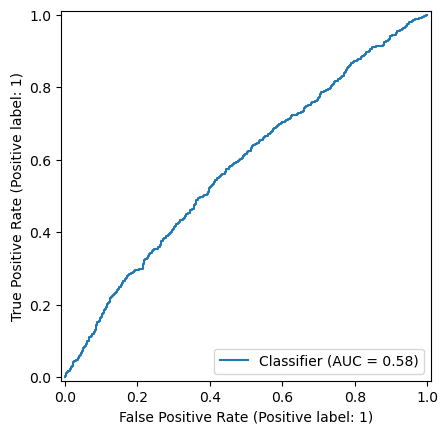

{0: 50, 1: 50} 39
Accuracy = 0.661024702653248
ROC AUC = 0.5806058684803335
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.87      0.78      1485
           1       0.44      0.23      0.30       701

    accuracy                           0.66      2186
   macro avg       0.57      0.55      0.54      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


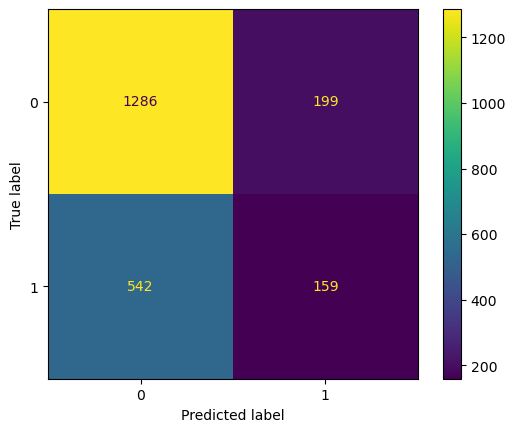

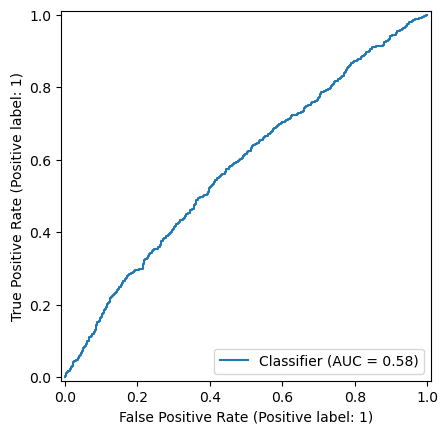

{0: 50, 1: 50} 40
Accuracy = 0.6633119853613907
ROC AUC = 0.5806058684803335
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.89      0.78      1485
           1       0.44      0.19      0.27       701

    accuracy                           0.66      2186
   macro avg       0.57      0.54      0.52      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


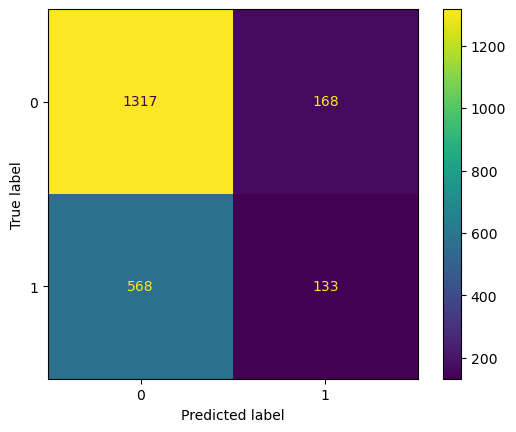

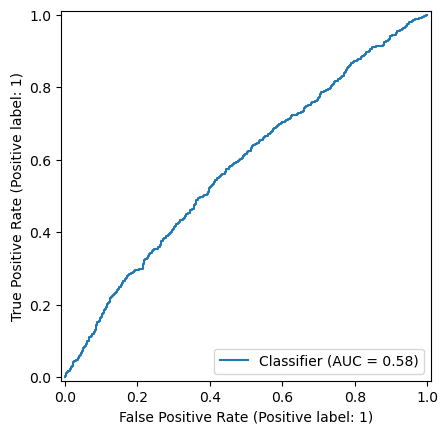

{0: 50, 1: 50} 41
Accuracy = 0.6646843549862763
ROC AUC = 0.5806058684803335
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.90      0.79      1485
           1       0.44      0.16      0.24       701

    accuracy                           0.66      2186
   macro avg       0.57      0.53      0.51      2186
weighted avg       0.61      0.66      0.61      2186

Confusion Matrix:


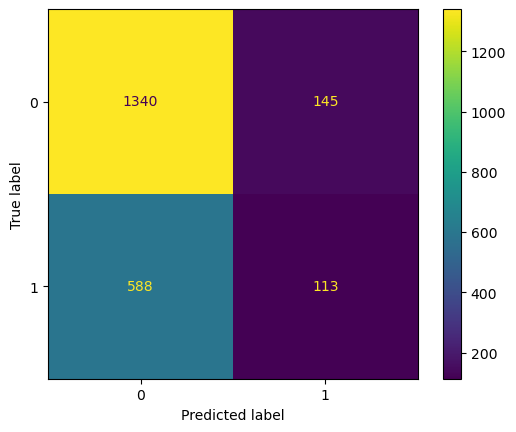

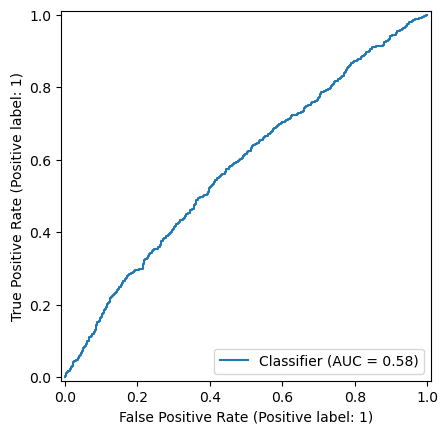

{0: 50, 1: 50} 42
Accuracy = 0.6642268984446478
ROC AUC = 0.5806058684803335
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.91      0.79      1485
           1       0.43      0.13      0.20       701

    accuracy                           0.66      2186
   macro avg       0.56      0.52      0.50      2186
weighted avg       0.61      0.66      0.60      2186

Confusion Matrix:


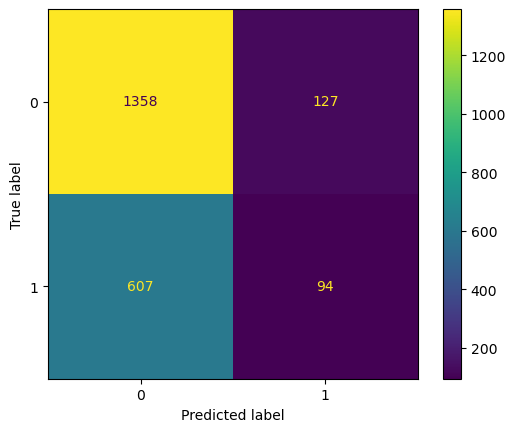

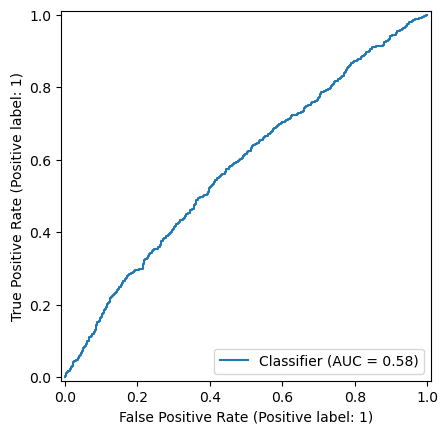

{0: 50, 1: 50} 43
Accuracy = 0.6688014638609332
ROC AUC = 0.5806058684803335
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.93      0.79      1485
           1       0.44      0.11      0.18       701

    accuracy                           0.67      2186
   macro avg       0.56      0.52      0.48      2186
weighted avg       0.61      0.67      0.59      2186

Confusion Matrix:


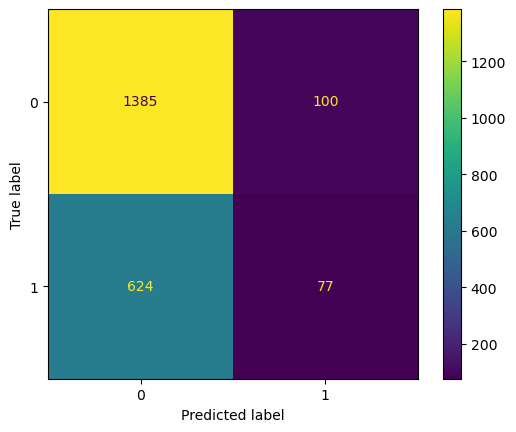

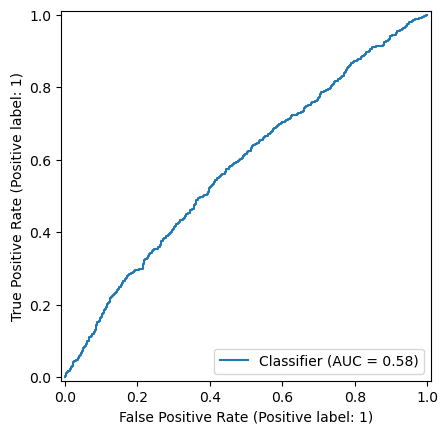

{0: 50, 1: 50} 44
Accuracy = 0.6688014638609332
ROC AUC = 0.5806058684803335
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.94      0.79      1485
           1       0.42      0.09      0.15       701

    accuracy                           0.67      2186
   macro avg       0.56      0.52      0.47      2186
weighted avg       0.60      0.67      0.59      2186

Confusion Matrix:


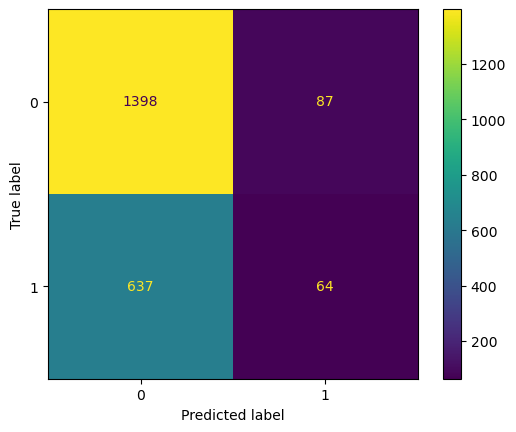

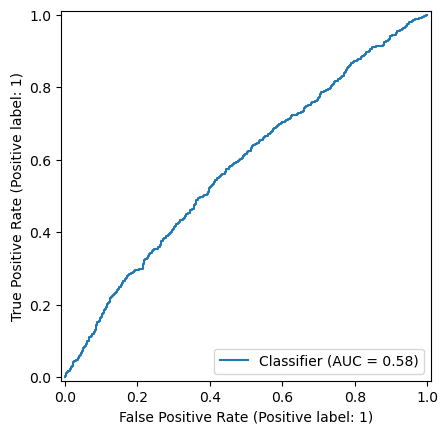

{0: 50, 1: 50} 45
Accuracy = 0.6706312900274474
ROC AUC = 0.5806058684803335
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.95      0.80      1485
           1       0.43      0.08      0.13       701

    accuracy                           0.67      2186
   macro avg       0.56      0.51      0.46      2186
weighted avg       0.60      0.67      0.58      2186

Confusion Matrix:


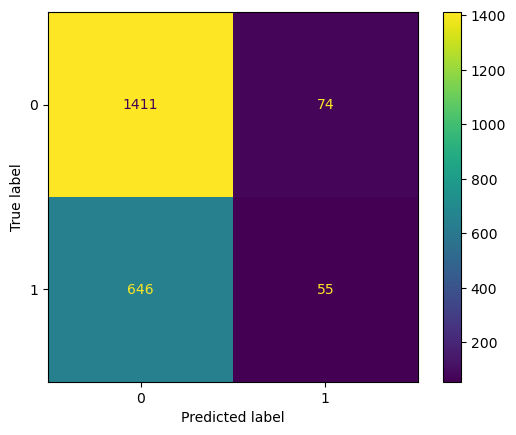

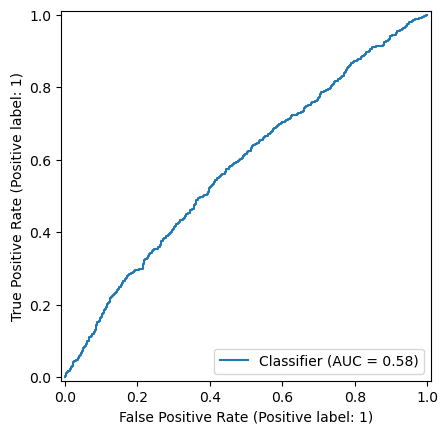

{0: 50, 1: 50} 46
Accuracy = 0.6706312900274474
ROC AUC = 0.5806058684803335
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.96      0.80      1485
           1       0.41      0.06      0.10       701

    accuracy                           0.67      2186
   macro avg       0.54      0.51      0.45      2186
weighted avg       0.59      0.67      0.58      2186

Confusion Matrix:


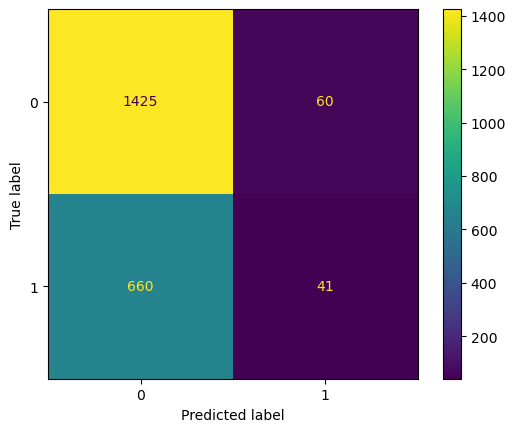

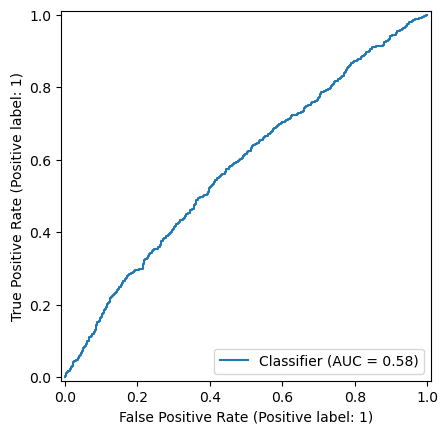

{0: 50, 1: 50} 47
Accuracy = 0.6752058554437328
ROC AUC = 0.5806058684803335
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.97      0.80      1485
           1       0.44      0.04      0.08       701

    accuracy                           0.68      2186
   macro avg       0.56      0.51      0.44      2186
weighted avg       0.60      0.68      0.57      2186

Confusion Matrix:


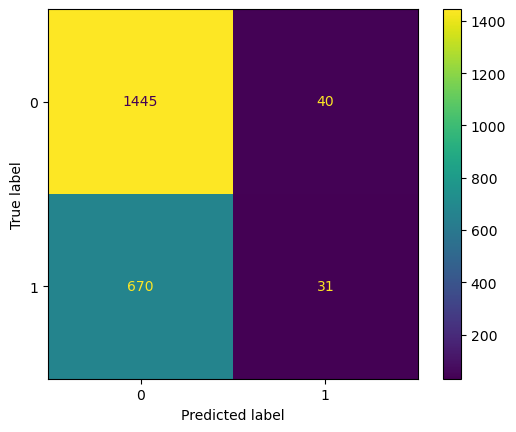

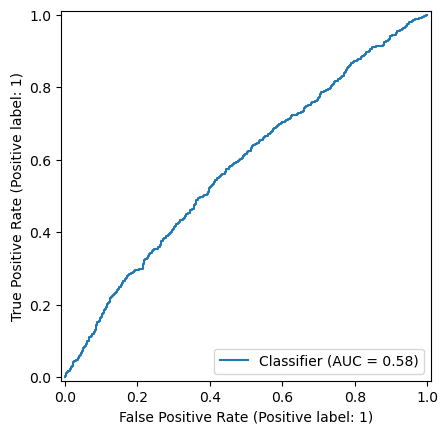

{0: 50, 1: 50} 48
Accuracy = 0.6747483989021043
ROC AUC = 0.5806058684803335
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.98      0.80      1485
           1       0.41      0.03      0.06       701

    accuracy                           0.67      2186
   macro avg       0.55      0.51      0.43      2186
weighted avg       0.60      0.67      0.57      2186

Confusion Matrix:


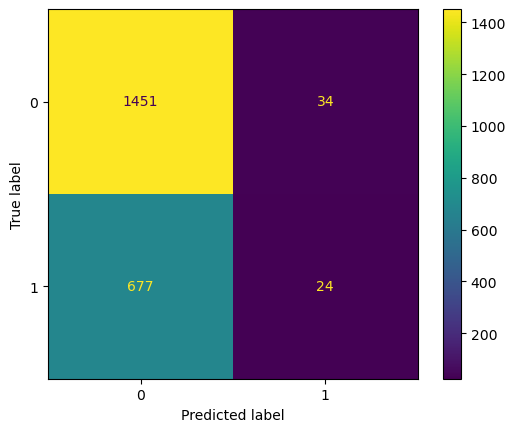

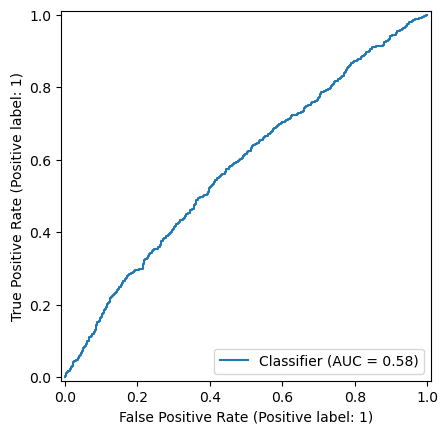

{0: 50, 1: 50} 49
Accuracy = 0.67612076852699
ROC AUC = 0.5806058684803335
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.98      0.80      1485
           1       0.43      0.03      0.05       701

    accuracy                           0.68      2186
   macro avg       0.55      0.51      0.43      2186
weighted avg       0.60      0.68      0.56      2186

Confusion Matrix:


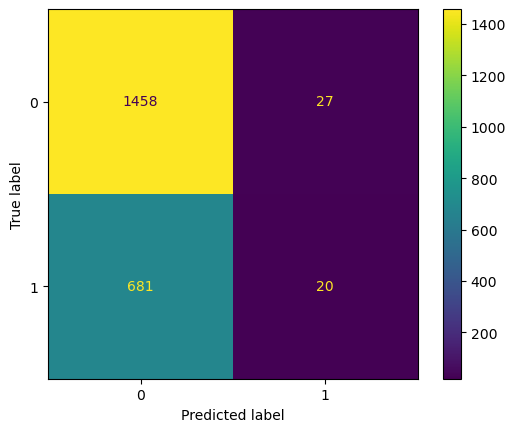

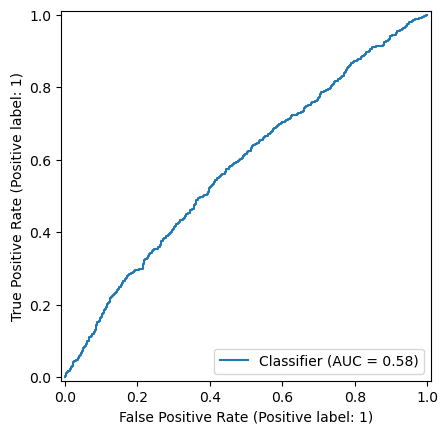

{0: 51, 1: 49} 30
Accuracy = 0.5672461116193962
ROC AUC = 0.58066062431255
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.57      0.64      1485
           1       0.38      0.55      0.45       701

    accuracy                           0.57      2186
   macro avg       0.56      0.56      0.55      2186
weighted avg       0.62      0.57      0.58      2186

Confusion Matrix:


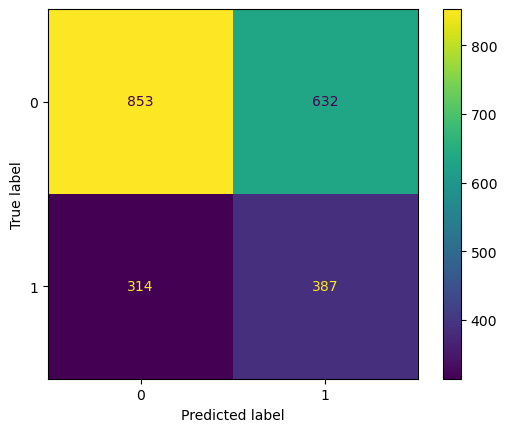

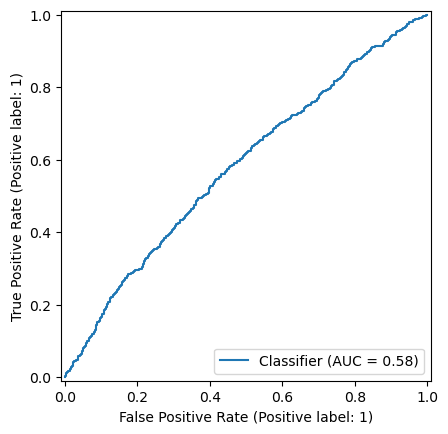

{0: 51, 1: 49} 31
Accuracy = 0.5800548947849954
ROC AUC = 0.58066062431255
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.62      0.67      1485
           1       0.38      0.50      0.43       701

    accuracy                           0.58      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.61      0.58      0.59      2186

Confusion Matrix:


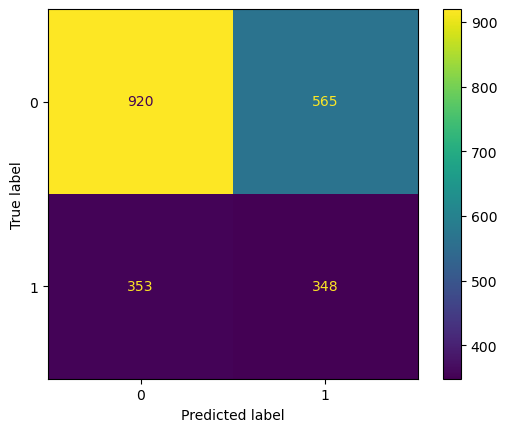

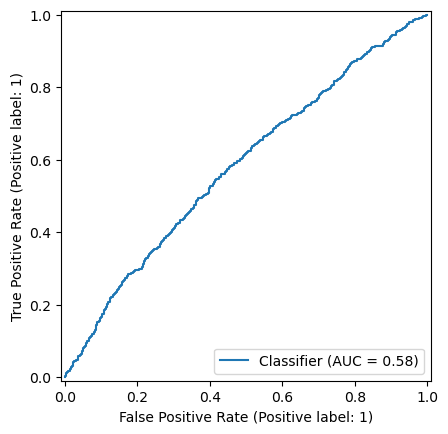

{0: 51, 1: 49} 32
Accuracy = 0.5942360475754803
ROC AUC = 0.58066062431255
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.66      0.69      1485
           1       0.39      0.45      0.42       701

    accuracy                           0.59      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.61      0.59      0.60      2186

Confusion Matrix:


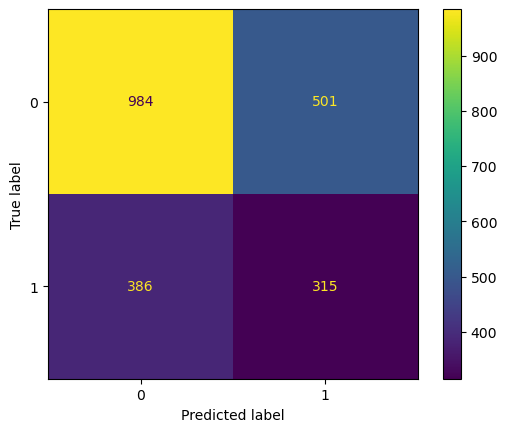

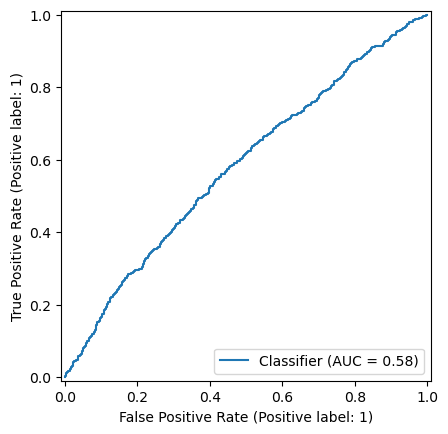

{0: 51, 1: 49} 33
Accuracy = 0.6075022872827082
ROC AUC = 0.58066062431255
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.70      0.71      1485
           1       0.39      0.40      0.40       701

    accuracy                           0.61      2186
   macro avg       0.55      0.55      0.55      2186
weighted avg       0.61      0.61      0.61      2186

Confusion Matrix:


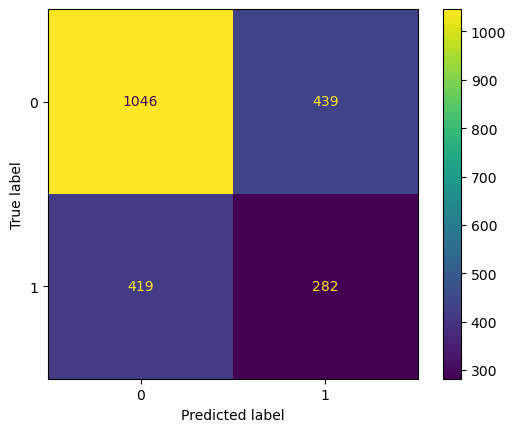

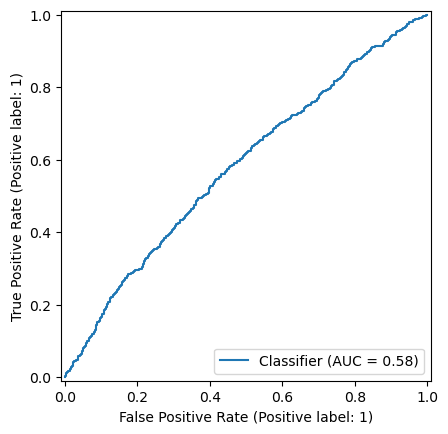

{0: 51, 1: 49} 34
Accuracy = 0.6193961573650503
ROC AUC = 0.58066062431255
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.74      0.73      1485
           1       0.40      0.36      0.38       701

    accuracy                           0.62      2186
   macro avg       0.55      0.55      0.55      2186
weighted avg       0.61      0.62      0.61      2186

Confusion Matrix:


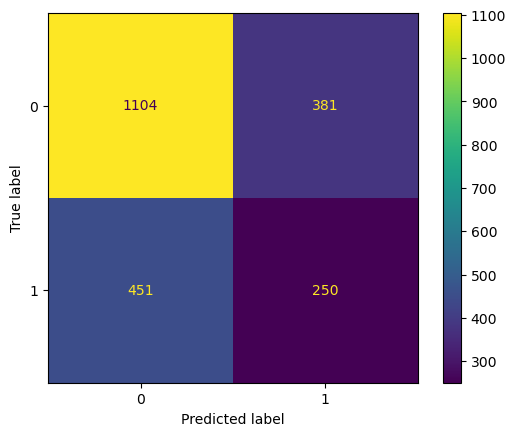

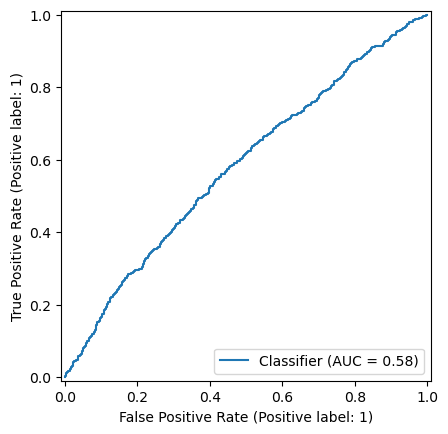

{0: 51, 1: 49} 35
Accuracy = 0.6326623970722781
ROC AUC = 0.58066062431255
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.78      0.74      1485
           1       0.41      0.32      0.36       701

    accuracy                           0.63      2186
   macro avg       0.56      0.55      0.55      2186
weighted avg       0.61      0.63      0.62      2186

Confusion Matrix:


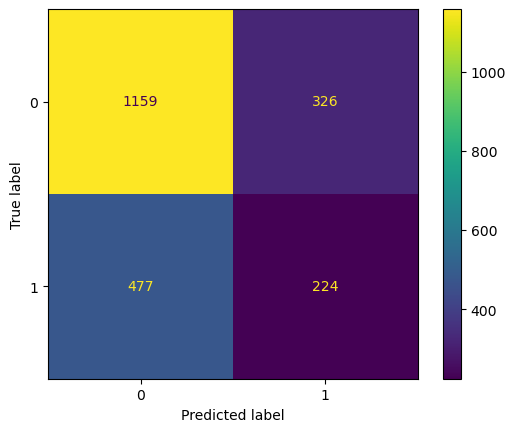

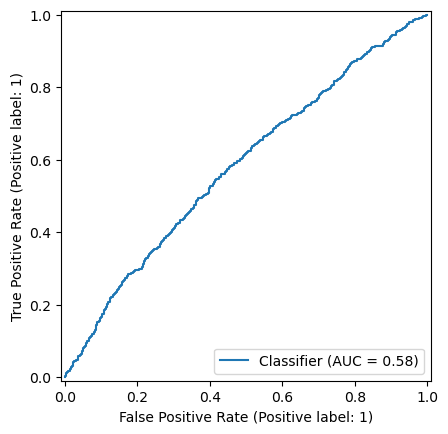

{0: 51, 1: 49} 36
Accuracy = 0.6440988106129918
ROC AUC = 0.58066062431255
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.81      0.76      1485
           1       0.42      0.29      0.34       701

    accuracy                           0.64      2186
   macro avg       0.56      0.55      0.55      2186
weighted avg       0.62      0.64      0.62      2186

Confusion Matrix:


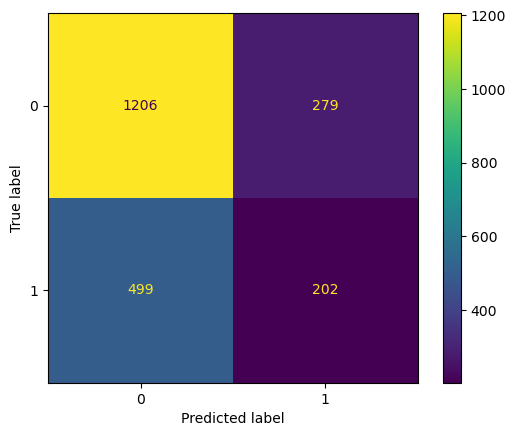

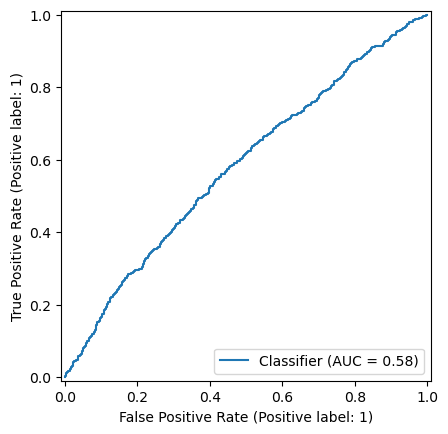

{0: 51, 1: 49} 37
Accuracy = 0.6546203110704483
ROC AUC = 0.58066062431255
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.84      0.77      1485
           1       0.43      0.26      0.32       701

    accuracy                           0.65      2186
   macro avg       0.57      0.55      0.54      2186
weighted avg       0.62      0.65      0.63      2186

Confusion Matrix:


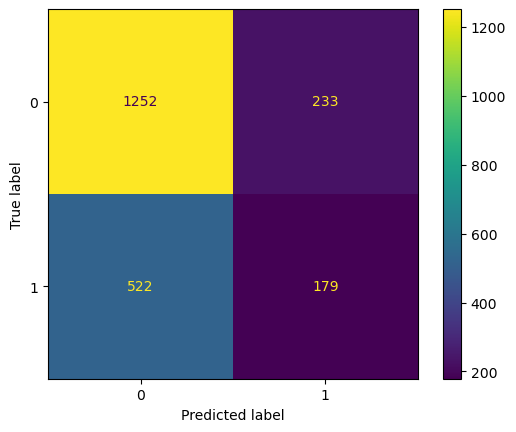

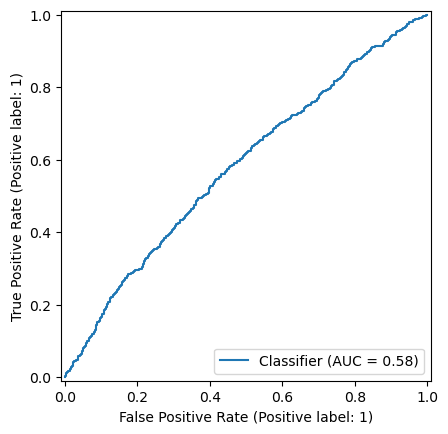

{0: 51, 1: 49} 38
Accuracy = 0.661024702653248
ROC AUC = 0.58066062431255
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.87      0.78      1485
           1       0.44      0.23      0.30       701

    accuracy                           0.66      2186
   macro avg       0.57      0.55      0.54      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


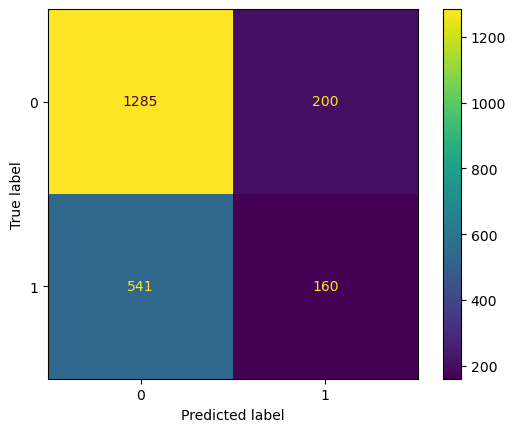

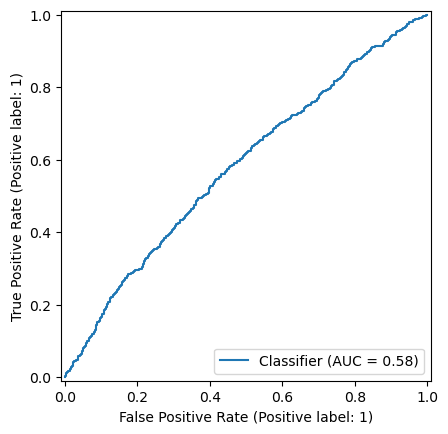

{0: 51, 1: 49} 39
Accuracy = 0.6642268984446478
ROC AUC = 0.58066062431255
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.89      0.78      1485
           1       0.45      0.19      0.27       701

    accuracy                           0.66      2186
   macro avg       0.57      0.54      0.53      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


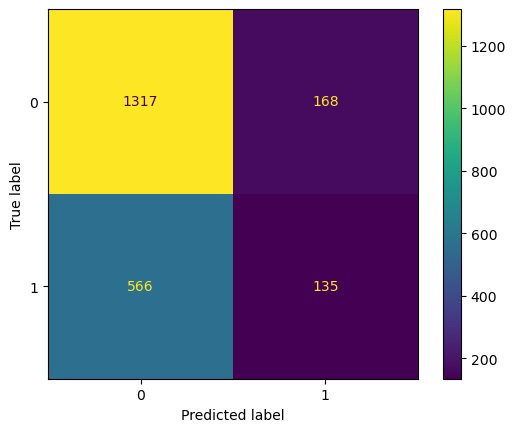

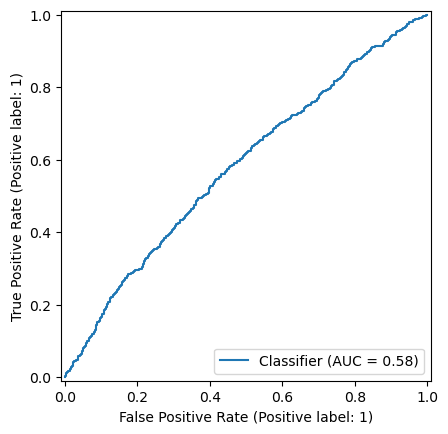

{0: 51, 1: 49} 40
Accuracy = 0.6646843549862763
ROC AUC = 0.58066062431255
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.90      0.79      1485
           1       0.44      0.16      0.24       701

    accuracy                           0.66      2186
   macro avg       0.57      0.53      0.51      2186
weighted avg       0.61      0.66      0.61      2186

Confusion Matrix:


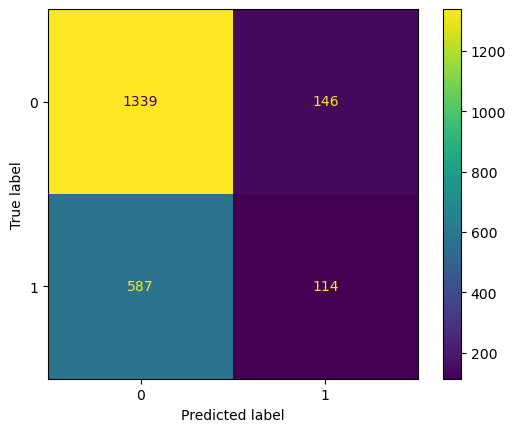

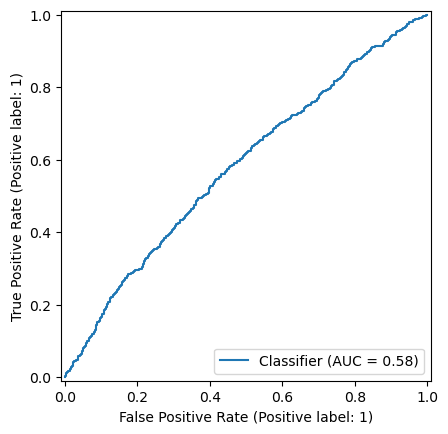

{0: 51, 1: 49} 41
Accuracy = 0.6655992680695334
ROC AUC = 0.58066062431255
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.91      0.79      1485
           1       0.43      0.14      0.21       701

    accuracy                           0.67      2186
   macro avg       0.56      0.53      0.50      2186
weighted avg       0.61      0.67      0.60      2186

Confusion Matrix:


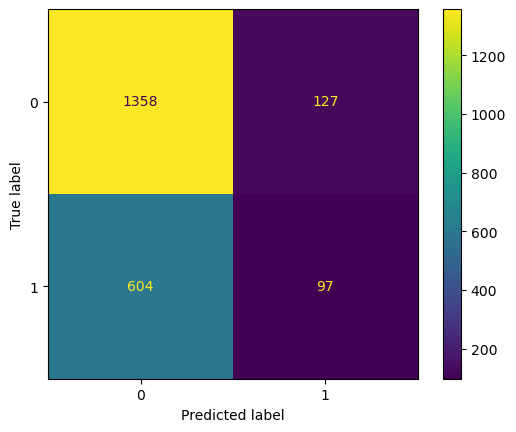

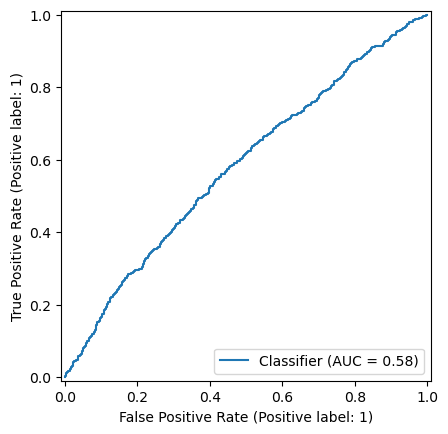

{0: 51, 1: 49} 42
Accuracy = 0.6678865507776761
ROC AUC = 0.58066062431255
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.93      0.79      1485
           1       0.43      0.11      0.17       701

    accuracy                           0.67      2186
   macro avg       0.56      0.52      0.48      2186
weighted avg       0.61      0.67      0.59      2186

Confusion Matrix:


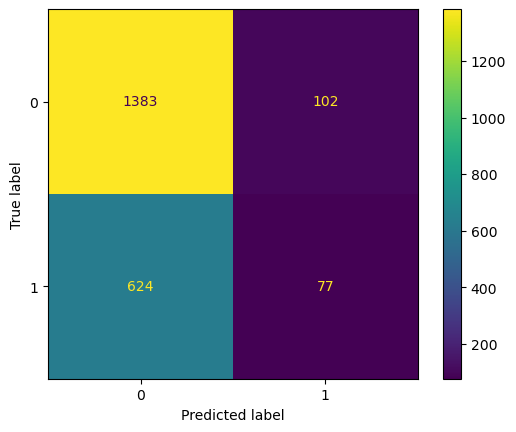

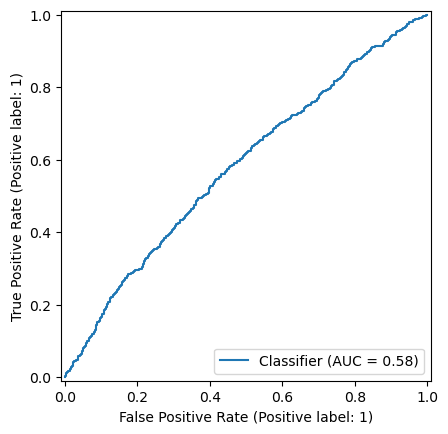

{0: 51, 1: 49} 43
Accuracy = 0.6683440073193047
ROC AUC = 0.58066062431255
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.94      0.79      1485
           1       0.42      0.09      0.15       701

    accuracy                           0.67      2186
   macro avg       0.55      0.52      0.47      2186
weighted avg       0.60      0.67      0.59      2186

Confusion Matrix:


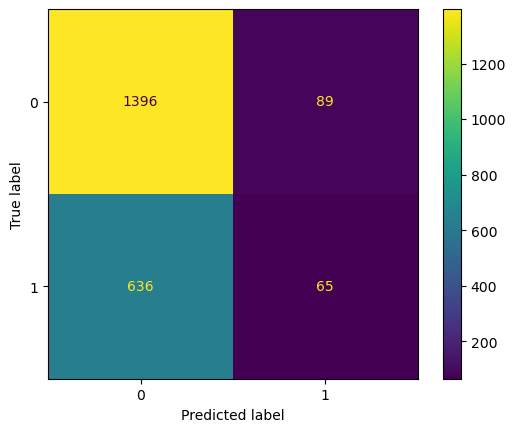

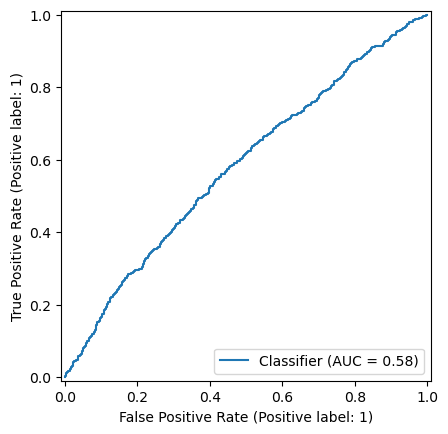

{0: 51, 1: 49} 44
Accuracy = 0.6706312900274474
ROC AUC = 0.58066062431255
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.95      0.80      1485
           1       0.43      0.08      0.13       701

    accuracy                           0.67      2186
   macro avg       0.56      0.51      0.46      2186
weighted avg       0.60      0.67      0.58      2186

Confusion Matrix:


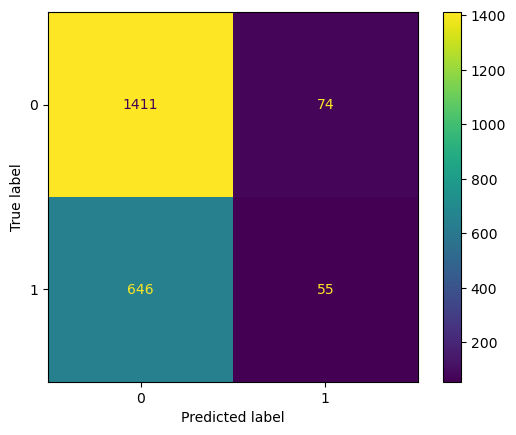

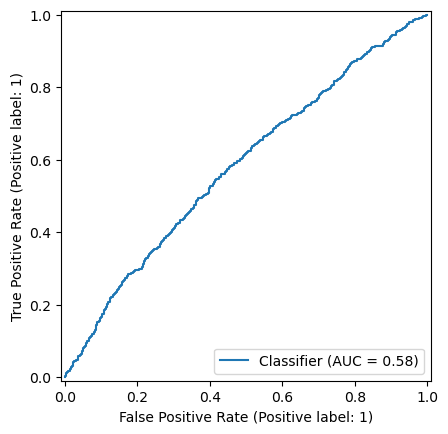

{0: 51, 1: 49} 45
Accuracy = 0.6706312900274474
ROC AUC = 0.58066062431255
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.96      0.80      1485
           1       0.41      0.06      0.10       701

    accuracy                           0.67      2186
   macro avg       0.54      0.51      0.45      2186
weighted avg       0.59      0.67      0.58      2186

Confusion Matrix:


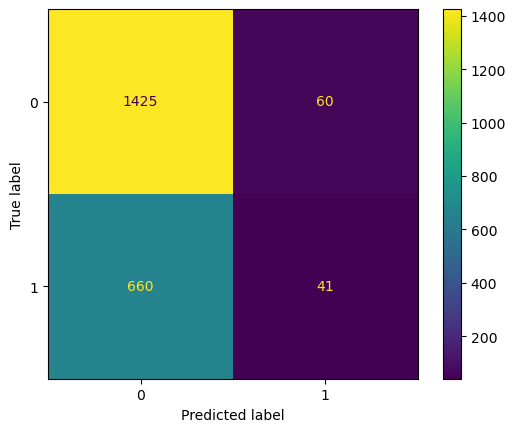

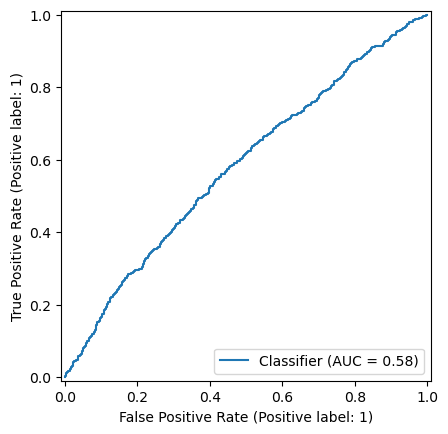

{0: 51, 1: 49} 46
Accuracy = 0.6756633119853613
ROC AUC = 0.58066062431255
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.97      0.80      1485
           1       0.44      0.04      0.08       701

    accuracy                           0.68      2186
   macro avg       0.56      0.51      0.44      2186
weighted avg       0.61      0.68      0.57      2186

Confusion Matrix:


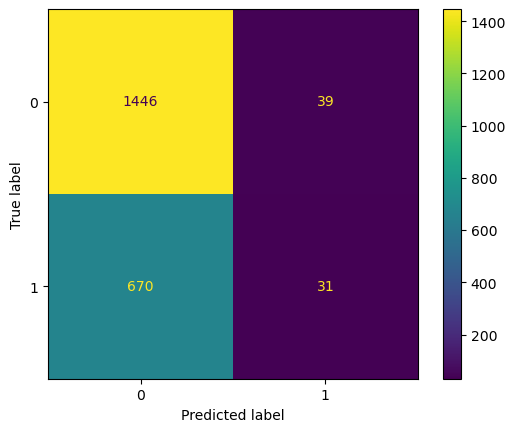

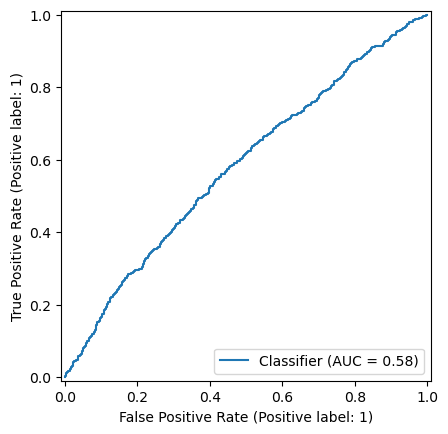

{0: 51, 1: 49} 47
Accuracy = 0.6752058554437328
ROC AUC = 0.58066062431255
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.98      0.80      1485
           1       0.42      0.04      0.07       701

    accuracy                           0.68      2186
   macro avg       0.55      0.51      0.43      2186
weighted avg       0.60      0.68      0.57      2186

Confusion Matrix:


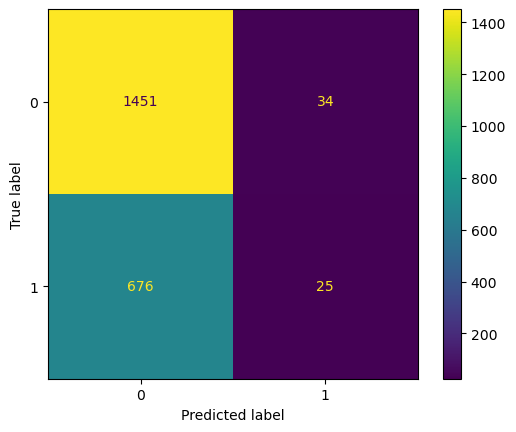

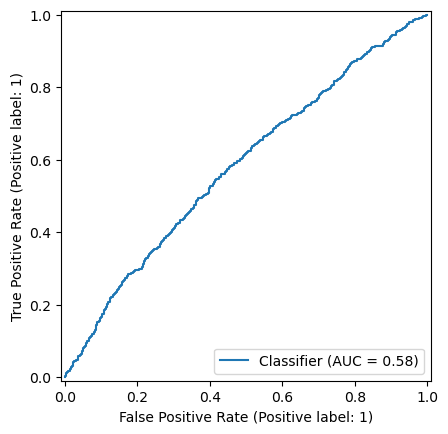

{0: 51, 1: 49} 48
Accuracy = 0.6756633119853613
ROC AUC = 0.58066062431255
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.98      0.80      1485
           1       0.41      0.03      0.05       701

    accuracy                           0.68      2186
   macro avg       0.55      0.50      0.43      2186
weighted avg       0.60      0.68      0.56      2186

Confusion Matrix:


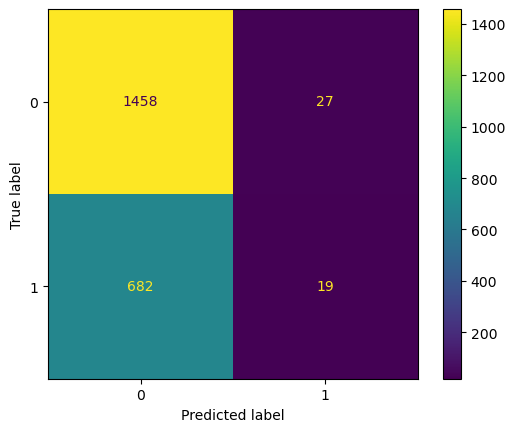

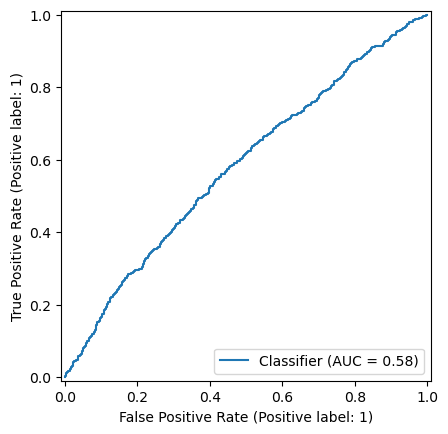

{0: 51, 1: 49} 49
Accuracy = 0.6765782250686185
ROC AUC = 0.58066062431255
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.99      0.81      1485
           1       0.41      0.02      0.04       701

    accuracy                           0.68      2186
   macro avg       0.54      0.50      0.42      2186
weighted avg       0.59      0.68      0.56      2186

Confusion Matrix:


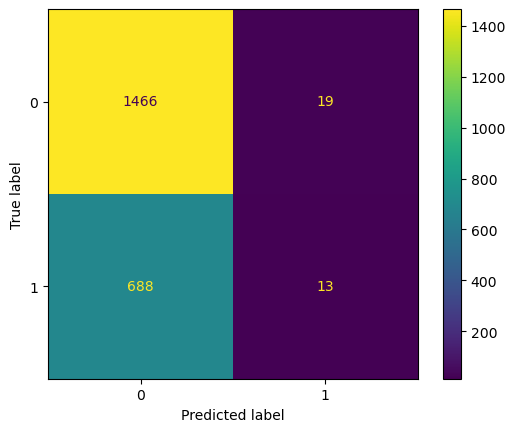

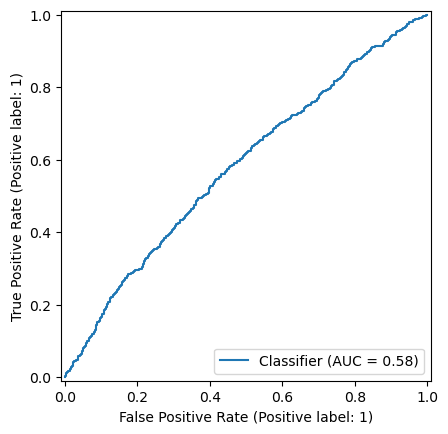

{0: 52, 1: 48} 30
Accuracy = 0.5768526989935956
ROC AUC = 0.5807086557443191
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.61      0.66      1485
           1       0.38      0.50      0.43       701

    accuracy                           0.58      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.61      0.58      0.59      2186

Confusion Matrix:


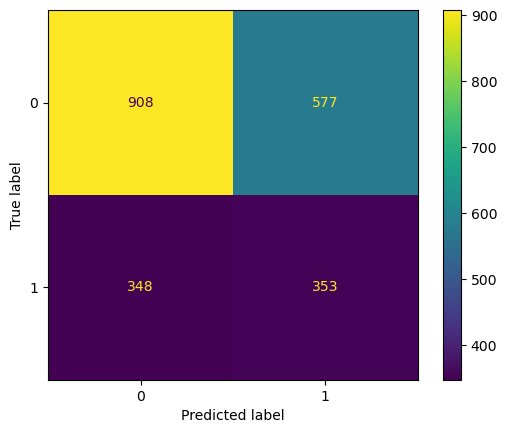

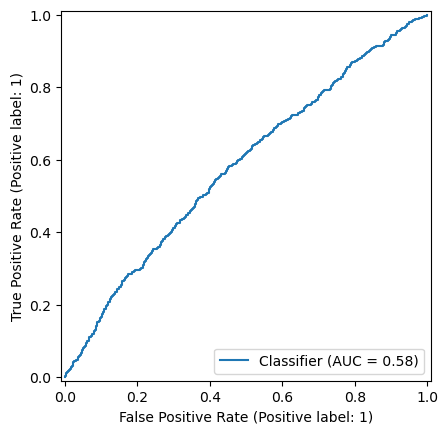

{0: 52, 1: 48} 31
Accuracy = 0.5933211344922232
ROC AUC = 0.5807086557443191
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.66      0.69      1485
           1       0.39      0.45      0.42       701

    accuracy                           0.59      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.61      0.59      0.60      2186

Confusion Matrix:


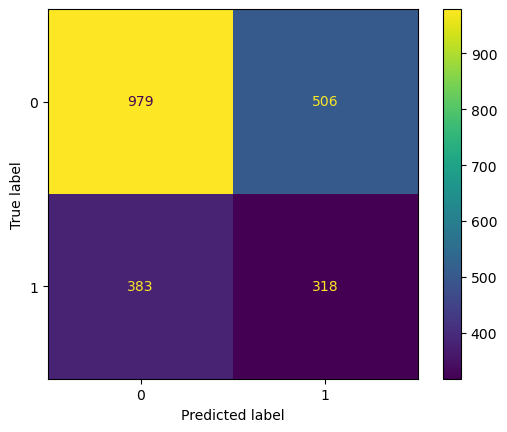

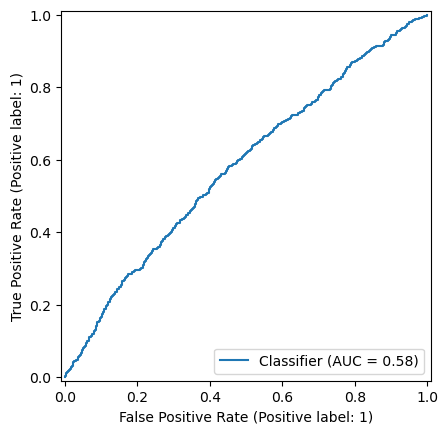

{0: 52, 1: 48} 32
Accuracy = 0.6065873741994511
ROC AUC = 0.5807086557443191
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.70      0.71      1485
           1       0.39      0.41      0.40       701

    accuracy                           0.61      2186
   macro avg       0.55      0.55      0.55      2186
weighted avg       0.61      0.61      0.61      2186

Confusion Matrix:


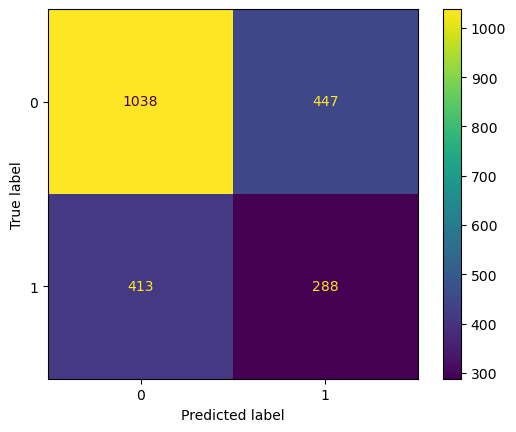

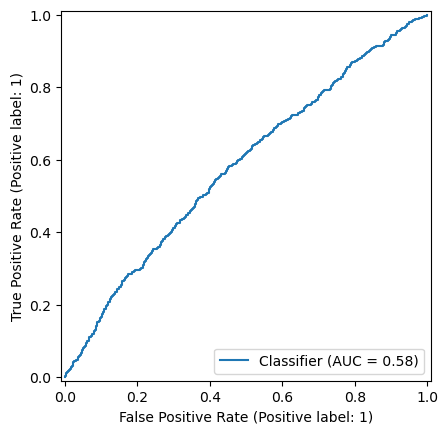

{0: 52, 1: 48} 33
Accuracy = 0.6171088746569076
ROC AUC = 0.5807086557443191
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.74      0.72      1485
           1       0.39      0.36      0.37       701

    accuracy                           0.62      2186
   macro avg       0.55      0.55      0.55      2186
weighted avg       0.61      0.62      0.61      2186

Confusion Matrix:


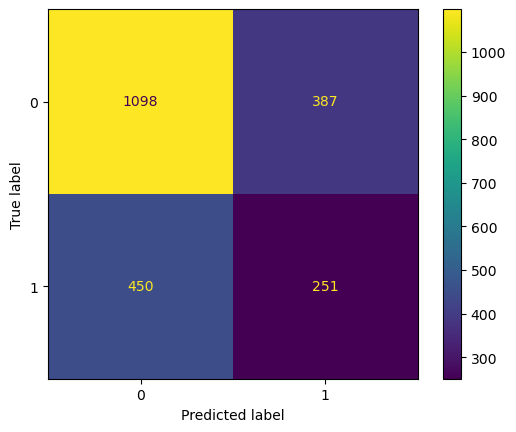

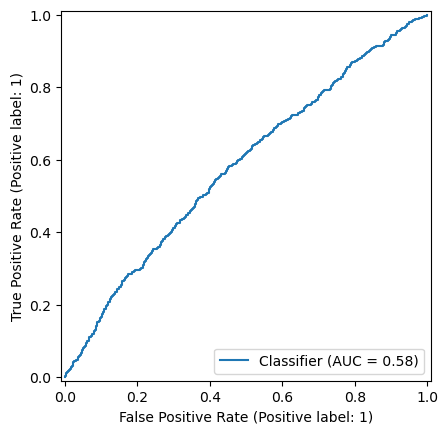

{0: 52, 1: 48} 34
Accuracy = 0.6322049405306496
ROC AUC = 0.5807086557443191
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.78      0.74      1485
           1       0.41      0.32      0.36       701

    accuracy                           0.63      2186
   macro avg       0.56      0.55      0.55      2186
weighted avg       0.61      0.63      0.62      2186

Confusion Matrix:


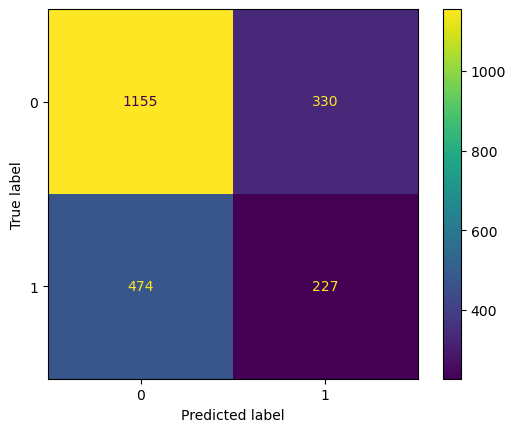

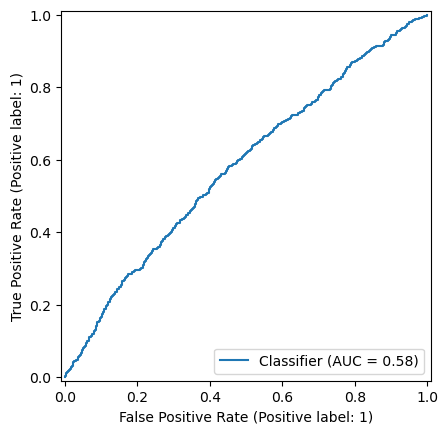

{0: 52, 1: 48} 35
Accuracy = 0.6445562671546203
ROC AUC = 0.5807086557443191
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.81      0.76      1485
           1       0.42      0.29      0.35       701

    accuracy                           0.64      2186
   macro avg       0.57      0.55      0.55      2186
weighted avg       0.62      0.64      0.62      2186

Confusion Matrix:


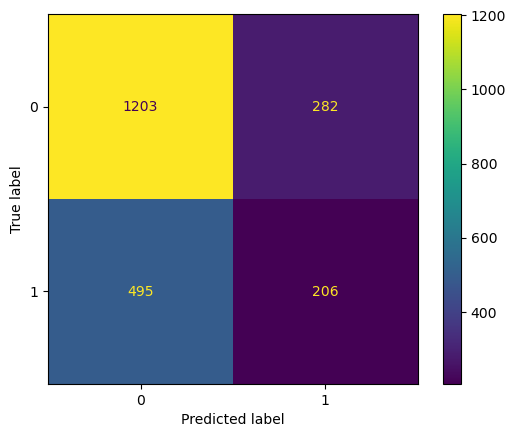

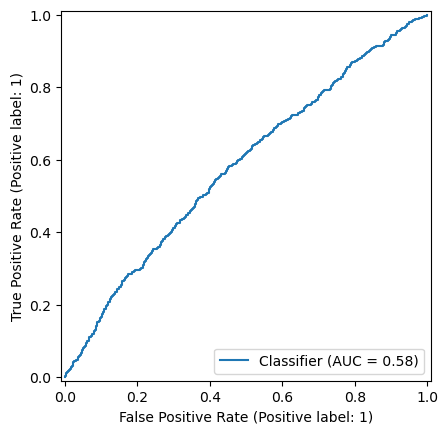

{0: 52, 1: 48} 36
Accuracy = 0.6546203110704483
ROC AUC = 0.5807086557443191
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.84      0.77      1485
           1       0.43      0.26      0.32       701

    accuracy                           0.65      2186
   macro avg       0.57      0.55      0.55      2186
weighted avg       0.62      0.65      0.63      2186

Confusion Matrix:


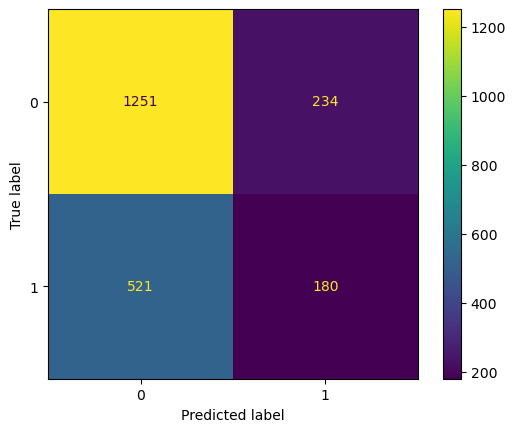

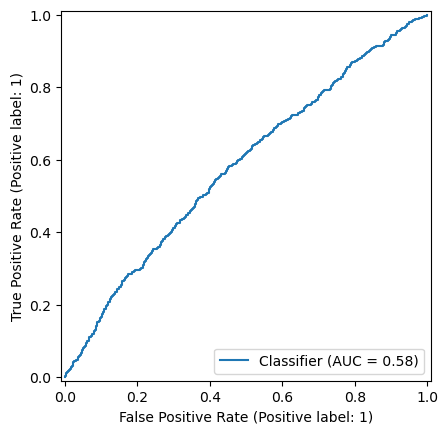

{0: 52, 1: 48} 37
Accuracy = 0.6605672461116194
ROC AUC = 0.5807086557443191
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.86      0.78      1485
           1       0.44      0.23      0.30       701

    accuracy                           0.66      2186
   macro avg       0.57      0.55      0.54      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


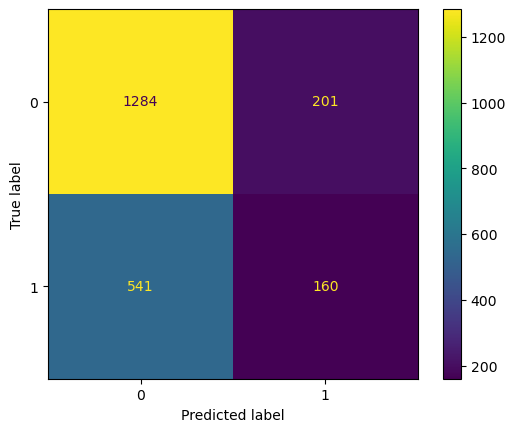

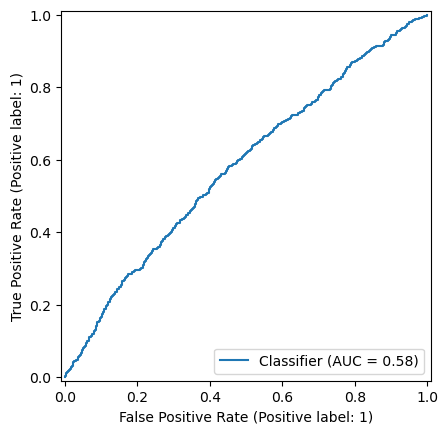

{0: 52, 1: 48} 38
Accuracy = 0.6642268984446478
ROC AUC = 0.5807086557443191
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.89      0.78      1485
           1       0.45      0.19      0.27       701

    accuracy                           0.66      2186
   macro avg       0.57      0.54      0.53      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


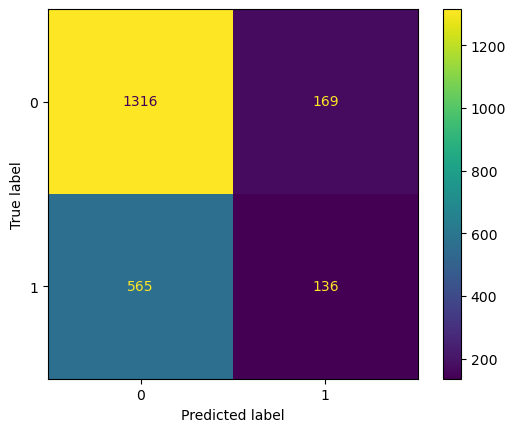

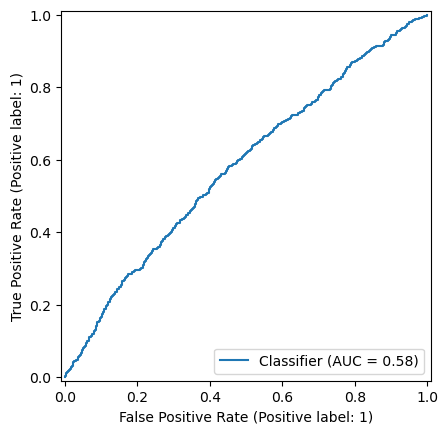

{0: 52, 1: 48} 39
Accuracy = 0.6642268984446478
ROC AUC = 0.5807086557443191
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.90      0.78      1485
           1       0.44      0.16      0.24       701

    accuracy                           0.66      2186
   macro avg       0.57      0.53      0.51      2186
weighted avg       0.61      0.66      0.61      2186

Confusion Matrix:


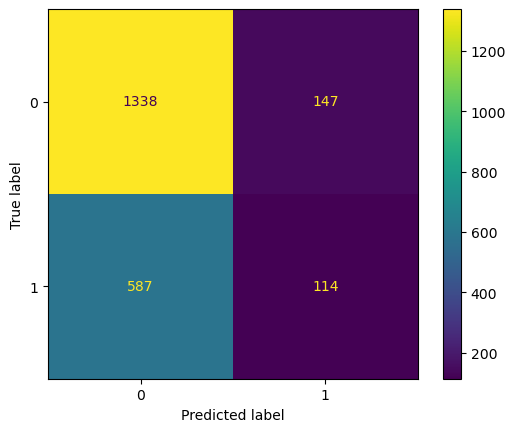

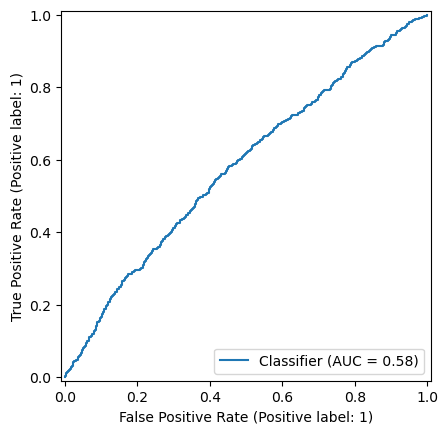

{0: 52, 1: 48} 40
Accuracy = 0.6655992680695334
ROC AUC = 0.5807086557443191
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.91      0.79      1485
           1       0.43      0.14      0.21       701

    accuracy                           0.67      2186
   macro avg       0.56      0.53      0.50      2186
weighted avg       0.61      0.67      0.60      2186

Confusion Matrix:


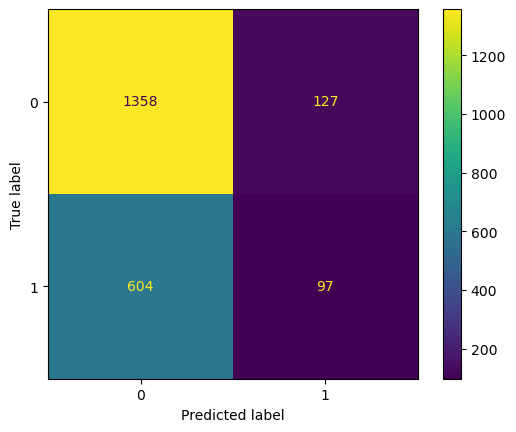

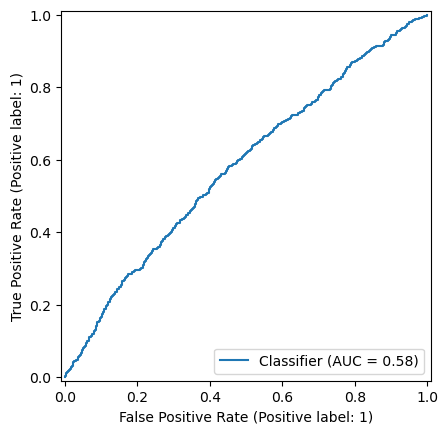

{0: 52, 1: 48} 41
Accuracy = 0.6678865507776761
ROC AUC = 0.5807086557443191
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.93      0.79      1485
           1       0.43      0.11      0.17       701

    accuracy                           0.67      2186
   macro avg       0.56      0.52      0.48      2186
weighted avg       0.61      0.67      0.59      2186

Confusion Matrix:


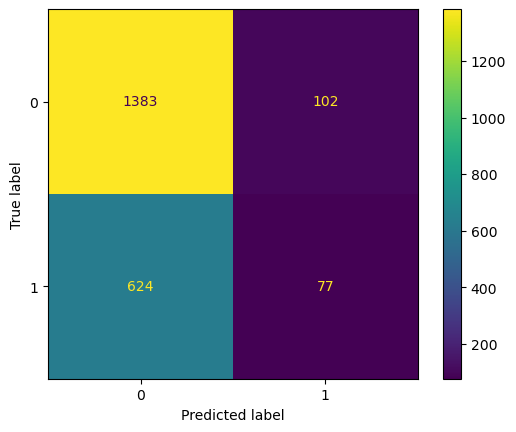

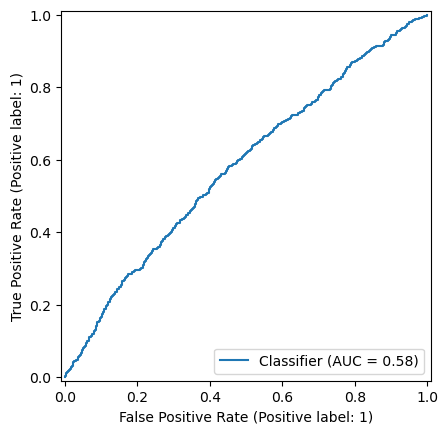

{0: 52, 1: 48} 42
Accuracy = 0.6688014638609332
ROC AUC = 0.5807086557443191
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.94      0.79      1485
           1       0.42      0.09      0.15       701

    accuracy                           0.67      2186
   macro avg       0.56      0.52      0.47      2186
weighted avg       0.60      0.67      0.59      2186

Confusion Matrix:


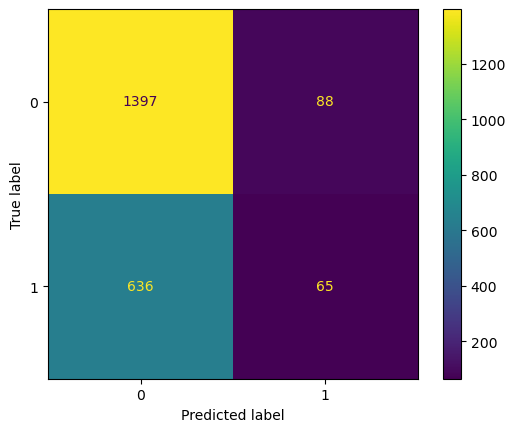

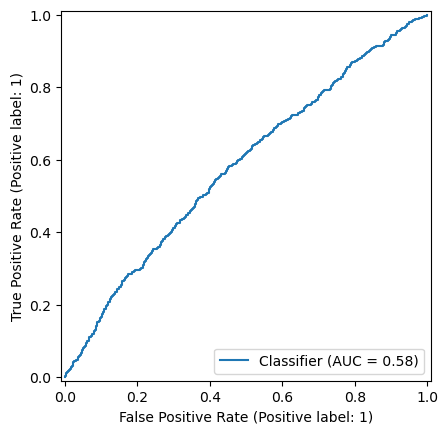

{0: 52, 1: 48} 43
Accuracy = 0.6706312900274474
ROC AUC = 0.5807086557443191
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.95      0.80      1485
           1       0.43      0.08      0.13       701

    accuracy                           0.67      2186
   macro avg       0.56      0.51      0.46      2186
weighted avg       0.60      0.67      0.58      2186

Confusion Matrix:


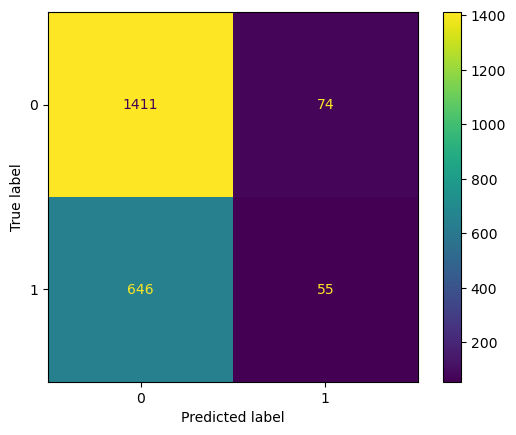

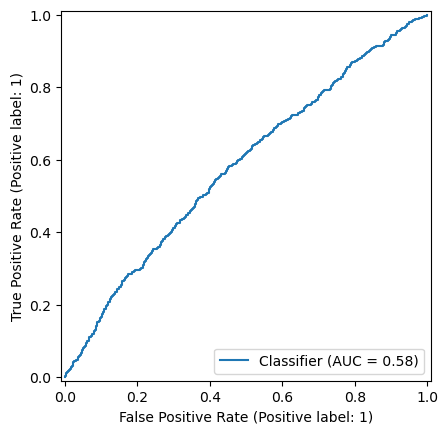

{0: 52, 1: 48} 44
Accuracy = 0.6697163769441903
ROC AUC = 0.5807086557443191
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.96      0.80      1485
           1       0.40      0.06      0.10       701

    accuracy                           0.67      2186
   macro avg       0.54      0.51      0.45      2186
weighted avg       0.59      0.67      0.57      2186

Confusion Matrix:


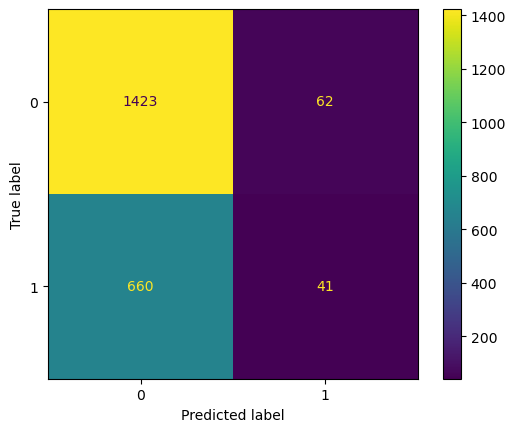

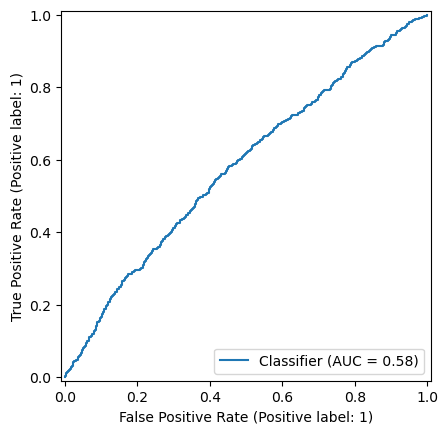

{0: 52, 1: 48} 45
Accuracy = 0.6756633119853613
ROC AUC = 0.5807086557443191
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.97      0.80      1485
           1       0.44      0.04      0.08       701

    accuracy                           0.68      2186
   macro avg       0.56      0.51      0.44      2186
weighted avg       0.61      0.68      0.57      2186

Confusion Matrix:


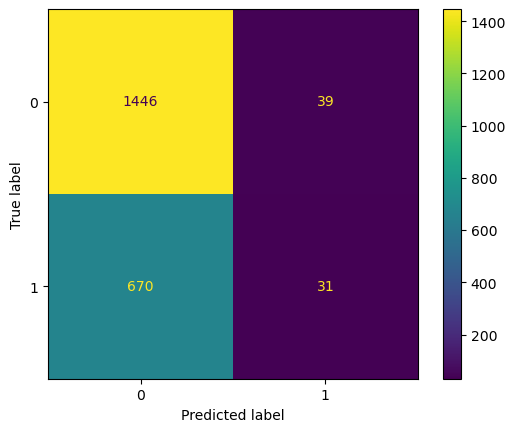

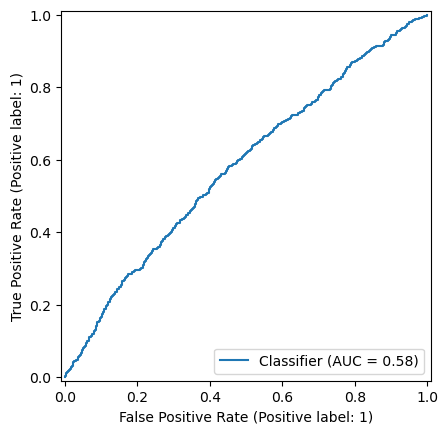

{0: 52, 1: 48} 46
Accuracy = 0.6747483989021043
ROC AUC = 0.5807086557443191
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.98      0.80      1485
           1       0.41      0.03      0.06       701

    accuracy                           0.67      2186
   macro avg       0.55      0.51      0.43      2186
weighted avg       0.60      0.67      0.57      2186

Confusion Matrix:


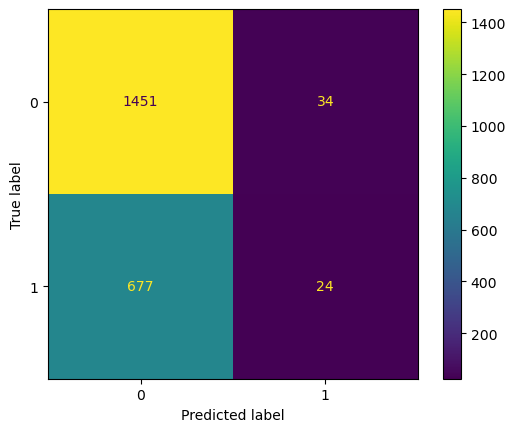

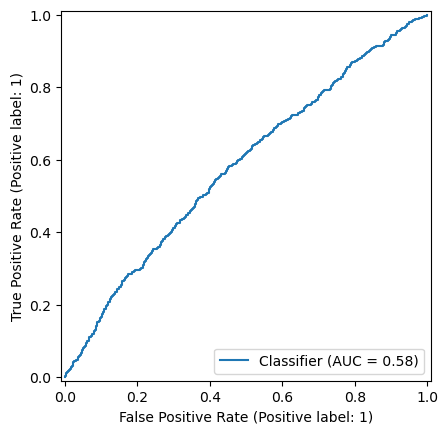

{0: 52, 1: 48} 47
Accuracy = 0.6756633119853613
ROC AUC = 0.5807086557443191
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.98      0.80      1485
           1       0.41      0.03      0.05       701

    accuracy                           0.68      2186
   macro avg       0.55      0.50      0.43      2186
weighted avg       0.60      0.68      0.56      2186

Confusion Matrix:


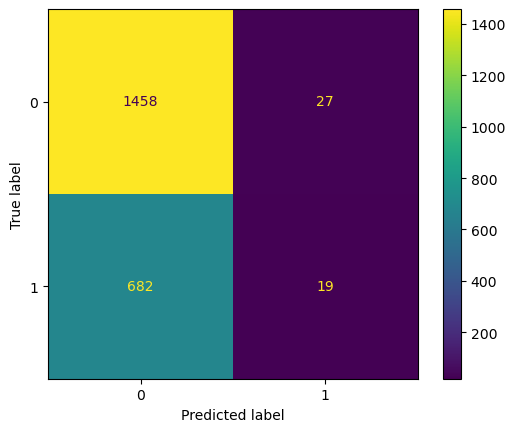

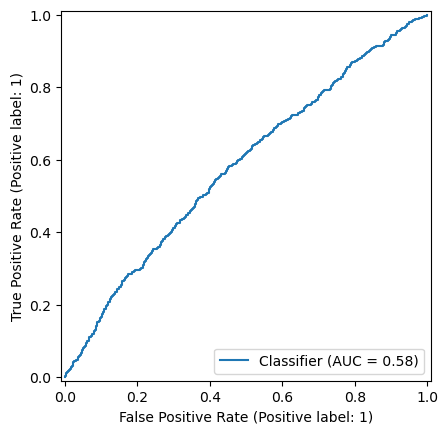

{0: 52, 1: 48} 48
Accuracy = 0.6765782250686185
ROC AUC = 0.5807086557443191
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.99      0.81      1485
           1       0.41      0.02      0.04       701

    accuracy                           0.68      2186
   macro avg       0.54      0.50      0.42      2186
weighted avg       0.59      0.68      0.56      2186

Confusion Matrix:


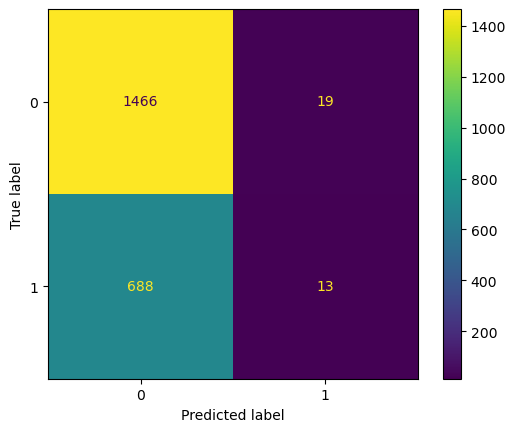

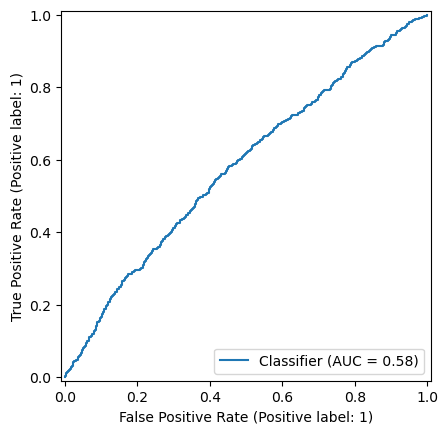

{0: 52, 1: 48} 49
Accuracy = 0.6784080512351327
ROC AUC = 0.5807086557443191
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.99      0.81      1485
           1       0.45      0.01      0.02       701

    accuracy                           0.68      2186
   macro avg       0.57      0.50      0.42      2186
weighted avg       0.61      0.68      0.56      2186

Confusion Matrix:


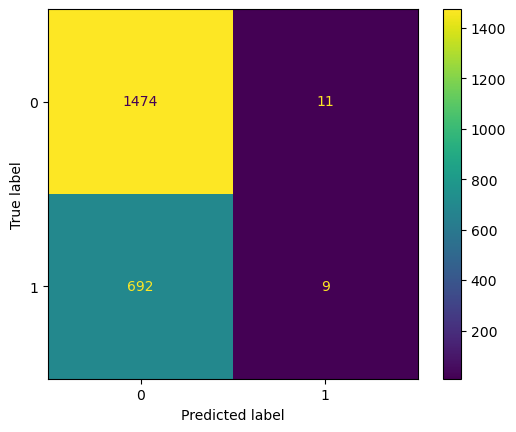

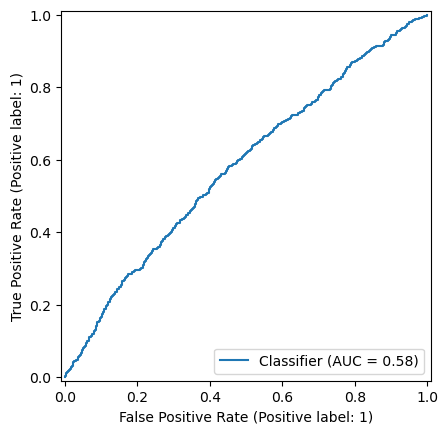

{0: 53, 1: 47} 30
Accuracy = 0.590576395242452
ROC AUC = 0.5806635061984563
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.65      0.68      1485
           1       0.38      0.46      0.42       701

    accuracy                           0.59      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.61      0.59      0.60      2186

Confusion Matrix:


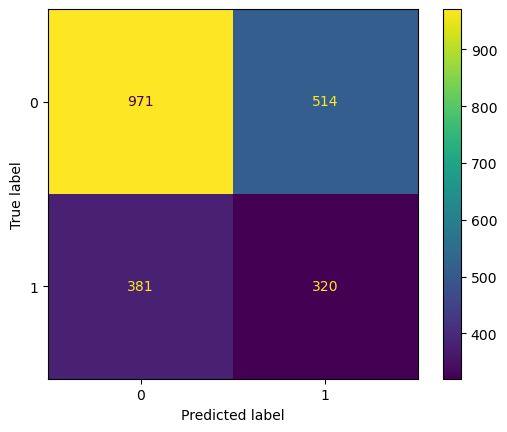

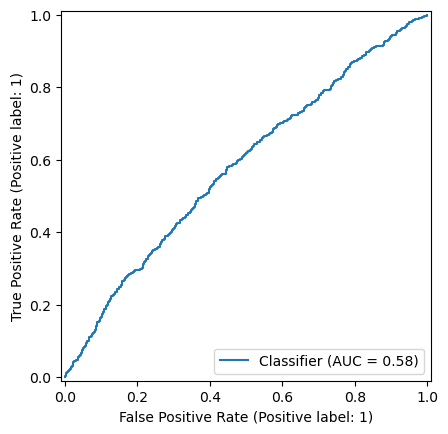

{0: 53, 1: 47} 31
Accuracy = 0.6065873741994511
ROC AUC = 0.5806635061984563
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.70      0.71      1485
           1       0.39      0.41      0.40       701

    accuracy                           0.61      2186
   macro avg       0.55      0.56      0.55      2186
weighted avg       0.61      0.61      0.61      2186

Confusion Matrix:


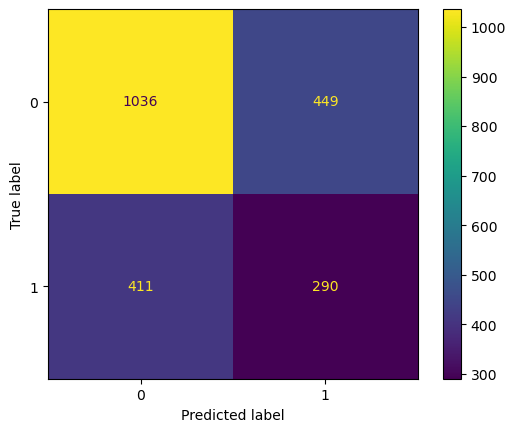

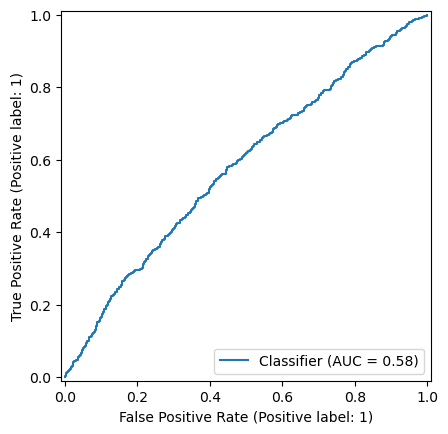

{0: 53, 1: 47} 32
Accuracy = 0.6171088746569076
ROC AUC = 0.5806635061984563
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.74      0.72      1485
           1       0.39      0.36      0.38       701

    accuracy                           0.62      2186
   macro avg       0.55      0.55      0.55      2186
weighted avg       0.61      0.62      0.61      2186

Confusion Matrix:


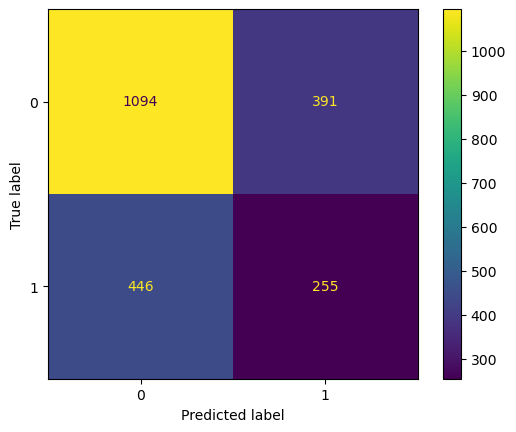

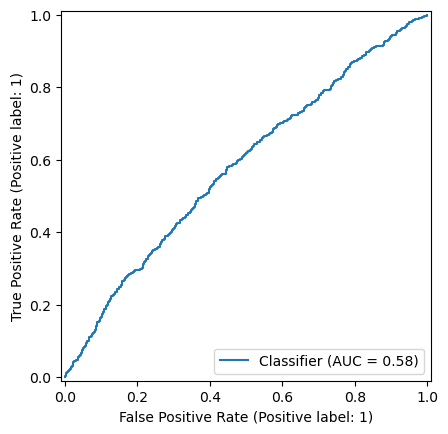

{0: 53, 1: 47} 33
Accuracy = 0.630832570905764
ROC AUC = 0.5806635061984563
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.77      0.74      1485
           1       0.41      0.33      0.36       701

    accuracy                           0.63      2186
   macro avg       0.56      0.55      0.55      2186
weighted avg       0.61      0.63      0.62      2186

Confusion Matrix:


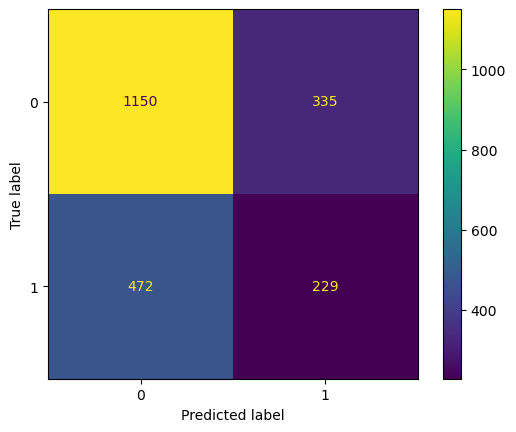

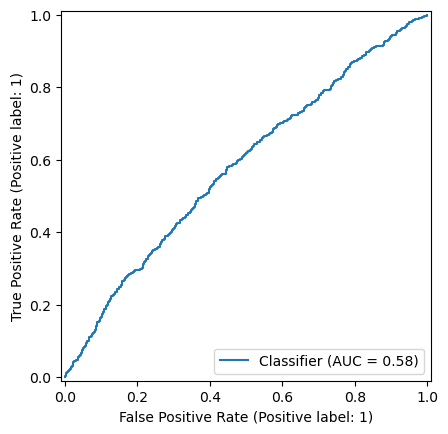

{0: 53, 1: 47} 34
Accuracy = 0.6422689844464776
ROC AUC = 0.5806635061984563
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.81      0.75      1485
           1       0.42      0.30      0.35       701

    accuracy                           0.64      2186
   macro avg       0.56      0.55      0.55      2186
weighted avg       0.61      0.64      0.62      2186

Confusion Matrix:


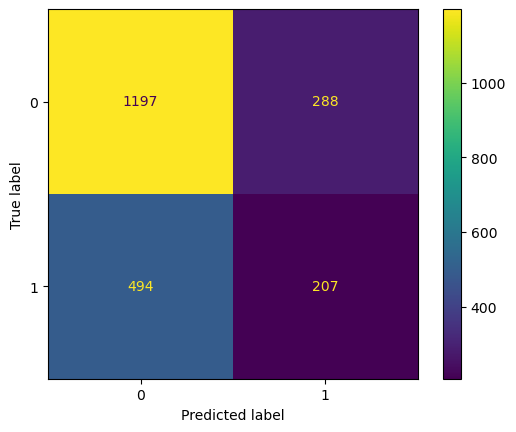

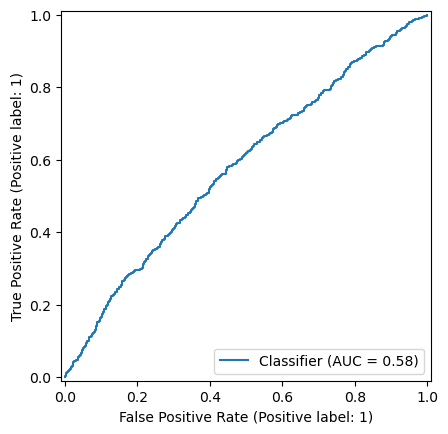

{0: 53, 1: 47} 35
Accuracy = 0.6559926806953339
ROC AUC = 0.5806635061984563
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.84      0.77      1485
           1       0.44      0.26      0.33       701

    accuracy                           0.66      2186
   macro avg       0.57      0.55      0.55      2186
weighted avg       0.62      0.66      0.63      2186

Confusion Matrix:


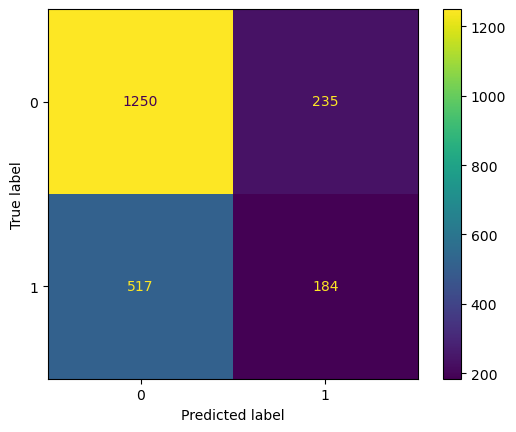

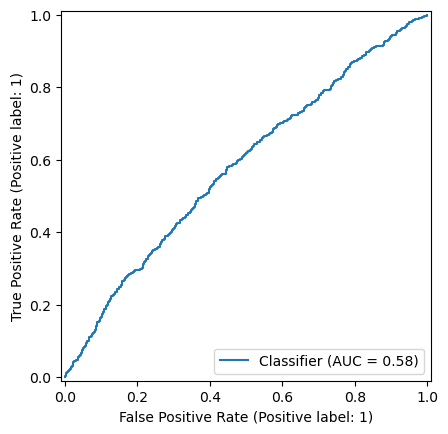

{0: 53, 1: 47} 36
Accuracy = 0.6601097895699909
ROC AUC = 0.5806635061984563
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.86      0.78      1485
           1       0.44      0.23      0.30       701

    accuracy                           0.66      2186
   macro avg       0.57      0.55      0.54      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


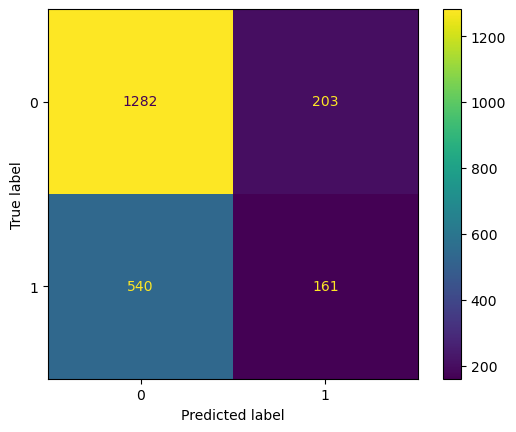

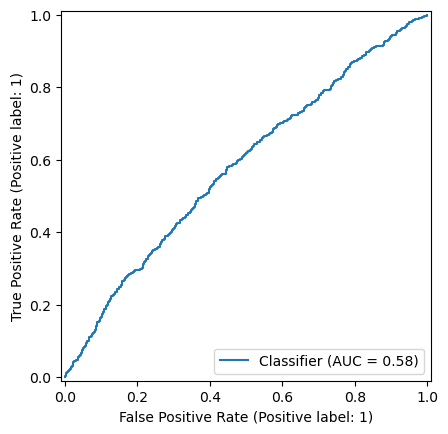

{0: 53, 1: 47} 37
Accuracy = 0.6646843549862763
ROC AUC = 0.5806635061984563
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.89      0.78      1485
           1       0.45      0.20      0.27       701

    accuracy                           0.66      2186
   macro avg       0.57      0.54      0.53      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


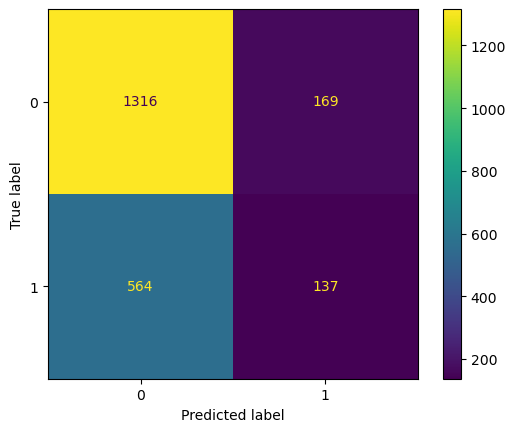

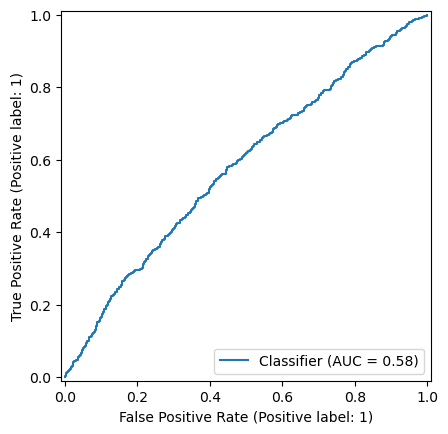

{0: 53, 1: 47} 38
Accuracy = 0.6642268984446478
ROC AUC = 0.5806635061984563
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.90      0.78      1485
           1       0.44      0.16      0.24       701

    accuracy                           0.66      2186
   macro avg       0.57      0.53      0.51      2186
weighted avg       0.61      0.66      0.61      2186

Confusion Matrix:


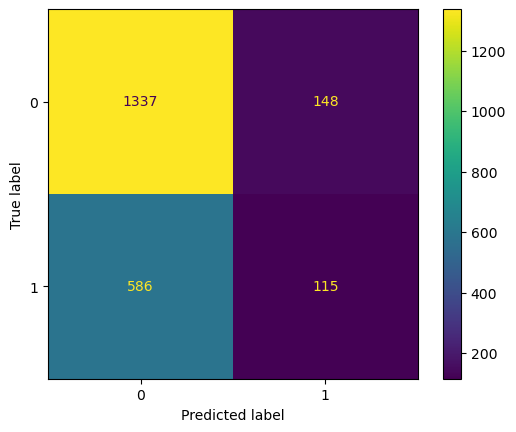

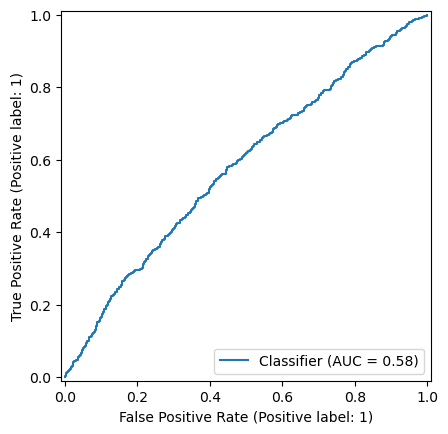

{0: 53, 1: 47} 39
Accuracy = 0.6665141811527905
ROC AUC = 0.5806635061984563
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.91      0.79      1485
           1       0.44      0.14      0.21       701

    accuracy                           0.67      2186
   macro avg       0.57      0.53      0.50      2186
weighted avg       0.61      0.67      0.60      2186

Confusion Matrix:


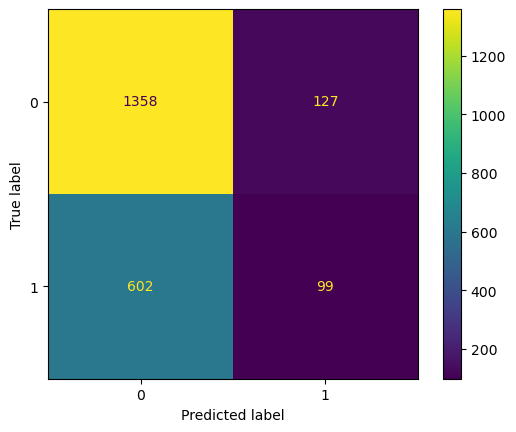

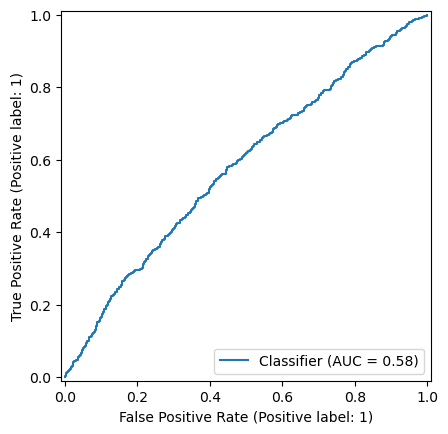

{0: 53, 1: 47} 40
Accuracy = 0.666971637694419
ROC AUC = 0.5806635061984563
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.93      0.79      1485
           1       0.43      0.11      0.17       701

    accuracy                           0.67      2186
   macro avg       0.56      0.52      0.48      2186
weighted avg       0.60      0.67      0.59      2186

Confusion Matrix:


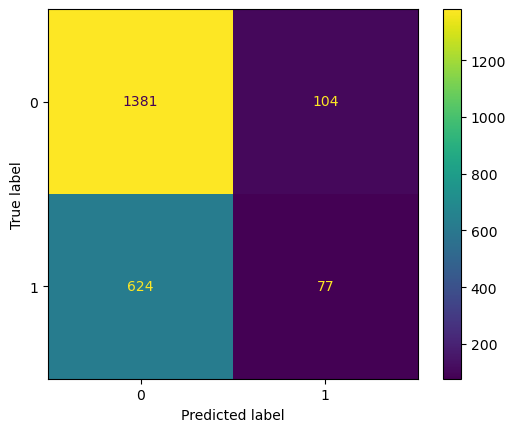

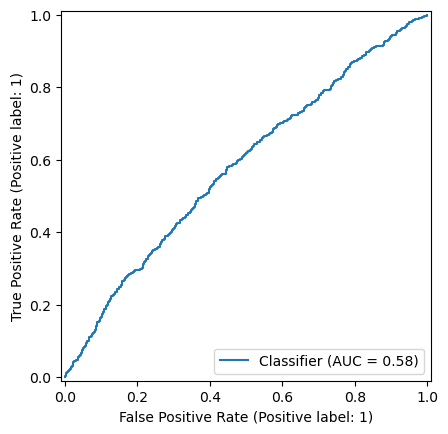

{0: 53, 1: 47} 41
Accuracy = 0.6683440073193047
ROC AUC = 0.5806635061984563
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.94      0.79      1485
           1       0.42      0.09      0.15       701

    accuracy                           0.67      2186
   macro avg       0.55      0.52      0.47      2186
weighted avg       0.60      0.67      0.59      2186

Confusion Matrix:


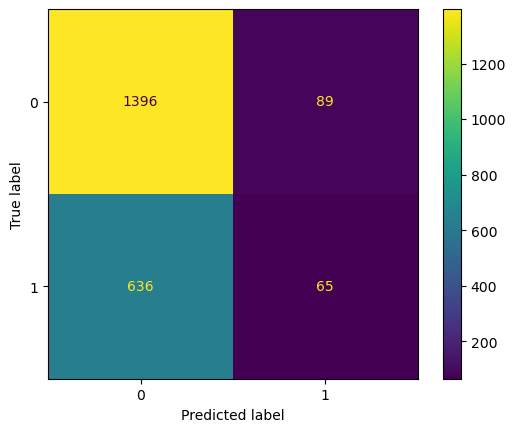

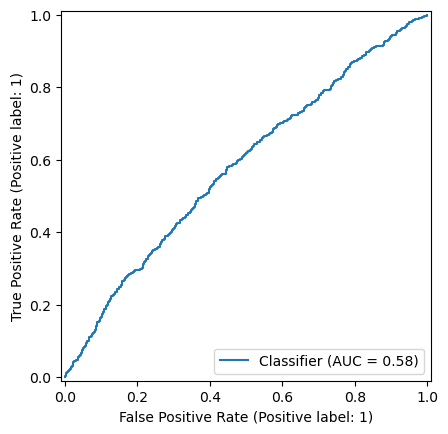

{0: 53, 1: 47} 42
Accuracy = 0.6706312900274474
ROC AUC = 0.5806635061984563
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.95      0.80      1485
           1       0.43      0.08      0.13       701

    accuracy                           0.67      2186
   macro avg       0.56      0.51      0.46      2186
weighted avg       0.60      0.67      0.58      2186

Confusion Matrix:


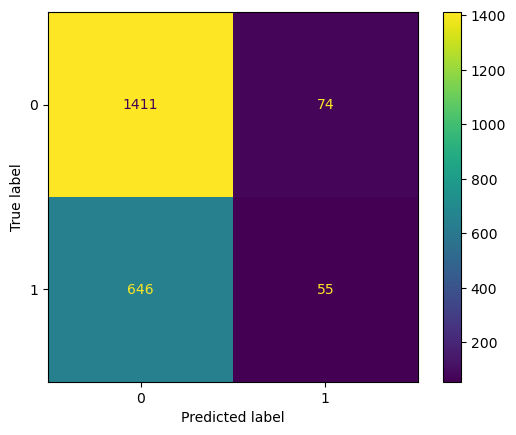

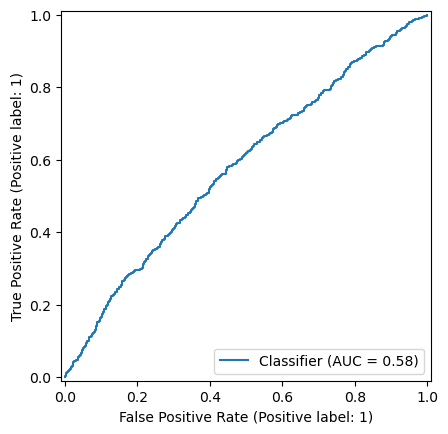

{0: 53, 1: 47} 43
Accuracy = 0.6706312900274474
ROC AUC = 0.5806635061984563
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.96      0.80      1485
           1       0.41      0.06      0.11       701

    accuracy                           0.67      2186
   macro avg       0.55      0.51      0.45      2186
weighted avg       0.60      0.67      0.58      2186

Confusion Matrix:


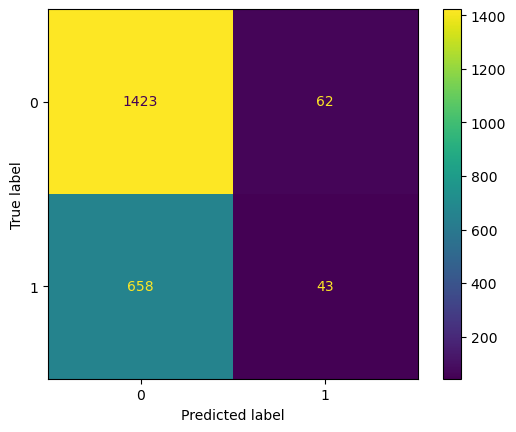

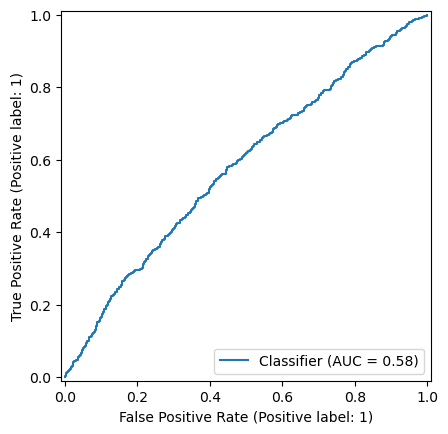

{0: 53, 1: 47} 44
Accuracy = 0.67612076852699
ROC AUC = 0.5806635061984563
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.97      0.80      1485
           1       0.45      0.05      0.08       701

    accuracy                           0.68      2186
   macro avg       0.57      0.51      0.44      2186
weighted avg       0.61      0.68      0.57      2186

Confusion Matrix:


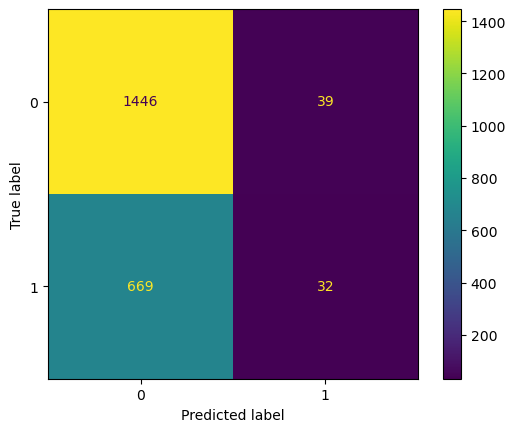

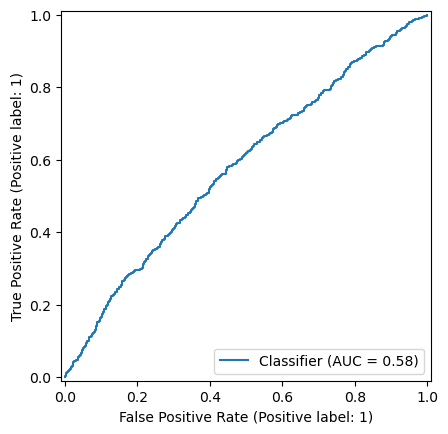

{0: 53, 1: 47} 45
Accuracy = 0.6752058554437328
ROC AUC = 0.5806635061984563
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.98      0.80      1485
           1       0.42      0.03      0.06       701

    accuracy                           0.68      2186
   macro avg       0.55      0.51      0.43      2186
weighted avg       0.60      0.68      0.57      2186

Confusion Matrix:


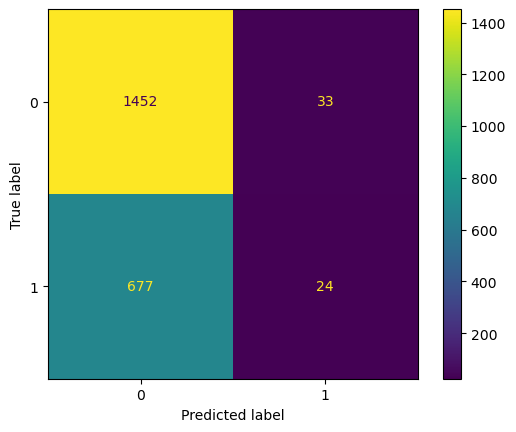

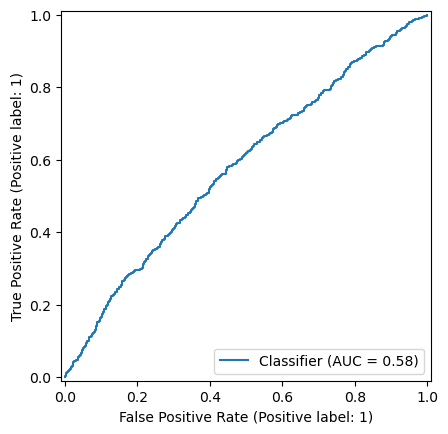

{0: 53, 1: 47} 46
Accuracy = 0.6756633119853613
ROC AUC = 0.5806635061984563
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.98      0.80      1485
           1       0.41      0.03      0.05       701

    accuracy                           0.68      2186
   macro avg       0.55      0.50      0.43      2186
weighted avg       0.60      0.68      0.56      2186

Confusion Matrix:


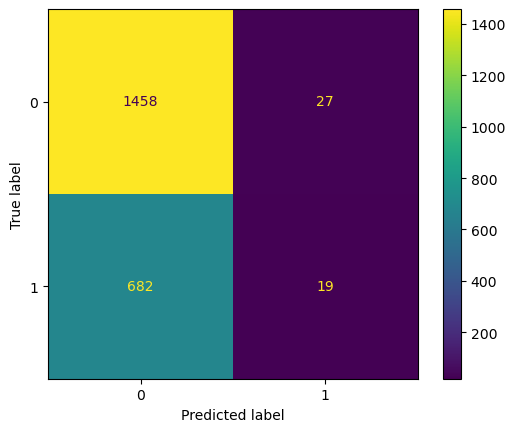

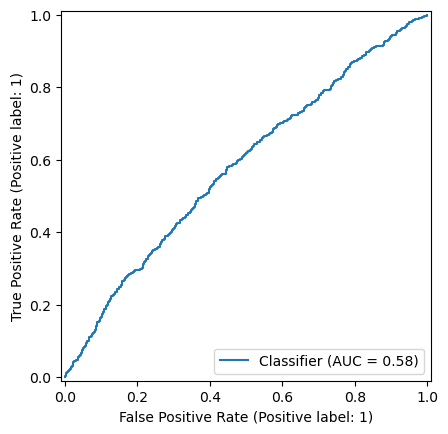

{0: 53, 1: 47} 47
Accuracy = 0.6770356816102471
ROC AUC = 0.5806635061984563
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.99      0.81      1485
           1       0.42      0.02      0.04       701

    accuracy                           0.68      2186
   macro avg       0.55      0.50      0.42      2186
weighted avg       0.60      0.68      0.56      2186

Confusion Matrix:


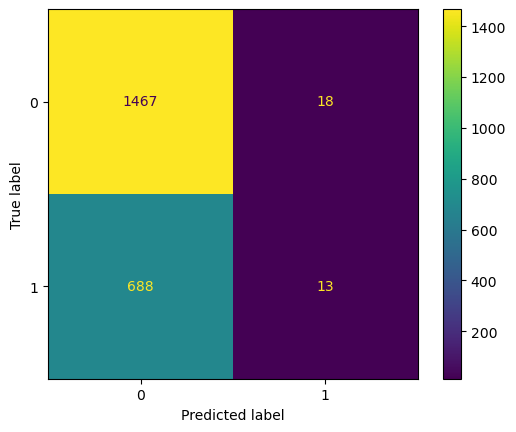

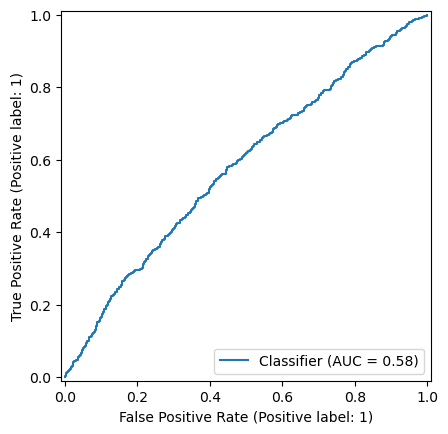

{0: 53, 1: 47} 48
Accuracy = 0.6784080512351327
ROC AUC = 0.5806635061984563
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.99      0.81      1485
           1       0.45      0.01      0.02       701

    accuracy                           0.68      2186
   macro avg       0.57      0.50      0.42      2186
weighted avg       0.61      0.68      0.56      2186

Confusion Matrix:


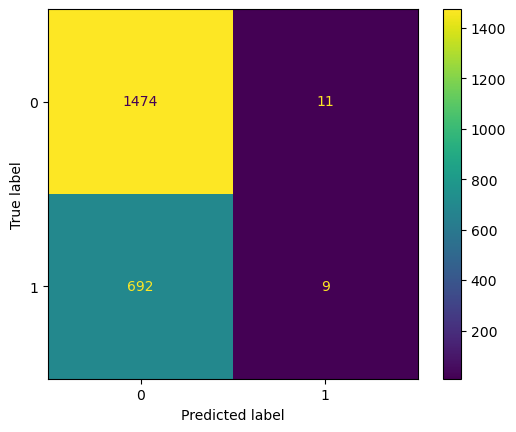

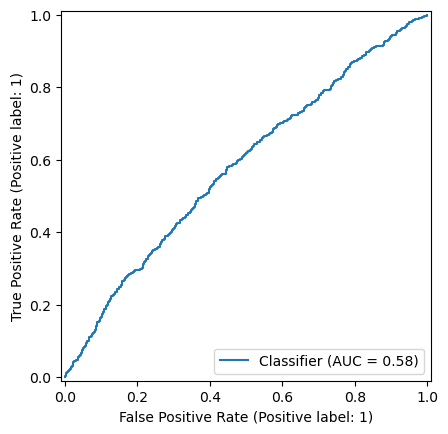

{0: 53, 1: 47} 49
Accuracy = 0.6802378774016469
ROC AUC = 0.5806635061984563
Classification Report:
              precision    recall  f1-score   support

           0       0.68      1.00      0.81      1485
           1       0.56      0.01      0.03       701

    accuracy                           0.68      2186
   macro avg       0.62      0.50      0.42      2186
weighted avg       0.64      0.68      0.56      2186

Confusion Matrix:


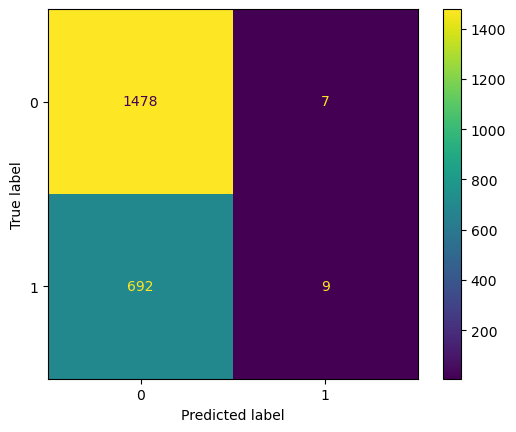

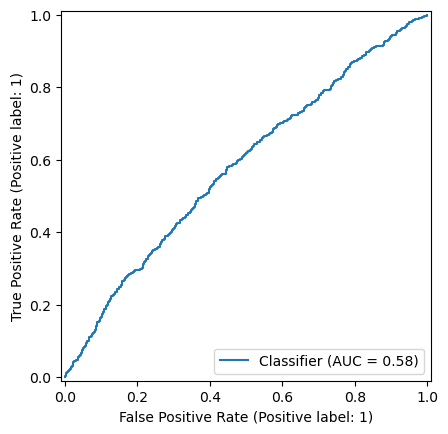

{0: 54, 1: 46} 30
Accuracy = 0.6061299176578225
ROC AUC = 0.5807221045452144
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.69      0.71      1485
           1       0.39      0.42      0.41       701

    accuracy                           0.61      2186
   macro avg       0.56      0.56      0.56      2186
weighted avg       0.61      0.61      0.61      2186

Confusion Matrix:


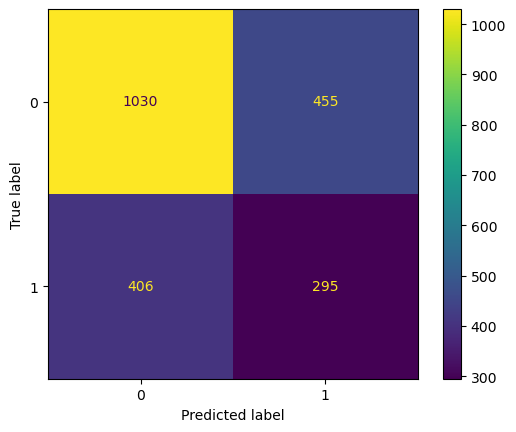

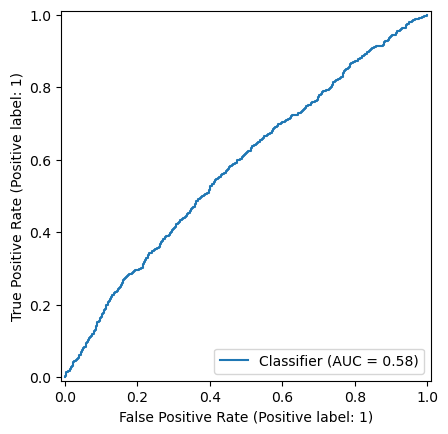

{0: 54, 1: 46} 31
Accuracy = 0.6171088746569076
ROC AUC = 0.5807221045452144
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.73      0.72      1485
           1       0.40      0.38      0.39       701

    accuracy                           0.62      2186
   macro avg       0.55      0.55      0.55      2186
weighted avg       0.61      0.62      0.61      2186

Confusion Matrix:


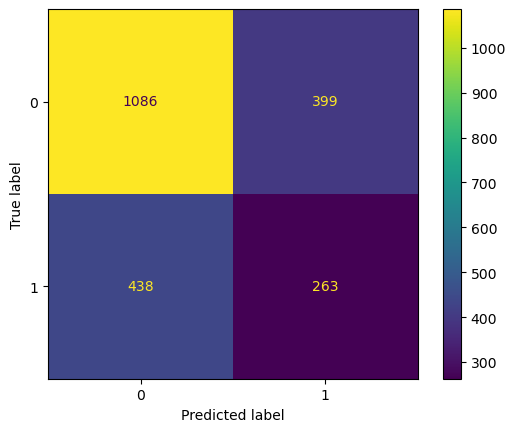

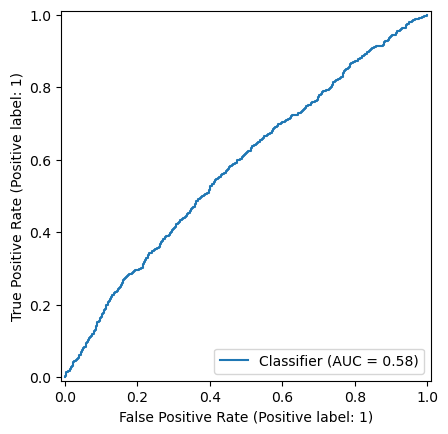

{0: 54, 1: 46} 32
Accuracy = 0.6312900274473925
ROC AUC = 0.5807221045452144
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.77      0.74      1485
           1       0.41      0.33      0.37       701

    accuracy                           0.63      2186
   macro avg       0.56      0.55      0.55      2186
weighted avg       0.61      0.63      0.62      2186

Confusion Matrix:


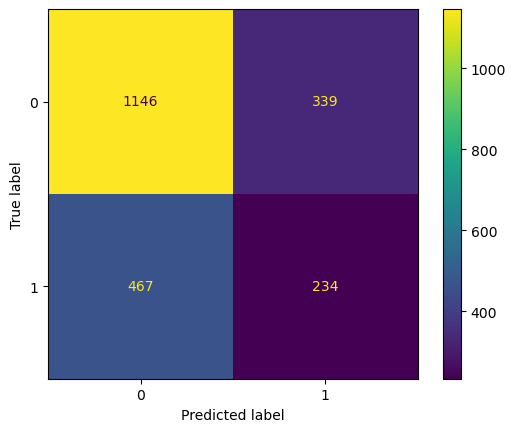

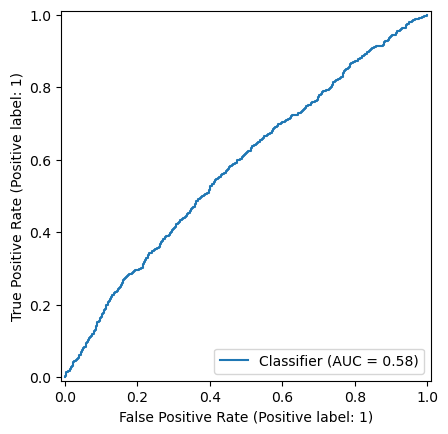

{0: 54, 1: 46} 33
Accuracy = 0.6386093321134492
ROC AUC = 0.5807221045452144
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.80      0.75      1485
           1       0.41      0.30      0.34       701

    accuracy                           0.64      2186
   macro avg       0.56      0.55      0.55      2186
weighted avg       0.61      0.64      0.62      2186

Confusion Matrix:


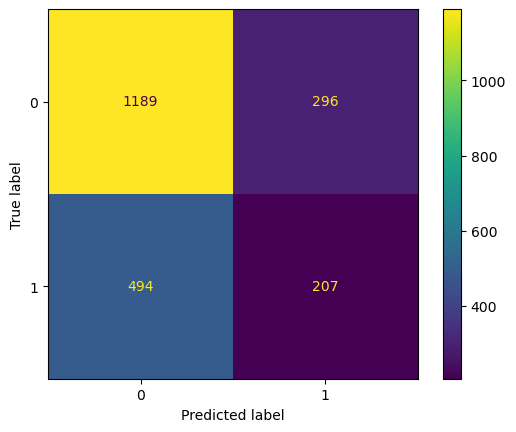

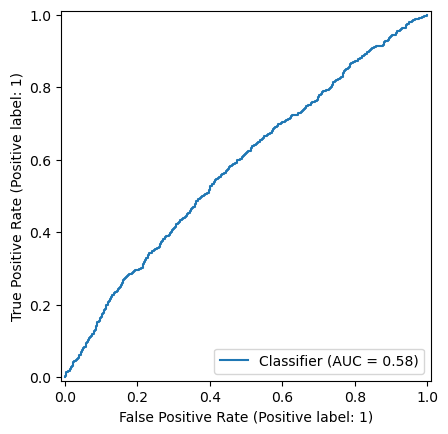

{0: 54, 1: 46} 34
Accuracy = 0.6546203110704483
ROC AUC = 0.5807221045452144
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.84      0.77      1485
           1       0.44      0.27      0.33       701

    accuracy                           0.65      2186
   macro avg       0.57      0.55      0.55      2186
weighted avg       0.62      0.65      0.63      2186

Confusion Matrix:


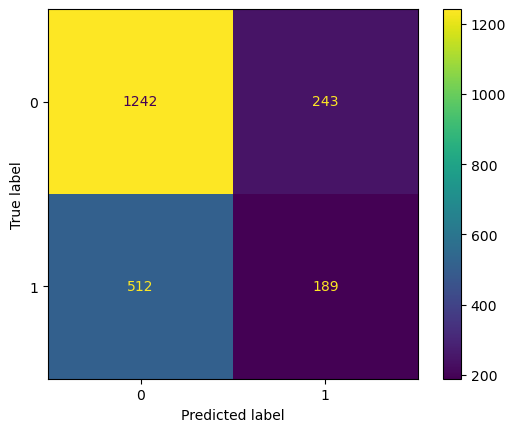

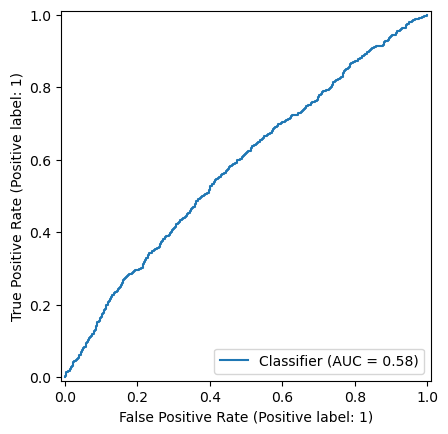

{0: 54, 1: 46} 35
Accuracy = 0.6596523330283623
ROC AUC = 0.5807221045452144
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.86      0.77      1485
           1       0.44      0.23      0.31       701

    accuracy                           0.66      2186
   macro avg       0.57      0.55      0.54      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


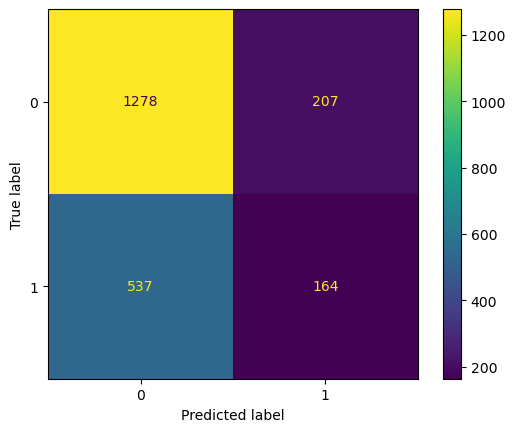

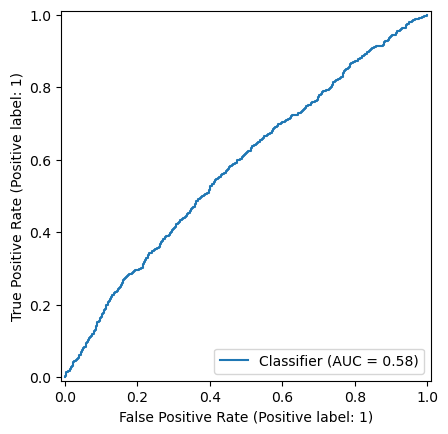

{0: 54, 1: 46} 36
Accuracy = 0.6651418115279049
ROC AUC = 0.5807221045452144
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.88      0.78      1485
           1       0.45      0.20      0.28       701

    accuracy                           0.67      2186
   macro avg       0.58      0.54      0.53      2186
weighted avg       0.62      0.67      0.62      2186

Confusion Matrix:


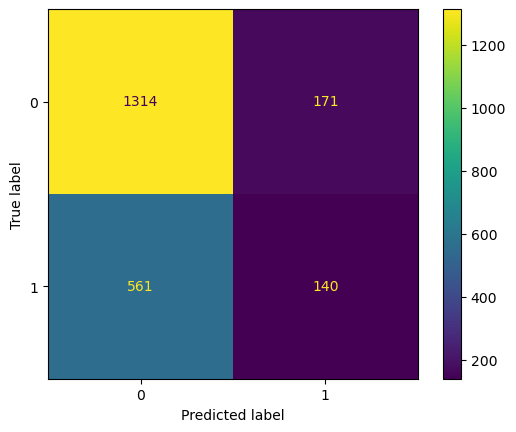

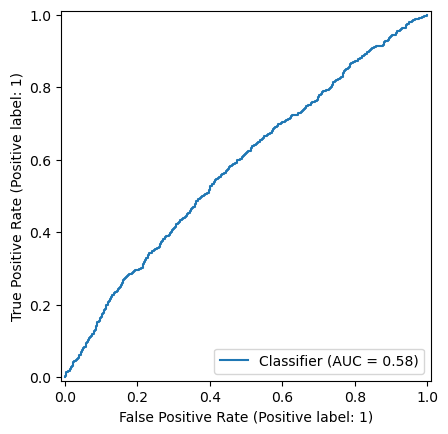

{0: 54, 1: 46} 37
Accuracy = 0.6646843549862763
ROC AUC = 0.5807221045452144
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.90      0.78      1485
           1       0.44      0.17      0.24       701

    accuracy                           0.66      2186
   macro avg       0.57      0.53      0.51      2186
weighted avg       0.61      0.66      0.61      2186

Confusion Matrix:


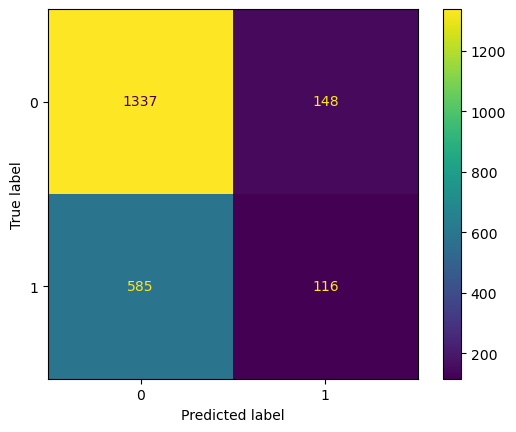

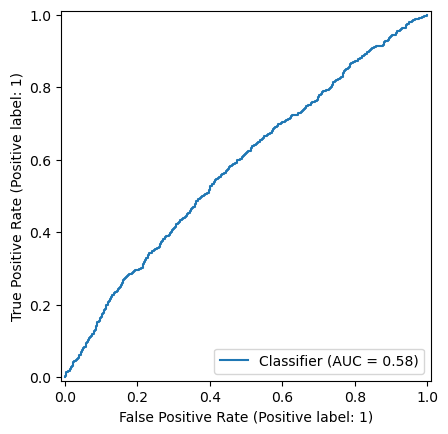

{0: 54, 1: 46} 38
Accuracy = 0.6655992680695334
ROC AUC = 0.5807221045452144
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.91      0.79      1485
           1       0.43      0.14      0.21       701

    accuracy                           0.67      2186
   macro avg       0.56      0.53      0.50      2186
weighted avg       0.61      0.67      0.60      2186

Confusion Matrix:


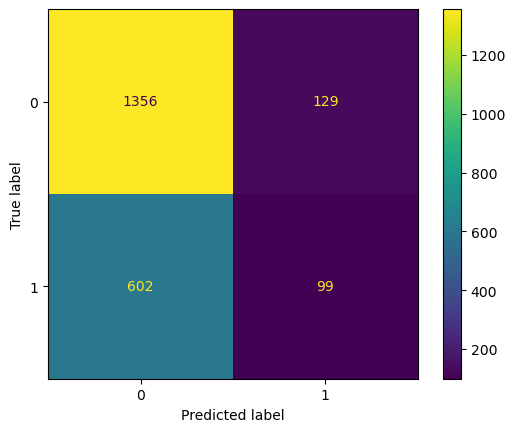

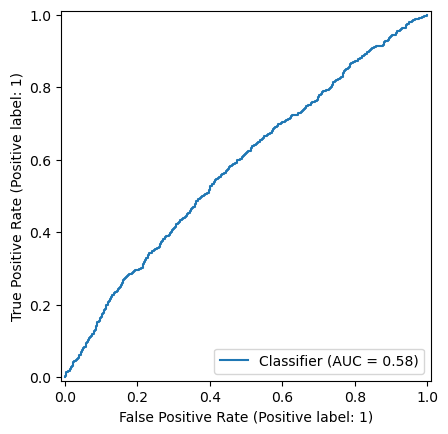

{0: 54, 1: 46} 39
Accuracy = 0.6660567246111619
ROC AUC = 0.5807221045452144
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.93      0.79      1485
           1       0.42      0.11      0.17       701

    accuracy                           0.67      2186
   macro avg       0.55      0.52      0.48      2186
weighted avg       0.60      0.67      0.59      2186

Confusion Matrix:


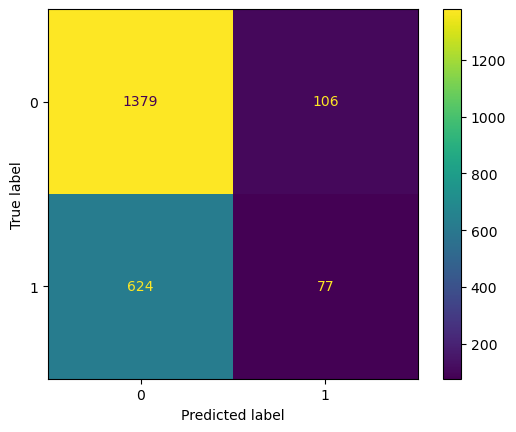

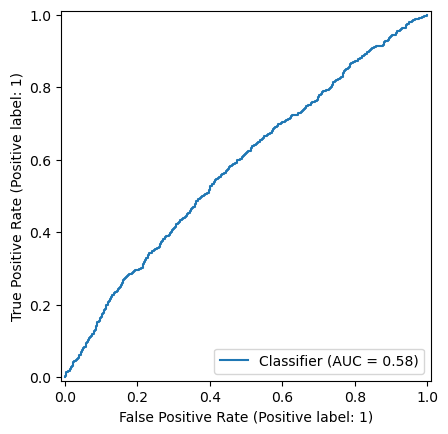

{0: 54, 1: 46} 40
Accuracy = 0.6683440073193047
ROC AUC = 0.5807221045452144
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.94      0.79      1485
           1       0.42      0.09      0.15       701

    accuracy                           0.67      2186
   macro avg       0.55      0.52      0.47      2186
weighted avg       0.60      0.67      0.59      2186

Confusion Matrix:


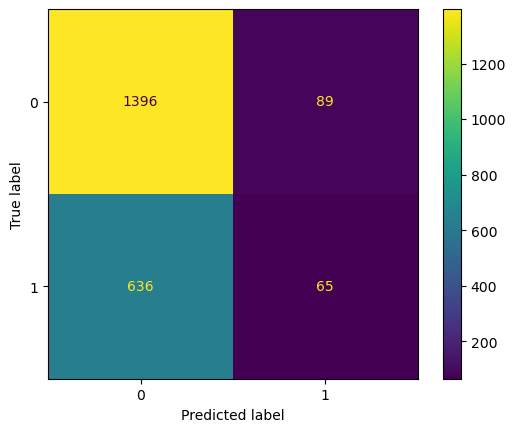

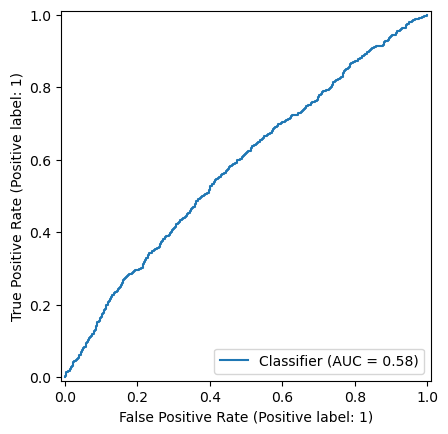

{0: 54, 1: 46} 41
Accuracy = 0.6706312900274474
ROC AUC = 0.5807221045452144
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.95      0.80      1485
           1       0.43      0.08      0.13       701

    accuracy                           0.67      2186
   macro avg       0.56      0.51      0.46      2186
weighted avg       0.60      0.67      0.58      2186

Confusion Matrix:


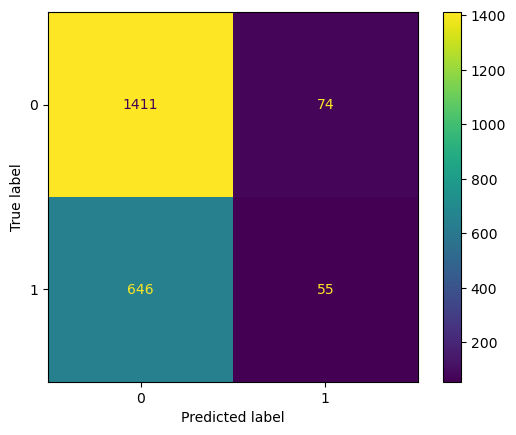

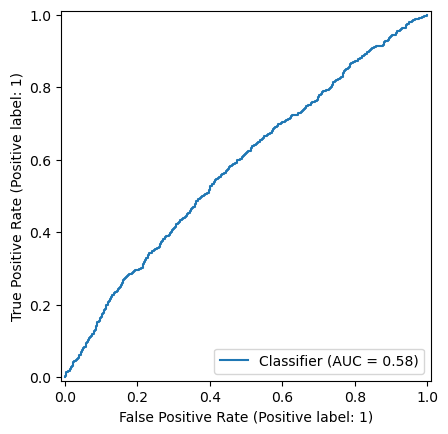

{0: 54, 1: 46} 42
Accuracy = 0.6710887465690759
ROC AUC = 0.5807221045452144
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.96      0.80      1485
           1       0.41      0.06      0.11       701

    accuracy                           0.67      2186
   macro avg       0.55      0.51      0.45      2186
weighted avg       0.60      0.67      0.58      2186

Confusion Matrix:


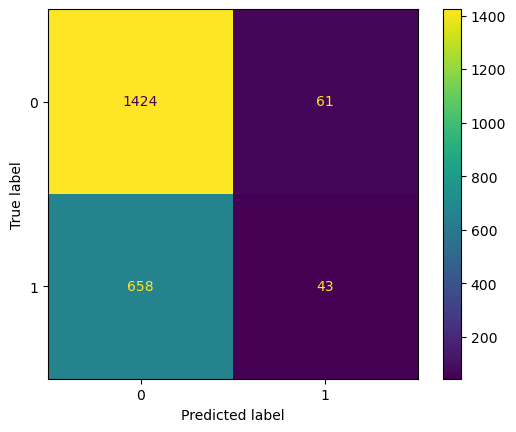

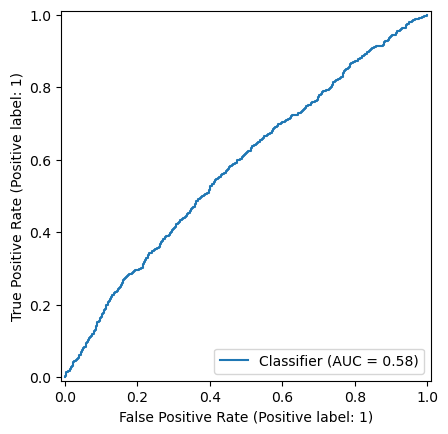

{0: 54, 1: 46} 43
Accuracy = 0.6756633119853613
ROC AUC = 0.5807221045452144
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.97      0.80      1485
           1       0.44      0.04      0.08       701

    accuracy                           0.68      2186
   macro avg       0.56      0.51      0.44      2186
weighted avg       0.61      0.68      0.57      2186

Confusion Matrix:


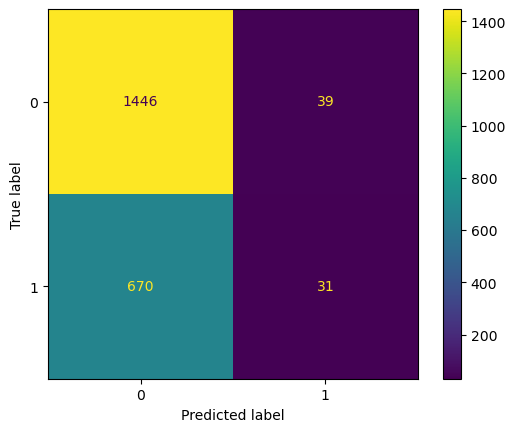

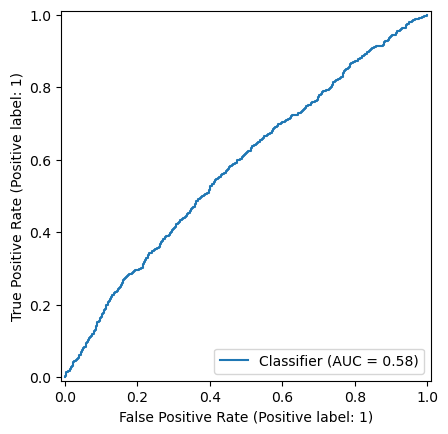

{0: 54, 1: 46} 44
Accuracy = 0.6747483989021043
ROC AUC = 0.5807221045452144
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.98      0.80      1485
           1       0.41      0.03      0.06       701

    accuracy                           0.67      2186
   macro avg       0.55      0.51      0.43      2186
weighted avg       0.60      0.67      0.57      2186

Confusion Matrix:


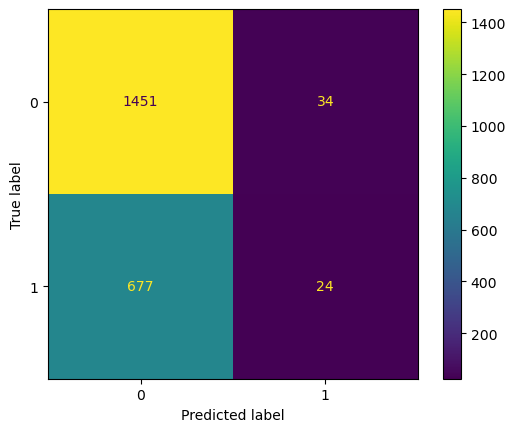

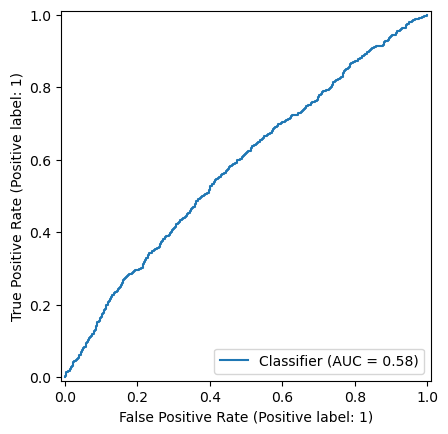

{0: 54, 1: 46} 45
Accuracy = 0.6756633119853613
ROC AUC = 0.5807221045452144
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.98      0.80      1485
           1       0.41      0.03      0.05       701

    accuracy                           0.68      2186
   macro avg       0.55      0.50      0.43      2186
weighted avg       0.60      0.68      0.56      2186

Confusion Matrix:


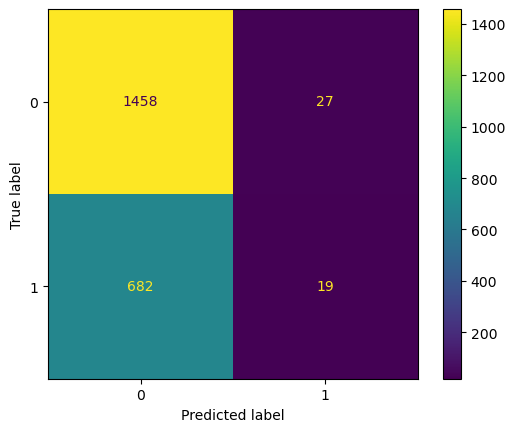

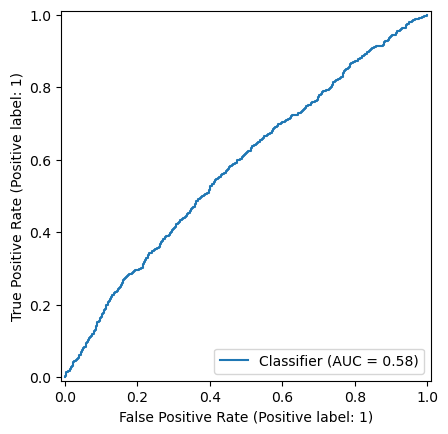

{0: 54, 1: 46} 46
Accuracy = 0.6765782250686185
ROC AUC = 0.5807221045452144
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.99      0.81      1485
           1       0.41      0.02      0.04       701

    accuracy                           0.68      2186
   macro avg       0.54      0.50      0.42      2186
weighted avg       0.59      0.68      0.56      2186

Confusion Matrix:


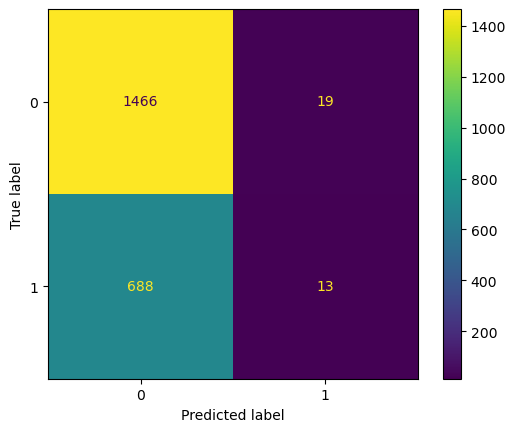

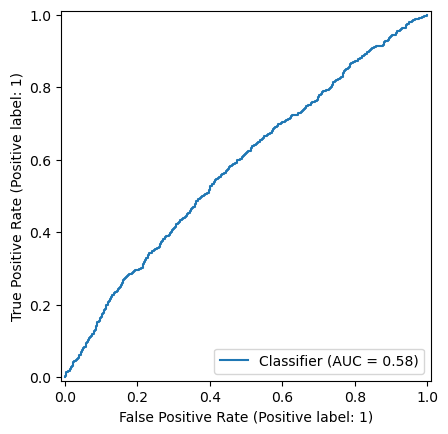

{0: 54, 1: 46} 47
Accuracy = 0.6784080512351327
ROC AUC = 0.5807221045452144
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.99      0.81      1485
           1       0.45      0.01      0.02       701

    accuracy                           0.68      2186
   macro avg       0.57      0.50      0.42      2186
weighted avg       0.61      0.68      0.56      2186

Confusion Matrix:


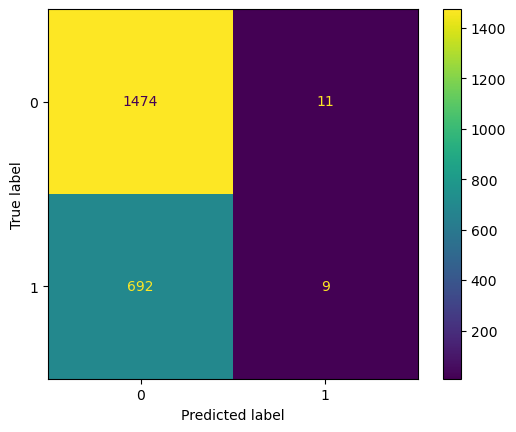

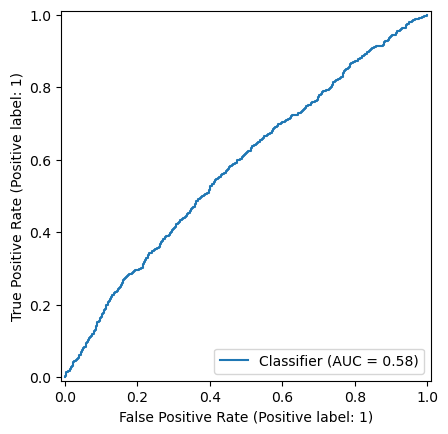

{0: 54, 1: 46} 48
Accuracy = 0.6802378774016469
ROC AUC = 0.5807221045452144
Classification Report:
              precision    recall  f1-score   support

           0       0.68      1.00      0.81      1485
           1       0.56      0.01      0.03       701

    accuracy                           0.68      2186
   macro avg       0.62      0.50      0.42      2186
weighted avg       0.64      0.68      0.56      2186

Confusion Matrix:


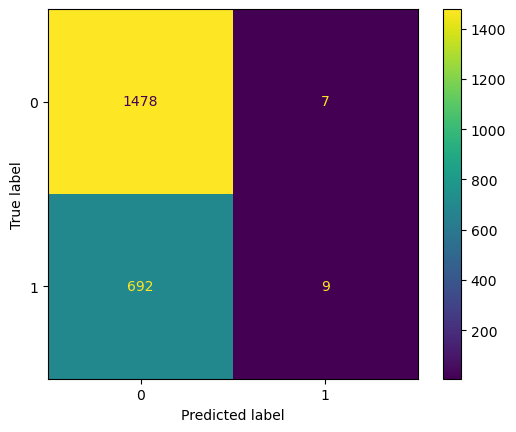

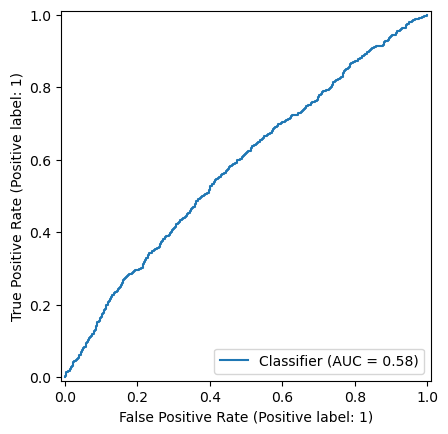

{0: 54, 1: 46} 49
Accuracy = 0.6806953339432754
ROC AUC = 0.5807221045452144
Classification Report:
              precision    recall  f1-score   support

           0       0.68      1.00      0.81      1485
           1       0.67      0.01      0.02       701

    accuracy                           0.68      2186
   macro avg       0.67      0.50      0.41      2186
weighted avg       0.68      0.68      0.56      2186

Confusion Matrix:


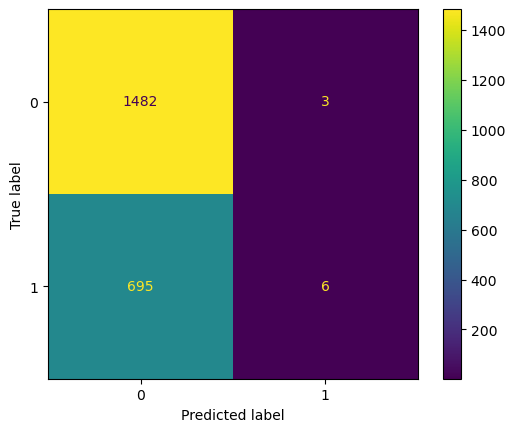

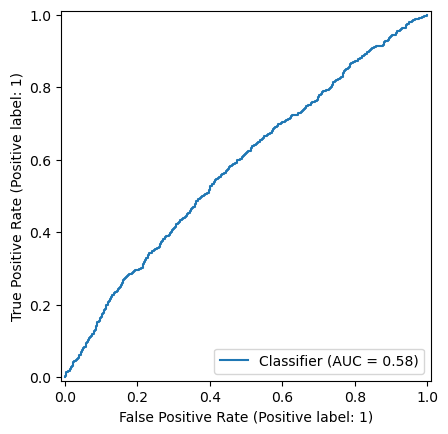

{0: 55, 1: 45} 30
Accuracy = 0.6161939615736505
ROC AUC = 0.5806759943707162
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.73      0.72      1485
           1       0.40      0.38      0.39       701

    accuracy                           0.62      2186
   macro avg       0.56      0.55      0.56      2186
weighted avg       0.61      0.62      0.61      2186

Confusion Matrix:


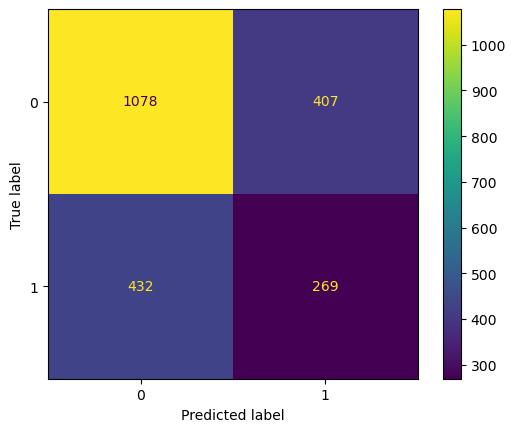

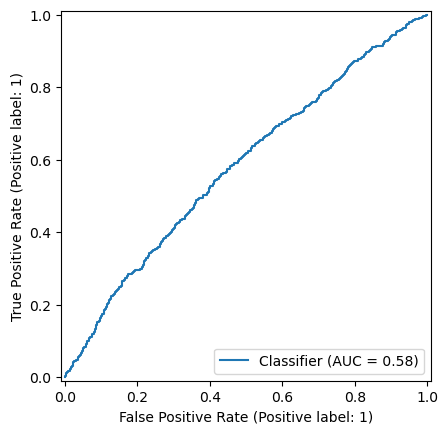

{0: 55, 1: 45} 31
Accuracy = 0.6303751143641354
ROC AUC = 0.5806759943707162
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.77      0.74      1485
           1       0.41      0.34      0.37       701

    accuracy                           0.63      2186
   macro avg       0.56      0.55      0.56      2186
weighted avg       0.61      0.63      0.62      2186

Confusion Matrix:


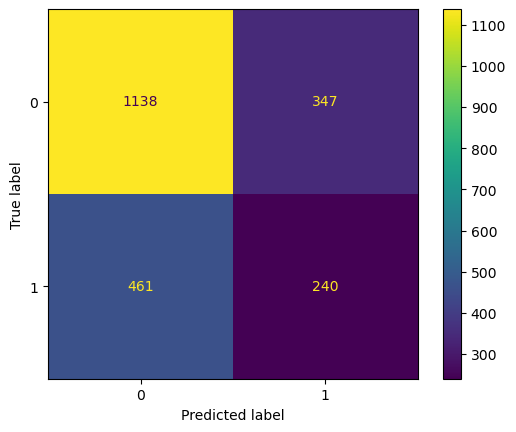

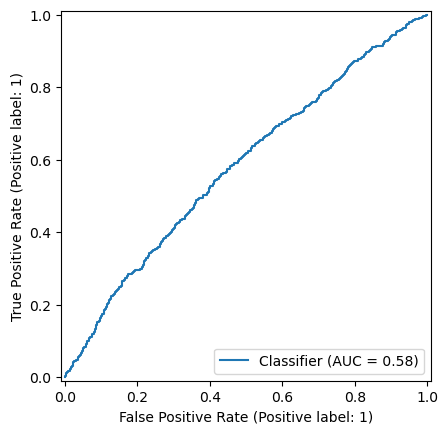

{0: 55, 1: 45} 32
Accuracy = 0.6354071363220494
ROC AUC = 0.5806759943707162
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.80      0.75      1485
           1       0.41      0.30      0.34       701

    accuracy                           0.64      2186
   macro avg       0.56      0.55      0.54      2186
weighted avg       0.61      0.64      0.62      2186

Confusion Matrix:


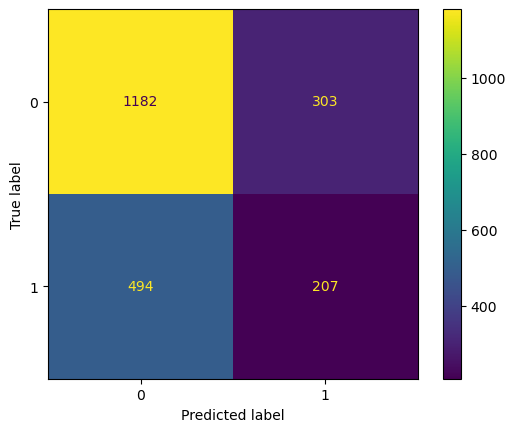

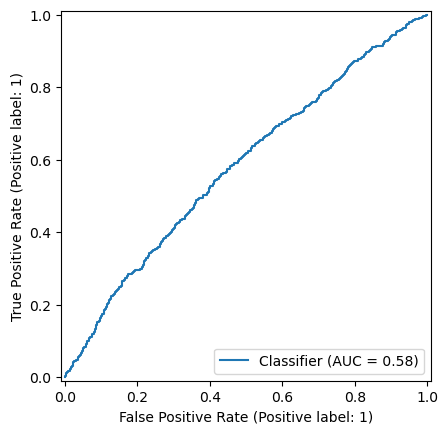

{0: 55, 1: 45} 33
Accuracy = 0.6537053979871912
ROC AUC = 0.5806759943707162
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.83      0.77      1485
           1       0.44      0.27      0.34       701

    accuracy                           0.65      2186
   macro avg       0.57      0.55      0.55      2186
weighted avg       0.62      0.65      0.63      2186

Confusion Matrix:


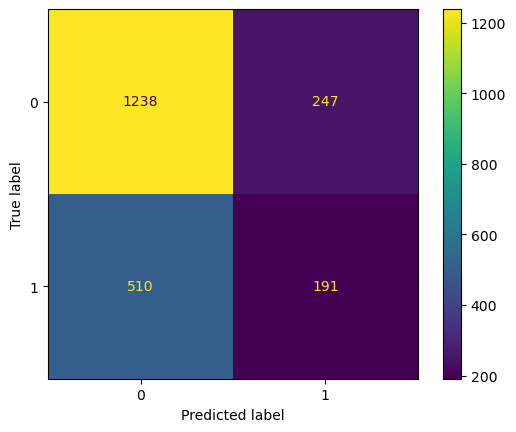

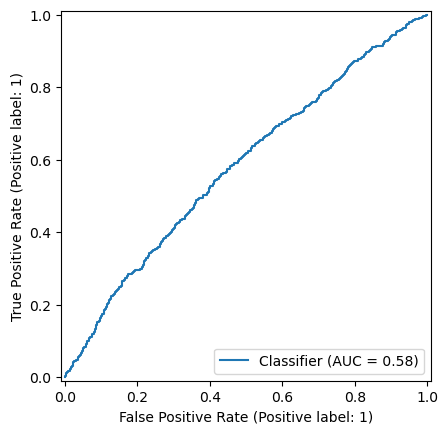

{0: 55, 1: 45} 34
Accuracy = 0.6591948764867338
ROC AUC = 0.5806759943707162
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.86      0.77      1485
           1       0.44      0.24      0.31       701

    accuracy                           0.66      2186
   macro avg       0.57      0.55      0.54      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


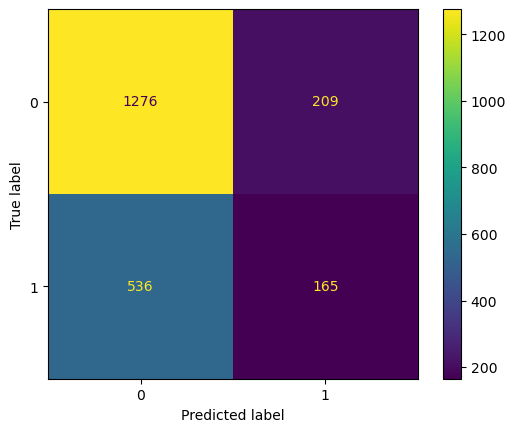

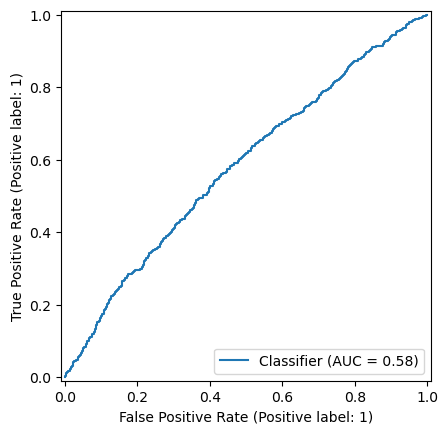

{0: 55, 1: 45} 35
Accuracy = 0.6637694419030192
ROC AUC = 0.5806759943707162
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.88      0.78      1485
           1       0.45      0.20      0.28       701

    accuracy                           0.66      2186
   macro avg       0.57      0.54      0.53      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


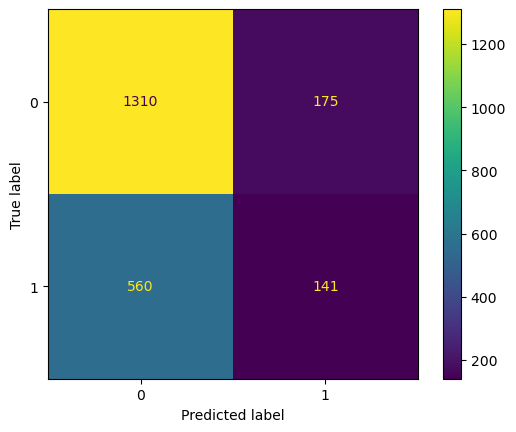

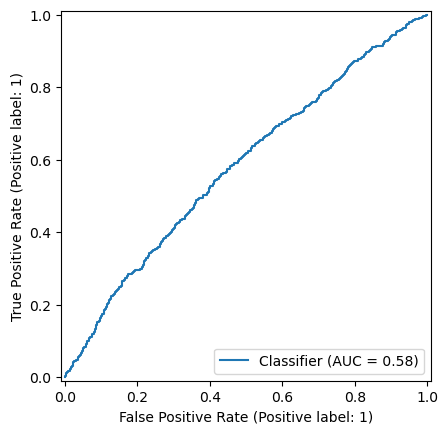

{0: 55, 1: 45} 36
Accuracy = 0.6642268984446478
ROC AUC = 0.5806759943707162
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.90      0.78      1485
           1       0.44      0.17      0.24       701

    accuracy                           0.66      2186
   macro avg       0.57      0.53      0.51      2186
weighted avg       0.61      0.66      0.61      2186

Confusion Matrix:


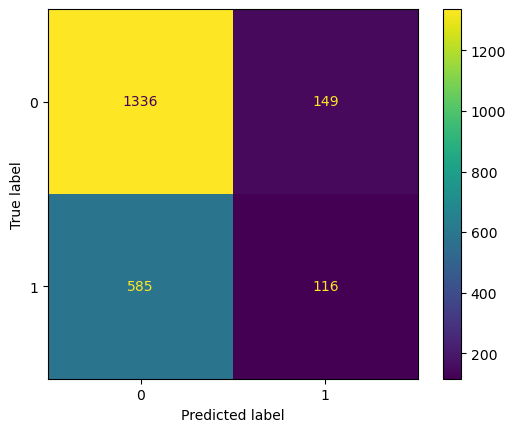

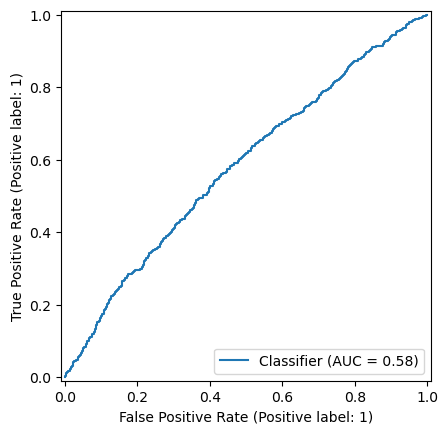

{0: 55, 1: 45} 37
Accuracy = 0.6660567246111619
ROC AUC = 0.5806759943707162
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.91      0.79      1485
           1       0.44      0.14      0.22       701

    accuracy                           0.67      2186
   macro avg       0.56      0.53      0.50      2186
weighted avg       0.61      0.67      0.60      2186

Confusion Matrix:


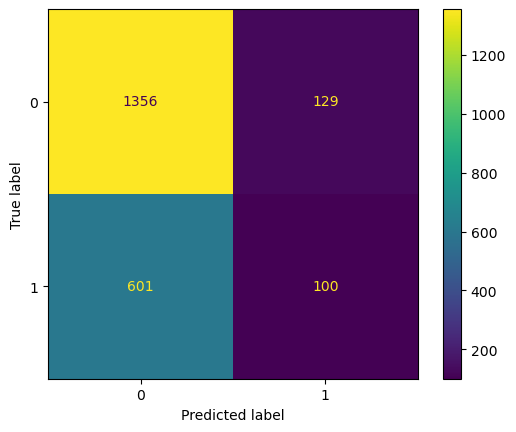

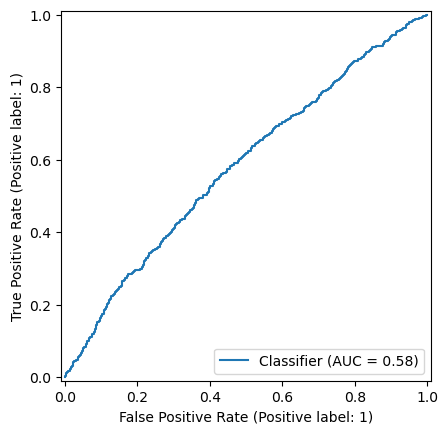

{0: 55, 1: 45} 38
Accuracy = 0.6665141811527905
ROC AUC = 0.5806759943707162
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.93      0.79      1485
           1       0.42      0.11      0.17       701

    accuracy                           0.67      2186
   macro avg       0.56      0.52      0.48      2186
weighted avg       0.60      0.67      0.59      2186

Confusion Matrix:


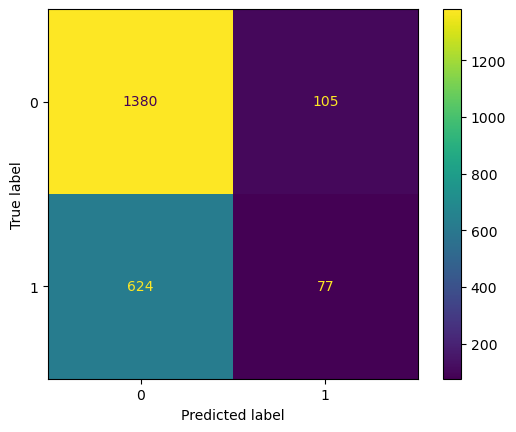

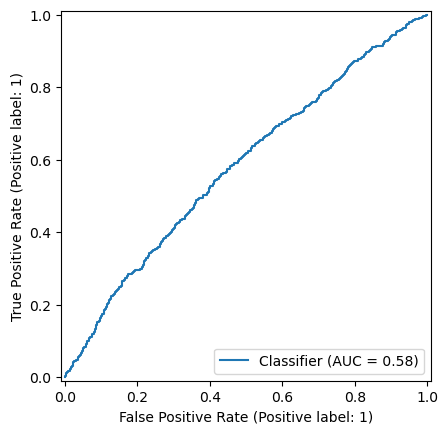

{0: 55, 1: 45} 39
Accuracy = 0.6683440073193047
ROC AUC = 0.5806759943707162
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.94      0.79      1485
           1       0.42      0.09      0.15       701

    accuracy                           0.67      2186
   macro avg       0.55      0.52      0.47      2186
weighted avg       0.60      0.67      0.59      2186

Confusion Matrix:


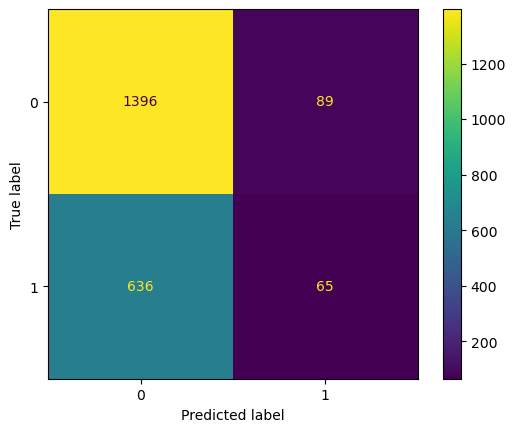

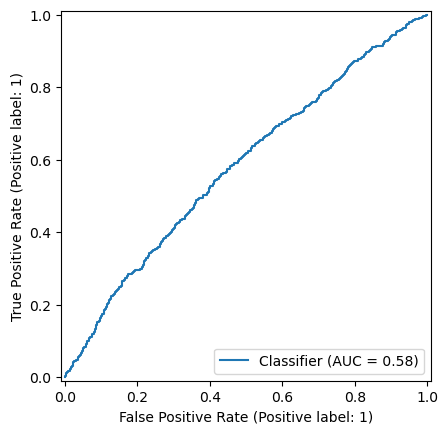

{0: 55, 1: 45} 40
Accuracy = 0.6706312900274474
ROC AUC = 0.5806759943707162
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.95      0.80      1485
           1       0.43      0.08      0.13       701

    accuracy                           0.67      2186
   macro avg       0.56      0.51      0.46      2186
weighted avg       0.60      0.67      0.58      2186

Confusion Matrix:


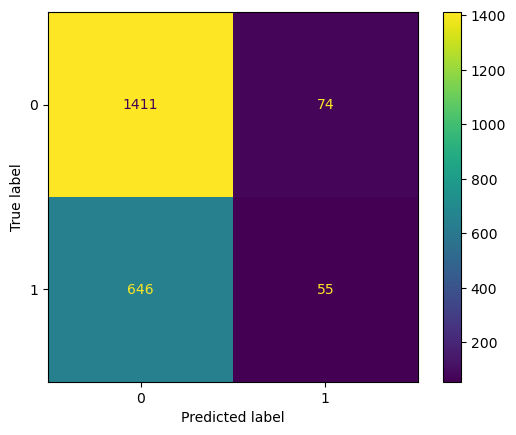

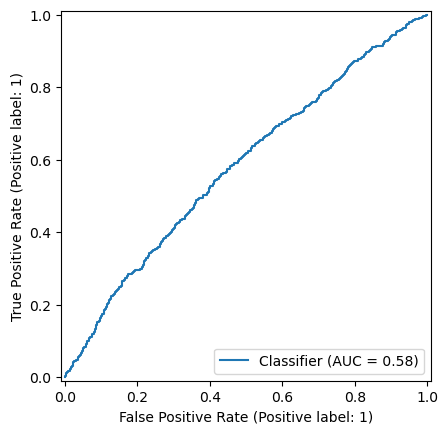

{0: 55, 1: 45} 41
Accuracy = 0.6706312900274474
ROC AUC = 0.5806759943707162
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.96      0.80      1485
           1       0.41      0.06      0.11       701

    accuracy                           0.67      2186
   macro avg       0.55      0.51      0.45      2186
weighted avg       0.60      0.67      0.58      2186

Confusion Matrix:


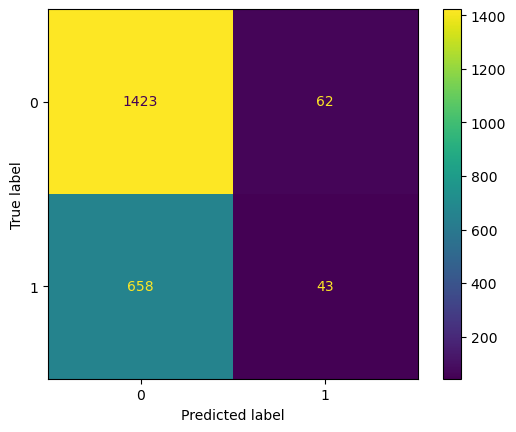

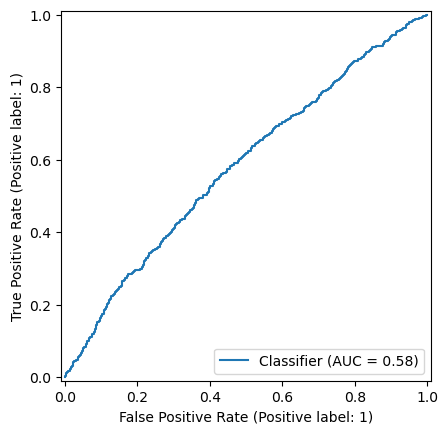

{0: 55, 1: 45} 42
Accuracy = 0.6752058554437328
ROC AUC = 0.5806759943707162
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.97      0.80      1485
           1       0.44      0.04      0.08       701

    accuracy                           0.68      2186
   macro avg       0.56      0.51      0.44      2186
weighted avg       0.60      0.68      0.57      2186

Confusion Matrix:


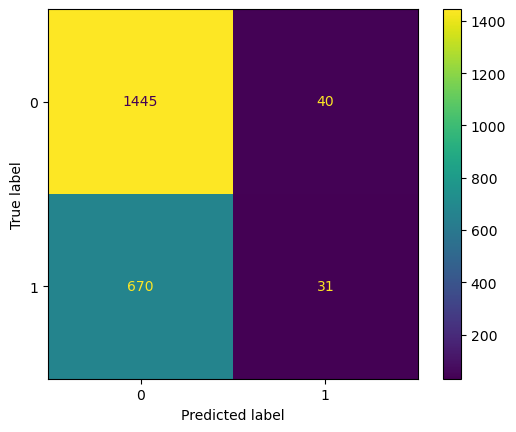

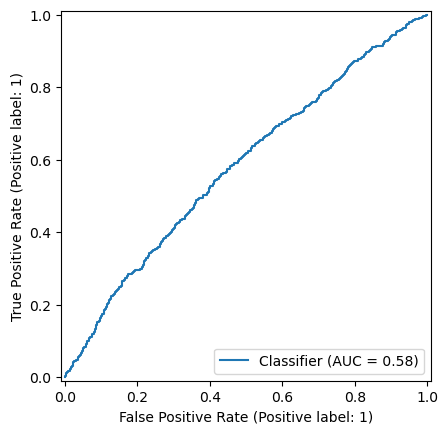

{0: 55, 1: 45} 43
Accuracy = 0.6752058554437328
ROC AUC = 0.5806759943707162
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.98      0.80      1485
           1       0.42      0.04      0.07       701

    accuracy                           0.68      2186
   macro avg       0.55      0.51      0.43      2186
weighted avg       0.60      0.68      0.57      2186

Confusion Matrix:


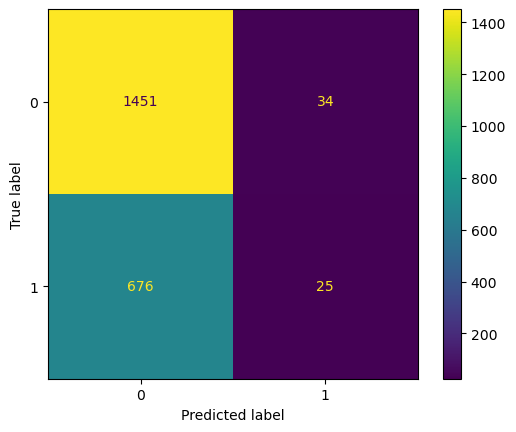

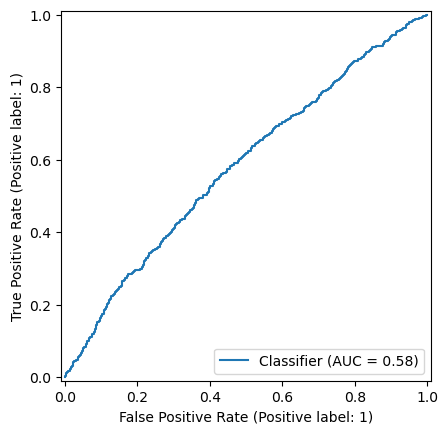

{0: 55, 1: 45} 44
Accuracy = 0.6756633119853613
ROC AUC = 0.5806759943707162
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.98      0.80      1485
           1       0.41      0.03      0.05       701

    accuracy                           0.68      2186
   macro avg       0.55      0.50      0.43      2186
weighted avg       0.60      0.68      0.56      2186

Confusion Matrix:


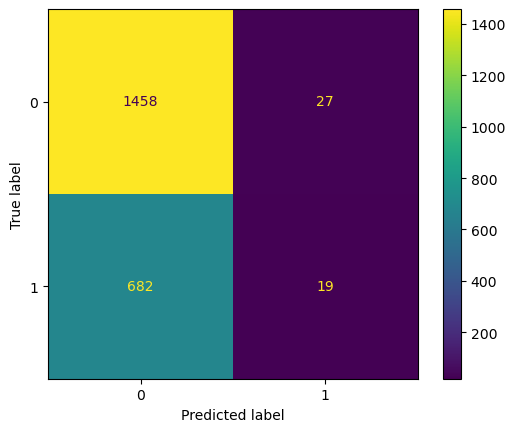

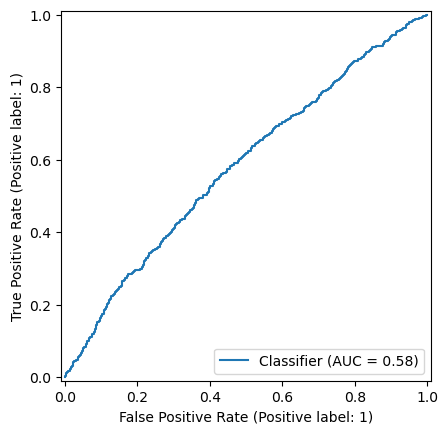

{0: 55, 1: 45} 45
Accuracy = 0.67612076852699
ROC AUC = 0.5806759943707162
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.99      0.81      1485
           1       0.39      0.02      0.03       701

    accuracy                           0.68      2186
   macro avg       0.53      0.50      0.42      2186
weighted avg       0.59      0.68      0.56      2186

Confusion Matrix:


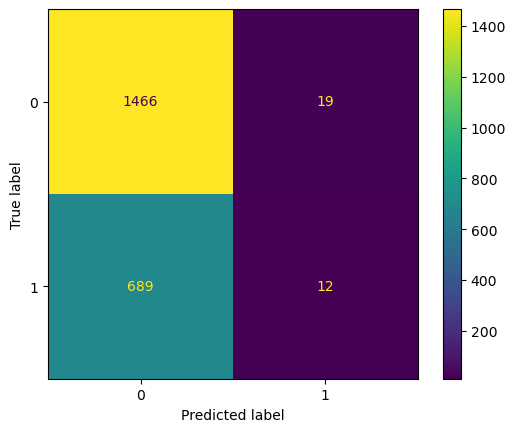

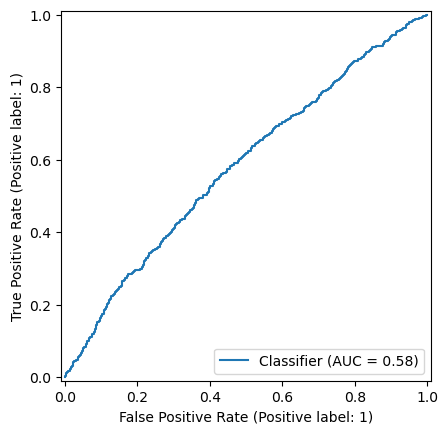

{0: 55, 1: 45} 46
Accuracy = 0.6784080512351327
ROC AUC = 0.5806759943707162
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.99      0.81      1485
           1       0.45      0.01      0.02       701

    accuracy                           0.68      2186
   macro avg       0.57      0.50      0.42      2186
weighted avg       0.61      0.68      0.56      2186

Confusion Matrix:


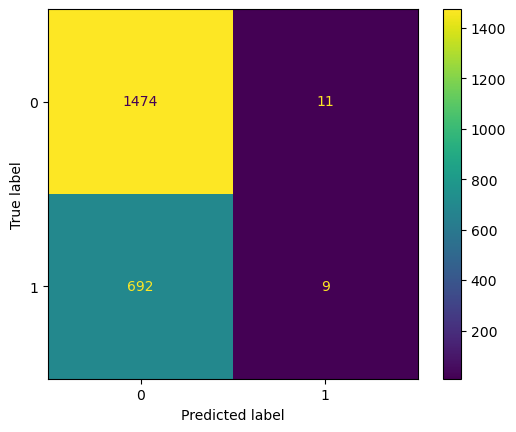

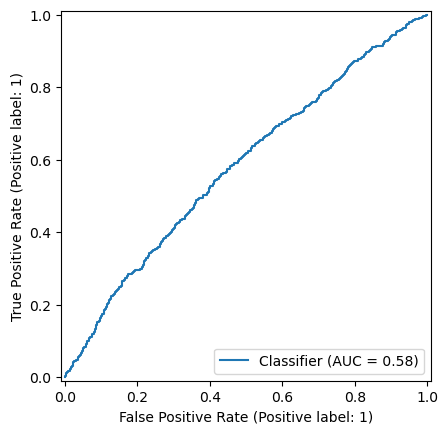

{0: 55, 1: 45} 47
Accuracy = 0.6802378774016469
ROC AUC = 0.5806759943707162
Classification Report:
              precision    recall  f1-score   support

           0       0.68      1.00      0.81      1485
           1       0.56      0.01      0.03       701

    accuracy                           0.68      2186
   macro avg       0.62      0.50      0.42      2186
weighted avg       0.64      0.68      0.56      2186

Confusion Matrix:


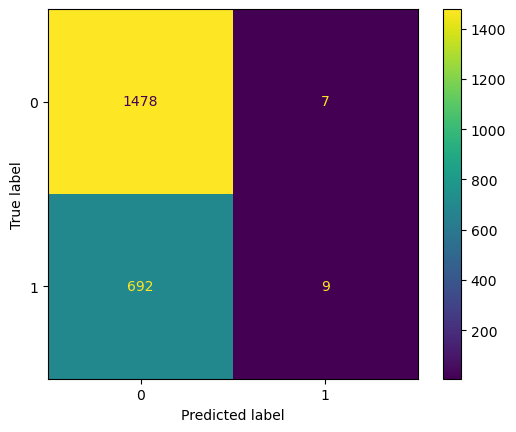

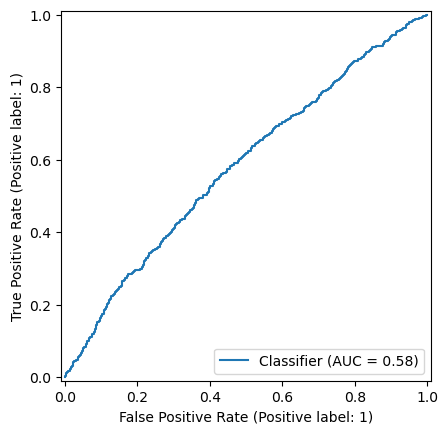

{0: 55, 1: 45} 48
Accuracy = 0.6806953339432754
ROC AUC = 0.5806759943707162
Classification Report:
              precision    recall  f1-score   support

           0       0.68      1.00      0.81      1485
           1       0.67      0.01      0.02       701

    accuracy                           0.68      2186
   macro avg       0.67      0.50      0.41      2186
weighted avg       0.68      0.68      0.56      2186

Confusion Matrix:


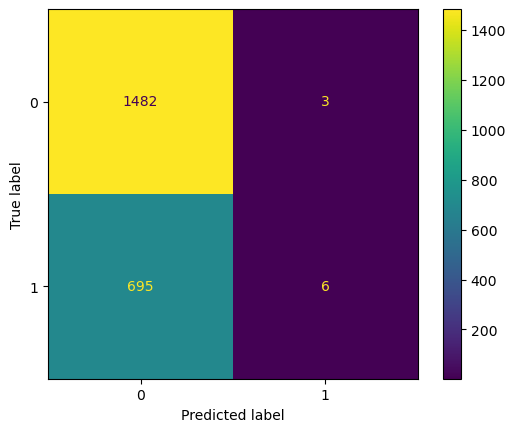

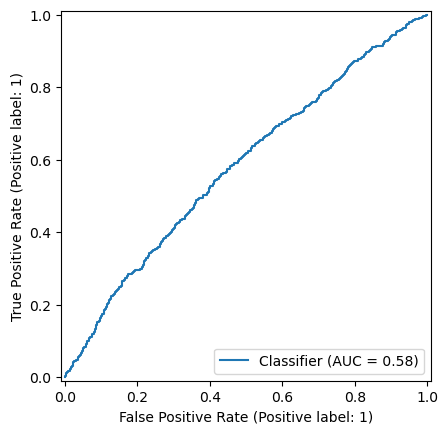

{0: 55, 1: 45} 49
Accuracy = 0.6797804208600183
ROC AUC = 0.5806759943707162
Classification Report:
              precision    recall  f1-score   support

           0       0.68      1.00      0.81      1485
           1       0.57      0.01      0.01       701

    accuracy                           0.68      2186
   macro avg       0.63      0.50      0.41      2186
weighted avg       0.65      0.68      0.55      2186

Confusion Matrix:


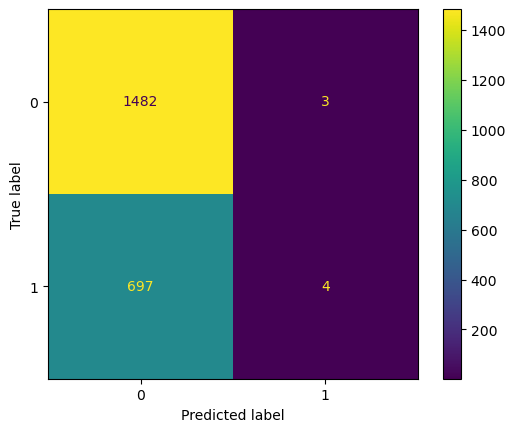

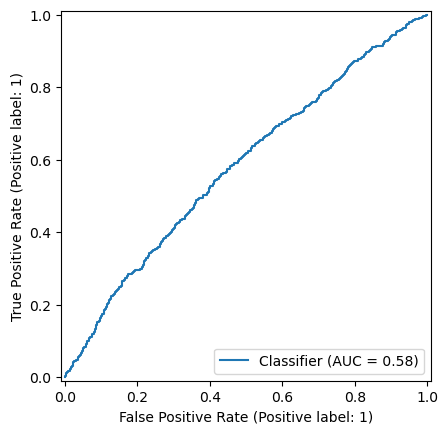

{0: 56, 1: 44} 30
Accuracy = 0.6276303751143641
ROC AUC = 0.5806442936257488
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.76      0.74      1485
           1       0.41      0.35      0.37       701

    accuracy                           0.63      2186
   macro avg       0.56      0.55      0.55      2186
weighted avg       0.61      0.63      0.62      2186

Confusion Matrix:


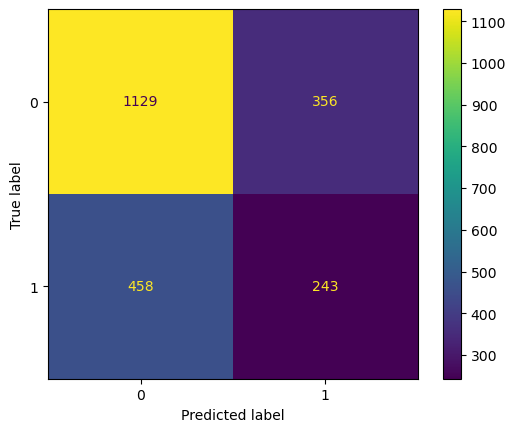

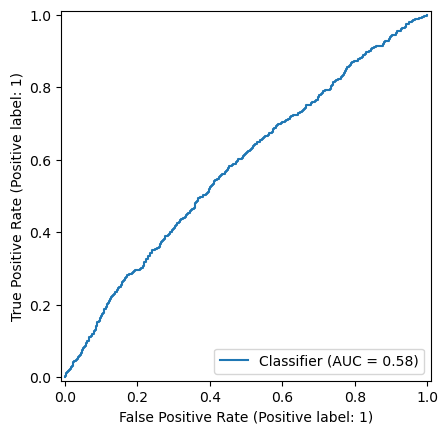

{0: 56, 1: 44} 31
Accuracy = 0.6326623970722781
ROC AUC = 0.5806442936257488
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.79      0.74      1485
           1       0.40      0.30      0.34       701

    accuracy                           0.63      2186
   macro avg       0.55      0.55      0.54      2186
weighted avg       0.61      0.63      0.62      2186

Confusion Matrix:


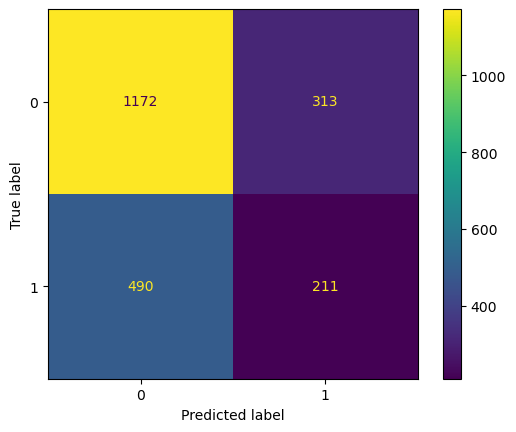

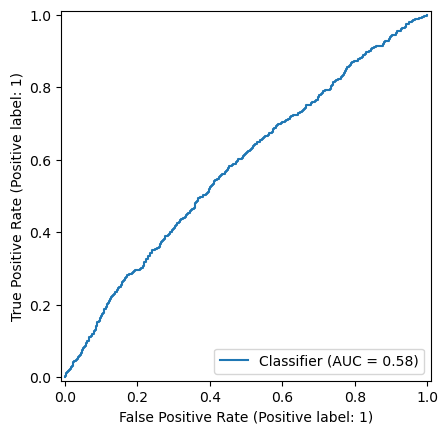

{0: 56, 1: 44} 32
Accuracy = 0.6532479414455626
ROC AUC = 0.5806442936257488
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.83      0.77      1485
           1       0.44      0.28      0.34       701

    accuracy                           0.65      2186
   macro avg       0.57      0.55      0.55      2186
weighted avg       0.62      0.65      0.63      2186

Confusion Matrix:


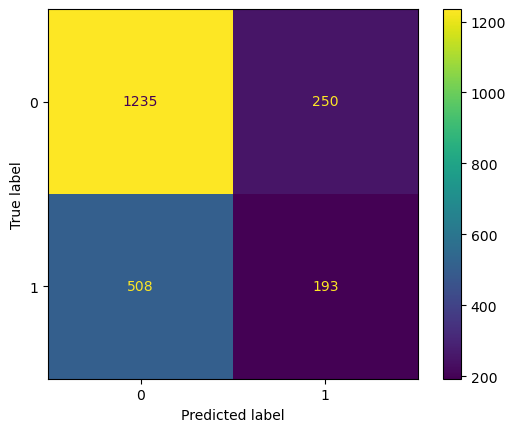

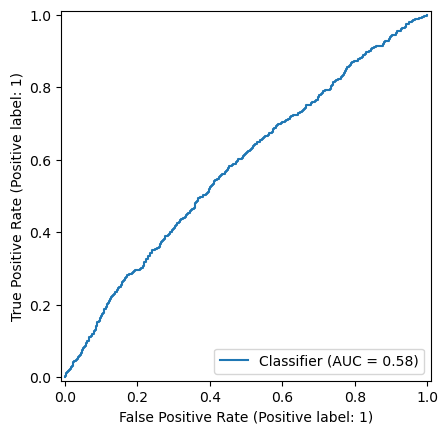

{0: 56, 1: 44} 33
Accuracy = 0.6582799634034767
ROC AUC = 0.5806442936257488
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.86      0.77      1485
           1       0.44      0.24      0.31       701

    accuracy                           0.66      2186
   macro avg       0.57      0.55      0.54      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


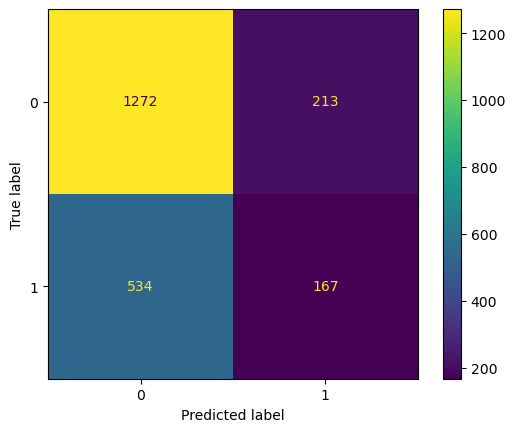

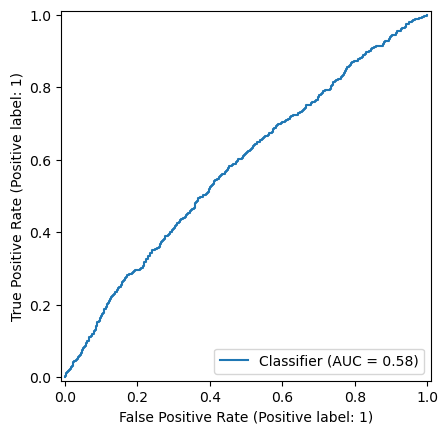

{0: 56, 1: 44} 34
Accuracy = 0.6637694419030192
ROC AUC = 0.5806442936257488
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.88      0.78      1485
           1       0.45      0.20      0.28       701

    accuracy                           0.66      2186
   macro avg       0.57      0.54      0.53      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


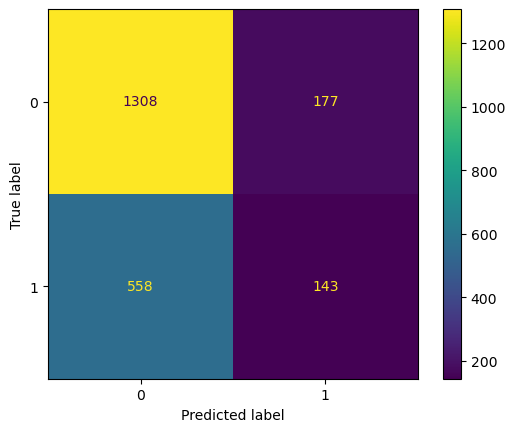

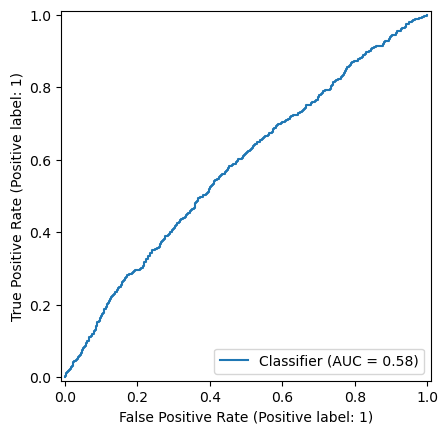

{0: 56, 1: 44} 35
Accuracy = 0.6651418115279049
ROC AUC = 0.5806442936257488
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.90      0.78      1485
           1       0.44      0.17      0.24       701

    accuracy                           0.67      2186
   macro avg       0.57      0.53      0.51      2186
weighted avg       0.61      0.67      0.61      2186

Confusion Matrix:


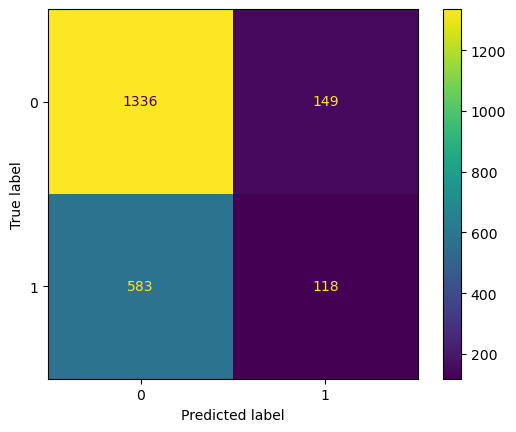

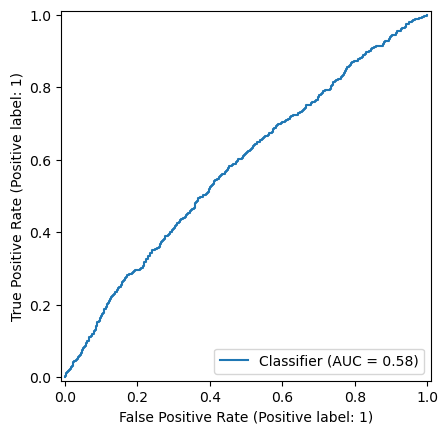

{0: 56, 1: 44} 36
Accuracy = 0.666971637694419
ROC AUC = 0.5806442936257488
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.91      0.79      1485
           1       0.44      0.15      0.22       701

    accuracy                           0.67      2186
   macro avg       0.57      0.53      0.50      2186
weighted avg       0.61      0.67      0.61      2186

Confusion Matrix:


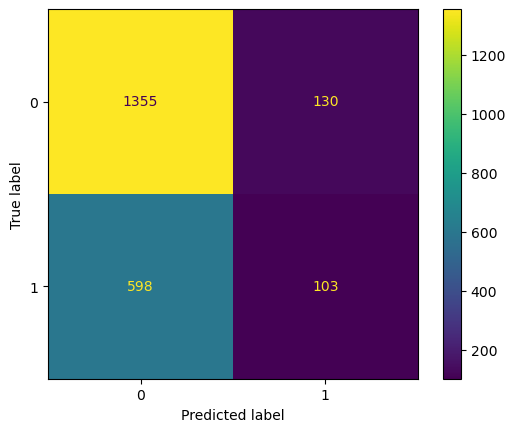

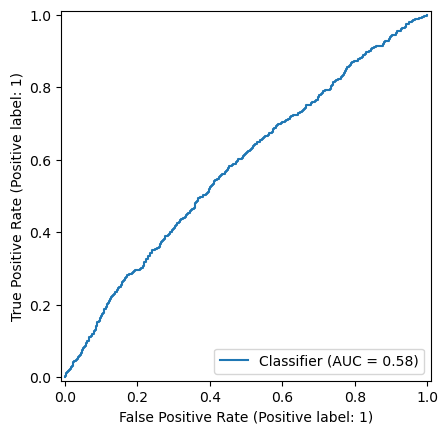

{0: 56, 1: 44} 37
Accuracy = 0.6660567246111619
ROC AUC = 0.5806442936257488
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.93      0.79      1485
           1       0.42      0.11      0.18       701

    accuracy                           0.67      2186
   macro avg       0.56      0.52      0.48      2186
weighted avg       0.60      0.67      0.59      2186

Confusion Matrix:


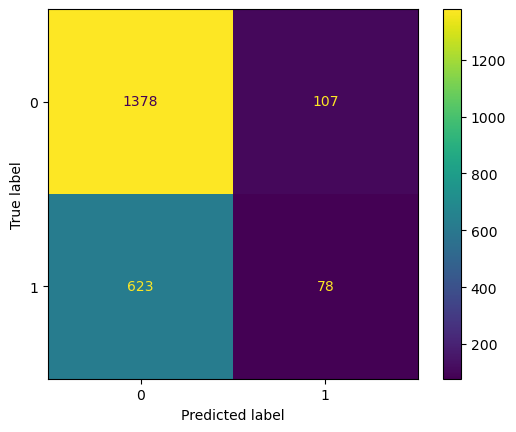

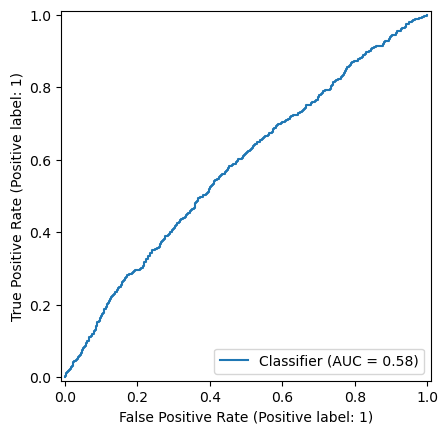

{0: 56, 1: 44} 38
Accuracy = 0.6678865507776761
ROC AUC = 0.5806442936257488
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.94      0.79      1485
           1       0.42      0.09      0.15       701

    accuracy                           0.67      2186
   macro avg       0.55      0.52      0.47      2186
weighted avg       0.60      0.67      0.59      2186

Confusion Matrix:


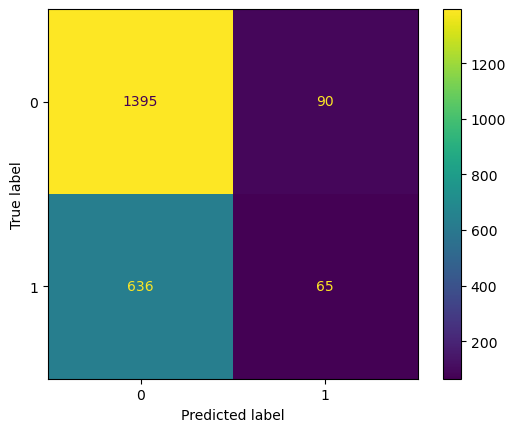

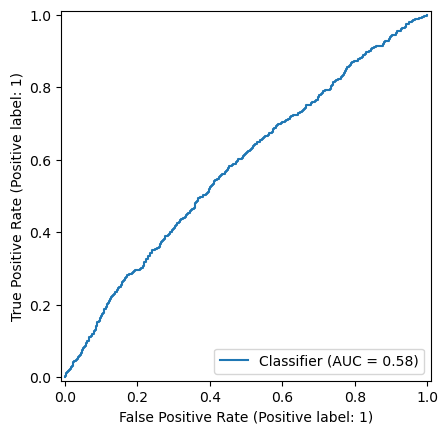

{0: 56, 1: 44} 39
Accuracy = 0.6706312900274474
ROC AUC = 0.5806442936257488
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.95      0.80      1485
           1       0.43      0.08      0.13       701

    accuracy                           0.67      2186
   macro avg       0.56      0.51      0.46      2186
weighted avg       0.60      0.67      0.58      2186

Confusion Matrix:


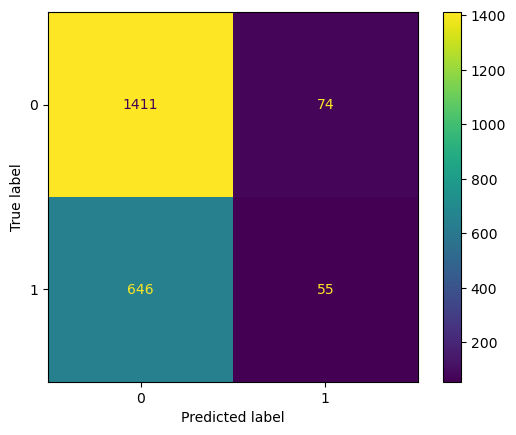

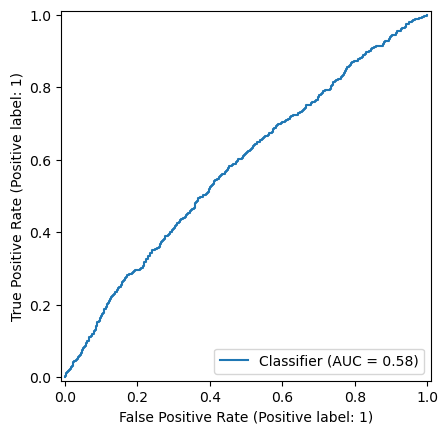

{0: 56, 1: 44} 40
Accuracy = 0.6706312900274474
ROC AUC = 0.5806442936257488
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.96      0.80      1485
           1       0.41      0.06      0.11       701

    accuracy                           0.67      2186
   macro avg       0.55      0.51      0.45      2186
weighted avg       0.60      0.67      0.58      2186

Confusion Matrix:


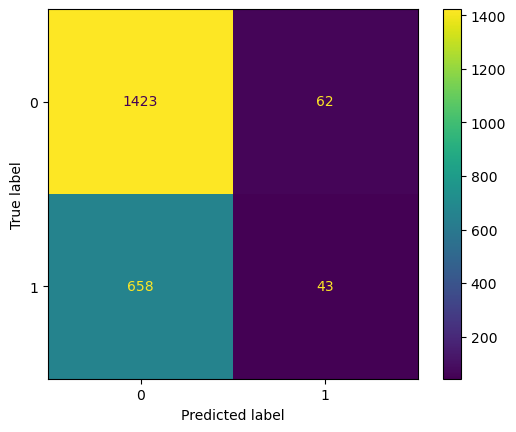

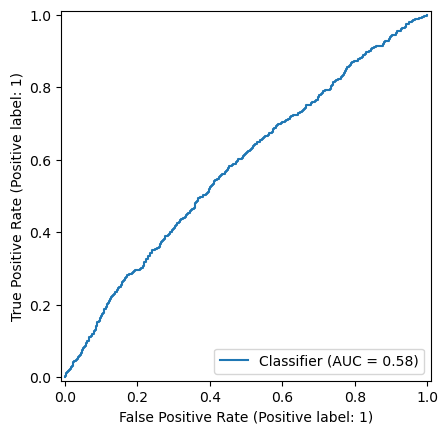

{0: 56, 1: 44} 41
Accuracy = 0.6752058554437328
ROC AUC = 0.5806442936257488
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.97      0.80      1485
           1       0.44      0.05      0.08       701

    accuracy                           0.68      2186
   macro avg       0.56      0.51      0.44      2186
weighted avg       0.60      0.68      0.57      2186

Confusion Matrix:


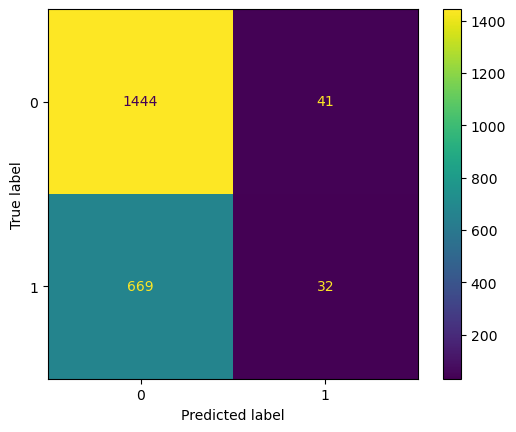

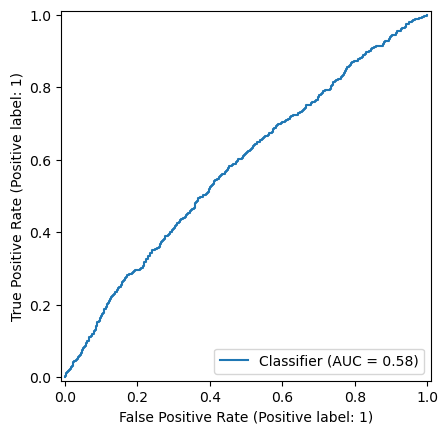

{0: 56, 1: 44} 42
Accuracy = 0.6752058554437328
ROC AUC = 0.5806442936257488
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.98      0.80      1485
           1       0.42      0.03      0.06       701

    accuracy                           0.68      2186
   macro avg       0.55      0.51      0.43      2186
weighted avg       0.60      0.68      0.57      2186

Confusion Matrix:


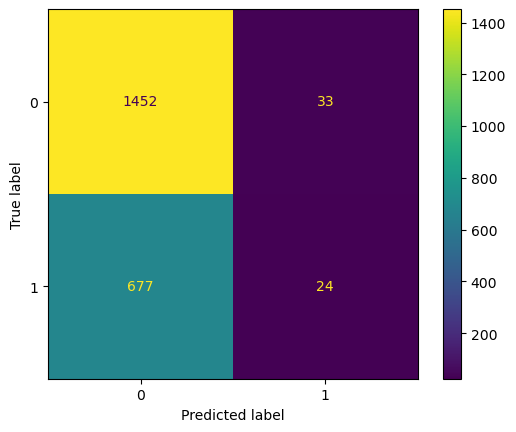

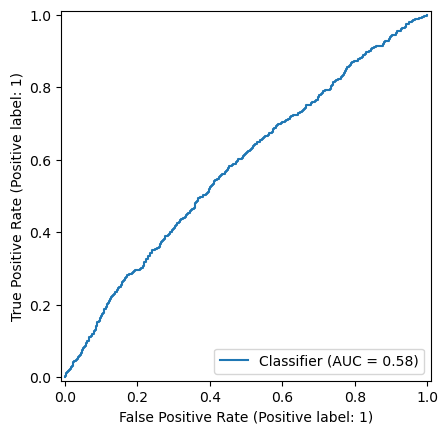

{0: 56, 1: 44} 43
Accuracy = 0.6756633119853613
ROC AUC = 0.5806442936257488
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.98      0.80      1485
           1       0.41      0.03      0.05       701

    accuracy                           0.68      2186
   macro avg       0.55      0.50      0.43      2186
weighted avg       0.60      0.68      0.56      2186

Confusion Matrix:


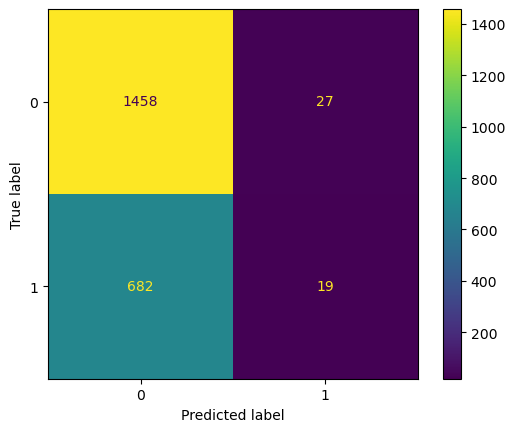

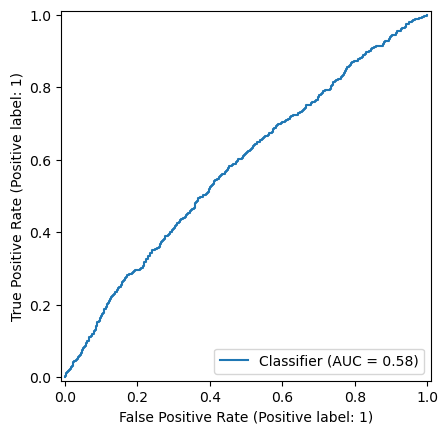

{0: 56, 1: 44} 44
Accuracy = 0.6770356816102471
ROC AUC = 0.5806442936257488
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.99      0.81      1485
           1       0.41      0.02      0.03       701

    accuracy                           0.68      2186
   macro avg       0.55      0.50      0.42      2186
weighted avg       0.60      0.68      0.56      2186

Confusion Matrix:


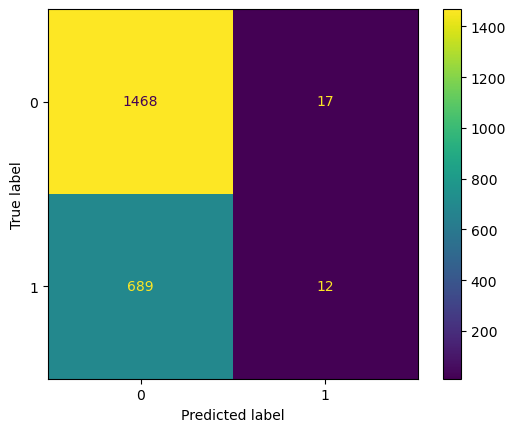

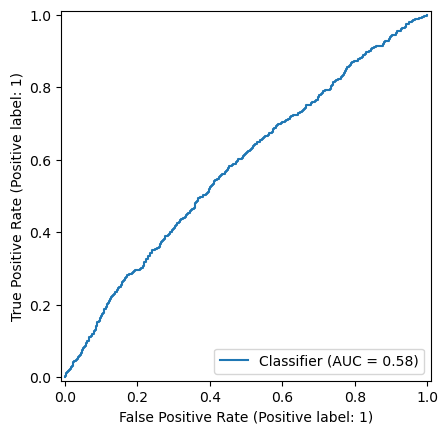

{0: 56, 1: 44} 45
Accuracy = 0.6784080512351327
ROC AUC = 0.5806442936257488
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.99      0.81      1485
           1       0.45      0.01      0.02       701

    accuracy                           0.68      2186
   macro avg       0.57      0.50      0.42      2186
weighted avg       0.61      0.68      0.56      2186

Confusion Matrix:


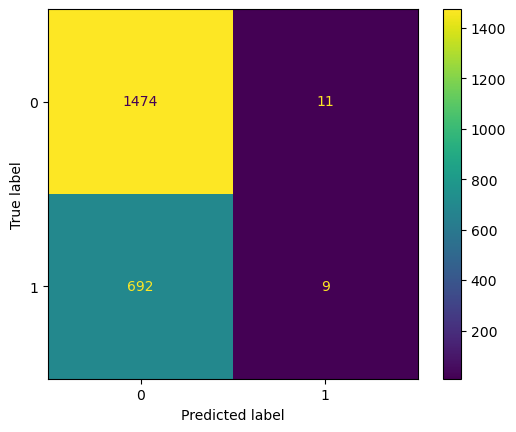

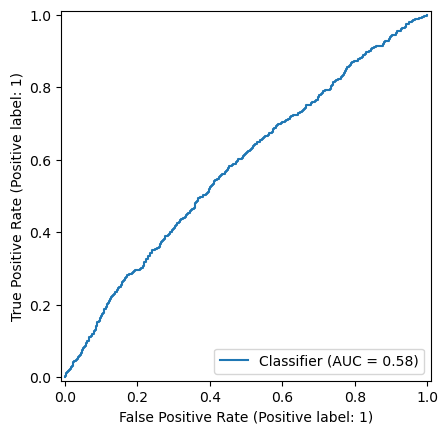

{0: 56, 1: 44} 46
Accuracy = 0.6802378774016469
ROC AUC = 0.5806442936257488
Classification Report:
              precision    recall  f1-score   support

           0       0.68      1.00      0.81      1485
           1       0.56      0.01      0.03       701

    accuracy                           0.68      2186
   macro avg       0.62      0.50      0.42      2186
weighted avg       0.64      0.68      0.56      2186

Confusion Matrix:


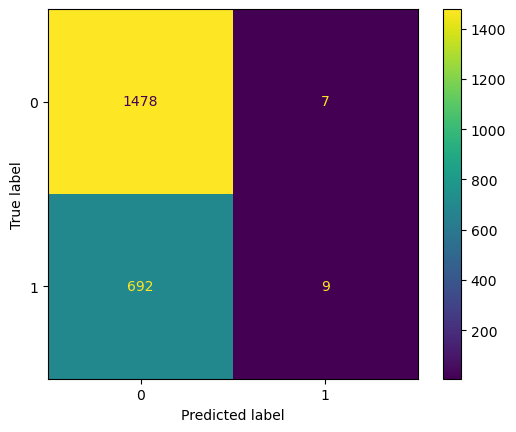

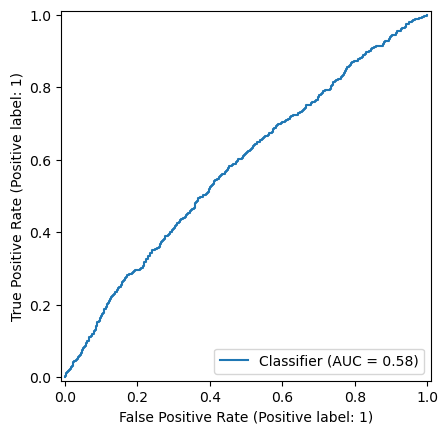

{0: 56, 1: 44} 47
Accuracy = 0.6806953339432754
ROC AUC = 0.5806442936257488
Classification Report:
              precision    recall  f1-score   support

           0       0.68      1.00      0.81      1485
           1       0.67      0.01      0.02       701

    accuracy                           0.68      2186
   macro avg       0.67      0.50      0.41      2186
weighted avg       0.68      0.68      0.56      2186

Confusion Matrix:


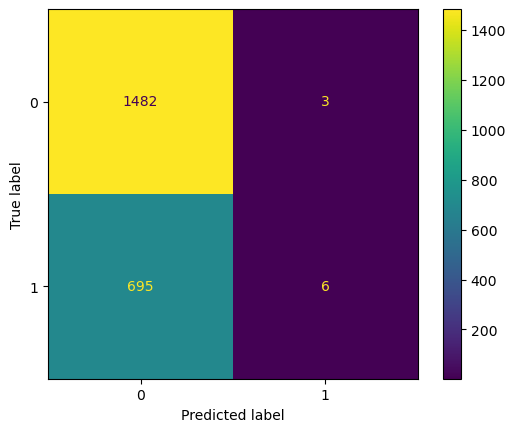

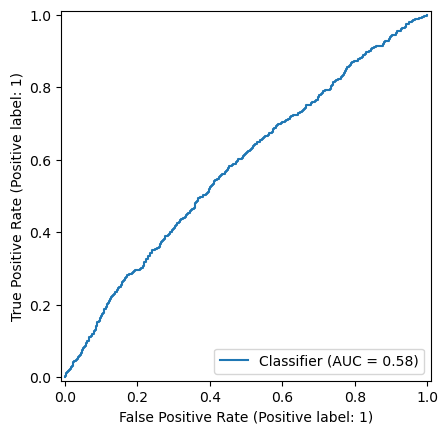

{0: 56, 1: 44} 48
Accuracy = 0.6797804208600183
ROC AUC = 0.5806442936257488
Classification Report:
              precision    recall  f1-score   support

           0       0.68      1.00      0.81      1485
           1       0.57      0.01      0.01       701

    accuracy                           0.68      2186
   macro avg       0.63      0.50      0.41      2186
weighted avg       0.65      0.68      0.55      2186

Confusion Matrix:


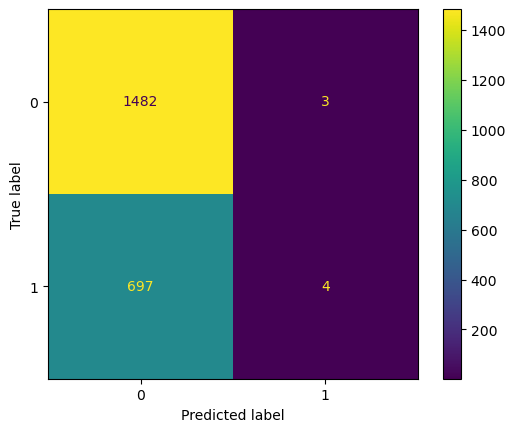

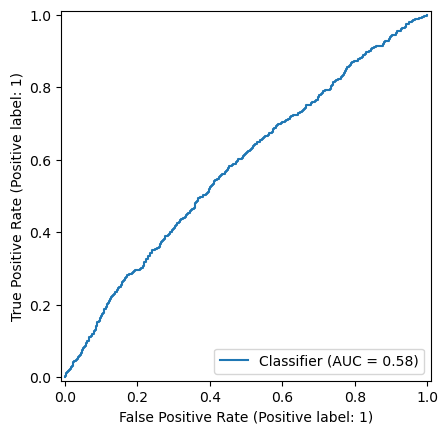

{0: 56, 1: 44} 49
Accuracy = 0.6797804208600183
ROC AUC = 0.5806442936257488
Classification Report:
              precision    recall  f1-score   support

           0       0.68      1.00      0.81      1485
           1       0.67      0.00      0.01       701

    accuracy                           0.68      2186
   macro avg       0.67      0.50      0.41      2186
weighted avg       0.68      0.68      0.55      2186

Confusion Matrix:


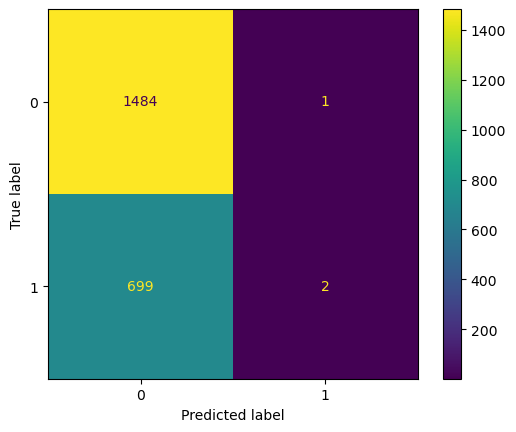

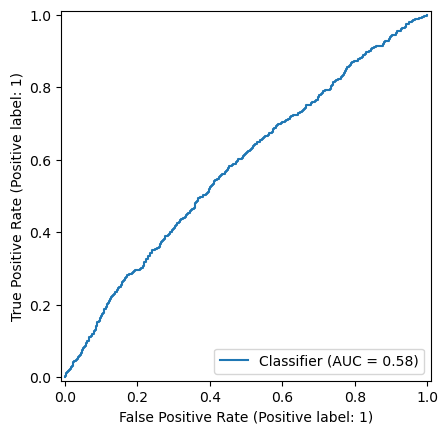

{0: 57, 1: 43} 30
Accuracy = 0.6303751143641354
ROC AUC = 0.5806596636839148
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.78      0.74      1485
           1       0.40      0.30      0.35       701

    accuracy                           0.63      2186
   macro avg       0.55      0.54      0.54      2186
weighted avg       0.61      0.63      0.62      2186

Confusion Matrix:


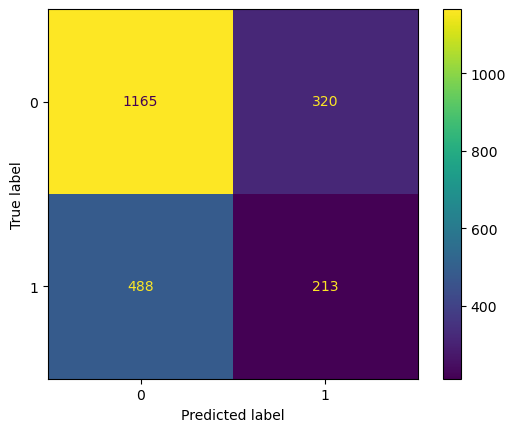

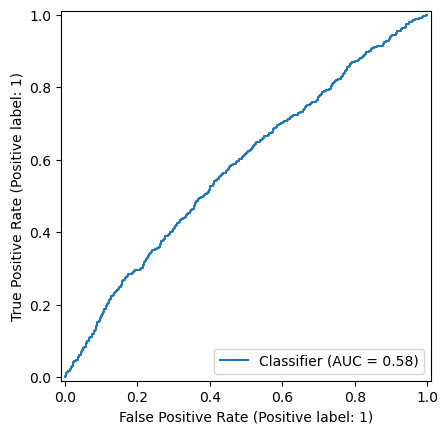

{0: 57, 1: 43} 31
Accuracy = 0.6514181152790485
ROC AUC = 0.5806596636839148
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.83      0.76      1485
           1       0.43      0.28      0.34       701

    accuracy                           0.65      2186
   macro avg       0.57      0.55      0.55      2186
weighted avg       0.62      0.65      0.63      2186

Confusion Matrix:


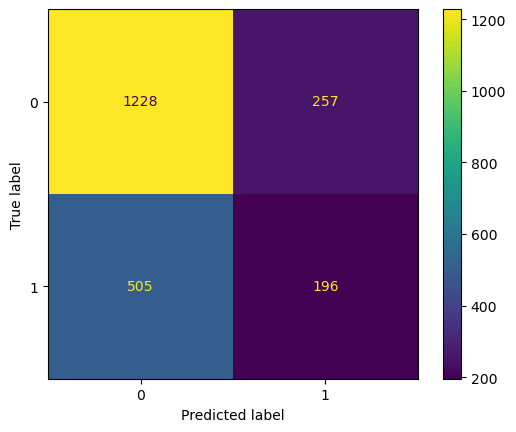

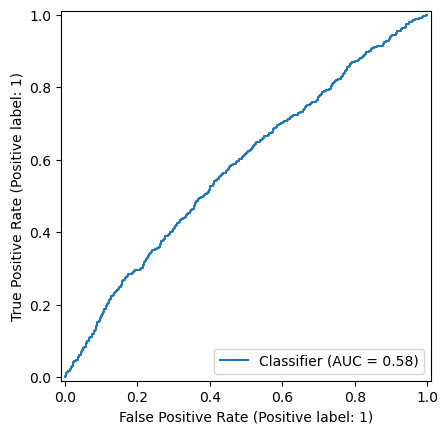

{0: 57, 1: 43} 32
Accuracy = 0.6573650503202195
ROC AUC = 0.5806596636839148
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.85      0.77      1485
           1       0.44      0.24      0.31       701

    accuracy                           0.66      2186
   macro avg       0.57      0.55      0.54      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


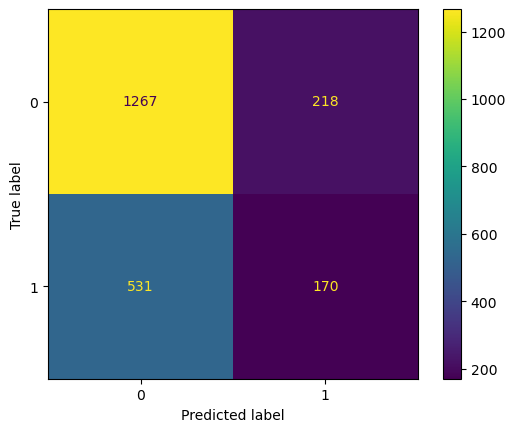

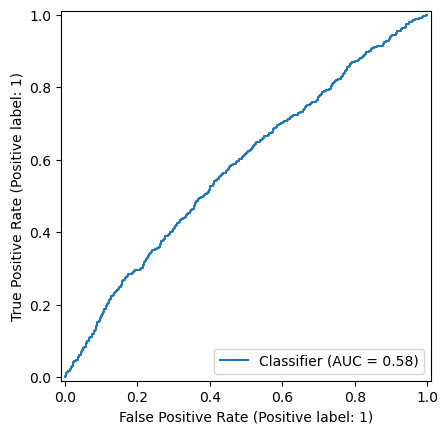

{0: 57, 1: 43} 33
Accuracy = 0.6633119853613907
ROC AUC = 0.5806596636839148
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.88      0.78      1485
           1       0.45      0.21      0.29       701

    accuracy                           0.66      2186
   macro avg       0.57      0.54      0.53      2186
weighted avg       0.62      0.66      0.62      2186

Confusion Matrix:


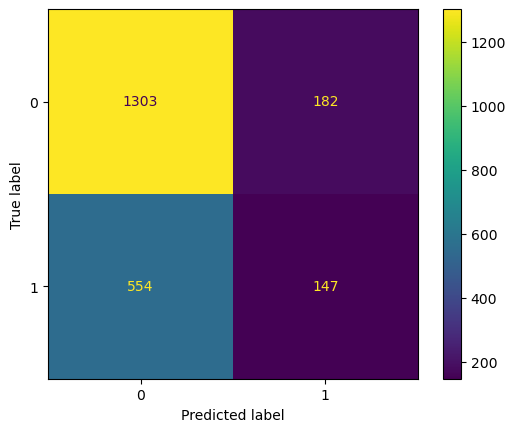

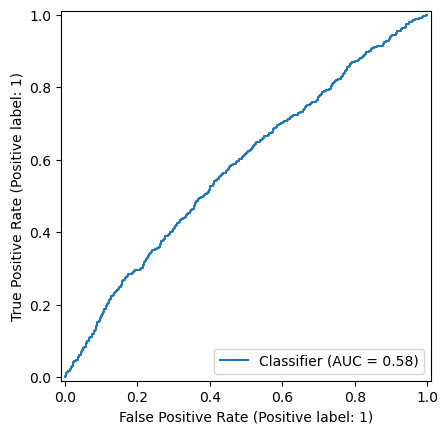

{0: 57, 1: 43} 34
Accuracy = 0.6651418115279049
ROC AUC = 0.5806596636839148
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.90      0.78      1485
           1       0.44      0.17      0.25       701

    accuracy                           0.67      2186
   macro avg       0.57      0.53      0.52      2186
weighted avg       0.61      0.67      0.61      2186

Confusion Matrix:


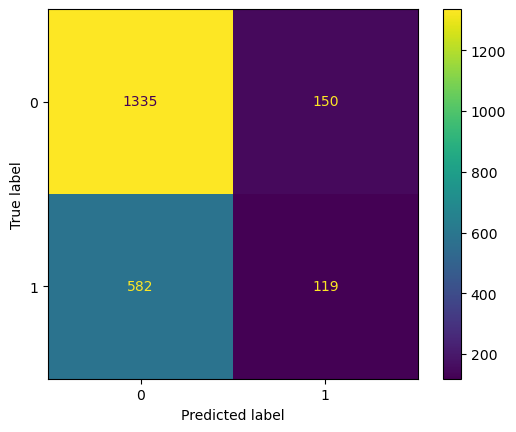

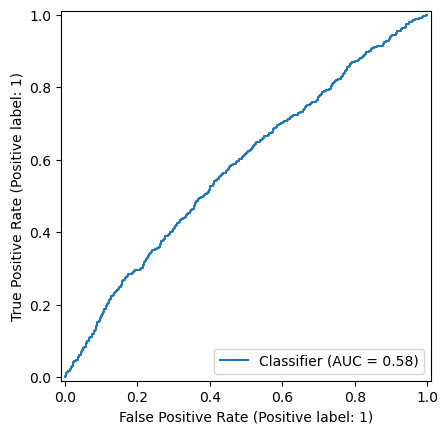

{0: 57, 1: 43} 35
Accuracy = 0.6665141811527905
ROC AUC = 0.5806596636839148
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.91      0.79      1485
           1       0.44      0.15      0.22       701

    accuracy                           0.67      2186
   macro avg       0.57      0.53      0.51      2186
weighted avg       0.61      0.67      0.61      2186

Confusion Matrix:


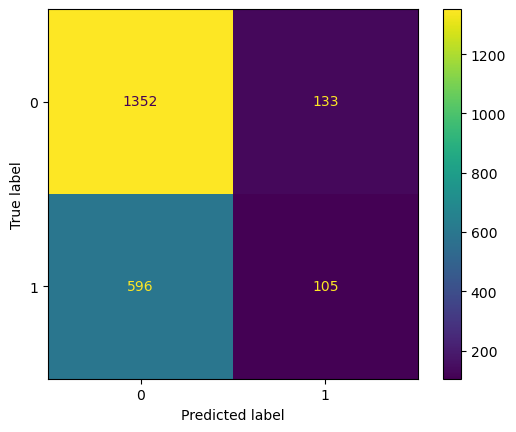

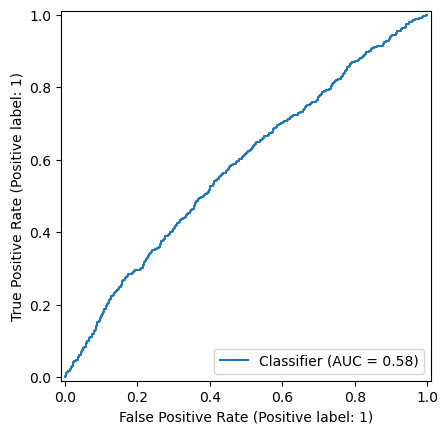

{0: 57, 1: 43} 36
Accuracy = 0.6655992680695334
ROC AUC = 0.5806596636839148
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.93      0.79      1485
           1       0.42      0.11      0.18       701

    accuracy                           0.67      2186
   macro avg       0.55      0.52      0.48      2186
weighted avg       0.60      0.67      0.59      2186

Confusion Matrix:


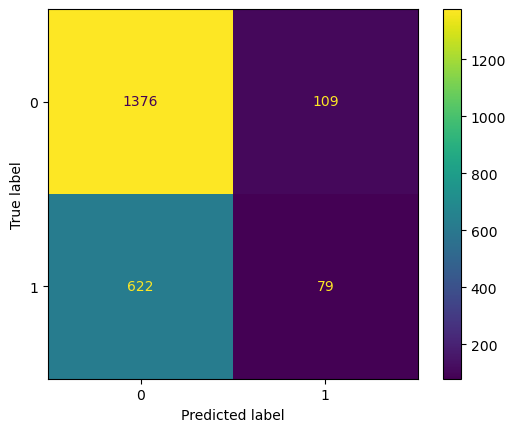

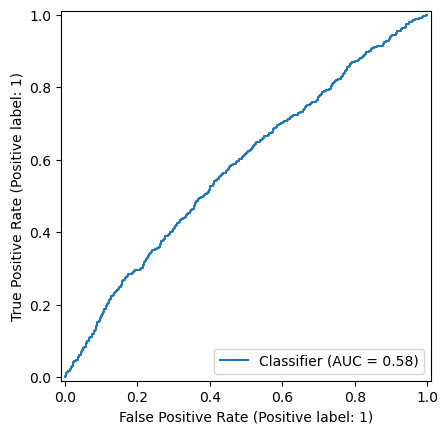

{0: 57, 1: 43} 37
Accuracy = 0.6678865507776761
ROC AUC = 0.5806596636839148
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.94      0.79      1485
           1       0.42      0.09      0.15       701

    accuracy                           0.67      2186
   macro avg       0.55      0.52      0.47      2186
weighted avg       0.60      0.67      0.59      2186

Confusion Matrix:


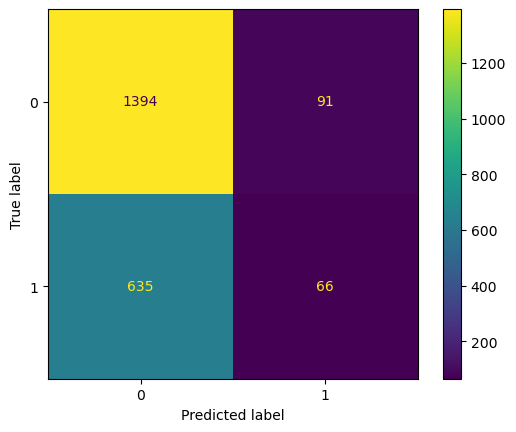

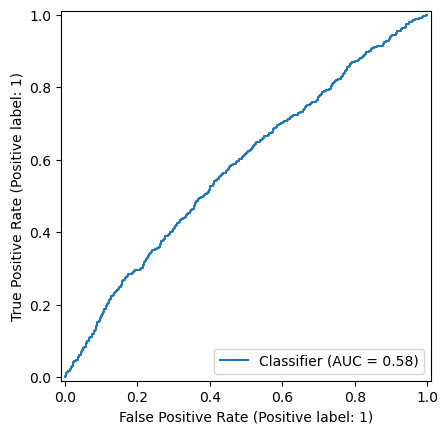

{0: 57, 1: 43} 38
Accuracy = 0.6706312900274474
ROC AUC = 0.5806596636839148
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.95      0.80      1485
           1       0.43      0.08      0.13       701

    accuracy                           0.67      2186
   macro avg       0.56      0.51      0.46      2186
weighted avg       0.60      0.67      0.58      2186

Confusion Matrix:


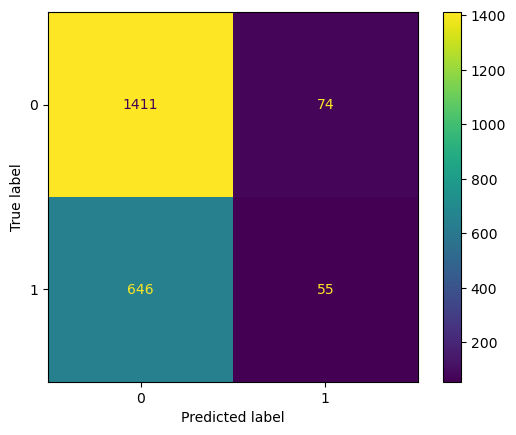

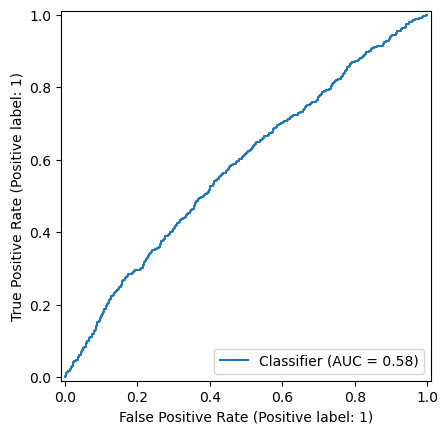

{0: 57, 1: 43} 39
Accuracy = 0.6701738334858188
ROC AUC = 0.5806596636839148
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.96      0.80      1485
           1       0.41      0.06      0.11       701

    accuracy                           0.67      2186
   macro avg       0.54      0.51      0.45      2186
weighted avg       0.59      0.67      0.58      2186

Confusion Matrix:


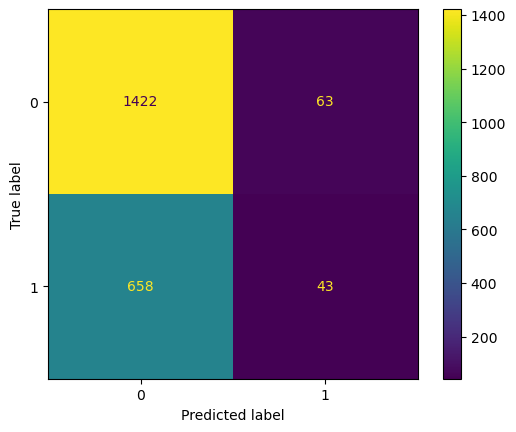

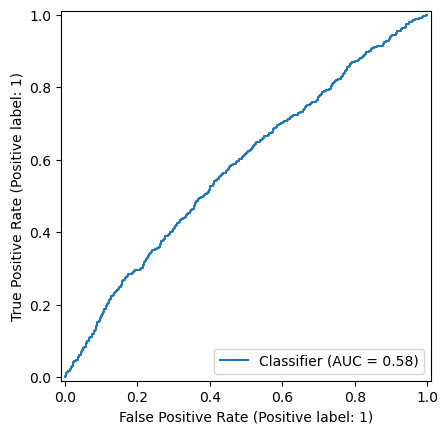

{0: 57, 1: 43} 40
Accuracy = 0.6752058554437328
ROC AUC = 0.5806596636839148
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.97      0.80      1485
           1       0.44      0.05      0.08       701

    accuracy                           0.68      2186
   macro avg       0.56      0.51      0.44      2186
weighted avg       0.60      0.68      0.57      2186

Confusion Matrix:


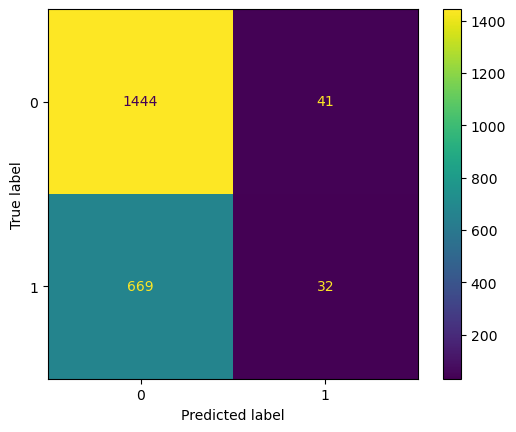

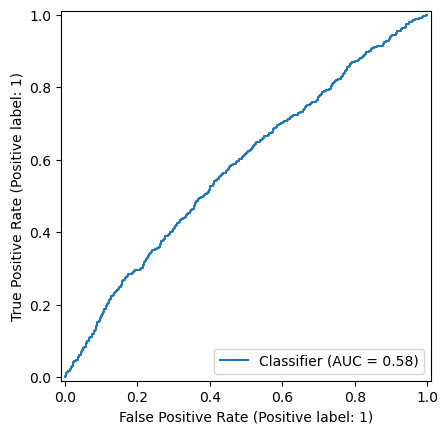

{0: 57, 1: 43} 41
Accuracy = 0.6752058554437328
ROC AUC = 0.5806596636839148
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.98      0.80      1485
           1       0.42      0.04      0.07       701

    accuracy                           0.68      2186
   macro avg       0.55      0.51      0.43      2186
weighted avg       0.60      0.68      0.57      2186

Confusion Matrix:


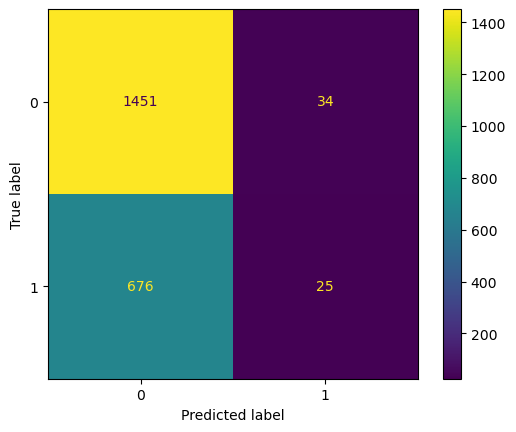

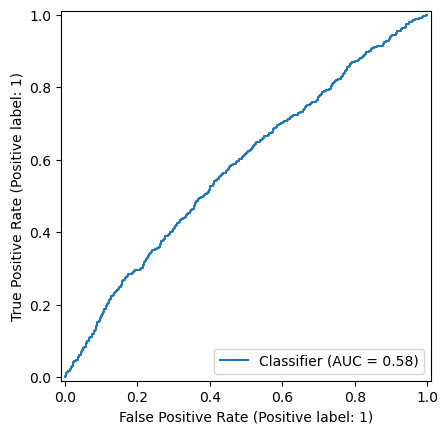

{0: 57, 1: 43} 42
Accuracy = 0.6756633119853613
ROC AUC = 0.5806596636839148
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.98      0.80      1485
           1       0.41      0.03      0.05       701

    accuracy                           0.68      2186
   macro avg       0.55      0.50      0.43      2186
weighted avg       0.60      0.68      0.56      2186

Confusion Matrix:


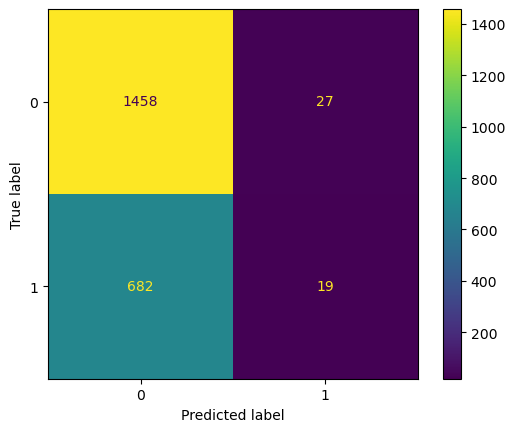

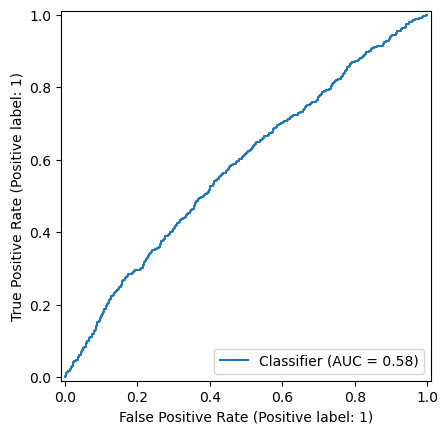

{0: 57, 1: 43} 43
Accuracy = 0.6765782250686185
ROC AUC = 0.5806596636839148
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.99      0.81      1485
           1       0.41      0.02      0.04       701

    accuracy                           0.68      2186
   macro avg       0.54      0.50      0.42      2186
weighted avg       0.59      0.68      0.56      2186

Confusion Matrix:


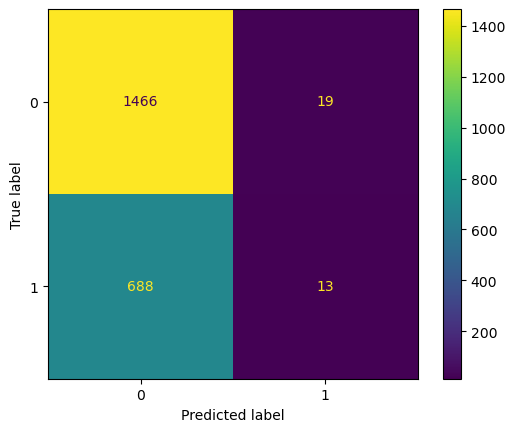

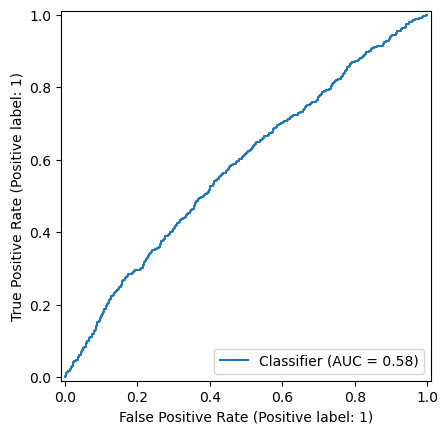

{0: 57, 1: 43} 44
Accuracy = 0.6784080512351327
ROC AUC = 0.5806596636839148
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.99      0.81      1485
           1       0.45      0.01      0.02       701

    accuracy                           0.68      2186
   macro avg       0.57      0.50      0.42      2186
weighted avg       0.61      0.68      0.56      2186

Confusion Matrix:


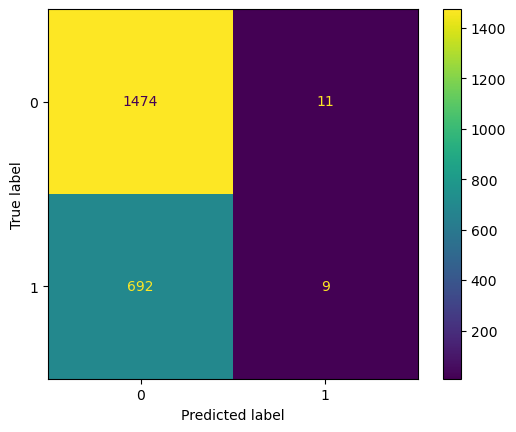

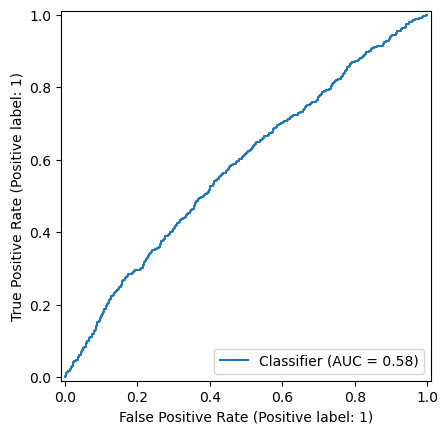

{0: 57, 1: 43} 45
Accuracy = 0.6802378774016469
ROC AUC = 0.5806596636839148
Classification Report:
              precision    recall  f1-score   support

           0       0.68      1.00      0.81      1485
           1       0.56      0.01      0.03       701

    accuracy                           0.68      2186
   macro avg       0.62      0.50      0.42      2186
weighted avg       0.64      0.68      0.56      2186

Confusion Matrix:


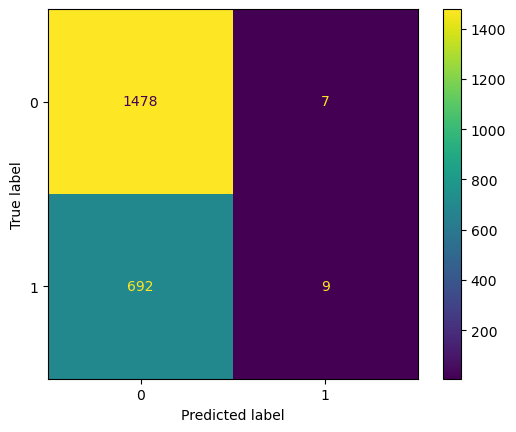

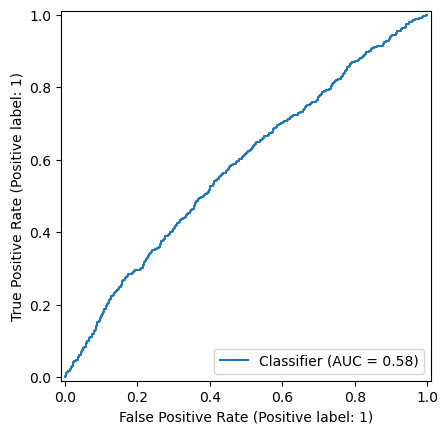

{0: 57, 1: 43} 46
Accuracy = 0.6806953339432754
ROC AUC = 0.5806596636839148
Classification Report:
              precision    recall  f1-score   support

           0       0.68      1.00      0.81      1485
           1       0.67      0.01      0.02       701

    accuracy                           0.68      2186
   macro avg       0.67      0.50      0.41      2186
weighted avg       0.68      0.68      0.56      2186

Confusion Matrix:


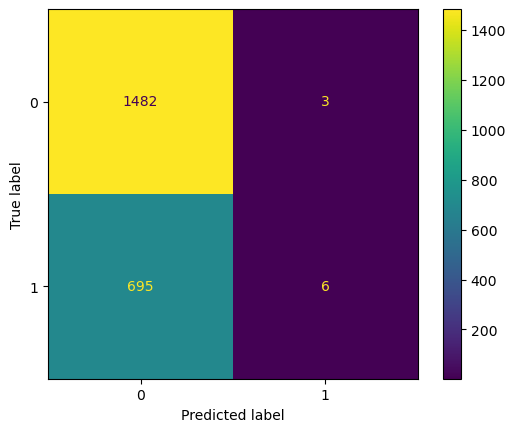

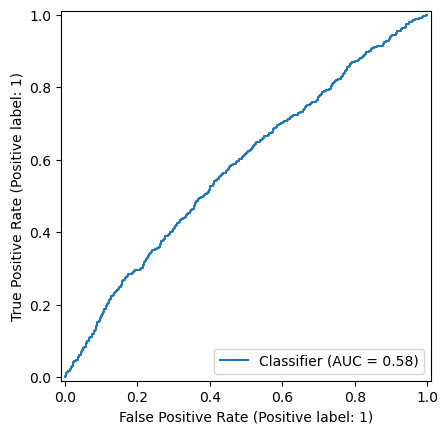

{0: 57, 1: 43} 47
Accuracy = 0.6797804208600183
ROC AUC = 0.5806596636839148
Classification Report:
              precision    recall  f1-score   support

           0       0.68      1.00      0.81      1485
           1       0.57      0.01      0.01       701

    accuracy                           0.68      2186
   macro avg       0.63      0.50      0.41      2186
weighted avg       0.65      0.68      0.55      2186

Confusion Matrix:


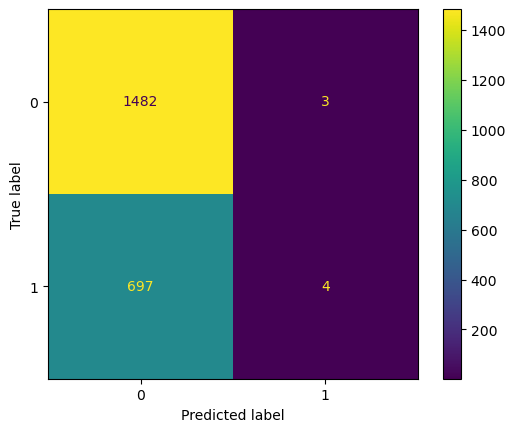

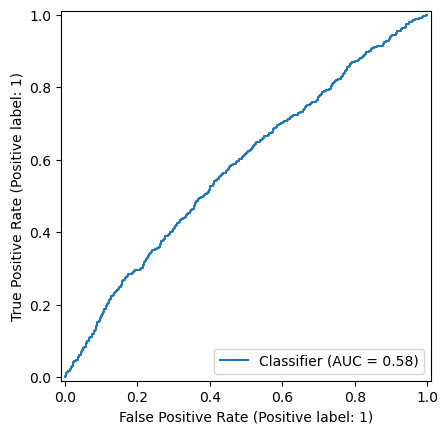

{0: 57, 1: 43} 48
Accuracy = 0.6797804208600183
ROC AUC = 0.5806596636839148
Classification Report:
              precision    recall  f1-score   support

           0       0.68      1.00      0.81      1485
           1       0.67      0.00      0.01       701

    accuracy                           0.68      2186
   macro avg       0.67      0.50      0.41      2186
weighted avg       0.68      0.68      0.55      2186

Confusion Matrix:


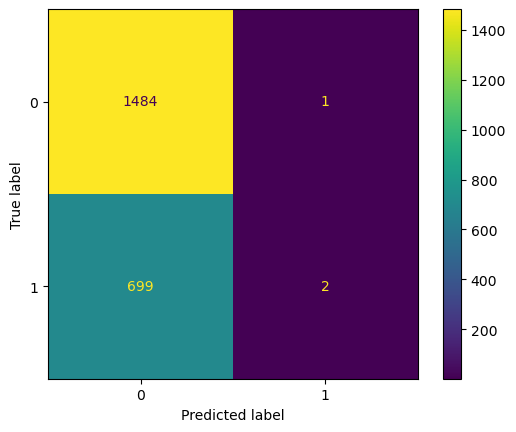

KeyboardInterrupt: 

In [19]:
X = data.drop(columns=['AmbulanceR_No', 'BikeInjury'])
y = data['AmbulanceR_No']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

for weights in class_weights:
    log_reg = LogisticRegression(max_iter=10000, class_weight=weights)
    for threshold in range(30, 50):
        log_reg.fit(X_train, y_train)
        y_prob = log_reg.predict_proba(X_test)
        y_pred = 1 * (y_prob[:, 1] >= threshold / 100)

        print(str(weights) + ' ' + str(threshold))
        print('Accuracy = ' + str(accuracy_score(y_test, y_pred)))
        print('ROC AUC = ' + str(roc_auc_score(y_test, y_prob[:, 1])))
        print('Classification Report:')
        print(classification_report(y_test, y_pred))
        print('Confusion Matrix:')
        ConfusionMatrixDisplay.from_predictions(y_test, y_pred)
        RocCurveDisplay.from_predictions(y_test, y_prob[:, 1])
        plt.show()

c:\Users\xgr6vm\.conda\envs\erdos_spring_2025\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
c:\Users\xgr6vm\.conda\envs\erdos_spring_2025\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
c:\Users\xgr6vm\.conda\envs\erdos_spring_2025\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
c:\Users\xgr6vm\.conda\envs\erdos_spring_2025\Lib\site-packages\sklearn\l

Accuracy = 0.4281793229643184
ROC AUC = 0.5806596636839148
Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.24      0.36      1485
           1       0.34      0.83      0.48       701

    accuracy                           0.43      2186
   macro avg       0.54      0.53      0.42      2186
weighted avg       0.62      0.43      0.40      2186

Confusion Matrix:


c:\Users\xgr6vm\.conda\envs\erdos_spring_2025\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


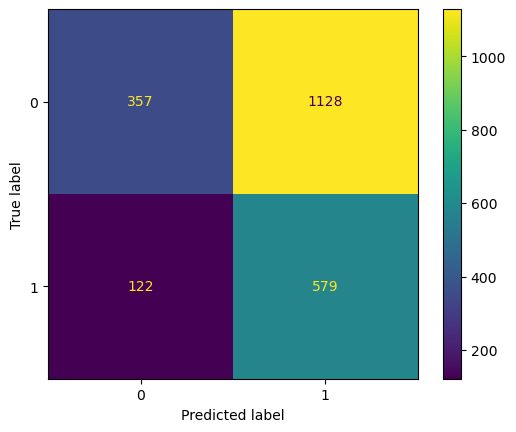

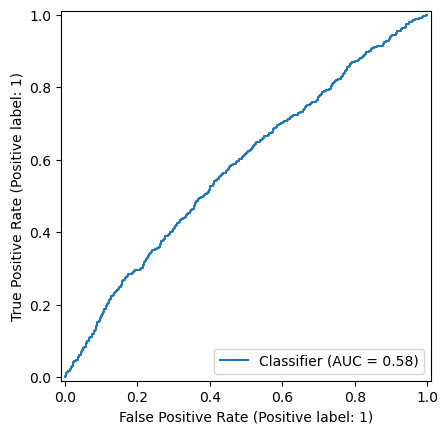

In [21]:
X = data.drop(columns=['AmbulanceR_No', 'BikeInjury'])
y = data['AmbulanceR_No']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

grid_cv = GridSearchCV(LogisticRegressionThreshold(), 
                          param_grid = {'threshold': [threshold / 100 for threshold in list(range(30, 50))], 
                                        'max_iter': [1000],
                                        'class_weight': class_weights}, 
                          scoring = 'f1', 
                          cv = 5)

grid_cv.fit(X_train, y_train)
y_pred = grid_cv.best_estimator_.predict(X_test)

print('Accuracy = ' + str(accuracy_score(y_test, y_pred)))
print('ROC AUC = ' + str(roc_auc_score(y_test, y_prob[:, 1])))
print('Classification Report:')
print(classification_report(y_test, y_pred))
print('Confusion Matrix:')
ConfusionMatrixDisplay.from_predictions(y_test, y_pred)
RocCurveDisplay.from_predictions(y_test, y_prob[:, 1])
plt.show()

In [ ]:
X = data.drop(columns=['AmbulanceR_Yes', 'BikeInjury'])
y = data['AmbulanceR_Yes']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

log_reg = LogisticRegression(max_iter=10000, class_weight={0: 51, 1: 49})

grid_cv.fit(X_train, y_train)
y_pred = grid_cv.best_estimator_.predict(X_test)

print('Accuracy = ' + str(accuracy_score(y_test, y_pred)))
print('Classification Report:')
print(classification_report(y_test, y_pred))
print('Confusion Matrix:')
ConfusionMatrixDisplay.from_predictions(y_test, y_pred)
plt.show()